# TFM — Modelado mediante Machine Learning

## Sistema explicable de detección preventiva de indicadores de riesgo en salud mental adulta mediante aprendizaje automático multisalida y agentes de inteligencia artificial generativa a partir del dataset NSDUH 2024

**Autor:** Carlos Ayllón Motto  
**Máster:** Big Data, Data Science e Inteligencia Artificial  
**Dataset:** National Survey on Drug Use and Health 2024  
**Fuente:** SAMHSA  
**Población de análisis:** personas adultas de 18 años o más

---

Este notebook desarrolla la fase de modelado mediante técnicas clásicas de Machine Learning a partir de la base premodelado cerrada en el análisis exploratorio. El proceso parte de una única partición TRAIN/TEST reproducible y mantiene el conjunto TEST reservado para la evaluación comparativa final, evitando utilizarlo en la selección de variables, modelos, hiperparámetros o umbrales.

A lo largo del notebook se construirá el conjunto de predictores principales validado en el EDA, se definirá un preprocesamiento sin fuga de información y se realizará una reducción y selección de variables utilizando exclusivamente TRAIN. Posteriormente se establecerán modelos de referencia y se compararán Regresión Logística, Random Forest y XGBoost para cada una de las cuatro variables objetivo.

La fase queda limitada al desarrollo y selección interna de candidatos de Machine Learning. El modelado mediante Deep Learning, la evaluación definitiva sobre TEST, la comparación conjunta ML/DL, el análisis SHAP, los análisis de sensibilidad y la capa de agentes de inteligencia artificial generativa se desarrollarán en notebooks posteriores.

# 0. Preparación y validación de la entrada

El modelado parte de la base premodelado generada y validada al cierre del EDA. En esta fase no se reabre la selección conceptual realizada anteriormente, sino que se comprueba que los datos y los roles transferidos mantienen la estructura esperada antes de realizar cualquier partición o transformación aprendida.

El conjunto de las variables de entrada se construirá exclusivamente a partir de las variables clasificadas como `Predictor principal`. El identificador, las variables objetivo, sus indicadores de imputación, las variables del diseño muestral y las variables reservadas para sensibilidad permanecerán fuera del modelado principal.

Antes de continuar se verificarán las rutas, la disponibilidad de los archivos de entrada, la integridad de la base premodelado y la relación entre sus columnas y la tabla de roles. Ninguna decisión de preprocesamiento, selección o modelado se realizará hasta cerrar estas comprobaciones.

## 0.1. Importación de librerías

Se importan las librerías necesarias para la gestión de datos, visualización, preprocesamiento y posterior modelado mediante Machine Learning, manteniendo una misma configuración durante todo el notebook.

También se centralizan las rutas de los archivos procedentes del EDA y de las salidas generadas durante esta fase. Las tablas y figuras se almacenarán en carpetas propias de `02_modelado_ml`, mientras que los modelos seleccionados se conservarán dentro de `models/02_modelado_ml`.

In [1]:
# =============================================================================
# IMPORTACIÓN DE LIBRERÍAS
# =============================================================================
import hashlib
import pickle
import platform
import warnings
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from importlib.metadata import version
from IPython.display import display
from joblib import cpu_count
from scipy.stats import chi2_contingency
from time import perf_counter

from sklearn.experimental import enable_iterative_imputer
from sklearn.exceptions import ConvergenceWarning
from sklearn import set_config
from sklearn.base import clone
from sklearn.compose import ColumnTransformer
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, StackingClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, average_precision_score, balanced_accuracy_score, confusion_matrix,
    f1_score, make_scorer, precision_score, recall_score, roc_auc_score, precision_recall_curve
)
from sklearn.model_selection import (
    GridSearchCV, StratifiedKFold, cross_validate, train_test_split
)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, RobustScaler
from sklearn.tree import DecisionTreeClassifier

from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline

from xgboost import XGBClassifier

## 0.2. Configuración general y rutas

In [2]:
# =============================================================================
# CONFIGURACIÓN GENERAL Y RUTAS
# =============================================================================
semilla = 12345
np.random.seed(semilla)

set_config(display='diagram')

usar_gpu_xgb = True
verbose_grid = 1
forzar_reentrenamiento_ml = False
encoding_csv = 'utf-8-sig'

# -----------------------------------------------------------------------------
# ENTORNO
# -----------------------------------------------------------------------------
lib_auditadas = [
    'numpy', 'pandas', 'matplotlib', 'seaborn', 'scikit-learn', 'imbalanced-learn', 'xgboost'
]

versiones_libs = {paquete: version(paquete) for paquete in lib_auditadas}

versiones_esperadas_ml = {
    'Python': '3.11.15',
    'NumPy': '2.4.6',
    'pandas': '3.0.5',
    'Matplotlib': '3.11.1',
    'Seaborn': '0.13.2',
    'scikit-learn': '1.9.0',
    'imbalanced-learn': '0.14.2',
    'XGBoost': '3.2.0'
}

versiones_detectadas_ml = {
    'Python': platform.python_version(),
    'NumPy': versiones_libs['numpy'],
    'pandas': versiones_libs['pandas'],
    'Matplotlib': versiones_libs['matplotlib'],
    'Seaborn': versiones_libs['seaborn'],
    'scikit-learn': versiones_libs['scikit-learn'],
    'imbalanced-learn': versiones_libs['imbalanced-learn'],
    'XGBoost': versiones_libs['xgboost']
}

tabla_versiones_ml = pd.DataFrame([
    {
        'Biblioteca': biblio,
        'Versión': version_detectada,
        'Esperada': versiones_esperadas_ml[biblio],
        'Estado': 'OK' if version_detectada == versiones_esperadas_ml[biblio] else 'REVISAR'
    }
    for biblio, version_detectada in versiones_detectadas_ml.items()
])

print('\nVERSIONES DEL ENTORNO')
display(tabla_versiones_ml)

version_sklearn = tuple(map(int, versiones_libs['scikit-learn'].split('.')[:2]))
if version_sklearn < (1, 8):
    raise RuntimeError(
        'Se requiere scikit-learn >= 1.8 para utilizar l1_ratio con esta configuración.'
    )

# -----------------------------------------------------------------------------
# WARNINGS
# -----------------------------------------------------------------------------
# Warnings conocidos y auditados durante la validación cruzada

warnings.filterwarnings(
    'once', message=r'Found unknown categories.*during transform.*',
    category=UserWarning, module=r'sklearn\.preprocessing\._encoders'
)

warnings.filterwarnings(
    'ignore', message=r'\[IterativeImputer\] Early stopping criterion not reached\.',
    category=ConvergenceWarning
)

warnings.filterwarnings(
    'ignore', message=r'.*mismatched devices.*', category=UserWarning
)

warnings.filterwarnings(
    'ignore', message=r'Persisting input arguments took .*', category=UserWarning
)

# -----------------------------------------------------------------------------
# RUTAS
# -----------------------------------------------------------------------------
version_grid_inicial = 'v_grid_inicial'
version_grid_ajuste_fino = 'v_grid_ajuste_fino_hiperparametros'
version_grid_bagging = 'v_grid_bagging'
version_grid_stacking = 'v_grid_stacking'
version_grid_stack_fino = 'v_grid_stack_fino'
version_probs_base = 'v_probabilidades_base'

ruta_proyecto = Path.home() / 'BD' / 'TFM_NSDUH'

ruta_interim = ruta_proyecto / 'data' / 'interim'
ruta_tablas_eda = ruta_proyecto / 'results' / 'tables' / '01_datos_eda'
ruta_tablas = ruta_proyecto / 'results' / 'tables' / '02_modelado_ml'
ruta_figuras = ruta_proyecto / 'results' / 'figures' / '02_modelado_ml'
ruta_modelos = ruta_proyecto / 'models' / '02_modelado_ml'
ruta_cache_grid = ruta_proyecto / '.cache' / 'grid_ml'

# Entradas
ruta_base = ruta_interim / 'NSDUH_2024_adultos_premodelado.parquet'
ruta_roles = ruta_tablas_eda / '28_roles_base_premodelado.csv'
ruta_entrega = ruta_tablas_eda / '36_resumen_entrega_modelado.csv'
ruta_estructura_predictores = ruta_tablas_eda / '27_estructura_predictores.csv'
ruta_revision_numericas = ruta_tablas_eda / '29_revision_variables_numericas.csv'
ruta_numericas = ruta_tablas_eda / '30_resumen_numericas_validas.csv'

# Salidas reutilizadas
ruta_split = ruta_interim / 'NSDUH_2024_asignacion_train_test.csv'

nombre_grid_inicial = '44_grid_inicial_modelos'
nombre_grid_ajuste_fino = '47_grid_ajuste_fino_finalistas'
nombre_grid_bagging = '51_grid_bagging_arbol'
nombre_grid_stacking = '56_comparacion_stacking'
nombre_probs_base = '58_probabilidades_modelos_base_stacking_cv'
nombre_grid_stack_fino = '59_grid_stacking_fino'

ruta_grid_inicial = ruta_tablas / f'{nombre_grid_inicial}.csv'
ruta_grid_ajuste_fino = ruta_tablas / f'{nombre_grid_ajuste_fino}.csv'
ruta_grid_bagging = ruta_tablas / f'{nombre_grid_bagging}.csv'
ruta_grid_stacking = ruta_tablas / f'{nombre_grid_stacking}.csv'
ruta_grid_stack_fino = ruta_tablas / f'{nombre_grid_stack_fino}.csv'
ruta_probs_base = ruta_tablas / f'{nombre_probs_base}.csv'

ruta_pickle_ml = ruta_modelos / 'modelos_ml_finales.pkl'

for ruta in [ruta_interim, ruta_tablas, ruta_figuras, ruta_modelos, ruta_cache_grid]:
    ruta.mkdir(parents=True, exist_ok=True)

for ruta in [
    ruta_base, ruta_roles, ruta_entrega, ruta_estructura_predictores,
    ruta_revision_numericas, ruta_numericas
]:
    if not ruta.is_file():
        raise FileNotFoundError(f'No se encuentra el archivo:\n{ruta}')


VERSIONES DEL ENTORNO


,Biblioteca,Versión,Esperada,Estado
0,Python,3.11.15,3.11.15,OK
1,NumPy,2.4.6,2.4.6,OK
2,pandas,3.0.5,3.0.5,OK
3,Matplotlib,3.11.1,3.11.1,OK
4,Seaborn,0.13.2,0.13.2,OK
5,scikit-learn,1.9.0,1.9.0,OK
6,imbalanced-learn,0.14.2,0.14.2,OK
7,XGBoost,3.2.0,3.2.0,OK


## 0.3. Diccionarios y etiquetas

In [3]:
# =============================================================================
# DICCIONARIOS Y ETIQUETAS
# =============================================================================
targets = [
    'IRAMDEYR',
    'IRSUICTHNK',
    'IRSUIPLANYR',
    'IRSUITRYYR'
]

titulos_targets = {
    'IRAMDEYR': 'Episodio depresivo mayor',
    'IRSUICTHNK': 'Ideación suicida',
    'IRSUIPLANYR': 'Planificación suicida',
    'IRSUITRYYR': 'Intento suicida'
}

colores_modelos = {
    'Modelo de referencia': 'lightgray',
    'Regresión Logística': 'lightcoral',
    'Árbol de Decisión': 'khaki',
    'Random Forest': 'mediumseagreen',
    'XGBoost': 'gold',
    'Bagging Árbol': 'seagreen',
    'Stacking RL+XGB': 'mediumpurple',
    'Stacking RL+XGB+Bagging': 'plum',
}

cmap_secuencial = 'YlOrRd'

# -----------------------------------------------------------------------------
# RENOMBRADO COMÚN DE TABLAS
# -----------------------------------------------------------------------------
renombrado_comun_ml = {
    # Identificación y presentación general
    'target': 'Variable objetivo',
    'objetivo': 'Descripción',
    'descripcion': 'Descripción',
    'modelo': 'Modelo',
    'modelo_seleccionado': 'Modelo seleccionado',
    'candidato': 'Candidato',
    'parametros': 'Parámetros',
    'variable': 'Variable',
    'variable_original': 'Variable original',
    'tipo_variable': 'Tipo de variable',
    'tipo_representacion': 'Tipo de representación',
    'rol_base': 'Rol',
    'modulo': 'Módulo',
    'nombre': 'Nombre',
    'concepto': 'Concepto',
    'criterio': 'Criterio',
    'grupo': 'Grupo',
    'categoria': 'Categoría',
    'elemento': 'Elemento',
    'elementos': 'Elementos',
    'estado': 'Estado',
    'motivo': 'Motivo',
    'metrica': 'Métrica',
    'valor': 'Valor',
    'score': 'Score',
    'comprobacion': 'Comprobación',
    'resultado': 'Resultado',
    'revision': 'Revisión',
    'posicion': 'Posición',
    # Partición, muestra y variables objetivo
    'particion': 'Partición',
    'registros': 'Registros',
    'positivos': 'Positivos',
    'negativos': 'Negativos',
    'prevalencia_pct': 'Prevalencia (%)',
    'prevalencia_train_pct': 'Prevalencia TRAIN (%)',
    'prevalencia_test_pct': 'Prevalencia TEST (%)',
    'diferencia_pp': 'Diferencia (pp)',
    'positivos_total': 'Positivos total',
    'positivos_train': 'Positivos TRAIN',
    'positivos_test': 'Positivos TEST',
    'prev_total_pct': 'Prevalencia total (%)',
    'prev_train_pct': 'Prevalencia TRAIN (%)',
    'prev_test_pct': 'Prevalencia TEST (%)',
    'presente_train': 'Presente en TRAIN',
    'presente_test': 'Presente en TEST',
    'train': 'TRAIN',
    'test': 'TEST',
    'valores': 'Valores',
    'patron': 'Patrón',
    'frecuencia': 'Frecuencia',
    'porcentaje': 'Porcentaje (%)',
    # Estructura y dimensiones
    'n_variables': 'Variables',
    'variables': 'Variables',
    'variables_originales': 'Variables originales',
    'variables_numericas': 'Variables numéricas',
    'variables_categoricas': 'Variables categóricas',
    'variables_estado': 'Variables de estado',
    'variables_entrada': 'Variables de entrada',
    'columnas_entrada': 'Variables de entrada',
    'columnas_salida': 'Columnas transformadas',
    'columnas_transformadas': 'Columnas transformadas',
    'n_categorias': 'Número de categorías',
    # Ausencias, repetición y variables numéricas
    'mediana_unicos': 'Mediana de valores únicos',
    'mediana_valores_unicos': 'Mediana de valores únicos',
    'mediana_nan': 'Mediana de valores físicamente ausentes (%)',
    'mediana_nan_pct': 'Mediana de valores físicamente ausentes (%)',
    'max_nan_pct': 'Máximo de valores físicamente ausentes (%)',
    'n_nan': 'Valores físicamente ausentes',
    'pct_nan': 'Valores físicamente ausentes (%)',
    'n_nan_train': 'Valores físicamente ausentes TRAIN',
    'pct_nan_train': 'Valores físicamente ausentes TRAIN (%)',
    'n_nan_original': 'Valores físicamente ausentes originales',
    'n_nan_fisicos': 'Valores físicamente ausentes',
    'variables_con_nan': 'Variables con valores físicamente ausentes',
    'n_observados_train': 'Valores físicamente presentes TRAIN',
    'pct_dominante': 'Valor dominante (%)',
    'mediana_dominante': 'Mediana del valor dominante (%)',
    'mediana_valor_frecuente': 'Mediana del valor más frecuente (%)',
    'umbral_pct': 'Umbral (%)',
    'valor_mas_frecuente': 'Valor más frecuente',
    'freq_valor_mas_frecuente': 'Frecuencia del valor más frecuente',
    'freq_resto': 'Frecuencia del resto de valores',
    'pct_valor_mas_frecuente': 'Valor más frecuente (%)',
    'pct_ausencia_documental': 'Ausencia documental (%)',
    'tipos_ausencia': 'Tipos de ausencia',
    'n_ausencia_documental': 'Registros con ausencia documental',
    'rango_documentado': 'Rango documentado',
    'n_validos_train': 'Valores válidos TRAIN',
    'pct_validos_train': 'Valores válidos TRAIN (%)',
    'n_fuera_rango': 'Valores fuera de rango',
    'n_codigos_especiales': 'Códigos especiales',
    'n_valores_valid': 'Valores válidos',
    'pct_valores_valid': 'Valores válidos (%)',
    'n_valores_valid_unicos': 'Valores válidos únicos',
    'codigos_especiales': 'Códigos especiales',
    'tipos_fuera_rango': 'Tipos fuera de rango',
    # Variables categóricas
    'mediana_categorias': 'Mediana de categorías',
    'max_categorias': 'Máximo de categorías',
    'variables_con_categoria_menor_50': 'Variables con categoría < 50 registros',
    'n_categorias_train': 'Categorías TRAIN',
    'freq_categoria_menor': 'Frecuencia de la categoría menos frecuente',
    'pct_categoria_menor': 'Categoría menos frecuente (%)',
    'categorias_menor_10': 'Categorías < 10 registros',
    'categorias_menor_50': 'Categorías < 50 registros',
    'categorias_menor_100': 'Categorías < 100 registros',
    'categorias_train': 'Categorías TRAIN',
    'dummies_estimadas': 'Columnas One-Hot estimadas',
    # Relaciones numéricas
    'n_comunes': 'Observaciones comunes',
    'correlacion_spearman': 'Correlación de Spearman',
    'correlacion_absoluta': 'Correlación absoluta',
    # Selección de variables
    'percentil_f': 'Percentil f_classif',
    'percentil_l1': 'Percentil RL L1',
    'percentil_rf': 'Percentil Random Forest',
    'puntuacion_conjunta': 'Puntuación conjunta',
    'metodos_top10pct': 'Métodos en top 10 %',
    'puntuacion_media': 'Puntuación media',
    'puntuacion_max': 'Puntuación máxima',
    'targets_2_metodos': 'Variables objetivo con ≥ 2 métodos',
    'targets_3_metodos': 'Variables objetivo con 3 métodos',
    'targets_puntuacion_090': 'Variables objetivo con puntuación ≥ 0,90',
    'targets_puntuacion_095': 'Variables objetivo con puntuación ≥ 0,95',
    'variables_2_metodos': 'Variables con ≥ 2 métodos',
    'variables_3_metodos': 'Variables con 3 métodos',
    'variables_puntuacion_090': 'Variables con puntuación ≥ 0,90',
    'variables_puntuacion_095': 'Variables con puntuación ≥ 0,95',
    'pct_sobre_813': 'Porcentaje sobre 813 (%)',
    'n_numericas': 'Variables numéricas',
    'n_categoricas': 'Variables categóricas',
    'pct_del_tipo': 'Porcentaje del tipo (%)',
    'variables_top10pct': 'Variables en top 10 %',
    'disponibles': 'Disponibles',
    'seleccionadas': 'Seleccionadas',
    'pct_seleccionado': 'Seleccionado (%)',
    'variables_f': 'Variables f_classif',
    'variables_l1': 'Variables RL L1',
    'variables_rf': 'Variables Random Forest',
    'variables_regla_final': 'Variables que cumplen la regla',
    'targets_f': 'Variables objetivo f_classif',
    'targets_l1': 'Variables objetivo RL L1',
    'targets_rf': 'Variables objetivo Random Forest',
    'targets_regla_final': 'Variables objetivo que cumplen la regla',
    'targets_regla_detalle': 'Detalle de variables objetivo',
    # Relaciones categóricas
    'variable_1': 'Variable 1',
    'variable_2': 'Variable 2',
    'nombre_1': 'Nombre 1',
    'nombre_2': 'Nombre 2',
    'tipo_relacion': 'Tipo de relación',
    'relacion': 'Relación',
    'v_cramer': 'V de Cramér',
    'parejas': 'Parejas',
    'n_categorias_1': 'Categorías variable 1',
    'n_categorias_2': 'Categorías variable 2',
    'targets_regla_final_1': 'Variables objetivo V1',
    'targets_regla_final_2': 'Variables objetivo V2',
    'puntuacion_max_1': 'Puntuación máxima V1',
    'puntuacion_max_2': 'Puntuación máxima V2',
    'variable_eliminada': 'Variable eliminada',
    'nombre_eliminada': 'Nombre variable eliminada',
    'variable_conservada': 'Variable conservada',
    'nombre_conservada': 'Nombre variable conservada',
    # Validación y métricas de modelos
    'fold': 'Fold',
    'accuracy': 'Accuracy',
    'accuracy_std': 'Accuracy std',
    'accuracy_train': 'Accuracy TRAIN',
    'average_precision': 'Average Precision',
    'average_precision_std': 'Average Precision std',
    'average_precision_train': 'Average Precision TRAIN',
    'roc_auc': 'ROC-AUC',
    'roc_auc_std': 'ROC-AUC std',
    'roc_auc_train': 'ROC-AUC TRAIN',
    'recall': 'Recall',
    'recall_std': 'Recall std',
    'recall_min': 'Recall mínimo',
    'precision': 'Precision',
    'precision_std': 'Precision std',
    'f1': 'F1',
    'f1_std': 'F1 std',
    'f2': 'F2',
    'f2_std': 'F2 std',
    'balanced_accuracy': 'Balanced Accuracy',
    'balanced_accuracy_std': 'Balanced Accuracy std',
    'specificity': 'Especificidad',
    'fit_time_s': 'Tiempo de ajuste (s)',
    'gap_accuracy': 'Diferencia Accuracy',
    'gap_average_precision': 'Diferencia Average Precision',
    'gap_roc_auc': 'Diferencia ROC-AUC',
    'mean_test_average_precision': 'Average Precision CV',
    'std_test_average_precision': 'Average Precision CV std',
    'mean_test_roc_auc': 'ROC-AUC CV',
    'std_test_roc_auc': 'ROC-AUC CV std',
    'mean_test_recall': 'Recall CV',
    'std_test_recall': 'Recall CV std',
    'mean_test_precision': 'Precision CV',
    'std_test_precision': 'Precision CV std',
    'mean_test_f1': 'F1 CV',
    'std_test_f1': 'F1 CV std',
    'mean_test_f2': 'F2 CV',
    'std_test_f2': 'F2 CV std',
    'mean_test_balanced_accuracy': 'Balanced Accuracy CV',
    'std_test_balanced_accuracy': 'Balanced Accuracy CV std',
    'mean_test_specificity': 'Especificidad CV',
    'std_test_specificity': 'Especificidad CV std',
    'mean_test_accuracy': 'Accuracy CV',
    'std_test_accuracy': 'Accuracy CV std',
    'y_true': 'Clase real',
    'y_pred': 'Clase predicha',
    'y_score': 'Probabilidad',
    'configuraciones': 'Configuraciones',
    'estrategia': 'Estrategia',
    'ranking_final': 'Ranking final',
    'referencia_individual': 'Referencia individual',
    # Hiperparámetros visibles
    'param_modelo__n_estimators': 'n_estimators',
    'param_modelo__max_samples': 'max_samples',
    'param_modelo__max_features': 'max_features',
    'param_modelo__final_estimator__C': 'C metamodelo',
}

# -----------------------------------------------------------------------------
# COLUMNAS COMUNES DE PRESENTACIÓN
# -----------------------------------------------------------------------------
columnas_candidatos_grid = [
    'objetivo', 'modelo', 'candidato', 'parametros', 'mean_test_average_precision',
    'mean_test_roc_auc', 'mean_test_recall', 'mean_test_balanced_accuracy',
    'gap_average_precision', 'gap_roc_auc'
]

columnas_configuracion_modelos = [
    'target', 'modelo', 'parametros', 'gap_average_precision', 'gap_roc_auc'
]
# -----------------------------------------------------------------------------
# ETIQUETAS PARA GRÁFICAS
# -----------------------------------------------------------------------------
nombres_vars = {}

descrip_vars_reser = {
    **titulos_targets,
    'IIAMDEYR': 'Indicador de imputación de depresión',
    'IISUICTHNK': 'Indicador de imputación de ideación',
    'IISUIPLANYR': 'Indicador de imputación de planificación',
    'IISUITRYYR': 'Indicador de imputación de intento',
    'ANALWT2_C': 'Peso muestral final',
    'VESTR_C': 'Estrato de varianza',
    'VEREP': 'Unidad primaria de muestreo',
    'QUESTID2': 'Identificador del participante'
}

## 0.4. Funciones auxiliares

Se definen las funciones generales que seguirán siendo útiles durante el modelado: guardado de tablas y figuras, etiquetado de gráficos de barras y construcción del preprocesamiento común mediante `Pipeline` y `ColumnTransformer`.

Las funciones específicas de evaluación, selección o comparación de modelos se incorporarán cuando sean necesarias, evitando mantener código sin una aplicación directa.

In [4]:
# -----------------------------------------------------------------------------
# GUARDADO Y ETIQUETAS
# -----------------------------------------------------------------------------
def guardar_csv(df, nombre, **kwargs):
    if not isinstance(df, pd.DataFrame):
        raise TypeError('El objeto debe ser un DataFrame.')
    if not str(nombre).lower().endswith('.csv'):
        nombre = f'{nombre}.csv'

    kwargs.setdefault('index', False)
    kwargs.setdefault('encoding', encoding_csv)
    ruta = ruta_tablas / nombre
    df.to_csv(ruta, **kwargs)

    return ruta


def guardar_figura(fig, nombre, dpi=300, rect=None):
    ruta = ruta_figuras / f'{nombre}.png'

    if rect is None:
        fig.tight_layout()
    else:
        fig.tight_layout(rect=rect)

    fig.savefig(ruta, dpi=dpi, bbox_inches='tight', facecolor='white')
    display(fig)
    plt.close(fig)

    return ruta


def nombre_variable(variable):
    return nombres_vars.get(variable, variable)


def preparar_tabla(df, columnas=None, redondeo=None):
    tabla = df.copy()

    if columnas is not None:
        tabla = tabla[columnas]

    if redondeo is not None:
        tabla = tabla.round(redondeo)

    return tabla.rename(columns=renombrado_comun_ml)


def mostrar_tabla_completa(df):
    with pd.option_context(
        'display.max_rows', None,
        'display.max_columns', None,
        'display.max_colwidth', None,
        'display.width', None
    ):
        display(df)


# -----------------------------------------------------------------------------
# RESULTADOS DE GRIDSEARCHCV
# -----------------------------------------------------------------------------
def preparar_resultados_grid(df):
    salida = df.copy()

    salida['gap_roc_auc'] = salida['mean_train_roc_auc'] - salida['mean_test_roc_auc']

    salida['gap_average_precision'] = (
        salida['mean_train_average_precision'] - salida['mean_test_average_precision']
    )

    return salida


def resumir_parametros(fila):
    modelo = fila['modelo']

    if modelo == 'Regresión Logística':
        ratio = fila.get('param_modelo__l1_ratio', 1.0)
        penalizacion = 'L1' if float(ratio) == 1.0 else 'L2'

        return (f"C={fila['param_modelo__C']}, {penalizacion}")

    if modelo == 'Random Forest':
        return (
            f"criterion={fila['param_modelo__criterion']}, "
            f"depth={int(fila['param_modelo__max_depth'])}, "
            f"leaf={int(fila['param_modelo__min_samples_leaf'])}, "
            f"n={int(fila['param_modelo__n_estimators'])}, "
            f"features={fila['param_modelo__max_features']}"
        )

    if modelo == 'XGBoost':
        return (
            f"lr={fila['param_modelo__learning_rate']}, "
            f"depth={int(fila['param_modelo__max_depth'])}, "
            f"n={int(fila['param_modelo__n_estimators'])}, "
            f"sub={fila['param_modelo__subsample']}, "
            f"col={fila['param_modelo__colsample_bytree']}"
        )

    if modelo == 'Bagging Árbol':
        return (
            f"n={int(fila['param_modelo__n_estimators'])}, "
            f"samples={fila['param_modelo__max_samples']}, "
            f"features={fila['param_modelo__max_features']}"
        )

    if modelo.startswith('Stacking'):
        ratio = float(fila['param_modelo__final_estimator__l1_ratio'])
        penalizacion = 'L1' if np.isclose(ratio, 1.0) else 'L2'
        return (
            f"meta: C={fila['param_modelo__final_estimator__C']}, "
            f"{penalizacion}"
        )

    return ''


def seleccionar_candidatos(df, n=3):
    salida = df.sort_values(
        ['target', 'modelo', 'ranking_medio', 'gap_roc_auc', 'gap_average_precision']
    ).groupby(['target', 'modelo'], as_index=False).head(n).copy()

    salida['candidato'] = 'C' + salida.groupby(
        ['target', 'modelo']
    ).cumcount().add(1).astype(str)

    return salida


def guardar_checkpoint_grid(resultados, nombre):
    """
    Une, depura y guarda los resultados disponibles de GridSearchCV.
    """
    if not resultados:
        return pd.DataFrame()

    grid = pd.concat(resultados, ignore_index=True)

    cols_params = [col for col in grid.columns if col.startswith('param_modelo__')]

    grid = grid.drop_duplicates(
        subset=['target', 'modelo'] + cols_params
    ).reset_index(drop=True)

    _ = guardar_csv(grid, nombre)

    return grid


def recuperar_grid(ruta, version, targets=None, modelos=None):
    """
    Recupera resultados guardados de GridSearchCV y comprueba su estado.
    """
    ruta = Path(ruta)

    if not ruta.is_file():
        print('No existen resultados previos de la rejilla.')
        return pd.DataFrame(), set()

    grid = pd.read_csv(ruta, encoding=encoding_csv)

    if 'version_grid' not in grid.columns:
        print('El archivo existente no contiene versión de la rejilla.')
        return pd.DataFrame(), set()

    grid = grid[grid['version_grid'] == version].copy()

    if grid.empty:
        print(f'No existen resultados para la versión {version}.')
        return pd.DataFrame(), set()

    cols_params = [col for col in grid.columns if col.startswith('param_modelo__')]

    grid = grid.drop_duplicates(
        subset=['target', 'modelo'] + cols_params
    ).reset_index(drop=True)

    for columna in cols_params:
        n_validos = grid[columna].notna().sum()
        valores = pd.to_numeric(grid[columna], errors='coerce')

        if valores.notna().sum() == n_validos:
            grid[columna] = valores

    completados = set(zip(grid['target'], grid['modelo']))

    print(f'Versión recuperada: {version}')
    print(f'Configuraciones disponibles: {len(grid):,}')

    if targets is not None and modelos is not None:
        esperadas = {(target, modelo) for target in targets for modelo in modelos}

        faltantes = esperadas - completados

        if faltantes:
            print('Combinaciones pendientes:')
            for target, modelo in sorted(faltantes):
                print(f'  {target} — {modelo}')
        else:
            print('Rejilla completa.')

    return grid, completados


# -----------------------------------------------------------------------------
# MÉTRICAS Y GRÁFICOS
# -----------------------------------------------------------------------------
def ranking_metricas(df, grupos, metricas, prefijo='pos', nombre='ranking_medio'):
    salida = df.copy()
    columnas_rank = []

    for alias, metrica in metricas.items():
        columna = f'{prefijo}_{alias}'

        salida[columna] = salida.groupby(grupos)[metrica].rank(method='min', ascending=False)

        columnas_rank.append(columna)

    salida[nombre] = salida[columnas_rank].mean(axis=1)

    return salida


def metricas_binarias(y_true, y_pred, y_score):
    """
    Calcula las métricas comunes de clasificación binaria.
    """
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()

    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'roc_auc': roc_auc_score(y_true, y_score),
        'average_precision': average_precision_score(y_true, y_score),
        'recall': recall_score(y_true, y_pred, zero_division=0),
        'precision': precision_score(y_true, y_pred, zero_division=0),
        'f1': f1_score(y_true, y_pred, zero_division=0),
        'balanced_accuracy': balanced_accuracy_score(y_true, y_pred),
        'specificity': tn / (tn + fp),
        'tn': tn, 'fp': fp, 'fn': fn, 'tp': tp
    }


def etiquetar_barras(ax, decimales=1, porcentaje=False, padding=3, fontsize=9,
                     ocultar_ceros=False):
    sufijo = ' %' if porcentaje else ''

    for container in ax.containers:
        etiquetas = [
            '' if ocultar_ceros and valor == 0 else f'{valor:.{decimales}f}{sufijo}'
            for valor in container.datavalues
        ]

        ax.bar_label(container, labels=etiquetas, padding=padding, fontsize=fontsize)


def matriz_correlacion(matriz, titulo, nombre, xlabel='', ylabel='', triangular=False,
                       figsize=(8, 6), rotacion_x=0, rotacion_y=0, tam_etiqueta=10, annot=True):
    """
    Representa y guarda una matriz de correlación.
    """
    if not isinstance(matriz, pd.DataFrame):
        raise TypeError('La matriz debe ser un DataFrame.')
    if triangular and matriz.shape[0] != matriz.shape[1]:
        raise ValueError('La máscara triangular requiere una matriz cuadrada.')

    mascara = np.triu(np.ones_like(matriz, dtype=bool), k=1) if triangular else None

    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(
        matriz, annot=annot, fmt='.3f', cmap='coolwarm', vmin=-1, vmax=1, center=0,
        mask=mascara, linewidths=0.5, linecolor='white', square=True,
        cbar_kws={'label': 'Coeficiente', 'shrink': 0.85}, ax=ax
    )

    ax.set_title(titulo, weight='bold')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.tick_params(axis='x', labelrotation=rotacion_x, labelsize=tam_etiqueta)
    ax.tick_params(axis='y', labelrotation=rotacion_y, labelsize=tam_etiqueta)

    if rotacion_x:
        plt.setp(ax.get_xticklabels(), ha='right', rotation_mode='anchor')

    _ = guardar_figura(fig, nombre)


def heatmaps_grid(df, modelo, targets, titulos, fila, columna, metricas, titulo, nombre):
    """
    Representa heatmaps para varias variables objetivo y métricas del GridSearchCV.
    """
    n_filas = len(metricas)
    n_cols = len(targets)

    fig, axes = plt.subplots(n_filas, n_cols, figsize=(4.7 * n_cols, 4.2 * n_filas), squeeze=False)

    for i, (metrica, titulo_met) in enumerate(metricas):
        for j, target in enumerate(targets):
            ax = axes[i, j]

            datos = df[(df['target'] == target) & (df['modelo'] == modelo)]

            matriz = datos.pivot_table(index=fila, columns=columna, values=metrica, aggfunc='max')

            sns.heatmap(
                matriz, annot=True, fmt='.3f', cmap=cmap_secuencial, linewidths=0.5,
                linecolor='white', cbar=False, ax=ax
            )

            ax.set_title(f'{titulos[target]}\n{titulo_met}', weight='bold')
            ax.set_xlabel(columna.replace('param_modelo__', ''))
            ax.set_ylabel(fila.replace('param_modelo__', ''))

    fig.suptitle(titulo, fontsize=15, weight='bold')

    _ = guardar_figura(fig, nombre, rect=(0, 0, 1, 0.95))


def boxplots_grid(candidatos, modelo, targets, titulos, metricas, titulo, nombre):
    """
    Compara por fold las configuraciones candidatas de cada variable objetivo.
    """
    fig, axes = plt.subplots(
        len(metricas), len(targets), figsize=(4.8 * len(targets), 3.5 * len(metricas)),
        squeeze=False
    )

    for j, target in enumerate(targets):
        datos_target = candidatos[
            (candidatos['target'] == target) & (candidatos['modelo'] == modelo)
        ].copy()

        orden = datos_target['candidato'].tolist()

        for i, (metrica, titulo_met) in enumerate(metricas):
            ax = axes[i, j]

            cols_split = [
                c for c in datos_target.columns
                if c.startswith('split') and c.endswith(f'_test_{metrica}')
            ]

            datos_plot = datos_target[['candidato'] + cols_split].melt(
                id_vars='candidato', var_name='fold', value_name='score'
            )

            color_modelo = colores_modelos.get(modelo, 'lightgray')

            sns.boxplot(
                data=datos_plot, x='candidato', y='score', order=orden, color=color_modelo, ax=ax
            )

            sns.stripplot(
                data=datos_plot, x='candidato', y='score', order=orden, color='dimgray',
                size=3, alpha=0.6, ax=ax
            )

            ax.set_title(f'{titulos[target]}\n{titulo_met}', weight='bold')
            ax.set_xlabel('Configuración')
            ax.set_ylabel(titulo_met)

    fig.suptitle(titulo, fontsize=15, weight='bold')

    _ = guardar_figura(fig, nombre, rect=(0, 0, 1, 0.96))


def boxplots_modelos(resultados, targets, titulos, metricas, titulo, nombre, orden_modelos=None):
    """
    Compara por fold las configuraciones seleccionadas de varios modelos.
    """
    fig, axes = plt.subplots(
        len(metricas), len(targets), figsize=(4.8 * len(targets), 3.5 * len(metricas)),
        squeeze=False
    )

    for j, target in enumerate(targets):
        datos_target = resultados[resultados['target'] == target].copy()

        orden = orden_modelos if orden_modelos is not None else datos_target['modelo'].tolist()

        for i, (metrica, titulo_met) in enumerate(metricas):
            ax = axes[i, j]

            cols_split = [
                c for c in datos_target.columns
                if c.startswith('split') and c.endswith(f'_test_{metrica}')
            ]

            datos_plot = datos_target[['modelo'] + cols_split].melt(
                id_vars='modelo', var_name='fold', value_name='score'
            )

            sns.boxplot(
                data=datos_plot, x='modelo', y='score', order=orden, hue='modelo',
                palette=colores_modelos, dodge=False, legend=False, ax=ax
            )

            sns.stripplot(
                data=datos_plot, x='modelo', y='score', order=orden, color='dimgray',
                size=3, alpha=0.6, ax=ax
            )

            ax.set_title(f'{titulos[target]}\n{titulo_met}', weight='bold')
            ax.set_xlabel('')
            ax.set_ylabel(titulo_met)
            ax.tick_params(axis='x', rotation=20)

    fig.suptitle(titulo, fontsize=15, weight='bold')

    _ = guardar_figura(fig, nombre, rect=(0, 0, 1, 0.96))


def boxplots_cv_modelos(resultados, targets, titulos, metricas, orden_modelos, titulo, nombre):
    """
    Compara modelos mediante las distribuciones obtenidas por fold.
    """
    fig, axes = plt.subplots(
        len(metricas), len(targets), figsize=(4.8 * len(targets), 3.5 * len(metricas)),
        squeeze=False
    )

    for j, target in enumerate(targets):
        datos_target = resultados[resultados['target'] == target]

        for i, (metrica, titulo_met) in enumerate(metricas):
            ax = axes[i, j]

            sns.boxplot(
                data=datos_target, x='modelo', y=metrica, order=orden_modelos, hue='modelo',
                palette=colores_modelos, legend=False, ax=ax
            )

            sns.stripplot(
                data=datos_target, x='modelo', y=metrica, order=orden_modelos, color='dimgray',
                size=3, alpha=0.6, ax=ax
            )

            ax.set_title(f'{titulos[target]}\n{titulo_met}', weight='bold')

            ax.set_xlabel('')
            ax.set_ylabel(titulo_met)
            ax.tick_params(axis='x', rotation=22)

    fig.suptitle(titulo, fontsize=15, weight='bold')

    _ = guardar_figura(fig, nombre, rect=(0, 0, 1, 0.96))


def matrices_confusion_cv(datos, targets, grupos, titulos, columna_grupo, titulo, nombre):
    """
    Compara matrices construidas con predicciones de validación cruzada.
    """
    fig, axes = plt.subplots(
        len(targets), len(grupos), figsize=(5 * len(grupos), 4 * len(targets)), squeeze=False
    )

    for i, target in enumerate(targets):
        for j, grupo in enumerate(grupos):
            ax = axes[i, j]

            df_plot = datos[(datos['target'] == target) & (datos[columna_grupo] == grupo)]

            matriz = confusion_matrix(df_plot['y_true'], df_plot['y_pred'], labels=[0, 1])

            sns.heatmap(
                matriz, annot=True, fmt='d', cmap=cmap_secuencial, cbar=False, linewidths=0.5,
                linecolor='white', ax=ax
            )

            ax.set_title(f'{titulos[target]}\n{grupo}', weight='bold')

            ax.set_xlabel('Predicción')
            ax.set_ylabel('Real')
            ax.set_xticklabels(['0', '1'])
            ax.set_yticklabels(['0', '1'], rotation=0)

    fig.suptitle(titulo, fontsize=15, weight='bold')

    _ = guardar_figura(fig, nombre, rect=(0, 0, 1, 0.96))


def grafico_metricas_cv(resumen, targets, titulos, metricas, orden_modelos, titulo, nombre):
    """
    Compara visualmente las métricas medias de varios modelos.
    """
    fig, axes = plt.subplots(2, 2, figsize=(17, 11))
    axes = axes.ravel()

    for ax, target in zip(axes, targets):
        datos = resumen[resumen['target'] == target].copy()

        datos = datos.melt(
            id_vars='modelo', value_vars=[m for m, _ in metricas], var_name='metrica',
            value_name='score'
        )

        etiquetas = dict(metricas)
        datos['metrica'] = datos['metrica'].map(etiquetas)

        orden_metricas = [titulo_met for _, titulo_met in metricas]

        datos['metrica'] = pd.Categorical(datos['metrica'], categories=orden_metricas, ordered=True)

        sns.lineplot(
            data=datos, x='metrica', y='score', hue='modelo', style='modelo',
            hue_order=orden_modelos, style_order=orden_modelos, palette=colores_modelos,
            markers=True, dashes=False, sort=False, ax=ax
        )

        ax.set_title(titulos[target], weight='bold')
        ax.set_xlabel('')
        ax.set_ylabel('Score')
        ax.set_ylim(0, 1)
        ax.tick_params(axis='x', rotation=25)

    handles, labels = axes[0].get_legend_handles_labels()

    for ax in axes:
        if ax.get_legend() is not None:
            ax.get_legend().remove()

    fig.legend(
        handles, labels, title='Modelo', loc='lower center', bbox_to_anchor=(0.5, 0.01),
        ncol=min(4, len(labels)), fontsize=8
    )

    fig.suptitle(titulo, fontsize=15, weight='bold')

    _ = guardar_figura(fig, nombre, rect=[0, 0.11, 1, 0.94])


def grafico_senales_stacking(datos, targets, titulos, modelos, titulo, nombre):
    """
    Compara por pares las probabilidades CV de los modelos base.
    """
    pares = [
        (modelos[i], modelos[j]) for i in range(len(modelos)) for j in range(i + 1, len(modelos))
    ]

    fig, axes = plt.subplots(
        len(pares), len(targets), figsize=(4.6 * len(targets), 4 * len(pares)), squeeze=False
    )

    colores_clase = {0: 'steelblue', 1: 'crimson'}
    etiquetas_clase = {0: 'Clase 0', 1: 'Clase 1'}

    for i, (modelo_x, modelo_y) in enumerate(pares):
        for j, target in enumerate(targets):
            ax = axes[i, j]
            datos_target = datos[datos['target'] == target]

            for clase in [0, 1]:
                puntos = datos_target[datos_target['y_true'] == clase]

                ax.scatter(
                    puntos[modelo_x], puntos[modelo_y], s=7 if clase == 0 else 11,
                    alpha=0.16 if clase == 0 else 0.45, color=colores_clase[clase],
                    edgecolors='none', label=etiquetas_clase[clase] if i == 0 and j == 0 else None
                )

            ax.plot([0, 1], [0, 1], '--', color='gray', linewidth=0.8, alpha=0.7)
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
            ax.set_xlabel(modelo_x)
            ax.set_ylabel(modelo_y)

            if i == 0:
                ax.set_title(titulos[target], weight='bold')

    handles, labels = axes[0, 0].get_legend_handles_labels()

    for ax in axes.ravel():
        if ax.get_legend() is not None:
            ax.get_legend().remove()

    fig.legend(
        handles, labels, title='Clase real', loc='lower center', bbox_to_anchor=(0.5, 0.01),
        ncol=2, fontsize=8
    )

    fig.suptitle(titulo, fontsize=15, weight='bold')

    _ = guardar_figura(fig, nombre, rect=[0, 0.06, 1, 0.96])



def curvas_precision_recall(datos, targets, titulos, modelos, titulo, nombre):
    """
    Compara las curvas Precision-Recall obtenidas mediante validación cruzada.
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    for ax, target in zip(axes, targets):
        datos_target = datos[datos['target'] == target]
        prevalencia = datos_target['y_true'].mean()
        valores_ap = []

        ax.axhline(prevalencia, color='gray', linestyle='--', linewidth=1, label='Prevalencia')

        for modelo in modelos:
            datos_modelo = datos_target[datos_target['modelo'] == modelo]

            precision, recall, _ = precision_recall_curve(
                datos_modelo['y_true'], datos_modelo['y_score']
            )
            ap = average_precision_score(datos_modelo['y_true'], datos_modelo['y_score'])

            valores_ap.append(f'{modelo}: {ap:.3f}')

            ax.plot(
                recall, precision, linewidth=2, color=colores_modelos.get(modelo, 'steelblue'),
                label=modelo
            )

        detalle_ap = ' | '.join(valores_ap)

        ax.set_title(
            f'{titulos[target]}\nPrevalencia: {prevalencia:.3f}\nAverage Precision: {detalle_ap}',
            weight='bold', fontsize=9.5
        )

        ax.set_xlabel('Recall')
        ax.set_ylabel('Precision')
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.grid(alpha=0.25)

    handles, labels = axes[0].get_legend_handles_labels()

    fig.legend(
        handles, labels, title='Referencia / modelo', loc='lower center',
        bbox_to_anchor=(0.5, 0.01), ncol=min(4, len(labels)), fontsize=8
    )

    fig.suptitle(titulo, fontsize=15, weight='bold')

    _ = guardar_figura(fig, nombre, rect=[0, 0.08, 1, 0.91])


# -----------------------------------------------------------------------------
# RELACIONES ENTRE VARIABLES
# -----------------------------------------------------------------------------
def v_cramer(x, y):
    x = x.astype('object').where(x.notna(), 'Ausente')
    y = y.astype('object').where(y.notna(), 'Ausente')

    tabla = pd.crosstab(x, y)

    if tabla.shape[0] < 2 or tabla.shape[1] < 2:
        return np.nan

    chi2 = chi2_contingency(tabla)[0]
    n = tabla.to_numpy().sum()
    k = min(tabla.shape)

    if n == 0 or k <= 1:
        return np.nan

    vcramer = np.sqrt(chi2 / (n * (k - 1)))

    return vcramer


def relacion_categorica(v1, v2):
    datos = X_train[[v1, v2]].astype('object').copy()
    datos[v1] = datos[v1].where(datos[v1].notna(), 'Ausente')
    datos[v2] = datos[v2].where(datos[v2].notna(), 'Ausente')

    v2_por_v1 = datos.groupby(v1)[v2].nunique().max()
    v1_por_v2 = datos.groupby(v2)[v1].nunique().max()

    if v2_por_v1 == 1 and v1_por_v2 == 1:
        return 'Equivalencia bidireccional'
    if v2_por_v1 == 1:
        return 'Variable 1 determina variable 2'
    if v1_por_v2 == 1:
        return 'Variable 2 determina variable 1'
    return 'Relación alta, pero no exacta'


def descripcion_relacion(fila):
    n1 = fila['nombre_1']
    n2 = fila['nombre_2']

    if fila['tipo_relacion'] == 'Variable 1 determina variable 2':
        return f'{n1} determina {n2}'
    if fila['tipo_relacion'] == 'Variable 2 determina variable 1':
        return f'{n2} determina {n1}'
    return fila['tipo_relacion']


def variables_relacion(fila):
    if fila['tipo_relacion'] == 'Variable 1 determina variable 2':
        return pd.Series([fila['variable_1'], fila['variable_2']])
    if fila['tipo_relacion'] == 'Variable 2 determina variable 1':
        return pd.Series([fila['variable_2'], fila['variable_1']])
    return pd.Series([np.nan, np.nan])


# -----------------------------------------------------------------------------
# PREPROCESAMIENTO Y PIPELINES
# -----------------------------------------------------------------------------
def crear_preprocesador(vars_num, vars_cat):
    """Construye el ColumnTransformer común."""
    procesado_num = Pipeline([
        ('imputacion', IterativeImputer(max_iter=10, random_state=semilla)),
        ('escalado', RobustScaler())
    ])

    procesado_cat = Pipeline([
        ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=True))
    ])

    c_transform = ColumnTransformer(
        [('num', procesado_num, vars_num), ('cat', procesado_cat, vars_cat)], remainder='drop',
        verbose_feature_names_out=False
    )

    return c_transform


def pipeline_clasificacion(modelo, vars_num, vars_cat, muestreo=None, memory=None):
    """Construye el pipeline completo de clasificación."""
    steps = [('procesado', crear_preprocesador(vars_num, vars_cat))]

    if muestreo is not None:
        steps.append(('muestreo', muestreo))

    steps.append(('modelo', modelo))

    clase_pipeline = ImbPipeline if muestreo is not None else Pipeline

    return clase_pipeline(steps, memory=memory)


def pipeline_stacking_seleccionado(target):
    """
    Reconstruye el Stacking RL+XGBoost seleccionado para una variable objetivo.
    """
    filas = configuraciones_stacking[
        configuraciones_stacking['target'].eq(target) &
        configuraciones_stacking['modelo'].eq('Stacking RL+XGB')
    ]

    if len(filas) != 1:
        raise ValueError(f'Debe existir un único Stacking seleccionado para {target}.')

    fila = filas.iloc[0]
    modelo = construir_modelos_stacking(target, cv_stacking)['Stacking RL+XGB']

    modelo.set_params(
        final_estimator__C=float(fila['param_modelo__final_estimator__C']),
        final_estimator__l1_ratio=float(fila['param_modelo__final_estimator__l1_ratio'])
    )

    pipeline = pipeline_clasificacion(
        modelo, vars_numericas_finales, vars_categoricas_finales,
        memory=str(ruta_cache_grid)
    )

    return pipeline


# -----------------------------------------------------------------------------
# VALIDACIÓN Y MODELOS
# -----------------------------------------------------------------------------
def evaluar_cv(estimator, X, y, cv, verbose=False):
    """
    Genera predicciones de validación cruzada y métricas por fold.
    """
    X_aux = X.reset_index(drop=True)
    y_aux = y.reset_index(drop=True)

    y_pred_cv = np.zeros(len(y_aux), dtype=int)
    y_score_cv = np.zeros(len(y_aux), dtype=float)

    filas = []
    n_folds = cv.get_n_splits(X_aux, y_aux)
    inicio_total = perf_counter()

    for fold, (idx_train, idx_valid) in enumerate(cv.split(X_aux, y_aux), start=1):
        inicio_fold = perf_counter()

        if verbose:
            print(f'    Fold {fold}/{n_folds}...', flush=True)

        modelo_fold = clone(estimator)

        X_fold_train = X_aux.iloc[idx_train]
        X_fold_valid = X_aux.iloc[idx_valid]
        y_fold_train = y_aux.iloc[idx_train]
        y_fold_valid = y_aux.iloc[idx_valid]

        modelo_fold.fit(X_fold_train, y_fold_train)

        y_pred = modelo_fold.predict(X_fold_valid)
        y_score = modelo_fold.predict_proba(X_fold_valid)[:, 1]

        y_pred_cv[idx_valid] = y_pred
        y_score_cv[idx_valid] = y_score

        metricas_fold = metricas_binarias(y_fold_valid, y_pred, y_score)
        filas.append({'fold': fold, **metricas_fold})

        if verbose:
            print(
                f'      Average Precision={metricas_fold["average_precision"]:.3f} | '
                f'ROC-AUC={metricas_fold["roc_auc"]:.3f} | '
                f'{perf_counter() - inicio_fold:.1f} s'
            )

    if verbose:
        print(f'    Validación finalizada en {perf_counter() - inicio_total:.1f} s')

    resultados_cv = pd.DataFrame(filas)

    predicciones_cv = pd.DataFrame({
        'indice_train': X.index.to_numpy(),
        'y_true': y_aux.to_numpy(),
        'y_pred': y_pred_cv,
        'y_score': y_score_cv
    })

    return resultados_cv, predicciones_cv


def modelos_individuales_target(target):
    """
    Reconstruye los pipelines seleccionados de Regresión Logística y XGBoost
    para una variable objetivo.
    """
    y_target = y_train[target]
    peso_xgb = (len(y_target) - y_target.sum()) / y_target.sum()

    fila_rl = configuraciones_modelos_individuales[
        (configuraciones_modelos_individuales['target'] == target) &
        (configuraciones_modelos_individuales['modelo'] == 'Regresión Logística')
    ].iloc[0]

    fila_xgb = configuraciones_modelos_individuales[
        (configuraciones_modelos_individuales['target'] == target) &
        (configuraciones_modelos_individuales['modelo'] == 'XGBoost')
    ].iloc[0]

    modelo_rl = LogisticRegression(
        C=float(fila_rl['param_modelo__C']), solver='liblinear', l1_ratio=1.0,
        class_weight='balanced', max_iter=max_iter_rl, random_state=semilla
    )

    modelo_xgb = XGBClassifier(
        n_estimators=int(fila_xgb['param_modelo__n_estimators']),
        learning_rate=float(fila_xgb['param_modelo__learning_rate']),
        max_depth=int(fila_xgb['param_modelo__max_depth']),
        subsample=float(fila_xgb['param_modelo__subsample']),
        colsample_bytree=float(fila_xgb['param_modelo__colsample_bytree']),
        scale_pos_weight=peso_xgb, eval_metric='logloss', tree_method='hist',
        device='cuda' if usar_gpu_xgb else 'cpu', n_jobs=1, verbosity=0,
        random_state=semilla
    )

    return {
        'Regresión Logística': pipeline_clasificacion(
            modelo_rl, vars_numericas_finales, vars_categoricas_finales,
            memory=str(ruta_cache_grid)
        ),
        'XGBoost': pipeline_clasificacion(
            modelo_xgb, vars_numericas_finales, vars_categoricas_finales,
            memory=str(ruta_cache_grid)
        )
    }


def construir_modelos_stacking(target, cv_interno):
    """
    Construye los dos modelos Stacking para una variable objetivo.
    """
    individuales = modelos_individuales_target(target)
    modelo_rl = clone(individuales['Regresión Logística'].named_steps['modelo'])
    modelo_xgb = clone(individuales['XGBoost'].named_steps['modelo'])
    fila_bagging = resumen_bagging.set_index('target').loc[target]

    arbol_base = DecisionTreeClassifier(
        criterion='entropy', max_depth=profundidad_arbol[target], min_samples_leaf=10,
        class_weight='balanced', random_state=semilla
    )

    modelo_bagging = BaggingClassifier(
        estimator=arbol_base, n_estimators=int(fila_bagging['param_modelo__n_estimators']),
        max_samples=float(fila_bagging['param_modelo__max_samples']),
        max_features=float(fila_bagging['param_modelo__max_features']),
        bootstrap=True, bootstrap_features=False, n_jobs=1, random_state=semilla
    )

    modelos_base = {
        'Stacking RL+XGB': [('rl', modelo_rl), ('xgb', modelo_xgb)],
        'Stacking RL+XGB+Bagging': [
            ('rl', modelo_rl), ('xgb', modelo_xgb), ('bagging', modelo_bagging)
        ]
    }

    meta_modelo = LogisticRegression(
        solver='liblinear', l1_ratio=0.0, class_weight='balanced',
        max_iter=max_iter_rl, random_state=semilla
    )

    modelos_stacking = {
        nombre: StackingClassifier(
            estimators=[(alias, clone(modelo)) for alias, modelo in estimadores],
            final_estimator=clone(meta_modelo), stack_method='predict_proba', passthrough=False,
            cv=cv_interno, n_jobs=1
        )
        for nombre, estimadores in modelos_base.items()
    }

    return modelos_stacking

## 0.5. Carga y comprobación de los archivos de entrada

Se cargan la base premodelado y las dos tablas que documentan su transferencia desde el EDA. La tabla de roles permitirá identificar de forma explícita los predictores principales y las variables que deben permanecer fuera del modelado, mientras que el resumen de entrega servirá como referencia para comprobar que la base recibida coincide con la cerrada en el notebook anterior.

En este primer control se revisan únicamente la disponibilidad, dimensiones y estructura general de los archivos. Las comprobaciones específicas de integridad, composición por roles y relación entre variables se realizarán a continuación antes de construir el conjunto de variables de entrada.

In [5]:
# =============================================================================
# CARGA Y COMPROBACIÓN DE LOS ARCHIVOS DE ENTRADA
# =============================================================================
print('\nCARGA DE ARCHIVOS DE ENTRADA')

df = pd.read_parquet(ruta_base)
roles = pd.read_csv(ruta_roles, encoding=encoding_csv)

nombres_vars.update(
    roles.dropna(subset=['etiqueta_codebook']).drop_duplicates('variable')
    .set_index('variable')['etiqueta_codebook'].to_dict()
)
nombres_vars.update(titulos_targets)
nombres_vars.update({
    'IRWRKSTAT': 'Situación laboral',
    'IRWRKSTAT18': 'Situación laboral (18+)'
})

resumen_entrega = pd.read_csv(ruta_entrega, encoding=encoding_csv)

print(f'\nBase premodelado: {df.shape[0]:,} registros x {df.shape[1]:,} variables')
print(f'Tabla de roles: {roles.shape[0]:,} filas x {roles.shape[1]} columnas')
print(f'Resumen de entrega: {resumen_entrega.shape[0]} filas x '
      f'{resumen_entrega.shape[1]} columnas')

print('\nColumnas de la tabla de roles:')
print(roles.columns.tolist())

tabla_resumen_entrega = preparar_tabla(resumen_entrega)
print('\nResumen de entrega al modelado:')
display(tabla_resumen_entrega)


CARGA DE ARCHIVOS DE ENTRADA



Base premodelado: 47,299 registros x 1,167 variables
Tabla de roles: 1,167 filas x 7 columnas
Resumen de entrega: 12 filas x 2 columnas

Columnas de la tabla de roles:
['variable', 'rol_base', 'etiqueta_codebook', 'modulo', 'tipo_version', 'n_unicos', 'pct_nan']

Resumen de entrega al modelado:


,Elemento,Valor
0,Registros adultos,47299
1,Variables totales,1167
2,Predictores principales,814
3,Variables de sensibilidad,341
4,Variables objetivo,4
5,Indicadores de imputación,4
6,Variables del diseño muestral,3
7,Identificador,QUESTID2
8,Tamaño del archivo (MB),11.0
9,SHA-256 conjunto de datos original,03276012b24533bb6d6a5fc7978c21bfe35d73ffeb406e...


### Resultados

La carga confirma que los tres archivos principales de entrada mantienen la estructura esperada al cierre del EDA. La base contiene 47.299 registros y 1.167 variables, mientras que la tabla de roles dispone también de 1.167 filas, por lo que existe inicialmente una relación uno a uno entre las columnas de la base y las variables documentadas.

El resumen de entrega reproduce la composición prevista: 814 predictores principales, 341 variables de sensibilidad, cuatro variables objetivo, cuatro indicadores de imputación, tres variables del diseño muestral y un identificador. Estas cantidades suman exactamente las 1.167 variables transferidas. Los valores hash se muestran abreviados visualmente en la tabla, por lo que su validación se realizará programáticamente utilizando el contenido completo.

**Clasificación:** DESCARTE. Es una comprobación técnica necesaria para garantizar la trazabilidad del proceso, pero no aporta un resultado sustantivo para la memoria o el vídeo.

## 0.6. Validación de integridad y composición por roles

Antes de construir las variables de entrada y salida se comprueba que la base premodelado coincide realmente con la entregada desde el EDA. Para ello se verifica su hash SHA-256, la relación exacta entre las columnas de la base y la tabla de roles, la ausencia de variables duplicadas en la tabla de roles y la correcta identificación de los grupos reservados para cada rol.

También se comprueba el identificador `QUESTID2`, ya que posteriormente permitirá guardar y reutilizar exactamente la misma partición TRAIN/TEST en los notebooks de Machine Learning, Deep Learning y comparación final. Estas validaciones no implican todavía ninguna transformación ni decisión aprendida sobre los datos.

In [6]:
# =============================================================================
# VALIDACIÓN DE INTEGRIDAD Y COMPOSICIÓN POR ROLES
# =============================================================================
print('\nVALIDACIÓN DE INTEGRIDAD Y COMPOSICIÓN POR ROLES')

resumen_ref = resumen_entrega.set_index('elemento')['valor']

elementos_esperados = [
    'Registros adultos',
    'Variables totales',
    'Predictores principales',
    'Variables de sensibilidad',
    'Variables objetivo',
    'Indicadores de imputación',
    'Variables del diseño muestral',
    'Identificador',
    'Tamaño del archivo (MB)',
    'SHA-256 conjunto de datos original',
    'SHA-256 documentación oficial',
    'SHA-256 base premodelado'
]

elementos_faltantes = sorted(set(elementos_esperados) - set(resumen_ref.index))

if elementos_faltantes:
    raise ValueError(f'Faltan elementos en el resumen de entrega: {elementos_faltantes}')

conteo_roles = roles['rol_base'].value_counts().rename_axis(
    'rol_base'
).reset_index(name='n_variables')

tabla_conteo_roles = preparar_tabla(conteo_roles)

print('\nComposición de variables por rol:')
display(tabla_conteo_roles)

roles_esperados = {
    'Predictor principal': int(resumen_ref['Predictores principales']),
    'Variable de sensibilidad': int(resumen_ref['Variables de sensibilidad']),
    'Variable objetivo': int(resumen_ref['Variables objetivo']),
    'Indicador de imputación de variable objetivo': int(resumen_ref['Indicadores de imputación']),
    'Diseño muestral': int(resumen_ref['Variables del diseño muestral']),
    'Identificador': 1
}

roles_observados = roles['rol_base'].value_counts().to_dict()

hash_obj = hashlib.sha256()

with ruta_base.open('rb') as archivo:
    for bloque in iter(lambda: archivo.read(1024 * 1024), b''):
        hash_obj.update(bloque)

hash_base = hash_obj.hexdigest()

variables_base = set(df.columns)
variables_roles = set(roles['variable'])

comprobaciones = pd.DataFrame({
    'comprobacion': [
        'Registros coinciden con resumen',
        'Variables coinciden con resumen',
        'Una fila de roles por variable',
        'Variables sin duplicados en roles',
        'Variables de base y roles coinciden',
        'Distribución de roles coincide con resumen',
        'SHA-256 de la base coincide',
        'Identificador del resumen es QUESTID2',
        'QUESTID2 presente',
        'QUESTID2 sin valores físicamente ausentes',
        'QUESTID2 identifica registros únicos'
    ],
    'resultado': [
        df.shape[0] == int(resumen_ref['Registros adultos']),
        df.shape[1] == int(resumen_ref['Variables totales']),
        roles.shape[0] == df.shape[1],
        not roles['variable'].duplicated().any(),
        variables_base == variables_roles,
        roles_observados == roles_esperados,
        hash_base == resumen_ref['SHA-256 base premodelado'],
        resumen_ref['Identificador'] == 'QUESTID2',
        'QUESTID2' in df.columns,
        df['QUESTID2'].isna().sum() == 0,
        df['QUESTID2'].nunique() == len(df)
    ]
})

tabla_comprobaciones = preparar_tabla(comprobaciones)

print('\nComprobaciones de integridad:')
display(tabla_comprobaciones)

if not comprobaciones['resultado'].all():
    errores_integridad = comprobaciones.loc[~comprobaciones['resultado'], 'comprobacion'].tolist()

    raise ValueError(f'Comprobaciones de integridad no superadas: {errores_integridad}')

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(comprobaciones, '01_comprobaciones_entrada')
_ = guardar_csv(conteo_roles, '02_composicion_roles')


VALIDACIÓN DE INTEGRIDAD Y COMPOSICIÓN POR ROLES

Composición de variables por rol:


,Rol,Variables
0,Predictor principal,814
1,Variable de sensibilidad,341
2,Variable objetivo,4
3,Indicador de imputación de variable objetivo,4
4,Diseño muestral,3
5,Identificador,1



Comprobaciones de integridad:


,Comprobación,Resultado
0,Registros coinciden con resumen,True
1,Variables coinciden con resumen,True
2,Una fila de roles por variable,True
3,Variables sin duplicados en roles,True
4,Variables de base y roles coinciden,True
5,Distribución de roles coincide con resumen,True
6,SHA-256 de la base coincide,True
7,Identificador del resumen es QUESTID2,True
8,QUESTID2 presente,True
9,QUESTID2 sin valores físicamente ausentes,True


### Resultados

Las comprobaciones confirman que la base recibida para el modelado coincide íntegramente con la cerrada en el EDA. Se mantienen los 47.299 registros y las 1.167 variables esperadas, existe correspondencia exacta entre las columnas del Parquet y la tabla de roles y no aparecen variables duplicadas.

El hash SHA-256 de la base premodelado coincide con el registrado durante la transferencia. `QUESTID2` está presente en todos los registros, no contiene valores físicamente ausentes y mantiene un valor único por observación, por lo que podrá utilizarse como referencia para congelar y reutilizar posteriormente la misma asignación TRAIN/TEST.

La distribución de roles también reproduce exactamente el contrato final del EDA: 814 predictores principales, 341 variables de sensibilidad, cuatro variables objetivo, cuatro indicadores de imputación, tres variables del diseño muestral y un identificador. Por tanto, la entrada queda validada antes de construir los conjuntos utilizados en el modelado.

**Clasificación:** ANEXO. Estas comprobaciones aportan trazabilidad y reproducibilidad al proceso, pero no necesitan ocupar espacio en la memoria principal.

## 0.7. Definición de las variables del modelado principal

Una vez validada la entrada, se identifican explícitamente los distintos grupos de variables a partir del rol asignado durante el EDA. El conjunto principal de variables de entrada se construirá únicamente con las variables clasificadas como `Predictor principal`, evitando seleccionar columnas mediante exclusiones generales que pudieran incorporar accidentalmente información reservada.

Las cuatro variables objetivo se mantienen en su orden conceptual: episodio depresivo mayor, ideación suicida, planificación suicida e intento suicida. El identificador, los indicadores de imputación de las variables objetivo, las variables del diseño muestral y las variables de sensibilidad se conservan por separado para usos posteriores, pero no formarán parte de `X` en el modelado principal.

Para facilitar la trazabilidad se muestra también una descripción breve de las variables reservadas fuera del conjunto principal de variables de entrada, utilizando la información transferida desde el codebook cuando corresponde.

In [7]:
# =============================================================================
# DEFINICIÓN DE LAS VARIABLES DEL MODELADO PRINCIPAL
# =============================================================================
print('\nDEFINICIÓN DE VARIABLES DEL MODELADO PRINCIPAL')

rol_variable = roles.set_index('variable')['rol_base']

variables_predictoras = [col for col in df.columns if rol_variable[col] == 'Predictor principal']

variables_sensibilidad = [
    col for col in df.columns if rol_variable[col] == 'Variable de sensibilidad'
]

indicadores_imputacion = [
    col for col in df.columns if rol_variable[col] == 'Indicador de imputación de variable objetivo'
]

variables_diseno = [col for col in df.columns if rol_variable[col] == 'Diseño muestral']

variables_identificador = [col for col in df.columns if rol_variable[col] == 'Identificador']

variables_objetivo_roles = roles.loc[roles['rol_base'].eq('Variable objetivo'), 'variable'].tolist()

if set(targets) != set(variables_objetivo_roles):
    raise ValueError('Las variables objetivo no coinciden con la tabla de roles.')

if variables_identificador != ['QUESTID2']:
    raise ValueError('El identificador esperado QUESTID2 no coincide con la tabla de roles.')

X = df[variables_predictoras].copy()
y = df[targets].copy()
identificador = df['QUESTID2'].copy()

resumen_grupos_variables = pd.DataFrame({
    'grupo': [
        'Predictores principales',
        'Variables de sensibilidad',
        'Variables objetivo',
        'Indicadores de imputación',
        'Variables del diseño muestral',
        'Identificador'
    ],
    'n_variables': [
        len(variables_predictoras),
        len(variables_sensibilidad),
        len(targets),
        len(indicadores_imputacion),
        len(variables_diseno),
        len(variables_identificador)
    ]
})

tabla_grupos_variables = preparar_tabla(resumen_grupos_variables)

print('\nResumen de grupos:')
display(tabla_grupos_variables)

print(f'\nDimensión de X: {X.shape}')
print(f'Dimensión de y: {y.shape}')

orden_variables_reservadas = (
    targets + indicadores_imputacion + variables_diseno + variables_identificador
)

detalle_variables_reservadas = roles.loc[
    roles['variable'].isin(orden_variables_reservadas), ['variable', 'rol_base']
].copy()

detalle_variables_reservadas = detalle_variables_reservadas.set_index('variable').loc[
    orden_variables_reservadas
].reset_index()

nombres_grupos = {
    'Variable objetivo': 'Objetivo',
    'Indicador de imputación de variable objetivo': 'Indicador de imputación',
    'Diseño muestral': 'Diseño muestral',
    'Identificador': 'Identificador'
}

detalle_variables_reservadas['grupo'] = detalle_variables_reservadas['rol_base'].map(nombres_grupos)
detalle_variables_reservadas['descripcion'] = detalle_variables_reservadas['variable'].map(
    descrip_vars_reser
)
detalle_variables_reservadas = detalle_variables_reservadas[['grupo', 'variable', 'descripcion']]

tabla_variables_reservadas = preparar_tabla(detalle_variables_reservadas)

print('\nVariables reservadas fuera de X principal:')
display(tabla_variables_reservadas)

variables_entrada_iniciales = roles.loc[
    roles['variable'].isin(variables_predictoras)
].copy().reset_index(drop=True)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(variables_entrada_iniciales, '03_variables_entrada_iniciales_modelado')
_ = guardar_csv(detalle_variables_reservadas, '04_variables_reservadas_modelado')


DEFINICIÓN DE VARIABLES DEL MODELADO PRINCIPAL



Resumen de grupos:


,Grupo,Variables
0,Predictores principales,814
1,Variables de sensibilidad,341
2,Variables objetivo,4
3,Indicadores de imputación,4
4,Variables del diseño muestral,3
5,Identificador,1



Dimensión de X: (47299, 814)
Dimensión de y: (47299, 4)

Variables reservadas fuera de X principal:


,Grupo,Variable,Descripción
0,Objetivo,IRAMDEYR,Episodio depresivo mayor
1,Objetivo,IRSUICTHNK,Ideación suicida
2,Objetivo,IRSUIPLANYR,Planificación suicida
3,Objetivo,IRSUITRYYR,Intento suicida
4,Indicador de imputación,IIAMDEYR,Indicador de imputación de depresión
5,Indicador de imputación,IISUICTHNK,Indicador de imputación de ideación
6,Indicador de imputación,IISUIPLANYR,Indicador de imputación de planificación
7,Indicador de imputación,IISUITRYYR,Indicador de imputación de intento
8,Diseño muestral,ANALWT2_C,Peso muestral final
9,Diseño muestral,VESTR_C,Estrato de varianza


### Resultados

La construcción del conjunto de modelado confirma que los 814 predictores principales forman exclusivamente el conjunto `X`, mientras que las cuatro variables objetivo constituyen `y`. La entrada principal queda así definida directamente mediante los roles documentados en el EDA, evitando seleccionar variables mediante exclusiones generales.

Las 341 variables de sensibilidad, los cuatro indicadores de imputación, las tres variables del diseño muestral y `QUESTID2` permanecen expresamente fuera de `X`. Esta separación evita incorporar información reservada durante el entrenamiento principal y mantiene disponibles estos grupos para los análisis posteriores previstos.

El conjunto inicial de modelado queda formado por 47.299 observaciones y 814 predictores principales originales comunes a las cuatro salidas. Este es todavía el punto de partida previo a cualquier partición, transformación o selección aprendida.

**Clasificación:** ANEXO. La composición general podrá resumirse brevemente en la metodología de la memoria, mientras que el listado completo de variables de entrada se conservará como documentación del proceso.

## 0.8. Revisión de las variables objetivo antes de la partición

Antes de fijar la partición TRAIN/TEST se comprueba la integridad de las cuatro variables objetivo y su grado de desbalanceo. Se revisan los valores observados, posibles valores físicamente ausentes, número de casos positivos y prevalencia de cada salida, sin utilizar todavía esta información para ajustar ningún modelo.

También se estudia la frecuencia de los patrones conjuntos formados por depresión, ideación, planificación e intento. Esta revisión resulta necesaria para valorar la estrategia de estratificación, ya que algunas combinaciones pueden ser muy poco frecuentes y no deben utilizarse automáticamente como estratos sin comprobar previamente su tamaño.

In [8]:
# =============================================================================
# REVISIÓN DE LAS VARIABLES OBJETIVO ANTES DE LA PARTICIÓN
# =============================================================================
print('\nREVISIÓN DE LAS VARIABLES OBJETIVO')

resumen_objetivos = []

for target in targets:
    valores = sorted(y[target].dropna().unique().tolist())

    resumen_objetivos.append({
        'target': target,
        'descripcion': titulos_targets[target],
        'valores': str(valores),
        'n_nan': y[target].isna().sum(),
        'negativos': (y[target] == 0).sum(),
        'positivos': (y[target] == 1).sum(),
        'prevalencia_pct': y[target].mean() * 100
    })

resumen_objetivos = pd.DataFrame(resumen_objetivos)

tabla_objetivos = preparar_tabla(resumen_objetivos, redondeo={'prevalencia_pct': 3})

print('\nResumen de las variables objetivo:')
display(tabla_objetivos)

objetivos_binarios = all(set(y[target].dropna().unique()).issubset({0, 1}) for target in targets)
objetivos_sin_nan = y[targets].isna().sum().sum() == 0

if not objetivos_binarios:
    raise ValueError('Alguna variable objetivo contiene valores distintos de 0 y 1.')

if not objetivos_sin_nan:
    raise ValueError('Existen valores físicamente ausentes en las variables objetivo.')

# Patrones conjuntos: Depresión-Ideación-Planificación-Intento
y = y.astype('int8')
patrones = y[targets].astype(str).agg('-'.join, axis=1)

resumen_patrones = patrones.value_counts().rename_axis('patron').reset_index(name='frecuencia')
resumen_patrones['porcentaje'] = resumen_patrones['frecuencia'] / len(y) * 100

tabla_resumen_patrones = preparar_tabla(resumen_patrones, redondeo={'porcentaje': 3})

print('\nPatrones conjuntos D-I-P-A:')
display(tabla_resumen_patrones)

print(f'\nNúmero de patrones observados: {len(resumen_patrones)}')
print(f'Frecuencia mínima de un patrón: {resumen_patrones["frecuencia"].min()}')

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(resumen_objetivos, '05_resumen_objetivos_antes_split')
_ = guardar_csv(resumen_patrones, '06_patrones_objetivos_antes_split')


REVISIÓN DE LAS VARIABLES OBJETIVO

Resumen de las variables objetivo:


,Variable objetivo,Descripción,Valores,Valores físicamente ausentes,Negativos,Positivos,Prevalencia (%)
0,IRAMDEYR,Episodio depresivo mayor,"[0.0, 1.0]",0,42094,5205,11.004
1,IRSUICTHNK,Ideación suicida,"[0.0, 1.0]",0,43810,3489,7.376
2,IRSUIPLANYR,Planificación suicida,"[0.0, 1.0]",0,46129,1170,2.474
3,IRSUITRYYR,Intento suicida,"[0.0, 1.0]",0,46774,525,1.110



Patrones conjuntos D-I-P-A:


,Patrón,Frecuencia,Porcentaje (%)
0,0-0-0-0,40258,85.114
1,1-0-0-0,3437,7.267
2,0-1-0-0,1279,2.704
3,1-1-0-0,1058,2.237
4,1-1-1-0,431,0.911
5,0-1-1-0,247,0.522
6,1-1-1-1,210,0.444
7,0-1-1-1,201,0.425
8,0-0-1-0,44,0.093
9,1-1-0-1,38,0.080



Número de patrones observados: 16
Frecuencia mínima de un patrón: 3


### Resultados

Las cuatro variables objetivo presentan únicamente los valores binarios esperados y no contienen valores físicamente ausentes, por lo que pueden utilizarse directamente en la partición y el modelado. Las prevalencias confirman, además, un desbalanceo progresivamente más acusado desde depresión hasta intento suicida, siendo esta última la salida más minoritaria con aproximadamente un 1,1 % de casos positivos.

El análisis conjunto identifica las 16 combinaciones posibles entre depresión, ideación, planificación e intento, pero su frecuencia es muy desigual. Mientras el patrón completamente negativo concentra la mayor parte de la muestra, varias combinaciones aparecen en muy pocos registros y el patrón menos frecuente contiene únicamente tres observaciones. En consecuencia, no resulta adecuado utilizar directamente las 16 combinaciones como variable de estratificación, ya que algunos estratos serían demasiado pequeños para garantizar una partición estable.

Se realizará por tanto una primera partición estratificada respecto a `IRSUITRYYR`, la salida menos frecuente, y posteriormente se comprobará si esta estrategia conserva también de forma adecuada las prevalencias y los patrones de las otras tres variables objetivo. Solo si esta solución resultara insuficiente se valoraría una estrategia de estratificación multisalida más específica.

**Clasificación:** MEMORIA para justificar brevemente el desbalanceo y la estrategia de partición; ANEXO para la tabla completa de los 16 patrones.

## Síntesis de la sección 0 (memoria)

El Notebook 02 recupera la base premodelado generada por el EDA y valida su contrato antes de iniciar cualquier operación de modelado. La entrada contiene 47.299 registros adultos y 1.167 variables, con `QUESTID2` como identificador único, 814 predictores principales, 341 variables de sensibilidad, cuatro variables objetivo, cuatro indicadores de imputación y tres variables del diseño muestral.

La huella SHA-256 de la base coincide con la registrada en el Notebook 01 y las cuatro variables objetivo son binarias, completas y presentan las prevalencias esperadas. También se comprueba que están presentes las 16 combinaciones multisalida posibles, información utilizada únicamente para valorar una estrategia de partición que preserve adecuadamente la distribución de las cuatro salidas.

A partir de este contrato se reservan las variables de sensibilidad, los indicadores de imputación, el diseño muestral y el identificador. La selección y el preprocesamiento predictivos posteriores se aprenderán exclusivamente utilizando TRAIN.

**Tabla candidata:** composición contractual de la entrada al modelado.

**Figura candidata:** no.

**Destino:** MEMORIA + ANEXO.

# 1. Partición TRAIN/TEST

La partición de los datos constituye una decisión común a todas las fases posteriores del proyecto. Se fija un único conjunto TEST del 20 % de la muestra, utilizando una semilla reproducible, que deberá conservarse sin modificaciones durante el modelado Machine Learning, el posterior modelado Deep Learning y la comparación final.

El conjunto TEST podrá utilizarse en este apartado únicamente para comprobar la integridad y representatividad de la partición. No se empleará para seleccionar variables, ajustar transformaciones, comparar modelos, elegir hiperparámetros, establecer umbrales de decisión ni realizar una evaluación predictiva. Esta última queda reservada para el notebook de comparación final.

## 1.1. Partición inicial TRAIN/TEST

Dado que el intento suicida es la variable objetivo menos frecuente, la partición inicial utiliza `IRSUITRYYR` como variable de estratificación. Esta estrategia permite conservar de forma directa una proporción equivalente de casos positivos y negativos del objetivo más minoritario entre TRAIN y TEST.

La estratificación sobre una única variable objetivo no garantiza por sí misma la igualdad de las otras tres prevalencias. Por ello, antes de aceptar la partición se comprueba también la distribución de depresión, ideación y planificación, así como la representación de los patrones conjuntos de las cuatro variables objetivo.

Las variables objetivo, previamente verificadas como binarias y sin valores físicamente ausentes, se convierten a formato entero para simplificar su tratamiento posterior. Esta conversión no altera su información ni constituye una transformación aprendida.

In [9]:
# =============================================================================
# PARTICIÓN INICIAL TRAIN/TEST
# =============================================================================
print('\nPARTICIÓN INICIAL TRAIN/TEST')

indices = np.arange(len(df))

idx_train, idx_test = train_test_split(
    indices, test_size=0.20, random_state=semilla, stratify=y['IRSUITRYYR']
)

X_train = X.iloc[idx_train].copy()
X_test = X.iloc[idx_test].copy()
y_train = y.iloc[idx_train].copy()
y_test = y.iloc[idx_test].copy()

id_train = identificador.iloc[idx_train].copy()
id_test = identificador.iloc[idx_test].copy()

print(f'\nRegistros TRAIN: {len(idx_train):,} ({len(idx_train) / len(df) * 100:.1f} %)')
print(f'Registros TEST:  {len(idx_test):,} ({len(idx_test) / len(df) * 100:.1f} %)')

# -----------------------------------------------------------------------------
# VALIDACIÓN DE LAS PREVALENCIAS
# -----------------------------------------------------------------------------
filas_split = []

for target in targets:
    filas_split.append({
        'target': target,
        'descripcion': titulos_targets[target],
        'positivos_total': int(y[target].sum()),
        'positivos_train': int(y_train[target].sum()),
        'positivos_test': int(y_test[target].sum()),
        'prev_total_pct': y[target].mean() * 100,
        'prev_train_pct': y_train[target].mean() * 100,
        'prev_test_pct': y_test[target].mean() * 100,
        'diferencia_pp': abs(y_train[target].mean() - y_test[target].mean()) * 100
    })

validacion_split = pd.DataFrame(filas_split)

tabla_validacion_split = preparar_tabla(
    validacion_split,
    redondeo={'prev_total_pct': 3, 'prev_train_pct': 3, 'prev_test_pct': 3, 'diferencia_pp': 3}
)

print('\nDistribución de las variables objetivo:')
display(tabla_validacion_split)

# -----------------------------------------------------------------------------
# VALIDACIÓN DE LOS PATRONES MULTISALIDA
# -----------------------------------------------------------------------------
patrones_train = y_train[targets].astype(str).agg('-'.join, axis=1)
patrones_test = y_test[targets].astype(str).agg('-'.join, axis=1)

frec_train = patrones_train.value_counts()
frec_test = patrones_test.value_counts()

validacion_patrones = resumen_patrones[['patron']].copy()
validacion_patrones['train'] = validacion_patrones['patron'].map(frec_train).fillna(0).astype(int)
validacion_patrones['test'] = validacion_patrones['patron'].map(frec_test).fillna(0).astype(int)
validacion_patrones['presente_train'] = validacion_patrones['train'] > 0
validacion_patrones['presente_test'] = validacion_patrones['test'] > 0

tabla_validacion_patrones = preparar_tabla(validacion_patrones)

print('\nDistribución de patrones D-I-P-A:')
display(tabla_validacion_patrones)

# -----------------------------------------------------------------------------
# COMPROBACIONES DE INTEGRIDAD DE LA PARTICIÓN
# -----------------------------------------------------------------------------
ids_train = set(id_train)
ids_test = set(id_test)

comprobaciones_split = pd.DataFrame({
    'comprobacion': [
        'TRAIN + TEST cubren todos los registros',
        'TRAIN y TEST no comparten QUESTID2',
        'TRAIN mantiene QUESTID2 únicos',
        'TEST mantiene QUESTID2 únicos',
        'Intento positivo presente en TRAIN',
        'Intento positivo presente en TEST'
    ],
    'resultado': [
        len(idx_train) + len(idx_test) == len(df),
        len(ids_train.intersection(ids_test)) == 0,
        id_train.nunique() == len(id_train),
        id_test.nunique() == len(id_test),
        y_train['IRSUITRYYR'].sum() > 0,
        y_test['IRSUITRYYR'].sum() > 0
    ]
})

tabla_comprobaciones_split = preparar_tabla(comprobaciones_split)

print('\nComprobaciones de integridad de la partición:')
display(tabla_comprobaciones_split)

if not comprobaciones_split['resultado'].all():
    errores_split = comprobaciones_split.loc[
        ~comprobaciones_split['resultado'], 'comprobacion'
    ].tolist()

    raise ValueError(f'Comprobaciones de la partición no superadas: {errores_split}')


PARTICIÓN INICIAL TRAIN/TEST



Registros TRAIN: 37,839 (80.0 %)
Registros TEST:  9,460 (20.0 %)

Distribución de las variables objetivo:


,Variable objetivo,Descripción,Positivos total,Positivos TRAIN,Positivos TEST,Prevalencia total (%),Prevalencia TRAIN (%),Prevalencia TEST (%),Diferencia (pp)
0,IRAMDEYR,Episodio depresivo mayor,5205,4199,1006,11.004,11.097,10.634,0.463
1,IRSUICTHNK,Ideación suicida,3489,2818,671,7.376,7.447,7.093,0.354
2,IRSUIPLANYR,Planificación suicida,1170,943,227,2.474,2.492,2.400,0.093
3,IRSUITRYYR,Intento suicida,525,420,105,1.110,1.110,1.110,0.000



Distribución de patrones D-I-P-A:


,Patrón,TRAIN,TEST,Presente en TRAIN,Presente en TEST
0,0-0-0-0,32158,8100,True,True
1,1-0-0-0,2771,666,True,True
2,0-1-0-0,1041,238,True,True
3,1-1-0-0,850,208,True,True
4,1-1-1-0,343,88,True,True
5,0-1-1-0,202,45,True,True
6,1-1-1-1,177,33,True,True
7,0-1-1-1,154,47,True,True
8,0-0-1-0,37,7,True,True
9,1-1-0-1,32,6,True,True



Comprobaciones de integridad de la partición:


,Comprobación,Resultado
0,TRAIN + TEST cubren todos los registros,True
1,TRAIN y TEST no comparten QUESTID2,True
2,TRAIN mantiene QUESTID2 únicos,True
3,TEST mantiene QUESTID2 únicos,True
4,Intento positivo presente en TRAIN,True
5,Intento positivo presente en TEST,True


### Resultados

La partición estratificada genera 37.839 registros para TRAIN y 9.460 para TEST, manteniendo la proporción 80/20 fijada para el proyecto. La estratificación sobre `IRSUITRYYR` conserva exactamente la prevalencia del intento suicida en ambos conjuntos, con un 1,11 % de casos positivos.

Las otras tres variables objetivo, aunque no participan directamente en la estratificación, mantienen también distribuciones próximas. La mayor diferencia aparece en depresión, con 0,463 puntos porcentuales entre TRAIN y TEST, seguida de ideación con 0,354 y planificación con 0,093. Estas variaciones son reducidas respecto a sus prevalencias originales y no muestran un desequilibrio que justifique introducir una estrategia de partición más compleja.

Los 16 patrones conjuntos de depresión, ideación, planificación e intento aparecen representados tanto en TRAIN como en TEST. Incluso las combinaciones extremadamente infrecuentes permanecen presentes en ambos conjuntos, aunque su reducido número de casos impide exigir una proporcionalidad estable para cada patrón individual.

Finalmente, las comprobaciones de integridad confirman que TRAIN y TEST cubren conjuntamente todos los registros, no comparten identificadores y mantienen `QUESTID2` único dentro de cada conjunto. La partición inicial se considera, por tanto, adecuada para quedar fijada como partición común del proyecto.

**Clasificación:** MEMORIA para justificar la estrategia 80/20 y la estratificación; ANEXO para las tablas detalladas de prevalencias y patrones.

## 1.2. Validación final y guardado de la partición

Una vez comprobada la estabilidad de las cuatro variables objetivo, la partición 80/20 queda fijada como referencia común para el resto del proyecto. A partir de este punto no se volverá a generar ni se modificará su composición durante la selección de variables, el ajuste de modelos o la comparación de candidatos.

Se guarda la asignación de cada `QUESTID2` a TRAIN o TEST para que los notebooks posteriores puedan reconstruir exactamente los mismos conjuntos sin depender de volver a ejecutar el proceso de partición. Como comprobación visual final se comparan además las prevalencias de las cuatro variables objetivo en ambos conjuntos.

La información de TEST utilizada en este apartado se limita a verificar la composición e integridad de la partición. La evaluación predictiva sobre TEST permanece reservada para el notebook de comparación final.


VALIDACIÓN FINAL Y GUARDADO DE LA PARTICIÓN

Asignación de registros:


,Partición,Registros
0,TRAIN,37839
1,TEST,9460


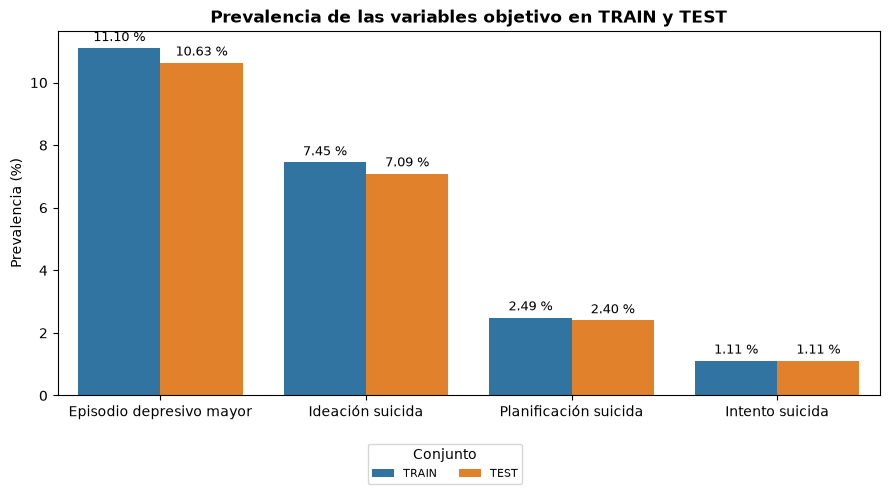


Partición guardada correctamente: True


In [10]:
# =============================================================================
# VALIDACIÓN FINAL Y GUARDADO DE LA PARTICIÓN
# =============================================================================
print('\nVALIDACIÓN FINAL Y GUARDADO DE LA PARTICIÓN')

# -----------------------------------------------------------------------------
# ASIGNACIÓN TRAIN / TEST
# -----------------------------------------------------------------------------
particion = pd.Series(index=df.index, dtype='object')
particion.iloc[idx_train] = 'TRAIN'
particion.iloc[idx_test] = 'TEST'

asignacion_split = pd.DataFrame({
    'QUESTID2': identificador,
    'particion': particion
})

tabla_asignacion_registros = preparar_tabla(
    asignacion_split['particion'].value_counts().rename_axis('particion')
    .reset_index(name='registros')
)

print('\nAsignación de registros:')
display(tabla_asignacion_registros)

asignacion_split.to_csv(ruta_split, index=False, encoding=encoding_csv)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(validacion_split, '07_validacion_split_variables_objetivo')
_ = guardar_csv(validacion_patrones, '08_distribucion_patrones_split')
_ = guardar_csv(comprobaciones_split, '09_comprobaciones_split')

# -----------------------------------------------------------------------------
# COMPARACIÓN GRÁFICA DE PREVALENCIAS
# -----------------------------------------------------------------------------
prevalencias_split = validacion_split[['descripcion', 'prev_train_pct', 'prev_test_pct']].melt(
    id_vars='descripcion', var_name='conjunto', value_name='prevalencia'
)

prevalencias_split['conjunto'] = prevalencias_split['conjunto'].map({
    'prev_train_pct': 'TRAIN', 'prev_test_pct': 'TEST'
})

fig, ax = plt.subplots(figsize=(9, 5))

sns.barplot(
    data=prevalencias_split, x='descripcion', y='prevalencia', hue='conjunto', ax=ax
)

etiquetar_barras(ax, decimales=2, porcentaje=True, fontsize=9)
ax.set_title('Prevalencia de las variables objetivo en TRAIN y TEST', weight='bold')
ax.set_xlabel('')
ax.set_ylabel('Prevalencia (%)')

handles, labels = ax.get_legend_handles_labels()

if ax.get_legend() is not None:
    ax.get_legend().remove()

fig.legend(
    handles, labels, title='Conjunto', loc='lower center', bbox_to_anchor=(0.5, 0.01),
    ncol=2, fontsize=8
)

_ = guardar_figura(fig, '01_prevalencias_variables_objetivo_train_test', rect=[0, 0.12, 1, 1])

# -----------------------------------------------------------------------------
# COMPROBACIÓN FINAL DEL ARCHIVO GUARDADO
# -----------------------------------------------------------------------------
split_guardado = pd.read_csv(ruta_split, encoding=encoding_csv)

split_ok = (
    split_guardado.shape == asignacion_split.shape and
    split_guardado['QUESTID2'].nunique() == len(df) and
    set(split_guardado['particion']) == {'TRAIN', 'TEST'} and
    split_guardado['QUESTID2'].tolist() == asignacion_split['QUESTID2'].tolist() and
    split_guardado['particion'].tolist() == asignacion_split['particion'].tolist()
)

print(f'\nPartición guardada correctamente: {split_ok}')

if not split_ok:
    raise ValueError('La partición guardada no coincide con la asignación creada.')

### Resultados

La validación final confirma que la partición queda formada por 37.839 registros en TRAIN y 9.460 en TEST. La comparación gráfica muestra distribuciones muy próximas para las cuatro variables objetivo, con coincidencia exacta en intento suicida como consecuencia de la estratificación aplicada sobre esta variable.

La separación conserva todos los registros, mantiene identificadores únicos y no presenta solapamiento de `QUESTID2` entre ambos conjuntos. La comprobación posterior al guardado confirma además que la asignación recuperada coincide exactamente con la creada en memoria. Por tanto, la partición 80/20 queda congelada como referencia común para las fases posteriores y no volverá a generarse durante el proyecto.

La figura resume de forma clara la estabilidad de las prevalencias, aunque su utilidad es principalmente metodológica y podrá ser sustituida posteriormente por gráficos de comparación de modelos con mayor relevancia para la memoria final.

**Clasificación:** ANEXO. La estrategia de partición se describirá de forma breve en la MEMORIA, mientras que la figura y las comprobaciones completas se conservarán como soporte metodológico.

## Síntesis de la sección 1 (memoria)

La partición definitiva del proyecto queda formada por 37.839 registros en TRAIN (80 %) y 9.460 en TEST (20 %), utilizando la semilla `12345`. La estrategia seleccionada mantiene representados en ambos conjuntos los 16 patrones multisalida existentes y conserva distribuciones muy próximas para las cuatro variables objetivo.

`QUESTID2` permanece único en cada conjunto y no existe solapamiento entre TRAIN y TEST. La asignación se guarda de forma explícita para que los notebooks posteriores reutilicen exactamente las mismas filas y evitar cualquier modificación accidental de la muestra de evaluación.

Desde este momento TEST queda congelado. Las decisiones de preprocesamiento, selección de variables, comparación de modelos, hiperparámetros y estrategias de desbalanceo del Notebook 02 se realizarán exclusivamente con información procedente de TRAIN.

**Tabla candidata:** distribución TRAIN/TEST y prevalencias de las cuatro variables objetivo.

**Figura candidata:** comparación de prevalencias entre TRAIN y TEST, preferentemente como apoyo o anexo.

**Destino:** MEMORIA + ANEXO.

# 2. Preparación de las variables de entrada

Una vez fijada la partición, comienza la preparación del conjunto de variables de entrada utilizando exclusivamente la información de TRAIN para cualquier decisión dependiente de la muestra. El EDA ya estableció la estructura de los 814 predictores principales y documentó la presencia de valores físicamente ausentes, códigos especiales y diferentes números de categorías.

Esta información se recuperará como referencia estructural, pero las posibles eliminaciones por elevada concentración en un mismo valor, categorías poco frecuentes o cualquier otra característica dependiente de la muestra se comprobarán nuevamente sobre TRAIN. El conjunto TEST permanecerá al margen de estas decisiones y únicamente recibirá posteriormente las transformaciones definidas a partir del entrenamiento.

## 2.1. Resumen inicial de las variables de entrada

Se recupera la estructura de predictores generada en el EDA y se comprueba que sus 814 registros corresponden exactamente con las columnas de `X_train`. Esta tabla permite separar variables binarias, categóricas y numéricas sin inferir su tratamiento únicamente a partir de los valores observados.

A continuación se resume su estructura y se comprueba sobre TRAIN la presencia de valores físicamente ausentes y de variables con una distribución muy concentrada en un mismo valor. Esta revisión todavía no elimina ninguna variable, sino que establece el punto de partida para las revisiones posteriores.

In [11]:
# =============================================================================
# RESUMEN INICIAL DE LAS VARIABLES DE ENTRADA
# =============================================================================
print('\nRESUMEN INICIAL DE LAS VARIABLES DE ENTRADA')

estructura_predictores = pd.read_csv(ruta_estructura_predictores, encoding=encoding_csv)

if len(estructura_predictores) != X_train.shape[1]:
    raise ValueError('La estructura no contiene las 814 variables de X_train.')

if set(estructura_predictores['variable']) != set(X_train.columns):
    raise ValueError('Las variables de entrada no coinciden con X_train.')

if estructura_predictores['variable'].duplicated().any():
    raise ValueError('Existen variables duplicadas en la estructura de predictores.')

resumen_tipos_variables = estructura_predictores.groupby('tipo_variable', as_index=False).agg(
    variables=('variable', 'size'),
    mediana_valores_unicos=('n_unicos', 'median'),
    mediana_nan=('pct_nan', 'median'),
    mediana_dominante=('pct_dominante', 'median')
).sort_values('variables', ascending=False).reset_index(drop=True)

# -----------------------------------------------------------------------------
# COMPROBACIONES CALCULADAS EXCLUSIVAMENTE SOBRE TRAIN
# -----------------------------------------------------------------------------
perfil_train = pd.DataFrame({
    'variable': X_train.columns,
    'n_estados_train': X_train.nunique(dropna=False),
    'n_nan_train': X_train.isna().sum(),
    'pct_nan_train': X_train.isna().mean() * 100
}).reset_index(drop=True)

perfil_train['pct_mas_frecuente_train'] = [
    X_train[v].value_counts(normalize=True, dropna=False).iloc[0] * 100 for v in X_train.columns
]

perfil_train = perfil_train.merge(
    estructura_predictores[['variable', 'modulo', 'tipo_variable']], on='variable', how='left',
    validate='one_to_one'
)

tabla_resumen_tipos_variables = preparar_tabla(resumen_tipos_variables, redondeo=3)

print('\nResumen por tipo de variable:')
display(tabla_resumen_tipos_variables)

print(
    f'\nVariables con algún valor físicamente ausente en TRAIN: '
    f'{perfil_train["n_nan_train"].gt(0).sum()}'
)
print(f'Variables constantes en TRAIN: {perfil_train["n_estados_train"].eq(1).sum()}')
print(
    f'Variables con un mismo valor en al menos el 99 % de TRAIN: '
    f'{perfil_train["pct_mas_frecuente_train"].ge(99).sum()}'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(perfil_train, '10_revision_variables_entrada_train')


RESUMEN INICIAL DE LAS VARIABLES DE ENTRADA



Resumen por tipo de variable:


,Tipo de variable,Variables,Mediana de valores únicos,Mediana de valores físicamente ausentes (%),Mediana del valor dominante (%)
0,Binaria,404,2.0,0.0,97.285
1,Categórica con pocas categorías,329,7.0,0.0,89.905
2,Numérica con rango documentado,59,46.0,0.0,85.998
3,Categórica con número moderado de categorías,22,19.0,0.0,85.929



Variables con algún valor físicamente ausente en TRAIN: 172
Variables constantes en TRAIN: 0
Variables con un mismo valor en al menos el 99 % de TRAIN: 186


### Resultados

El resumen confirma la estructura de los 814 predictores principales definida en el EDA, con predominio de variables binarias y categóricas con pocas categorías. En TRAIN no aparece ninguna variable constante, aunque 186 presentan un mismo valor en al menos el 99 % de los registros.

También se identifican 172 variables con algún valor físicamente ausente. Ninguna de estas situaciones se utilizará por sí sola como criterio de eliminación, ya que tanto las categorías poco frecuentes como determinadas ausencias físicas pueden corresponder a estados informativos o a la propia estructura del cuestionario.

La clasificación utilizada procede directamente del EDA definitivo mediante `tipo_variable`, por lo que ya no es necesario mantener ninguna capa de compatibilidad con denominaciones anteriores.

**Clasificación:** ANEXO. La composición general podrá resumirse en la metodología de la MEMORIA.

## 2.2. Revisión de valores muy repetidos y valores físicamente ausentes en TRAIN

La primera reducción debe basarse únicamente en características observadas dentro de TRAIN. Dado que no se han identificado variables constantes, se analiza con mayor detalle la concentración del valor más frecuente en aquellas variables con distribuciones muy desequilibradas, evitando aplicar un umbral automático que pudiera eliminar eventos poco frecuentes pero informativos.

De forma paralela se cuantifica la presencia de valores físicamente ausentes según distintos niveles de intensidad y tipo de variable. Estos valores corresponden a `NaN` observados directamente en la base y no deben confundirse con todos los estados documentales de ausencia registrados mediante códigos específicos.

El objetivo de este apartado no es imputar todavía, sino determinar qué situaciones requieren un tratamiento posterior específico y distinguir incidencias aisladas de patrones de ausencia física más relevantes.

In [12]:
# =============================================================================
# REVISIÓN DE VALORES MUY REPETIDOS Y VALORES FÍSICAMENTE AUSENTES EN TRAIN
# =============================================================================
print('\nREVISIÓN DE VALORES MUY REPETIDOS Y VALORES FÍSICAMENTE AUSENTES EN TRAIN')

# -----------------------------------------------------------------------------
# CONCENTRACIÓN
# -----------------------------------------------------------------------------
umbrales_repeticion = [95, 99, 99.5, 99.9]

resumen_repeticion = pd.DataFrame({
    'umbral_pct': umbrales_repeticion,
    'n_variables': [
        perfil_train['pct_mas_frecuente_train'].ge(umbral).sum() for umbral in umbrales_repeticion
    ]
})

tabla_resumen_repeticion = preparar_tabla(resumen_repeticion)

print('\nVariables según porcentaje del valor más frecuente:')
display(tabla_resumen_repeticion)

variables_concentracion_alta = perfil_train[perfil_train['pct_mas_frecuente_train'] >= 99].copy()

detalle_concentracion = []

for variable in variables_concentracion_alta['variable']:
    frecuencias = X_train[variable].value_counts(dropna=False)
    valor_frecuente = frecuencias.index[0]
    frecuencia_maxima = frecuencias.iloc[0]

    detalle_concentracion.append({
        'variable': variable,
        'tipo_variable': perfil_train.loc[
            perfil_train['variable'] == variable, 'tipo_variable'
        ].iloc[0],
        'valor_mas_frecuente': valor_frecuente,
        'freq_valor_mas_frecuente': frecuencia_maxima,
        'freq_resto': len(X_train) - frecuencia_maxima,
        'pct_valor_mas_frecuente': frecuencia_maxima / len(X_train) * 100
    })

detalle_concentracion = pd.DataFrame(detalle_concentracion).sort_values(
    ['pct_valor_mas_frecuente', 'freq_resto'], ascending=[False, True]
).reset_index(drop=True)

tabla_detalle_concentracion = preparar_tabla(
    detalle_concentracion.head(15), redondeo={'pct_valor_mas_frecuente': 3}
)

print('\nVariables más próximas a ser constantes:')
display(tabla_detalle_concentracion)

# -----------------------------------------------------------------------------
# VALORES FÍSICAMENTE AUSENTES
# -----------------------------------------------------------------------------
resumen_ausencias_fisicas = pd.DataFrame({
    'criterio': ['> 0 %', '≥ 1 %', '≥ 10 %', '≥ 25 %', '≥ 50 %', '≥ 75 %'],
    'n_variables': [
        perfil_train['pct_nan_train'].gt(0).sum(),
        perfil_train['pct_nan_train'].ge(1).sum(),
        perfil_train['pct_nan_train'].ge(10).sum(),
        perfil_train['pct_nan_train'].ge(25).sum(),
        perfil_train['pct_nan_train'].ge(50).sum(),
        perfil_train['pct_nan_train'].ge(75).sum()
    ]
})

tabla_resumen_ausencias_fisicas = preparar_tabla(resumen_ausencias_fisicas)

print('\nVariables según porcentaje de valores físicamente ausentes:')
display(tabla_resumen_ausencias_fisicas)

ausencias_fisicas_tipo = perfil_train[perfil_train['n_nan_train'] > 0].groupby(
    'tipo_variable', as_index=False
).agg(
    variables=('variable', 'size'),
    mediana_nan_pct=('pct_nan_train', 'median'),
    max_nan_pct=('pct_nan_train', 'max')
).sort_values('variables', ascending=False).reset_index(drop=True)

tabla_ausencias_fisicas_tipo = preparar_tabla(ausencias_fisicas_tipo, redondeo=3)

print('\nValores físicamente ausentes por tipo de variable:')
display(tabla_ausencias_fisicas_tipo)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(resumen_repeticion, '11_resumen_alta_repeticion_train')
_ = guardar_csv(detalle_concentracion, '12_detalle_variables_alta_repeticion_train')
_ = guardar_csv(resumen_ausencias_fisicas, '13_resumen_ausencias_fisicas_train')
_ = guardar_csv(ausencias_fisicas_tipo, '14_ausencias_fisicas_por_tipo_variable_train')


REVISIÓN DE VALORES MUY REPETIDOS Y VALORES FÍSICAMENTE AUSENTES EN TRAIN

Variables según porcentaje del valor más frecuente:


,Umbral (%),Variables
0,95.0,376
1,99.0,186
2,99.5,117
3,99.9,32



Variables más próximas a ser constantes:


,Variable,Tipo de variable,Valor más frecuente,Frecuencia del valor más frecuente,Frecuencia del resto de valores,Valor más frecuente (%)
0,FUTRQNM18,Binaria,2.0,37838,1,99.997
1,FUSEDNM21,Binaria,2.0,37838,1,99.997
2,FUSTMNM18,Binaria,2.0,37836,3,99.992
3,RXBARBMIS,Binaria,0.0,37835,4,99.989
4,FUPNRNM18,Binaria,2.0,37835,4,99.989
5,PCPMON,Binaria,0.0,37834,5,99.987
6,SALVIAMON,Binaria,0.0,37833,6,99.984
7,RXPROVMIS,Binaria,0.0,37828,11,99.971
8,FUTRQNM21,Binaria,2.0,37827,12,99.968
9,RXZOHYMIS,Binaria,0.0,37826,13,99.966



Variables según porcentaje de valores físicamente ausentes:


,Criterio,Variables
0,> 0 %,172
1,≥ 1 %,54
2,≥ 10 %,24
3,≥ 25 %,24
4,≥ 50 %,24
5,≥ 75 %,23



Valores físicamente ausentes por tipo de variable:


,Tipo de variable,Variables,Mediana de valores físicamente ausentes (%),Máximo de valores físicamente ausentes (%)
0,Binaria,136,0.071,99.886
1,Categórica con pocas categorías,32,0.502,99.886
2,Numérica con rango documentado,4,28.498,86.199


### Resultados

La revisión sobre TRAIN confirma que no existen variables constantes, aunque sí aparece un grupo amplio de variables con distribuciones muy concentradas. En concreto, 186 variables presentan un único valor en al menos el 99 % de los registros y 32 superan el 99,9 %. Algunos casos extremos conservan únicamente entre uno y quince registros con valores distintos al más frecuente.

Esta situación no justifica una eliminación automática. Varias de estas variables representan sucesos muy infrecuentes —por ejemplo determinados consumos o indicadores específicos— y su baja frecuencia puede formar parte del fenómeno estudiado. Por tanto, la concentración se utilizará como criterio de revisión, pero no como regla aislada de descarte.

Los valores físicamente ausentes muestran una estructura diferente. De las 172 variables con algún `NaN` en TRAIN, la mayoría presenta porcentajes reducidos, mientras que un grupo concreto de 24 variables supera el 50 % y 23 alcanzan al menos el 75 %. Esta separación no representa por sí sola falta de información analítica, ya que determinados estados de ausencia también pueden estar registrados mediante códigos documentales específicos.

Esta interpretación es coherente con el cierre del EDA, donde se diferenciaron expresamente los `NaN` físicos de la no respuesta, las ausencias documentales, los saltos legítimos y otras situaciones codificadas. Por tanto, no se aplicará un tratamiento común a todas estas situaciones.

**Clasificación:** ANEXO. Los valores agregados podrán mencionarse brevemente en la metodología, pero la revisión detallada se conservará como soporte de las decisiones de preprocesamiento.

## 2.3. Detalle de variables con alta ausencia física o concentración extrema

Antes de aplicar cualquier reducción sin utilizar las variables objetivo se revisan individualmente las situaciones más extremas observadas en TRAIN. Por un lado, se estudian las variables con al menos un 50 % de valores físicamente ausentes; por otro, aquellas que concentran un mismo valor en al menos el 99,9 % de los registros.

La revisión combina las características observadas exclusivamente en TRAIN con la información documental transferida desde el EDA. En particular, se incorporan el módulo, la descripción del codebook y los tipos de ausencia documental, con el objetivo de evitar que una elevada proporción de `NaN` o una frecuencia extremadamente reducida conduzcan por sí solas a eliminar una variable potencialmente informativa.

Este apartado mantiene un carácter diagnóstico. Las variables se señalarán para revisión, pero cualquier exclusión posterior deberá quedar respaldada por su estructura, su significado y los resultados de la selección realizada exclusivamente sobre TRAIN.

In [13]:
# =============================================================================
# DETALLE DE VARIABLES CON ALTA AUSENCIA FÍSICA O CONCENTRACIÓN EXTREMA
# =============================================================================
print('\nDETALLE DE VARIABLES CON ALTA AUSENCIA FÍSICA O CONCENTRACIÓN EXTREMA')

# -----------------------------------------------------------------------------
# INFORMACIÓN DOCUMENTAL PROCEDENTE DEL EDA
# -----------------------------------------------------------------------------
columnas_estructura = [
    'variable',
    'modulo',
    'tipo_version',
    'tipo_variable',
    'n_ausencia_documental',
    'pct_ausencia_documental',
    'tipos_ausencia'
]

revision_variables = perfil_train.merge(
    estructura_predictores[columnas_estructura], on=['variable', 'modulo', 'tipo_variable'],
    how='left', validate='one_to_one'
)

revision_variables = revision_variables.merge(
    roles[['variable', 'etiqueta_codebook']], on='variable', how='left', validate='one_to_one'
)

revision_variables['n_observados_train'] = len(X_train) - revision_variables['n_nan_train']

# -----------------------------------------------------------------------------
# VARIABLES CON ALTO PORCENTAJE DE AUSENCIA FÍSICA
# -----------------------------------------------------------------------------
variables_ausencia_fisica_alta = (
    revision_variables[revision_variables['pct_nan_train'] >= 50].copy()
    .sort_values('pct_nan_train', ascending=False).reset_index(drop=True)
)

tabla_ausencia_fisica_alta = variables_ausencia_fisica_alta[[
    'variable', 'modulo', 'tipo_variable', 'n_observados_train', 'pct_nan_train',
    'pct_ausencia_documental', 'tipos_ausencia'
]]

tabla_detallada_ausencia_fisica_alta = preparar_tabla(
    tabla_ausencia_fisica_alta, redondeo={'pct_nan_train': 3, 'pct_ausencia_documental': 3}
)

print('\nVariables con al menos 50 % de valores físicamente ausentes en TRAIN:')
display(tabla_detallada_ausencia_fisica_alta)

# -----------------------------------------------------------------------------
# VARIABLES CON CONCENTRACIÓN EXTREMA
# -----------------------------------------------------------------------------
variables_concentracion_extrema = detalle_concentracion[
    detalle_concentracion['pct_valor_mas_frecuente'] >= 99.9
].copy()

variables_concentracion_extrema = variables_concentracion_extrema.merge(
    roles[['variable', 'modulo', 'etiqueta_codebook']], on='variable', how='left',
    validate='one_to_one'
)

tabla_concentracion_extrema = variables_concentracion_extrema[[
    'variable', 'modulo', 'tipo_variable', 'valor_mas_frecuente', 'freq_resto',
    'pct_valor_mas_frecuente'
]]

tabla_detallada_concentracion_extrema = preparar_tabla(
    tabla_concentracion_extrema, redondeo={'pct_valor_mas_frecuente': 3}
)

print('\nVariables con un mismo valor en al menos el 99,9 % de TRAIN:')
display(tabla_detallada_concentracion_extrema)

print(f'\nVariables con ausencia física ≥ 50 %: {len(variables_ausencia_fisica_alta)}')
print(f'Variables con concentración ≥ 99,9 %: {len(variables_concentracion_extrema)}')

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(variables_ausencia_fisica_alta, '15_variables_ausencia_fisica_alta_train')
_ = guardar_csv(variables_concentracion_extrema, '16_variables_concentracion_extrema_train')


DETALLE DE VARIABLES CON ALTA AUSENCIA FÍSICA O CONCENTRACIÓN EXTREMA

Variables con al menos 50 % de valores físicamente ausentes en TRAIN:


,Variable,Módulo,Tipo de variable,Valores físicamente presentes TRAIN,Valores físicamente ausentes TRAIN (%),Ausencia documental (%),Tipos de ausencia
0,SRCFRSEDNM,RECODED DRUG USE,Categórica con pocas categorías,43,99.886,99.884,Ausencia documental
1,SRCCLFRSED,RECODED DRUG USE,Binaria,43,99.886,0.000,Sin ausencia documental observada
2,SRCSEDNM2,RECODED DRUG USE,Categórica con pocas categorías,116,99.693,0.000,Sin ausencia documental observada
3,SRCCLFRTRQ,RECODED DRUG USE,Categórica con pocas categorías,243,99.358,0.000,Sin ausencia documental observada
4,SRCFRTRQNM,RECODED DRUG USE,Categórica con pocas categorías,243,99.358,99.372,Ausencia documental
5,SRCCLFRPNR,RECODED DRUG USE,Categórica con pocas categorías,336,99.112,0.000,Sin ausencia documental observada
6,SRCFRPNRNM,RECODED DRUG USE,Categórica con pocas categorías,336,99.112,99.152,Ausencia documental
7,SRCFRSTMNM,RECODED DRUG USE,Categórica con pocas categorías,346,99.086,99.076,Ausencia documental
8,SRCCLFRSTM,RECODED DRUG USE,Categórica con pocas categorías,346,99.086,0.000,Sin ausencia documental observada
9,SRCTRQNM2,RECODED DRUG USE,Categórica con pocas categorías,594,98.430,0.000,Sin ausencia documental observada



Variables con un mismo valor en al menos el 99,9 % de TRAIN:


,Variable,Módulo,Tipo de variable,Valor más frecuente,Frecuencia del resto de valores,Valor más frecuente (%)
0,FUTRQNM18,RECODED DRUG USE,Binaria,2.0,1,99.997
1,FUSEDNM21,RECODED DRUG USE,Binaria,2.0,1,99.997
2,FUSTMNM18,RECODED DRUG USE,Binaria,2.0,3,99.992
3,RXBARBMIS,RECODED DRUG USE,Binaria,0.0,4,99.989
4,FUPNRNM18,RECODED DRUG USE,Binaria,2.0,4,99.989
5,PCPMON,RECODED DRUG USE,Binaria,0.0,5,99.987
6,SALVIAMON,RECODED DRUG USE,Binaria,0.0,6,99.984
7,RXPROVMIS,RECODED DRUG USE,Binaria,0.0,11,99.971
8,FUTRQNM21,RECODED DRUG USE,Binaria,2.0,12,99.968
9,RXZOHYMIS,RECODED DRUG USE,Binaria,0.0,13,99.966



Variables con ausencia física ≥ 50 %: 24
Variables con concentración ≥ 99,9 %: 32


### Resultados

La revisión confirma que las situaciones extremas se concentran principalmente en variables vinculadas al consumo de sustancias y alcohol. Las 24 variables con al menos un 50 % de valores físicamente ausentes presentan cantidades de observaciones disponibles muy diferentes, desde variables con apenas unas decenas de registros observados hasta otras con más de 18.000 en TRAIN. Por tanto, el porcentaje de `NaN` no constituye por sí solo un criterio suficiente para excluirlas.

Las 32 variables con una concentración superior al 99,9 % corresponden casi exclusivamente a indicadores binarios de sucesos poco frecuentes. En los casos más extremos solo aparecen entre uno y cuatro registros distintos del valor mayoritario, pero se mantienen por ahora porque la baja frecuencia puede responder a fenómenos reales de interés y la reducción inicial no debe eliminar automáticamente una variable únicamente por ser rara.

Por tanto, esta revisión no produce todavía ninguna exclusión. Las variables con alta ausencia física o elevada concentración quedan identificadas para el preprocesamiento y para la selección posterior utilizando las variables objetivo. La siguiente revisión se centrará en las variables numéricas, ya que el EDA confirmó que sus códigos situados fuera del rango cuantitativo oficial pueden representar saltos, ausencia de exposición, asignaciones lógicas o no respuesta y no deben utilizarse como magnitudes numéricas.

**Clasificación:** ANEXO. El detalle completo justifica las decisiones de conservación y preprocesamiento, mientras que en la MEMORIA bastará con indicar que las variables poco frecuentes o con elevada ausencia física no se eliminaron mediante umbrales automáticos.

## 2.4. Preparación de las variables numéricas válidas en TRAIN

Las variables clasificadas como numéricas requieren un tratamiento previo específico, ya que el EDA identificó códigos documentales situados fuera de sus rangos cuantitativos. Estos códigos no deben interpretarse como magnitudes y, por tanto, se construye sobre TRAIN una vista numérica que conserva únicamente los valores comprendidos entre los límites oficiales de cada variable.

Los límites proceden exclusivamente de la documentación oficial y no constituyen información aprendida de la muestra. Los valores originales permanecen sin modificar en `X_train`; esta vista se utiliza únicamente para cuantificar la proporción de valores numéricos válidos y preparar posteriormente el tratamiento mediante imputación y escalado dentro de los pipelines.

En esta fase todavía no se imputa ningún valor ni se elimina ninguna variable. Se comprueba primero cuánta información cuantitativa válida conserva cada variable de entrada una vez separados los códigos especiales.

In [14]:
# =============================================================================
# PREPARACIÓN DE LAS VARIABLES NUMÉRICAS VÁLIDAS EN TRAIN
# =============================================================================
print('\nPREPARACIÓN DE LAS VARIABLES NUMÉRICAS VÁLIDAS EN TRAIN')

rangos_numericos = pd.read_csv(ruta_numericas, encoding=encoding_csv)[
    ['variable', 'rango_documentado', 'limite_inferior', 'limite_superior']
].copy()

variables_numericas = estructura_predictores.loc[
    estructura_predictores['tipo_variable'].eq('Numérica con rango documentado'), 'variable'
].tolist()

if set(rangos_numericos['variable']) != set(variables_numericas):
    raise ValueError('Los rangos documentados no coinciden con las variables numéricas.')

if rangos_numericos[['limite_inferior', 'limite_superior']].isna().any().any():
    raise ValueError('Existen variables numéricas sin límites documentados.')

filas_revision = []

for fila in rangos_numericos.itertuples(index=False):
    serie = pd.to_numeric(X_train[fila.variable], errors='coerce')
    valida = serie.between(fila.limite_inferior, fila.limite_superior)

    filas_revision.append({
        'variable': fila.variable,
        'rango_documentado': fila.rango_documentado,
        'n_validos_train': int(valida.sum()),
        'pct_validos_train': valida.mean() * 100,
        'n_nan_train': int(serie.isna().sum()),
        'n_fuera_rango': int((serie.notna() & ~valida).sum())
    })

revision_numericas_train = pd.DataFrame(
    filas_revision
).sort_values('pct_validos_train').reset_index(drop=True)

resumen_validos_num = pd.DataFrame({
    'criterio': ['< 1 %', '< 5 %', '< 25 %', '< 50 %', '≥ 75 %'],
    'n_variables': [
        revision_numericas_train['pct_validos_train'].lt(1).sum(),
        revision_numericas_train['pct_validos_train'].lt(5).sum(),
        revision_numericas_train['pct_validos_train'].lt(25).sum(),
        revision_numericas_train['pct_validos_train'].lt(50).sum(),
        revision_numericas_train['pct_validos_train'].ge(75).sum()
    ]
})

limites_numericos = rangos_numericos.set_index('variable')[
    ['limite_inferior', 'limite_superior']
].to_dict('index')

print(f'\nVariables numéricas revisadas: {len(variables_numericas)}')

tabla_resumen_validos_num = preparar_tabla(resumen_validos_num)
tabla_revision_numericas = preparar_tabla(
    revision_numericas_train.head(15), redondeo={'pct_validos_train': 3}
)

print('\nResumen de valores numéricos válidos en TRAIN:')
display(tabla_resumen_validos_num)

print('\nVariables numéricas con menor proporción de valores válidos:')
display(tabla_revision_numericas)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(revision_numericas_train, '17_revision_numericas_validas_train')


PREPARACIÓN DE LAS VARIABLES NUMÉRICAS VÁLIDAS EN TRAIN



Variables numéricas revisadas: 59

Resumen de valores numéricos válidos en TRAIN:


,Criterio,Variables
0,< 1 %,10
1,< 5 %,24
2,< 25 %,47
3,< 50 %,52
4,≥ 75 %,6



Variables numéricas con menor proporción de valores válidos:


,Variable,Rango documentado,Valores válidos TRAIN,Valores válidos TRAIN (%),Valores físicamente ausentes TRAIN,Valores fuera de rango
0,PCPYLU,2022 - 2024,21,0.055,0,37818
1,HERYLU,2022 - 2024,67,0.177,0,37772
2,HIVAIDSAG,1 - 59,86,0.227,0,37753
3,CIRROSAGE,1 - 77,88,0.233,0,37751
4,CRKYLU,2022 - 2024,90,0.238,0,37749
5,METHYRLST,2022 - 2024,222,0.587,0,37617
6,INHLYRLST,2022 - 2024,351,0.928,0,37488
7,LSDYLU,2022 - 2024,351,0.928,0,37488
8,HEPBCAGE,1 - 75,360,0.951,0,37479
9,ECSTMOYLU,2022 - 2024,370,0.978,0,37469


### Resultados

Las 59 variables numéricas presentan proporciones muy diferentes de valores situados dentro del rango cuantitativo oficial. Solo seis conservan valores válidos en al menos el 75 % de TRAIN, mientras que 52 presentan una proporción inferior al 50 % y diez no alcanzan siquiera el 1 %. Esta situación se concentra especialmente en variables asociadas a enfermedades poco frecuentes o al momento del último consumo de determinadas sustancias.

La escasa proporción de valores numéricos válidos no implica, sin embargo, que estas columnas estén mayoritariamente vacías. En varias de las variables con menor proporción de valores válidos no existe ningún `NaN` físico; la mayor parte de sus registros contiene códigos documentales situados fuera del rango numérico. Estos valores representan estados como ausencia de exposición, saltos, asignaciones lógicas o no respuesta y, por tanto, contienen información distinta de una magnitud numérica ordinaria.

En consecuencia, los códigos especiales no deben incorporarse al escalado como si fueran cantidades, pero tampoco deben transformarse indiscriminadamente en valores físicamente ausentes para después imputarlos. Esta revisión se utiliza únicamente para cuantificar la proporción de valores numéricos válidos y preparar el tratamiento posterior de las variables.

Este resultado reproduce lo observado en el EDA, donde ya se comprobó que la mayoría de las 59 variables numéricas presenta códigos fuera de su rango y que la baja proporción de valores numéricos válidos es especialmente frecuente en variables condicionadas a grupos específicos de población.

**Clasificación:** ANEXO. La MEMORIA deberá recoger de forma breve que los códigos especiales se separaron de los valores cuantitativos antes del preprocesamiento para evitar interpretarlos como magnitudes o imputarlos de forma incorrecta.

## 2.5. Revisión de los códigos especiales en variables numéricas

La baja proporción de valores numéricos válidos observada hace necesario separar dos tipos de información dentro de las variables numéricas: los valores que representan realmente una magnitud y los códigos especiales utilizados por NSDUH para describir otros estados de respuesta.

Antes de definir el preprocesamiento se cuantifica, exclusivamente sobre TRAIN, cuántos códigos especiales diferentes aparecen en cada variable y qué situaciones documentales representan. El objetivo es comprobar si puede mantenerse esta información mediante una representación sencilla y común para los distintos modelos, sin eliminar variables ni convertir estados informativos en valores numéricos artificiales.

In [15]:
# =============================================================================
# REVISIÓN DE LOS CÓDIGOS ESPECIALES EN VARIABLES NUMÉRICAS
# =============================================================================
print('\nREVISIÓN DE LOS CÓDIGOS ESPECIALES EN VARIABLES NUMÉRICAS')

revision_numericas_eda = pd.read_csv(ruta_revision_numericas, encoding=encoding_csv)

if set(revision_numericas_eda['variable']) != set(variables_numericas):
    raise ValueError('La revisión numérica del EDA no coincide con las variables numéricas.')

filas_estados = []

for variable in variables_numericas:
    serie = pd.to_numeric(X_train[variable], errors='coerce')
    limites = limites_numericos[variable]
    valida = serie.between(limites['limite_inferior'], limites['limite_superior'])
    especial = serie.notna() & ~valida
    codigos = sorted(serie.loc[especial].unique().tolist())

    filas_estados.append({
        'variable': variable,
        'n_valores_valid': int(valida.sum()),
        'pct_valores_valid': valida.mean() * 100,
        'n_valores_valid_unicos': serie.loc[valida].nunique(),
        'n_codigos_especiales': len(codigos),
        'codigos_especiales': ', '.join(str(codigo) for codigo in codigos),
        'n_nan_train': int(serie.isna().sum())
    })

estados_numericos = pd.DataFrame(filas_estados).merge(
    revision_numericas_eda[['variable', 'tipos_fuera_rango']],
    on='variable', how='left', validate='one_to_one'
)

resumen_codigos = estados_numericos.groupby('n_codigos_especiales', as_index=False).agg(
    n_variables=('variable', 'size')
).sort_values('n_codigos_especiales').reset_index(drop=True)

tabla_resumen_codigos = preparar_tabla(resumen_codigos)
tabla_estados_numericos = preparar_tabla(
    estados_numericos.sort_values(['pct_valores_valid', 'n_codigos_especiales']).head(15),
    redondeo={'pct_valores_valid': 3}
)

print('\nNúmero de códigos especiales por variable:')
display(tabla_resumen_codigos)

print('\nVariables con menor proporción de valores numéricos válidos:')
display(tabla_estados_numericos)

print(
    '\nMáximo de códigos especiales en una variable: '
    f'{estados_numericos["n_codigos_especiales"].max()}'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(estados_numericos, '18_codigos_especiales_numericas_train')


REVISIÓN DE LOS CÓDIGOS ESPECIALES EN VARIABLES NUMÉRICAS

Número de códigos especiales por variable:


,Códigos especiales,Variables
0,0,3
1,1,2
2,4,8
3,5,8
4,6,14
5,7,23
6,8,1



Variables con menor proporción de valores numéricos válidos:


,Variable,Valores válidos,Valores válidos (%),Valores válidos únicos,Códigos especiales,Códigos especiales,Valores físicamente ausentes TRAIN,Tipos fuera de rango
50,PCPYLU,21,0.055,3,6,"9985, 9991, 9994, 9997, 9998, 9999",0,Asignación lógica | Ausencia de exposición | N...
29,HERYLU,67,0.177,3,7,"9985, 9989, 9991, 9994, 9997, 9998, 9999",0,Asignación lógica | Ausencia de exposición | N...
31,HIVAIDSAG,86,0.227,33,5,"985, 994, 997, 998, 999",0,Asignación lógica | No respuesta o ausencia | ...
12,CIRROSAGE,88,0.233,48,4,"985, 994, 998, 999",0,Asignación lógica | No respuesta o ausencia | ...
17,CRKYLU,90,0.238,3,7,"9985, 9989, 9991, 9994, 9997, 9998, 9999",0,Asignación lógica | Ausencia de exposición | N...
42,METHYRLST,222,0.587,3,7,"9985, 9989, 9991, 9994, 9997, 9998, 9999",0,Asignación lógica | Ausencia de exposición | N...
36,INHLYRLST,351,0.928,3,7,"9985, 9989, 9991, 9994, 9997, 9998, 9999",0,Asignación lógica | Ausencia de exposición | N...
40,LSDYLU,351,0.928,3,7,"9985, 9989, 9991, 9994, 9997, 9998, 9999",0,Asignación lógica | Ausencia de exposición | N...
27,HEPBCAGE,360,0.951,64,4,"985, 994, 998, 999",0,Asignación lógica | No respuesta o ausencia | ...
20,ECSTMOYLU,370,0.978,3,7,"9985, 9989, 9991, 9994, 9997, 9998, 9999",0,Asignación lógica | Ausencia de exposición | N...



Máximo de códigos especiales en una variable: 8


### Resultados

La revisión confirma que los códigos situados fuera del rango cuantitativo forman parte estructural de las variables numéricas. De las 59 variables revisadas, 56 presentan al menos un código especial en TRAIN y 23 contienen siete códigos diferentes; el máximo observado es de ocho. Por tanto, considerar estos códigos como simples valores atípicos o eliminarlos supondría perder una parte relevante de la información registrada por NSDUH.

La situación es especialmente clara en las variables con menor proporción de valores numéricos válidos. Por ejemplo, algunas variables de año de último consumo presentan únicamente tres valores ordinarios posibles dentro del rango documentado, mientras que la mayor parte de los registros corresponde a distintos estados especiales. En estos casos, tratar toda la columna como numérica introduciría distancias artificiales entre códigos que no representan magnitudes comparables.

Se adopta por ello una representación doble para las variables numéricas: un valor numérico que conservará exclusivamente los valores situados dentro del rango oficial y una variable de estado que identificará si el registro contiene un valor válido, un código especial concreto o un valor físicamente ausente. Esta transformación se basa únicamente en los rangos documentados y no aprende parámetros de TRAIN, por lo que puede aplicarse de forma idéntica a TRAIN y TEST sin introducir fuga de información.

La imputación de los valores numéricos, el escalado y la codificación de las variables de estado se realizarán posteriormente dentro de los pipelines y se ajustarán exclusivamente con TRAIN o con cada fold de validación.

**Clasificación:** MEMORIA. Esta decisión constituye una parte relevante del preprocesamiento y permite justificar cómo se evita interpretar los códigos especiales de NSDUH como magnitudes numéricas.

## 2.6. Preparación de los valores numéricos y sus estados

A partir de la revisión anterior se construye una representación específica para las 59 variables numéricas. Cada variable se representa mediante un valor numérico, que conserva únicamente los valores incluidos en el rango oficial, y una variable de estado, que diferencia los valores cuantitativos válidos, los códigos especiales y los valores físicamente ausentes.

La transformación utiliza exclusivamente los límites documentados oficialmente y, por tanto, no depende de distribuciones, medias, medianas ni frecuencias calculadas sobre los datos. Puede aplicarse de forma idéntica a TRAIN y TEST antes del pipeline sin comprometer la independencia del conjunto de evaluación.

En este apartado no se realiza todavía ninguna imputación, codificación One-Hot ni escalado. El objetivo es únicamente construir y comprobar la representación que recibirá posteriormente estas transformaciones aprendidas.

In [16]:
# =============================================================================
# PREPARACIÓN DE LOS VALORES NUMÉRICOS Y SUS ESTADOS
# =============================================================================
print('\nPREPARACIÓN DE LOS VALORES NUMÉRICOS Y SUS ESTADOS')

X_train_num, X_test_num = pd.DataFrame(index=X_train.index), pd.DataFrame(index=X_test.index)
X_train_estado, X_test_estado = pd.DataFrame(index=X_train.index), pd.DataFrame(index=X_test.index)

for v in variables_numericas:
    limites = limites_numericos[v]
    train = pd.to_numeric(X_train[v], errors='coerce')
    test = pd.to_numeric(X_test[v], errors='coerce')
    valido_train = train.between(limites['limite_inferior'], limites['limite_superior'])
    valido_test = test.between(limites['limite_inferior'], limites['limite_superior'])

    X_train_num[v], X_test_num[v] = train.where(valido_train), test.where(valido_test)

    estado_train = pd.Series('VALIDO', index=X_train.index, dtype='object')
    estado_test = pd.Series('VALIDO', index=X_test.index, dtype='object')
    estado_train.loc[train.isna()], estado_test.loc[test.isna()] = 'MISSING', 'MISSING'

    especial_train, especial_test = train.notna() & ~valido_train, test.notna() & ~valido_test
    estado_train.loc[especial_train] = 'COD_' + train.loc[especial_train].astype(str)
    estado_test.loc[especial_test] = 'COD_' + test.loc[especial_test].astype(str)

    X_train_estado[f'{v}_estado'], X_test_estado[f'{v}_estado'] = estado_train, estado_test

print(f'\nVariables numéricas: {X_train_num.shape[1]}')
print(f'Variables de estado generadas: {X_train_estado.shape[1]}')

estados_train = pd.Series(
    X_train_estado.to_numpy().ravel()
).value_counts().rename_axis('estado').reset_index(name='frecuencia')

tabla_estados_train = preparar_tabla(estados_train.head(15))

tabla_estados_train['Estado'] = tabla_estados_train['Estado'].replace({
    'VALIDO': 'VÁLIDO',
    'MISSING': 'AUSENTE'
})

print('\nEstados más frecuentes en las variables numéricas:')
display(tabla_estados_train)

# -----------------------------------------------------------------------------
# COMPROBACIÓN
# -----------------------------------------------------------------------------
comprobacion_num = pd.DataFrame({
    'comprobacion': [
        'Mismas variables numéricas en TRAIN y TEST',
        'Mismas variables de estado en TRAIN y TEST',
        '59 variables numéricas generadas',
        '59 variables de estado generadas',
        'Valores cuantitativos TRAIN dentro de los rangos',
        'Valores cuantitativos TEST dentro de los rangos'
    ],
    'resultado': [
        X_train_num.columns.equals(X_test_num.columns),
        X_train_estado.columns.equals(X_test_estado.columns),
        X_train_num.shape[1] == 59,
        X_train_estado.shape[1] == 59,
        all(X_train_num[v].dropna().between(
            limites_numericos[v]['limite_inferior'], limites_numericos[v]['limite_superior']
        ).all() for v in variables_numericas),
        all(X_test_num[v].dropna().between(
            limites_numericos[v]['limite_inferior'], limites_numericos[v]['limite_superior']
        ).all() for v in variables_numericas)
    ]
})

tabla_comprobacion_num = preparar_tabla(comprobacion_num)

print('\nComprobaciones de los valores numéricos:')
display(tabla_comprobacion_num)

if not comprobacion_num['resultado'].all():
    raise ValueError(
        'La preparación de las variables numéricas no supera todas las comprobaciones.'
    )


PREPARACIÓN DE LOS VALORES NUMÉRICOS Y SUS ESTADOS



Variables numéricas: 59
Variables de estado generadas: 59



Estados más frecuentes en las variables numéricas:


,Estado,Frecuencia
0,COD_9991,432251
1,COD_991,430615
2,VÁLIDO,415249
3,COD_999,412057
4,COD_99,258938
5,COD_9999,131843
6,AUSENTE,55562
7,COD_0,40770
8,COD_998,15222
9,COD_98,13279



Comprobaciones de los valores numéricos:


,Comprobación,Resultado
0,Mismas variables numéricas en TRAIN y TEST,True
1,Mismas variables de estado en TRAIN y TEST,True
2,59 variables numéricas generadas,True
3,59 variables de estado generadas,True
4,Valores cuantitativos TRAIN dentro de los rangos,True
5,Valores cuantitativos TEST dentro de los rangos,True


### Resultados

La representación construida para las variables numéricas supera todas las comprobaciones previstas. Las 59 variables originales generan un valor numérico y una variable de estado tanto en TRAIN como en TEST, y los valores conservados como numéricos permanecen dentro de los límites documentados.

La distribución conjunta de los estados confirma además que los códigos especiales no son situaciones residuales. Códigos como `9991`, `991`, `999` o `99` aparecen con mucha frecuencia en el conjunto de variables numéricas, reforzando la decisión de conservar su significado como categorías independientes en lugar de interpretarlos como magnitudes o sustituirlos mediante una imputación general.

Por tanto, la representación numérica queda cerrada conceptualmente: los valores válidos recibirán el tratamiento numérico y los estados asociados el tratamiento categórico. Las transformaciones aprendidas (imputación, escalado y codificación) se definirán posteriormente dentro del pipeline.

**Clasificación:** MEMORIA para la decisión metodológica de separar valor y estado; ANEXO para el detalle de códigos y comprobaciones.

## 2.7. Revisión de las variables categóricas en TRAIN

Las variables no clasificadas como numéricas se tratarán como categóricas, independientemente de que sus códigos estén almacenados como números. Esta decisión evita atribuir relaciones de orden o distancia a códigos cuya finalidad es representar categorías de respuesta. A este grupo se incorporarán también las variables de estado generadas para las variables numéricas.

Antes de aplicar One-Hot Encoding se revisan exclusivamente sobre TRAIN el número de categorías, los valores físicamente ausentes y la presencia de categorías con muy pocos registros. El objetivo es estimar la dimensión que tendría el conjunto de datos transformado y comprobar si existen categorías cuya escasa frecuencia pudiera justificar una revisión adicional.

En este apartado no se agrupan categorías ni se ajusta todavía ningún encoder. Las categorías poco frecuentes se identifican únicamente con fines diagnósticos y cualquier agrupación requerirá una justificación posterior.

In [17]:
# =============================================================================
# REVISIÓN DE LAS VARIABLES CATEGÓRICAS EN TRAIN
# =============================================================================
print('\nREVISIÓN DE LAS VARIABLES CATEGÓRICAS EN TRAIN')

variables_categoricas = estructura_predictores.loc[
    estructura_predictores['tipo_variable'].ne('Numérica con rango documentado'), 'variable'
].tolist()

filas_categoricas = []

for v in variables_categoricas:
    frecuencias = X_train[v].value_counts(dropna=False)
    frecuencia_minima = frecuencias.min()

    filas_categoricas.append({
        'variable': v,
        'tipo_variable': perfil_train.loc[perfil_train['variable'].eq(v), 'tipo_variable'].iloc[0],
        'n_categorias_train': len(frecuencias),
        'n_nan_train': int(X_train[v].isna().sum()),
        'freq_categoria_menor': int(frecuencia_minima),
        'pct_categoria_menor': frecuencia_minima / len(X_train) * 100,
        'categorias_menor_10': int((frecuencias < 10).sum()),
        'categorias_menor_50': int((frecuencias < 50).sum()),
        'categorias_menor_100': int((frecuencias < 100).sum())
    })

revision_categoricas = pd.DataFrame(filas_categoricas)

resumen_categoricas_tipo = revision_categoricas.groupby('tipo_variable', as_index=False).agg(
    variables=('variable', 'size'),
    mediana_categorias=('n_categorias_train', 'median'),
    max_categorias=('n_categorias_train', 'max'),
    variables_con_nan=('n_nan_train', lambda x: x.gt(0).sum()),
    variables_con_categoria_menor_50=('freq_categoria_menor', lambda x: x.lt(50).sum())
).sort_values('variables', ascending=False).reset_index(drop=True)

tabla_resumen_categoricas = preparar_tabla(resumen_categoricas_tipo)
tabla_revision_categoricas = preparar_tabla(
    revision_categoricas.sort_values(
        ['n_categorias_train', 'freq_categoria_menor'], ascending=[False, True]
    ).head(15),
    redondeo={'pct_categoria_menor': 3}
)

print('\nResumen de variables categóricas originales:')
display(tabla_resumen_categoricas)

print('\nVariables categóricas con mayor número de categorías:')
display(tabla_revision_categoricas)

# -----------------------------------------------------------------------------
# DIMENSIÓN PREVISTA DE LA CODIFICACIÓN
# -----------------------------------------------------------------------------
n_categorias_originales = revision_categoricas['n_categorias_train'].sum()
n_categorias_estados = X_train_estado.nunique(dropna=False).sum()
dummies_orig = (revision_categoricas['n_categorias_train'] - 1).sum()
dummies_estados = (X_train_estado.nunique(dropna=False) - 1).sum()

resumen_codificacion = pd.DataFrame({
    'grupo': ['Categóricas originales', 'Estados de variables numéricas', 'Total'],
    'variables': [
        len(variables_categoricas),
        X_train_estado.shape[1],
        len(variables_categoricas) + X_train_estado.shape[1]
    ],
    'categorias_train': [
        n_categorias_originales,
        n_categorias_estados,
        n_categorias_originales + n_categorias_estados
    ],
    'dummies_estimadas': [
        dummies_orig,
        dummies_estados,
        dummies_orig + dummies_estados
    ]
})

tabla_resumen_codificacion = preparar_tabla(resumen_codificacion)

print('\nDimensión estimada con One-Hot Encoding:')
display(tabla_resumen_codificacion)

print(
    '\nVariables con alguna categoría de menos de 10 registros: '
    f'{revision_categoricas["freq_categoria_menor"].lt(10).sum()}'
)
print(
    'Variables con alguna categoría de menos de 50 registros: '
    f'{revision_categoricas["freq_categoria_menor"].lt(50).sum()}'
)
print(
    'Variables con algún valor físicamente ausente: '
    f'{revision_categoricas["n_nan_train"].gt(0).sum()}'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(revision_categoricas, '19_revision_categoricas_train')
_ = guardar_csv(resumen_categoricas_tipo, '20_resumen_categoricas_train')
_ = guardar_csv(resumen_codificacion, '21_dimension_codificacion_categoricas')


REVISIÓN DE LAS VARIABLES CATEGÓRICAS EN TRAIN



Resumen de variables categóricas originales:


,Tipo de variable,Variables,Mediana de categorías,Máximo de categorías,Variables con valores físicamente ausentes,Variables con categoría < 50 registros
0,Binaria,404,2.0,3,136,105
1,Categórica con pocas categorías,329,7.0,11,32,238
2,Categórica con número moderado de categorías,22,19.0,19,0,20



Variables categóricas con mayor número de categorías:


,Variable,Tipo de variable,Categorías TRAIN,Valores físicamente ausentes TRAIN,Frecuencia de la categoría menos frecuente,Categoría menos frecuente (%),Categorías < 10 registros,Categorías < 50 registros,Categorías < 100 registros
142,CRKMLU,Categórica con número moderado de categorías,19,0,1,0.003,11,16,16
267,HERMLU,Categórica con número moderado de categorías,19,0,2,0.005,12,16,16
177,ECSTMOMLU,Categórica con número moderado de categorías,19,0,6,0.016,1,15,16
408,LSDMLU,Categórica con número moderado de categorías,19,0,7,0.018,1,15,16
422,METHMOLST,Categórica con número moderado de categorías,19,0,10,0.026,0,15,16
628,SMKMOLAST,Categórica con número moderado de categorías,19,0,16,0.042,0,10,15
334,INHLMOLST,Categórica con número moderado de categorías,19,0,17,0.045,0,15,15
100,CIGDLMLU,Categórica con número moderado de categorías,19,0,21,0.055,0,3,15
132,COCMLU,Categórica con número moderado de categorías,19,0,21,0.055,0,9,15
95,CIGARMLU,Categórica con número moderado de categorías,19,0,30,0.079,0,2,3



Dimensión estimada con One-Hot Encoding:


,Grupo,Variables,Categorías TRAIN,Columnas One-Hot estimadas
0,Categóricas originales,755,3426,2671
1,Estados de variables numéricas,59,390,331
2,Total,814,3816,3002



Variables con alguna categoría de menos de 10 registros: 216
Variables con alguna categoría de menos de 50 registros: 363
Variables con algún valor físicamente ausente: 168


### Resultados

Las 755 variables categóricas originales presentan un número de categorías contenido, con un máximo de 19 categorías observadas en las variables originales y estados adicionales asociados a las variables numéricas. Al incorporar también los estados derivados de las variables numéricas se observan unas 3.816 categorías en TRAIN.

Utilizando una categoría de referencia por variable, la codificación One-Hot generará aproximadamente 3.002 columnas, una dimensión asumible para el conjunto de entrenamiento. Por tanto, no se considera necesario agrupar categorías poco frecuentes antes del modelado y los valores ausentes se conservarán como estados diferenciados.

**Clasificación:** ANEXO. En la MEMORIA bastará con indicar que el número de categorías resultó manejable y no fue necesario agrupar categorías antes del modelado.

## 2.8. Preparación de los datos de entrada al preprocesamiento

Una vez revisados los distintos tipos de variables se construye la representación común que servirá como entrada a los pipelines. Las 755 variables categóricas originales se mantienen sin modificar, mientras que cada una de las 59 variables numéricas aporta un valor numérico válido y una variable de estado que conserva la información asociada a sus códigos especiales.

Los 814 predictores principales originales quedan así representados mediante 873 variables de entrada: 59 numéricas, 755 categóricas originales y 59 variables de estado. Esta ampliación mantiene la trazabilidad con las variables originales y no incorpora nuevos predictores conceptuales.

Los valores numéricos se tratarán posteriormente mediante imputación y escalado, mientras que las variables categóricas y de estado se codificarán mediante One-Hot Encoding. Todas las transformaciones que aprendan parámetros de los datos permanecerán dentro de los pipelines y se ajustarán exclusivamente con TRAIN o con cada fold de validación.

In [18]:
# =============================================================================
# PREPARACIÓN DE LOS DATOS DE ENTRADA AL PREPROCESAMIENTO
# =============================================================================
print('\nPREPARACIÓN DE LOS DATOS DE ENTRADA AL PREPROCESAMIENTO')

X_train_cat, X_test_cat = (
    X_train[variables_categoricas].copy(), X_test[variables_categoricas].copy()
)

X_train_entrada = pd.concat([X_train_num, X_train_cat, X_train_estado], axis=1)
X_test_entrada = pd.concat([X_test_num, X_test_cat, X_test_estado], axis=1)

variables_numericas_entrada = X_train_num.columns.tolist()
variables_categoricas_entrada = X_train_cat.columns.tolist() + X_train_estado.columns.tolist()

resumen_entrada = pd.DataFrame({
    'grupo': ['Variables numéricas', 'Categóricas originales', 'Variables de estado', 'Total'],
    'n_variables': [
        len(variables_numericas_entrada),
        len(variables_categoricas),
        X_train_estado.shape[1],
        X_train_entrada.shape[1]
    ]
})

tabla_resumen_entrada = preparar_tabla(resumen_entrada)

print('\nComposición de los datos de entrada:')
display(tabla_resumen_entrada)

# -----------------------------------------------------------------------------
# COMPROBACIÓN
# -----------------------------------------------------------------------------
comprobs_entrada = pd.DataFrame({
    'comprobacion': [
        'Mismas columnas en TRAIN y TEST',
        'Mismo orden de columnas en TRAIN y TEST',
        '59 variables numéricas',
        '814 variables categóricas y de estado',
        '873 variables totales de entrada',
        'Mismos registros que TRAIN original',
        'Mismos registros que TEST original'
    ],
    'resultado': [
        set(X_train_entrada.columns) == set(X_test_entrada.columns),
        X_train_entrada.columns.equals(X_test_entrada.columns),
        len(variables_numericas_entrada) == 59,
        len(variables_categoricas_entrada) == 814,
        X_train_entrada.shape[1] == 873,
        len(X_train_entrada) == len(X_train),
        len(X_test_entrada) == len(X_test)
    ]
})

tabla_comprobaciones_entrada = preparar_tabla(comprobs_entrada)

print('\nComprobaciones de los datos de entrada al preprocesamiento:')
display(tabla_comprobaciones_entrada)

if not comprobs_entrada['resultado'].all():
    raise ValueError(
        'Los datos de entrada al preprocesamiento no superan todas las comprobaciones.'
    )

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(resumen_entrada, '22_composicion_entrada_preprocesamiento')


PREPARACIÓN DE LOS DATOS DE ENTRADA AL PREPROCESAMIENTO



Composición de los datos de entrada:


,Grupo,Variables
0,Variables numéricas,59
1,Categóricas originales,755
2,Variables de estado,59
3,Total,873



Comprobaciones de los datos de entrada al preprocesamiento:


,Comprobación,Resultado
0,Mismas columnas en TRAIN y TEST,True
1,Mismo orden de columnas en TRAIN y TEST,True
2,59 variables numéricas,True
3,814 variables categóricas y de estado,True
4,873 variables totales de entrada,True
5,Mismos registros que TRAIN original,True
6,Mismos registros que TEST original,True


### Resultados

La representación de entrada mantiene exactamente la misma estructura en TRAIN y TEST. Los 814 predictores principales originales quedan representados mediante 873 variables de entrada: 59 numéricas, 755 categóricas originales y 59 variables de estado asociadas a las variables numéricas.

Todas las comprobaciones de coincidencia, orden y número de registros resultan correctas. La ampliación no introduce nuevos predictores conceptuales, sino que separa en las variables numéricas la magnitud válida de la información asociada a sus códigos especiales.

La representación queda preparada para definir el preprocesamiento común. Las transformaciones que aprendan parámetros de los datos permanecerán dentro de los pipelines, por lo que durante la validación cruzada se ajustarán nuevamente en cada fold utilizando únicamente sus registros de entrenamiento.

**Clasificación:** ANEXO. En la MEMORIA bastará con describir cómo los 814 predictores principales se representan mediante valores numéricos, variables categóricas y variables de estado antes del modelado.

## 2.9. Revisión de relaciones entre variables numéricas

El EDA identificó un número reducido de relaciones elevadas entre variables numéricas y dejó cualquier decisión de eliminación para después de fijar TRAIN/TEST. Una vez construida la representación numérica válida, estas relaciones se revisan nuevamente utilizando exclusivamente TRAIN.

Se emplea correlación de Spearman sobre los valores cuantitativos válidos y se exige un mínimo de 500 observaciones comunes para considerar evaluable cada pareja. Las relaciones con correlación absoluta igual o superior a 0,80 se consideran candidatas de revisión, pero no implican una eliminación automática.

Para facilitar la interpretación gráfica se representa únicamente una selección de hasta 18 variables que forman un bloque completamente evaluable entre sí con el mínimo de casos establecido. La selección de este conjunto prioriza las variables con mayor número de relaciones evaluables y mayor relación observada. El análisis tabular mantiene, no obstante, todas las parejas que cumplen el criterio de 500 observaciones comunes.


REVISIÓN DE RELACIONES ENTRE VARIABLES NUMÉRICAS



Parejas evaluadas: 594
Variables con al menos una pareja evaluable: 49
Variables representadas sin relaciones vacías: 18
Parejas con correlación absoluta ≥ 0.80: 6

Correlaciones de mayor magnitud:


,Variable 1,Variable 2,Observaciones comunes,Correlación de Spearman,Correlación absoluta
0,EDUSKPCOM,EDUSKPMON,806,1.000,1.000
1,EDUSCKCOM,EDUSCKMON,953,1.000,1.000
2,CIGAGLST,CIGDLLST,5450,0.877,0.877
3,BMI2,WTPOUND2,36033,0.865,0.865
4,ECSTMOAGL,HALLAGLST,2837,0.832,0.832
5,COCAGLST,CRKAGLST,1016,0.832,0.832
6,HALLAGLST,LSDAGLST,3382,0.773,0.773
7,CRKAGLST,METHAGLST,565,0.685,0.685
8,ECSTMOAGL,LSDAGLST,1743,0.682,0.682
9,HIGHBPAGE,HRTCONDAG,1013,0.643,0.643


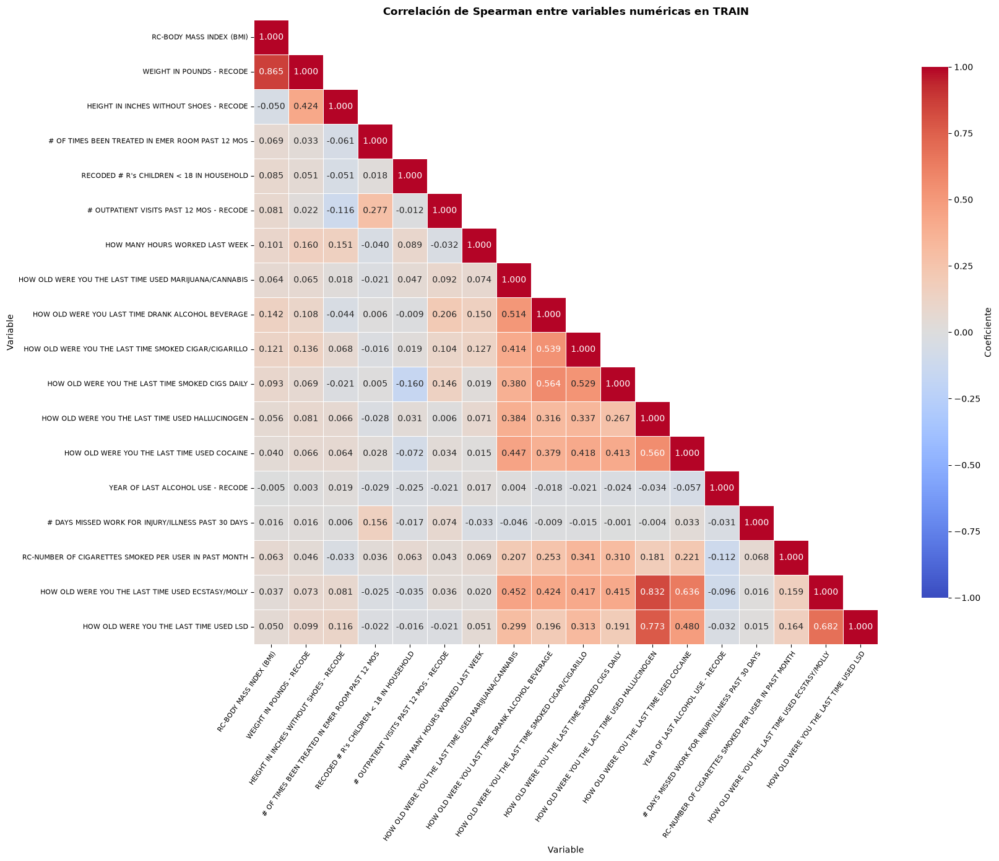

In [19]:
# =============================================================================
# REVISIÓN DE RELACIONES ENTRE VARIABLES NUMÉRICAS
# =============================================================================
print('\nREVISIÓN DE RELACIONES ENTRE VARIABLES NUMÉRICAS')

min_casos_comunes = 500
umbral_corr = 0.80
matriz_corr_train = X_train_num.corr(method='spearman', min_periods=min_casos_comunes)

filas_correlaciones = []

for i, variable_1 in enumerate(variables_numericas):
    for variable_2 in variables_numericas[i + 1:]:
        correlacion = matriz_corr_train.loc[variable_1, variable_2]

        if pd.isna(correlacion):
            continue

        filas_correlaciones.append({
            'variable_1': variable_1,
            'variable_2': variable_2,
            'n_comunes': int(X_train_num[[variable_1, variable_2]].notna().all(axis=1).sum()),
            'correlacion_spearman': correlacion,
            'correlacion_absoluta': abs(correlacion)
        })

correlaciones_train = pd.DataFrame(filas_correlaciones).sort_values(
    'correlacion_absoluta', ascending=False
).reset_index(drop=True)

correlaciones_altas = correlaciones_train[
    correlaciones_train['correlacion_absoluta'] >= umbral_corr
].copy()

# -----------------------------------------------------------------------------
# VARIABLES PARA LA REPRESENTACIÓN
# -----------------------------------------------------------------------------
variables_evaluables = pd.unique(
    correlaciones_train[['variable_1', 'variable_2']].values.ravel()
).tolist()

prioridad_correlaciones = pd.concat([
    correlaciones_train[[
        'variable_1', 'correlacion_absoluta'
    ]].rename(columns={'variable_1': 'variable'}),
    correlaciones_train[[
        'variable_2', 'correlacion_absoluta'
    ]].rename(columns={'variable_2': 'variable'})
]).groupby('variable', as_index=False).agg(
    pares_evaluables=('correlacion_absoluta', 'size'),
    corr_max=('correlacion_absoluta', 'max')
).sort_values(['pares_evaluables', 'corr_max'], ascending=False)

variables_grafico = prioridad_correlaciones['variable'].tolist()

while True:
    faltantes = (~matriz_corr_train.loc[variables_grafico, variables_grafico].notna()).sum(axis=1)
    faltantes = faltantes[faltantes > 0]

    if faltantes.empty:
        break

    variables_grafico.remove(faltantes.idxmax())

if len(variables_grafico) > 18:
    variables_grafico = prioridad_correlaciones.loc[
        prioridad_correlaciones['variable'].isin(variables_grafico), 'variable'
    ].head(18).tolist()

matriz_corr_plot = matriz_corr_train.loc[variables_grafico, variables_grafico]

etiquetas_corr = {variable: nombre_variable(variable) for variable in variables_grafico}
matriz_corr_plot = matriz_corr_plot.rename(index=etiquetas_corr, columns=etiquetas_corr)

print(f'\nParejas evaluadas: {len(correlaciones_train)}')
print(f'Variables con al menos una pareja evaluable: {len(variables_evaluables)}')
print(f'Variables representadas sin relaciones vacías: {len(variables_grafico)}')
print(f'Parejas con correlación absoluta ≥ {umbral_corr:.2f}: {len(correlaciones_altas)}')

tabla_correlaciones_train = preparar_tabla(correlaciones_train.head(15), redondeo=3)

print('\nCorrelaciones de mayor magnitud:')
display(tabla_correlaciones_train)

matriz_correlacion(
    matriz_corr_plot, 'Correlación de Spearman entre variables numéricas en TRAIN',
    '02_correlaciones_numericas_train', xlabel='Variable', ylabel='Variable',
    triangular=True, figsize=(18, 14), rotacion_x=55, tam_etiqueta=8, annot=True
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(correlaciones_train, '23_correlaciones_numericas_train')

### Resultados

La revisión sobre TRAIN identifica 594 parejas de variables numéricas con al menos 500 observaciones cuantitativas comunes, correspondientes a 49 variables que participan en al menos una relación evaluable. De estas parejas, únicamente seis presentan una correlación de Spearman absoluta igual o superior a 0,80.

Dos parejas asociadas al módulo educativo alcanzan una correlación perfecta (`EDUSKPCOM`–`EDUSKPMON` y `EDUSCKCOM`–`EDUSCKMON`). También destacan las relaciones entre `CIGAGLST` y `CIGDLLST` (0,877), `BMI2` y `WTPOUND2` (0,865) y dos relaciones entre edades relacionadas con el consumo de sustancias (0,832).

La representación gráfica se restringe a una selección de variables cuyas relaciones pueden estimarse íntegramente con el mínimo de casos fijado. De este modo se mantiene una matriz compacta y legible, mientras que el análisis tabular conserva las 594 parejas evaluables identificadas en TRAIN.

Estas relaciones no provocan una eliminación automática. La correlación se calcula únicamente sobre los valores cuantitativos válidos compartidos y no incorpora la información contenida en los estados especiales de cada variable. Por tanto, las seis parejas quedan señaladas como posible información repetida, mientras que la selección posterior utilizando las variables objetivo permitirá valorar su aportación predictiva para cada una de las cuatro variables objetivo.

**Clasificación:** ANEXO. En la MEMORIA bastará con indicar que la revisión de información repetida sobre TRAIN identificó un número reducido de relaciones elevadas y que no se aplicaron exclusiones automáticas únicamente por correlación.

## Síntesis de la sección 2 (memoria)

La preparación de la entrada predictiva se realiza respetando la información documental transferida desde el EDA y utilizando TRAIN como única fuente para las decisiones dependientes de los datos. Los 814 predictores principales se organizan inicialmente en 59 variables numéricas y 755 variables categóricas originales.

Para cada variable numérica se añade una variable de estado que distingue los valores válidos de los valores ausentes o especiales, generándose 59 variables de estado adicionales. La representación previa al preprocesamiento queda así formada por 873 variables de entrada: 59 numéricas y 814 tratadas categóricamente entre variables originales y estados.

Las comprobaciones realizadas sobre TEST en esta fase se limitan a aplicar reglas ya definidas y verificar compatibilidad estructural; TEST no interviene en la decisión sobre qué variables se conservan ni en el aprendizaje de transformaciones.

**Tabla candidata:** composición de las variables de entrada antes del preprocesamiento.

**Figura candidata:** no; los diagnósticos de relaciones y distribuciones se reservan principalmente para anexos.

**Destino:** MEMORIA + ANEXO.

# 3. Preprocesamiento y selección de variables

Una vez definida la representación de entrada, se establece un preprocesamiento común para los modelos de Machine Learning, manteniendo la misma lógica utilizada en los módulos previos del Máster. Las variables numéricas y categóricas reciben tratamientos diferentes mediante `Pipeline` y `ColumnTransformer`.

Las variables numéricas se imputan mediante `IterativeImputer` y posteriormente se escalan con `RobustScaler`. Las variables categóricas originales y las variables de estado asociadas a las numéricas se codifican mediante One-Hot Encoding, utilizando una categoría de referencia y `handle_unknown='ignore'`.

Todas estas transformaciones formarán parte posteriormente de los pipelines de los modelos, de forma que durante la validación cruzada se ajusten exclusivamente con los registros pertenecientes al entrenamiento de cada fold.

## 3.1. Comprobación del preprocesamiento

La función `crear_preprocesador` construye el `ColumnTransformer` que reúne los tratamientos numérico y categórico. Posteriormente, `pipeline_clasificacion` incorpora este preprocesamiento como primer paso del pipeline completo junto con el modelo y, cuando corresponde, el sobremuestreo.

Antes de iniciar la reducción de variables se realiza un ajuste diagnóstico exclusivamente sobre TRAIN. Este objeto no se reutilizará durante el modelado, donde todas las transformaciones volverán a ajustarse dentro de cada fold.

In [20]:
# =============================================================================
# COMPROBACIÓN DEL PREPROCESAMIENTO
# =============================================================================
print('\nCOMPROBACIÓN DEL PREPROCESAMIENTO')

preprocesamiento_inicial = crear_preprocesador(
    variables_numericas_entrada, variables_categoricas_entrada
)
display(preprocesamiento_inicial)

X_train_transformado_inicial = preprocesamiento_inicial.fit_transform(X_train_entrada)
columnas_transformadas_iniciales = preprocesamiento_inicial.get_feature_names_out()
ohe_inicial = preprocesamiento_inicial.named_transformers_['cat'].named_steps['onehot']

n_dummies = sum(len(categorias) - 1 for categorias in ohe_inicial.categories_)
n_no_ceros = (
    X_train_transformado_inicial.nnz
    if hasattr(X_train_transformado_inicial, 'nnz')
    else np.count_nonzero(X_train_transformado_inicial)
)
densidad = n_no_ceros / np.prod(X_train_transformado_inicial.shape) * 100

resumen_preprocesamiento = pd.DataFrame({
    'grupo': [
        'Numéricas',
        'Categóricas y variables de estado',
        'Total'
    ],
    'columnas_entrada': [
        len(variables_numericas_entrada),
        len(variables_categoricas_entrada),
        X_train_entrada.shape[1]
    ],
    'columnas_salida': [
        len(variables_numericas_entrada),
        n_dummies,
        X_train_transformado_inicial.shape[1]
    ]
})

tabla_resumen_preprocesamiento = preparar_tabla(resumen_preprocesamiento)

print('\nDimensión del preprocesamiento:')
display(tabla_resumen_preprocesamiento)

print(f'\nTipo de conjunto resultante: {type(X_train_transformado_inicial).__name__}')
print(f'Densidad del conjunto: {densidad:.2f} %')
print(f'Columnas transformadas: {len(columnas_transformadas_iniciales)}')

# -----------------------------------------------------------------------------
# COMPROBACIÓN
# -----------------------------------------------------------------------------
datos_transformados = (
    X_train_transformado_inicial.data
    if hasattr(X_train_transformado_inicial, 'nnz') else X_train_transformado_inicial
)

comprobaciones_preprocesamiento = pd.DataFrame({
    'comprobacion': [
        'Mismos registros que TRAIN',
        'Sin valores ausentes tras el preprocesamiento',
        'Coinciden columnas y nombres generados',
        '59 variables numéricas'
    ],
    'resultado': [
        X_train_transformado_inicial.shape[0] == X_train_entrada.shape[0],
        not np.isnan(datos_transformados).any(),
        X_train_transformado_inicial.shape[1] == len(columnas_transformadas_iniciales),
        len(variables_numericas_entrada) == 59
    ]
})

tabla_comprobaciones_preprocesamiento = preparar_tabla(comprobaciones_preprocesamiento)

print('\nComprobaciones:')
display(tabla_comprobaciones_preprocesamiento)

if not comprobaciones_preprocesamiento['resultado'].all():
    raise ValueError('El preprocesamiento inicial no supera todas las comprobaciones.')

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(resumen_preprocesamiento, '24_resumen_preprocesamiento')


COMPROBACIÓN DEL PREPROCESAMIENTO


,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"verbose_feature_names_out verbose_feature_names_out: bool, str or Callable[[str, str], str], default=True- If True, :meth:`ColumnTransformer.get_feature_names_out` will prefix all feature names with the name of the transformer that generated that feature. It is equivalent to setting `verbose_feature_names_out=""{transformer_name}__{feature_name}""`.- If False, :meth:`ColumnTransformer.get_feature_names_out` will not prefix any feature names and will error if feature names are not unique.- If ``Callable[[str, str], str]``, :meth:`ColumnTransformer.get_feature_names_out` will rename all the features using the name of the transformer. The first argument of the callable is the transformer name and the second argument is the feature name. The returned string will be the new feature name.- If ``str``, it must be a string ready for formatting. The given string will be formatted using two field names: ``transformer_name`` and ``feature_name``. e.g. ``""{feature_name}__{transformer_name}""``. See :meth:`str.format` method from the standard library for more info... versionadded:: 1.0.. versionchanged:: 1.6 `verbose_feature_names_out` can be a callable or a string to be formatted.",False
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'drop'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers contains sparse matrices,these will be stacked as a sparse matrix if the overall density islower than this value. Use ``sparse_threshold=0`` to always returndense. When the transformed output consists of all dense data, thestacked result will be dense, and this keyword will be ignored.",0.3
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary <n_jobs>`for more details.",None
,"transformer_weights transformer_weights: dict, default=NoneMultiplicative weights for features per transformer. The


Dimensión del preprocesamiento:


,Grupo,Variables de entrada,Columnas transformadas
0,Numéricas,59,59
1,Categóricas y variables de estado,814,3002
2,Total,873,3061



Tipo de conjunto resultante: csr_matrix
Densidad del conjunto: 16.95 %
Columnas transformadas: 3061

Comprobaciones:


,Comprobación,Resultado
0,Mismos registros que TRAIN,True
1,Sin valores ausentes tras el preprocesamiento,True
2,Coinciden columnas y nombres generados,True
3,59 variables numéricas,True


### Resultados

El preprocesamiento transforma las 873 variables de entrada en 3.061 columnas: 59 columnas numéricas transformadas y 3.002 dummies generadas mediante One-Hot Encoding. El conjunto resultante conserva todos los registros de TRAIN, no contiene valores ausentes y se almacena en formato disperso, con una densidad aproximada del 16,95 %.

La dimensión obtenida confirma que la codificación es computacionalmente asumible y que no resulta necesario agrupar previamente las categorías poco frecuentes. La estructura mantiene además la lógica trabajada en los módulos previos de Machine Learning: imputación, escalado robusto, codificación One-Hot y `ColumnTransformer`, integrando las transformaciones en un pipeline reproducible.

El ajuste realizado en este apartado tiene únicamente finalidad diagnóstica. Durante la validación cruzada posterior, `IterativeImputer`, `RobustScaler` y `OneHotEncoder` volverán a ajustarse dentro del entrenamiento de cada fold.

**Clasificación:** MEMORIA para la estructura general del preprocesamiento; ANEXO para la dimensión y las comprobaciones detalladas.

## 3.2. Relación con las variables originales

El preprocesamiento amplía las 814 variables originales hasta 3.061 columnas transformadas. Esta ampliación permite representar las categorías y las variables de estado, pero la selección posterior debe seguir siendo interpretable a nivel de variable original.

Por ello se construye una relación entre cada columna obtenida tras el preprocesamiento y la variable original de la que procede. Las columnas numéricas transformadas se vinculan directamente con su variable original, mientras que las columnas generadas mediante One-Hot Encoding se agrupan bajo la variable categórica o numérica de origen.

Esta relación permitirá resumir posteriormente las puntuaciones obtenidas mediante los distintos métodos de selección y mantener una selección común de variables originales para los cuatro targets.

In [21]:
# =============================================================================
# RELACIÓN CON LAS VARIABLES ORIGINALES
# =============================================================================
print('\nRELACIÓN CON LAS VARIABLES ORIGINALES')

nombres_ohe = ohe_inicial.get_feature_names_out(variables_categoricas_entrada)
filas_relacion = []

for variable in variables_numericas_entrada:
    filas_relacion.append({
        'columna_transformada': variable,
        'variable_original': variable,
        'tipo_representacion': 'Numérica',
        'categoria': np.nan
    })

inicio = 0

for variable, categorias, indice_drop in zip(
    variables_categoricas_entrada, ohe_inicial.categories_, ohe_inicial.drop_idx_
):
    categorias = list(categorias)

    if indice_drop is not None:
        categorias = [categoria for i, categoria in enumerate(categorias) if i != indice_drop]

    fin = inicio + len(categorias)
    es_estado = variable in X_train_estado.columns
    variable_original = variable[:-7] if es_estado and variable.endswith('_estado') else variable

    for nombre, categoria in zip(nombres_ohe[inicio:fin], categorias):
        filas_relacion.append({
            'columna_transformada': nombre,
            'variable_original': variable_original,
            'tipo_representacion': 'Estado numérico' if es_estado else 'Categórica',
            'categoria': categoria
        })

    inicio = fin

relacion_preprocesamiento = pd.DataFrame(filas_relacion)

resumen_relacion_preprocesamiento = relacion_preprocesamiento.groupby(
    'tipo_representacion', as_index=False
).agg(
    columnas_transformadas=('columna_transformada', 'size'),
    variables_originales=('variable_original', 'nunique')
)

tabla_resumen_relacion = preparar_tabla(resumen_relacion_preprocesamiento)

print('\nResumen de relación:')
display(tabla_resumen_relacion)

# -----------------------------------------------------------------------------
# COMPROBACIÓN
# -----------------------------------------------------------------------------
comprobaciones_relacion_preprocesamiento = pd.DataFrame({
    'comprobacion': [
        'Se representan las 814 variables originales',
        'Se representan las 3061 columnas transformadas',
        'Coinciden los nombres con el preprocesamiento',
        'Cada columna tiene una variable original'
    ],
    'resultado': [
        relacion_preprocesamiento['variable_original'].nunique() == 814,
        len(relacion_preprocesamiento) == X_train_transformado_inicial.shape[1],
        relacion_preprocesamiento[
            'columna_transformada'
        ].tolist() == columnas_transformadas_iniciales.tolist(),
        relacion_preprocesamiento['variable_original'].notna().all()
    ]
})

tabla_comprobaciones_relacion = preparar_tabla(comprobaciones_relacion_preprocesamiento)

print(
    '\nVariables originales representadas: '
    f'{relacion_preprocesamiento["variable_original"].nunique()}'
)
print(f'Columnas transformadas representadas: {len(relacion_preprocesamiento)}')
print('\nComprobaciones:')
display(tabla_comprobaciones_relacion)

if not comprobaciones_relacion_preprocesamiento['resultado'].all():
    raise ValueError(
        'La relación entre columnas transformadas y variables originales no es correcta.'
    )

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(relacion_preprocesamiento, '25_relacion_variables_preprocesadas')


RELACIÓN CON LAS VARIABLES ORIGINALES

Resumen de relación:


,Tipo de representación,Columnas transformadas,Variables originales
0,Categórica,2671,755
1,Estado numérico,331,59
2,Numérica,59,59



Variables originales representadas: 814
Columnas transformadas representadas: 3061

Comprobaciones:


,Comprobación,Resultado
0,Se representan las 814 variables originales,True
1,Se representan las 3061 columnas transformadas,True
2,Coinciden los nombres con el preprocesamiento,True
3,Cada columna tiene una variable original,True


### Resultados

La relación entre las columnas transformadas y las variables originales queda correctamente establecida. Las 3.061 columnas generadas por el preprocesamiento proceden de las 814 variables originales: 2.671 corresponden a categorías de las 755 variables categóricas, 59 a columnas numéricas transformadas y 331 a variables de estado derivadas de las 59 variables numéricas.

Cada variable numérica queda representada mediante una columna numérica transformada y una o varias columnas asociadas a su variable de estado, pero todas ellas permanecen vinculadas a una única variable original. Se conserva así la trazabilidad necesaria para interpretar posteriormente los resultados de los métodos de selección.

Todas las comprobaciones de número, orden y relación resultan correctas.

**Clasificación:** ANEXO. Esta relación servirá principalmente como apoyo técnico para la selección e interpretación posterior de variables.

## 3.3. Revisión de variables idénticas en TRAIN

Como último paso previo a la selección utilizando las variables objetivo se comprueba si existen variables de entrada con exactamente los mismos valores en todos los registros de TRAIN.

La revisión se realiza sobre las 814 variables originales, antes de la codificación, y no utiliza ninguna de las variables objetivo. Para evitar una comparación directa de todas las parejas se calcula primero una firma de cada columna y únicamente se verifican de forma exacta aquellas que comparten la misma firma.

La detección de variables idénticas no implica todavía su eliminación automática. En caso de encontrarse variables idénticas se revisará su significado antes de conservar una única variable representativa.

In [22]:
# =============================================================================
# REVISIÓN DE VARIABLES IDÉNTICAS EN TRAIN
# =============================================================================
print('\nREVISIÓN DE VARIABLES IDÉNTICAS EN TRAIN')

firmas = {}

for variable in X_train.columns:
    valores_hash = pd.util.hash_pandas_object(X_train[variable], index=False).values
    firma = hashlib.sha256(valores_hash.tobytes()).hexdigest()
    firmas.setdefault(firma, []).append(variable)

grupos_candidatos = [grupo for grupo in firmas.values() if len(grupo) > 1]
filas_duplicadas = []

for n_grupo, grupo in enumerate(grupos_candidatos, start=1):
    iguales = [grupo[0]] + [v for v in grupo[1:] if X_train[grupo[0]].equals(X_train[v])]

    if len(iguales) > 1:
        filas_duplicadas.extend({'grupo': n_grupo, 'variable': v} for v in iguales)

variables_duplicadas = pd.DataFrame(filas_duplicadas, columns=['grupo', 'variable'])

if not variables_duplicadas.empty:
    variables_duplicadas = variables_duplicadas.merge(
        estructura_predictores[['variable', 'modulo', 'tipo_variable']],
        on='variable', how='left', validate='many_to_one'
    )

print(
    '\nGrupos de variables idénticas: '
    f'{variables_duplicadas["grupo"].nunique() if not variables_duplicadas.empty else 0}'
)
print(f'Variables implicadas: {len(variables_duplicadas)}')

if variables_duplicadas.empty:
    print('\nNo se han detectado variables exactamente idénticas en TRAIN.')
else:
    tabla_variables_duplicadas = preparar_tabla(variables_duplicadas)
    print('\nDetalle de variables idénticas:')
    display(tabla_variables_duplicadas)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(variables_duplicadas, '26_variables_duplicadas_train')


REVISIÓN DE VARIABLES IDÉNTICAS EN TRAIN



Grupos de variables idénticas: 1
Variables implicadas: 2

Detalle de variables idénticas:


,Grupo,Variable,Módulo,Tipo de variable
0,1,IRWRKSTAT,IMPUTED EMPLOYMENT,Categórica con pocas categorías
1,1,IRWRKSTAT18,IMPUTED EMPLOYMENT,Categórica con pocas categorías


### Resultados

La revisión identifica un único grupo de variables exactamente idénticas en TRAIN: `IRWRKSTAT` e `IRWRKSTAT18`.

La coincidencia tiene una explicación documental. `IRWRKSTAT18` es una recodificación de `IRWRKSTAT` junto con la edad; su diferencia consiste en asignar un código de salto a los participantes de 12 a 17 años. Como el TFM trabaja exclusivamente con población adulta de 18 años o más, ambas variables contienen exactamente la misma información en TRAIN. 

Se conservará `IRWRKSTAT18`, ya que su definición está específicamente orientada a población adulta, y se eliminará `IRWRKSTAT` de los datos utilizados para el modelado. Esta eliminación no utiliza ninguna variable objetivo y evita mantener dos representaciones idénticas del estado laboral.

**Clasificación:** MEMORIA, como parte de la eliminación de variables idénticas sin utilizar los objetivos. El detalle de la pareja duplicada queda en ANEXO.

## 3.4. Eliminación de la variable idéntica

Las revisiones anteriores no justificaron eliminar variables únicamente por baja frecuencia, valores físicamente ausentes o correlaciones elevadas. Sin embargo, la comprobación de variables idénticas identifica una información repetida exacta entre `IRWRKSTAT` e `IRWRKSTAT18`.

Al estar el análisis restringido a adultos de 18 años o más, se conserva `IRWRKSTAT18`, cuya definición está específicamente adaptada a esta población, y se elimina `IRWRKSTAT`. La decisión se establece utilizando exclusivamente TRAIN y se aplica posteriormente a la estructura común de modelado.

Tras esta reducción se reconstruyen los datos y se comprueba nuevamente el preprocesamiento antes de iniciar la selección utilizando los targets.

In [23]:
# =============================================================================
# ELIMINACIÓN DE LA VARIABLE IDÉNTICA
# =============================================================================
print('\nELIMINACIÓN DE LA VARIABLE IDÉNTICA')

variable_eliminada, variable_conservada = 'IRWRKSTAT', 'IRWRKSTAT18'

vars_predictoras_modelado = [v for v in variables_predictoras if v != variable_eliminada]
vars_numericas_modelado = X_train_num.columns.tolist()
vars_categoricas_originales_modelado = [v for v in variables_categoricas if v != variable_eliminada]
vars_estado_modelado = X_train_estado.columns.tolist()
vars_categoricas_modelado = vars_categoricas_originales_modelado + vars_estado_modelado

X_train_modelo = pd.concat(
    [X_train_num, X_train[vars_categoricas_originales_modelado], X_train_estado], axis=1
)
X_test_modelo = pd.concat(
    [X_test_num, X_test[vars_categoricas_originales_modelado], X_test_estado], axis=1
)

# -----------------------------------------------------------------------------
# COMPROBACIÓN DEL PREPROCESAMIENTO
# -----------------------------------------------------------------------------
preprocesamiento_modelado = crear_preprocesador(vars_numericas_modelado, vars_categoricas_modelado)
X_train_transformado = preprocesamiento_modelado.fit_transform(X_train_modelo)
columnas_transformadas = preprocesamiento_modelado.get_feature_names_out()
datos_transformados = (
    X_train_transformado.data if hasattr(X_train_transformado, 'nnz') else X_train_transformado
)

ohe_modelado = preprocesamiento_modelado.named_transformers_['cat'].named_steps['onehot']
n_dummies = sum(len(categorias) - 1 for categorias in ohe_modelado.categories_)

resumen_reduccion = pd.DataFrame({
    'concepto': [
        'Variables originales',
        'Variables originales tras reducción',
        'Variables de entrada al preprocesamiento',
        'Columnas transformadas'
    ],
    'valor': [
        len(variables_predictoras), len(vars_predictoras_modelado), X_train_modelo.shape[1],
        X_train_transformado.shape[1]
    ]
})

tabla_resumen_reduccion = preparar_tabla(resumen_reduccion)

print('\nResumen de la reducción:')
display(tabla_resumen_reduccion)

print(f'\nVariable eliminada: {variable_eliminada}')
print(f'Variable conservada: {variable_conservada}')
print(f'Dummies generadas: {n_dummies}')

relacion_modelado = relacion_preprocesamiento[
    relacion_preprocesamiento['variable_original'].ne(variable_eliminada)
].reset_index(drop=True)

comprobaciones_reduccion = pd.DataFrame({
    'comprobacion': [
        'IRWRKSTAT eliminado del modelado',
        'IRWRKSTAT18 conservado',
        '813 variables originales para modelado',
        'Mismas variables de entrada en TRAIN y TEST',
        'Sin valores ausentes tras el preprocesamiento',
        '813 variables originales en la relación',
        'Relación alineada con el preprocesamiento'
    ],
    'resultado': [
        variable_eliminada not in vars_predictoras_modelado,
        variable_conservada in vars_predictoras_modelado,
        len(vars_predictoras_modelado) == 813,
        X_train_modelo.columns.equals(X_test_modelo.columns),
        not np.isnan(datos_transformados).any(),
        relacion_modelado['variable_original'].nunique() == 813,
        relacion_modelado['columna_transformada'].tolist() == columnas_transformadas.tolist()
    ]
})

tabla_comprobaciones_reduccion = preparar_tabla(comprobaciones_reduccion)

print('\nComprobaciones:')
display(tabla_comprobaciones_reduccion)

if not comprobaciones_reduccion['resultado'].all():
    raise ValueError('La reducción inicial no supera todas las comprobaciones.')

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(resumen_reduccion, '27_resumen_inicial_de_las_variables')
_ = guardar_csv(relacion_modelado, '28_relacion_variables_modelado')


ELIMINACIÓN DE LA VARIABLE IDÉNTICA



Resumen de la reducción:


,Concepto,Valor
0,Variables originales,814
1,Variables originales tras reducción,813
2,Variables de entrada al preprocesamiento,872
3,Columnas transformadas,3058



Variable eliminada: IRWRKSTAT
Variable conservada: IRWRKSTAT18
Dummies generadas: 2999

Comprobaciones:


,Comprobación,Resultado
0,IRWRKSTAT eliminado del modelado,True
1,IRWRKSTAT18 conservado,True
2,813 variables originales para modelado,True
3,Mismas variables de entrada en TRAIN y TEST,True
4,Sin valores ausentes tras el preprocesamiento,True
5,813 variables originales en la relación,True
6,Relación alineada con el preprocesamiento,True


### Resultados

La eliminación de la variable idéntica afecta únicamente a `IRWRKSTAT`, al resultar exactamente equivalente a `IRWRKSTAT18` en la población adulta analizada. El conjunto pasa así de 814 a 813 variables originales, sin aplicar exclusiones automáticas por baja frecuencia, valores físicamente ausentes o correlaciones elevadas.

La representación previa al preprocesamiento se reduce de 873 a 872 variables de entrada y el preprocesamiento genera 3.058 columnas transformadas, frente a las 3.061 anteriores. La diferencia corresponde a las tres dummies que generaba `IRWRKSTAT` mediante One-Hot Encoding.

Las comprobaciones confirman que TRAIN y TEST mantienen la misma estructura, que el preprocesamiento no genera valores ausentes y que la relación conserva la trazabilidad de las 3.058 columnas transformadas con las 813 variables originales.

**Clasificación:** MEMORIA para justificar la reducción de 814 a 813 variables originales; ANEXO para las comprobaciones y dimensiones detalladas.

## 3.5. Preparación para la selección de variables

Una vez eliminada la variable idéntica, se prepara un único conjunto para comparar los distintos criterios de selección utilizando las variables objetivo. Esta fase no pretende estimar todavía el rendimiento predictivo de los modelos, sino identificar qué variables originales destacan mediante enfoques complementarios.

Se reutiliza el preprocesamiento ajustado exclusivamente sobre TRAIN, evitando repetir innecesariamente la imputación, el escalado y la codificación. Las 3.058 columnas transformadas mantienen su relación con las 813 variables originales mediante la tabla construida previamente.

Sobre este conjunto se aplicarán tres métodos ya utilizados en el módulo de Machine Learning: `SelectKBest` mediante `f_classif`, Regresión Logística con penalización L1 e importancia de Random Forest. Como sus puntuaciones no son directamente comparables, cada resultado se transformará posteriormente en un percentil antes de calcular una puntuación conjunta.

In [24]:
# =============================================================================
# PREPARACIÓN PARA LA SELECCIÓN DE VARIABLES
# =============================================================================
print('\nPREPARACIÓN PARA LA SELECCIÓN DE VARIABLES')

X_selec = X_train_transformado
y_selec = y_train[targets]
relacion_seleccion = relacion_modelado[['columna_transformada', 'variable_original']]

umbral_top = 0.90
metodos_seleccion = {'f': 'score_f', 'l1': 'coef_l1', 'rf': 'importancia_rf'}
columnas_percentiles = [f'percentil_{metodo}' for metodo in metodos_seleccion]

# -----------------------------------------------------------------------------
# COMPROBACIÓN
# -----------------------------------------------------------------------------
comprobaciones_seleccion = pd.DataFrame({
    'comprobacion': [
        'Registros coincidentes entre X e y',
        'Columnas transformadas identificadas',
        '813 variables originales representadas',
        'Sin valores ausentes tras el preprocesamiento'
    ],
    'resultado': [
        X_selec.shape[0] == len(y_selec),
        X_selec.shape[1] == len(columnas_transformadas) == len(relacion_seleccion),
        relacion_seleccion['variable_original'].nunique() == 813,
        not np.isnan(X_selec.data if hasattr(X_selec, 'nnz') else X_selec).any()
    ]
})

tabla_comprobaciones_seleccion = preparar_tabla(comprobaciones_seleccion)

print(f'\nDatos para selección: {X_selec.shape[0]:,} x {X_selec.shape[1]:,}')
print(f'Variables originales: {relacion_seleccion["variable_original"].nunique()}')
print(f'Variables objetivo: {len(targets)}')
print('\nComprobaciones:')
display(tabla_comprobaciones_seleccion)

if not comprobaciones_seleccion['resultado'].all():
    raise ValueError('Los datos preparados para selección no superan todas las comprobaciones.')


PREPARACIÓN PARA LA SELECCIÓN DE VARIABLES

Datos para selección: 37,839 x 3,058
Variables originales: 813
Variables objetivo: 4

Comprobaciones:


,Comprobación,Resultado
0,Registros coincidentes entre X e y,True
1,Columnas transformadas identificadas,True
2,813 variables originales representadas,True
3,Sin valores ausentes tras el preprocesamiento,True


### Resultados

Los datos preparados para la selección contienen los 37.839 registros de TRAIN y 3.058 columnas transformadas, manteniendo la relación completa con las 813 variables originales disponibles tras eliminar la información idéntica sin utilizar las variables objetivo.

Todas las comprobaciones resultan correctas: el conjunto procesado y las cuatro variables objetivo contienen el mismo número de registros, las columnas transformadas están completamente identificadas y no existen valores ausentes después del preprocesamiento.

Este conjunto se utilizará exclusivamente para construir los rankings de selección dentro de TRAIN. No constituye la entrada utilizada posteriormente para estimar el rendimiento mediante validación cruzada.

**Clasificación:** ANEXO, como comprobación técnica previa a la selección utilizando las variables objetivo.

## 3.6. Comparación de tres métodos de selección

La relevancia de las variables originales se analiza mediante tres criterios complementarios aplicados sobre el mismo conjunto procesado de TRAIN.

`f_classif` proporciona una medida univariante de relación con cada variable objetivo. La Regresión Logística con penalización L1 aporta un criterio lineal multivariante regularizado, mientras que Random Forest incorpora relaciones no lineales e interacciones entre variables.

Cada método trabaja inicialmente sobre las columnas transformadas. Cuando una variable original genera varias columnas, se conserva la mayor puntuación obtenida por cualquiera de ellas para evitar favorecer automáticamente a las variables con mayor número de categorías.

Como las puntuaciones de los tres métodos presentan escalas diferentes, se convierten en percentiles entre 0 y 1. La media de estos tres percentiles se utilizará como **puntuación conjunta** para ordenar las variables durante esta primera comparación. Este valor no constituye por sí solo una regla definitiva de selección.

In [25]:
# =============================================================================
# COMPARACIÓN DE TRES MÉTODOS DE SELECCIÓN
# =============================================================================
print('\nCOMPARACIÓN DE TRES MÉTODOS DE SELECCIÓN')

filas_selec = []

for i_target, target in enumerate(targets, start=1):
    inicio_target = perf_counter()
    y_target = y_selec[target]

    print(f'\n[{i_target}/{len(targets)}] {target} — {titulos_targets[target]}')

    # -------------------------------------------------------------------------
    # 1. SELECTKBEST - F_CLASSIF
    # -------------------------------------------------------------------------
    inicio_metodo = perf_counter()
    print('  [1/3] SelectKBest...', flush=True)

    modelo_f = SelectKBest(score_func=f_classif, k='all')
    modelo_f.fit(X_selec, y_target)
    print(f' finalizado ({perf_counter() - inicio_metodo:.1f} s)')

    # -------------------------------------------------------------------------
    # 2. REGRESIÓN LOGÍSTICA L1
    # -------------------------------------------------------------------------
    inicio_metodo = perf_counter()
    print('  [2/3] Regresión Logística L1...', flush=True)

    modelo_l1 = LogisticRegression(
        l1_ratio=1.0, solver='saga', C=0.5, class_weight='balanced', max_iter=300,
        tol=1e-2, random_state=semilla
    )
    modelo_l1.fit(X_selec, y_target)
    print(f' finalizado ({perf_counter() - inicio_metodo:.1f} s)')

    # -------------------------------------------------------------------------
    # 3. RANDOM FOREST
    # -------------------------------------------------------------------------
    inicio_metodo = perf_counter()
    print('  [3/3] Random Forest...', flush=True)

    modelo_rf = RandomForestClassifier(
        n_estimators=150, max_features='sqrt', class_weight='balanced_subsample', n_jobs=-1,
        random_state=semilla
    )
    modelo_rf.fit(X_selec, y_target)
    print(f' finalizado ({perf_counter() - inicio_metodo:.1f} s)')

    # -------------------------------------------------------------------------
    # AGREGACIÓN A VARIABLE ORIGINAL
    # -------------------------------------------------------------------------
    resultados_target = pd.DataFrame({
        'columna_transformada': columnas_transformadas,
        'score_f': np.nan_to_num(modelo_f.scores_, nan=0.0),
        'coef_l1': np.abs(modelo_l1.coef_[0]),
        'importancia_rf': modelo_rf.feature_importances_
    }).merge(relacion_seleccion, on='columna_transformada', how='left')

    if resultados_target['variable_original'].isna().any():
        raise ValueError(f'Existen columnas sin variable original para {target}.')

    resultados_target = resultados_target.groupby('variable_original', as_index=False).agg(
        score_f=('score_f', 'max'),
        coef_l1=('coef_l1', 'max'),
        importancia_rf=('importancia_rf', 'max')
    )

    resultados_target['percentil_f'] = resultados_target['score_f'].rank(method='average', pct=True)
    resultados_target['percentil_l1'] = (
        resultados_target['coef_l1'].rank(method='average', pct=True)
    )
    resultados_target['percentil_rf'] = resultados_target[
        'importancia_rf'
    ].rank(method='average', pct=True)
    resultados_target['puntuacion_conjunta'] = resultados_target[columnas_percentiles].mean(axis=1)
    resultados_target['metodos_top10pct'] = (
        resultados_target[columnas_percentiles] >= umbral_top
    ).sum(axis=1)
    resultados_target['target'] = target

    filas_selec.append(resultados_target)
    print(f'  Variable objetivo finalizada en {perf_counter() - inicio_target:.1f} s')

ranking_seleccion = pd.concat(filas_selec, ignore_index=True)
ranking_seleccion['posicion'] = ranking_seleccion.groupby(
    'target'
)['puntuacion_conjunta'].rank(method='first', ascending=False).astype(int)

ranking_seleccion = ranking_seleccion.sort_values(['target', 'posicion']).reset_index(drop=True)

# -----------------------------------------------------------------------------
# VARIABLES CON MAYOR PUNTUACIÓN CONJUNTA
# -----------------------------------------------------------------------------
print('\nVARIABLES CON MAYOR PUNTUACIÓN CONJUNTA POR VARIABLE OBJETIVO')

for target in targets:
    print(f'\n{target} — {titulos_targets[target]}')

    tabla_target = ranking_seleccion[ranking_seleccion['target'].eq(target)].head(15)[[
        'posicion', 'variable_original', 'percentil_f', 'percentil_l1', 'percentil_rf',
        'puntuacion_conjunta', 'metodos_top10pct'
    ]].copy()

    tabla_target.insert(2, 'nombre', tabla_target['variable_original'].map(nombre_variable))
    tabla_target = preparar_tabla(
        tabla_target,
        redondeo={'percentil_f': 3, 'percentil_l1': 3, 'percentil_rf': 3, 'puntuacion_conjunta': 3}
    )

    display(tabla_target)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(ranking_seleccion, '29_ranking_seleccion_variables')


COMPARACIÓN DE TRES MÉTODOS DE SELECCIÓN

[1/4] IRAMDEYR — Episodio depresivo mayor
  [1/3] SelectKBest...


 finalizado (0.2 s)
  [2/3] Regresión Logística L1...


 finalizado (13.5 s)
  [3/3] Random Forest...


 finalizado (12.4 s)
  Variable objetivo finalizada en 26.1 s

[2/4] IRSUICTHNK — Ideación suicida
  [1/3] SelectKBest...


 finalizado (0.3 s)
  [2/3] Regresión Logística L1...


 finalizado (20.3 s)
  [3/3] Random Forest...


 finalizado (11.3 s)
  Variable objetivo finalizada en 32.1 s

[3/4] IRSUIPLANYR — Planificación suicida
  [1/3] SelectKBest...


 finalizado (0.3 s)
  [2/3] Regresión Logística L1...


 finalizado (20.2 s)
  [3/3] Random Forest...


 finalizado (6.7 s)
  Variable objetivo finalizada en 27.3 s

[4/4] IRSUITRYYR — Intento suicida
  [1/3] SelectKBest...


 finalizado (0.3 s)
  [2/3] Regresión Logística L1...


 finalizado (21.7 s)
  [3/3] Random Forest...


 finalizado (4.5 s)
  Variable objetivo finalizada en 26.6 s

VARIABLES CON MAYOR PUNTUACIÓN CONJUNTA POR VARIABLE OBJETIVO

IRAMDEYR — Episodio depresivo mayor


,Posición,Variable original,Nombre,Percentil f_classif,Percentil RL L1,Percentil Random Forest,Puntuación conjunta,Métodos en top 10 %
0,1,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,0.998,0.961,1.000,0.986,3
1,2,CAMHPROB,THINK EVER HAD PROBLEM WITH OWN MENTAL HEALTH,0.998,0.961,0.999,0.986,3
2,3,CAMHPROB2,RC-PERCEIVED EVER HAD A MENTAL HEALTH ISSUE,1.000,0.959,0.998,0.986,3
3,4,LVLDIFMEM2,LEVEL OF DIFFICULTY REMEMBERING OR CONCENTRATING,0.996,0.945,0.996,0.979,3
4,5,RCVYMHPRB,RC-PERCEIVED RECOVERY FROM MENTAL HEALTH ISSUE,0.990,0.943,0.995,0.976,3
5,6,LVLDIFCOMM2,LEVEL OF DIFFICULTY COMMUNICATING USING YOUR U...,0.994,0.892,0.994,0.960,2
6,7,MRJAGLST,HOW OLD WERE YOU THE LAST TIME USED MARIJUANA/...,0.957,0.937,0.984,0.959,3
7,8,LVLDIFCARE2,LEVEL OF DIFFICULTY WITH SELF-CARE,0.995,0.886,0.993,0.958,2
8,9,UD5ILALANY,RC-DRUG OR ALCOHOL USE DISORDER - PAST YEAR USERS,0.988,0.946,0.934,0.956,3
9,10,HALLYRLST,YEAR OF LAST HALLUCINOGEN USE - RECODE,0.938,0.972,0.956,0.955,3



IRSUICTHNK — Ideación suicida


,Posición,Variable original,Nombre,Percentil f_classif,Percentil RL L1,Percentil Random Forest,Puntuación conjunta,Métodos en top 10 %
813,1,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,0.998,0.959,1.000,0.986,3
814,2,CAMHPROB,THINK EVER HAD PROBLEM WITH OWN MENTAL HEALTH,0.998,0.959,0.999,0.985,3
815,3,CAMHPROB2,RC-PERCEIVED EVER HAD A MENTAL HEALTH ISSUE,1.000,0.957,0.998,0.985,3
816,4,MRJAGLST,HOW OLD WERE YOU THE LAST TIME USED MARIJUANA/...,0.952,0.952,0.993,0.966,3
817,5,SVYRSUDANY,"RC-SUBSTANCE USE DISORDER SEVERITY, PY USERS",0.994,0.946,0.921,0.954,3
818,6,UD5ILALANY,RC-DRUG OR ALCOHOL USE DISORDER - PAST YEAR USERS,0.993,0.943,0.924,0.953,3
819,7,WRKSKIPMO,# DAYS SKIPPED WORK PAST 30 DAYS,0.873,0.986,0.994,0.951,2
820,8,SVYRDUDANY,"RC-DRUG USE DISORDER SEVERITY, PY USERS",0.995,0.930,0.926,0.950,3
821,9,ILLYR,RC-ANY ILLICIT DRUG - PAST YEAR USE,0.986,0.942,0.913,0.947,3
822,10,DRVINDETAG,RC-DUI DETAILED AGE CATEGORY RECODE,0.974,0.937,0.929,0.946,3



IRSUIPLANYR — Planificación suicida


,Posición,Variable original,Nombre,Percentil f_classif,Percentil RL L1,Percentil Random Forest,Puntuación conjunta,Métodos en top 10 %
1626,1,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,0.998,0.958,1.000,0.985,3
1627,2,CAMHPROB,THINK EVER HAD PROBLEM WITH OWN MENTAL HEALTH,0.998,0.958,0.999,0.985,3
1628,3,CAMHPROB2,RC-PERCEIVED EVER HAD A MENTAL HEALTH ISSUE,1.000,0.954,0.998,0.984,3
1629,4,NMERTMT2,# OF TIMES BEEN TREATED IN EMER ROOM PAST 12 MOS,0.968,0.963,0.994,0.975,3
1630,5,UD5ILLANY,RC-DRUG USE DISORDER - PAST YEAR USERS,0.996,0.927,0.995,0.973,3
1631,6,UD5ILALANY,RC-DRUG OR ALCOHOL USE DISORDER - PAST YEAR USERS,0.991,0.942,0.985,0.973,3
1632,7,SVYRDUDANY,"RC-DRUG USE DISORDER SEVERITY, PY USERS",0.995,0.945,0.950,0.963,3
1633,8,SVYRSUDANY,"RC-SUBSTANCE USE DISORDER SEVERITY, PY USERS",0.993,0.950,0.919,0.954,3
1634,9,DRVINDETAG,RC-DUI DETAILED AGE CATEGORY RECODE,0.955,0.938,0.961,0.951,3
1635,10,NMNGTHS2,# NIGHTS STAYED IN HOSPITAL OVERNIGHT OR LONGER,0.872,0.985,0.988,0.948,2



IRSUITRYYR — Intento suicida


,Posición,Variable original,Nombre,Percentil f_classif,Percentil RL L1,Percentil Random Forest,Puntuación conjunta,Métodos en top 10 %
2439,1,NMERTMT2,# OF TIMES BEEN TREATED IN EMER ROOM PAST 12 MOS,0.998,0.967,0.998,0.987,3
2440,2,NMNGTHS2,# NIGHTS STAYED IN HOSPITAL OVERNIGHT OR LONGER,0.978,0.984,0.994,0.985,3
2441,3,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,0.985,0.951,1.000,0.979,3
2442,4,CAMHPROB,THINK EVER HAD PROBLEM WITH OWN MENTAL HEALTH,0.985,0.951,0.999,0.978,3
2443,5,CAMHPROB2,RC-PERCEIVED EVER HAD A MENTAL HEALTH ISSUE,0.982,0.943,0.996,0.974,3
2444,6,SVYRDUDANY,"RC-DRUG USE DISORDER SEVERITY, PY USERS",0.989,0.940,0.977,0.968,3
2445,7,UD5ILLANY,RC-DRUG USE DISORDER - PAST YEAR USERS,0.990,0.913,0.991,0.965,3
2446,8,SVYRSUDANY,"RC-SUBSTANCE USE DISORDER SEVERITY, PY USERS",0.988,0.947,0.907,0.947,3
2447,9,UD5ILALANY,RC-DRUG OR ALCOHOL USE DISORDER - PAST YEAR USERS,0.980,0.925,0.925,0.943,3
2448,10,RKFQDBLT,WEAR A SEATBELT WHEN YOU DRIVE A CAR,0.962,0.941,0.921,0.941,3


### Resultados

La comparación de los tres métodos se completa correctamente para las cuatro variables objetivo mediante los criterios establecidos: relación univariante con `f_classif`, coeficientes de Regresión Logística L1 e importancia de Random Forest.

Los rankings muestran una elevada coincidencia entre métodos. `CAMHRCVR`, `CAMHPROB` y `CAMHPROB2` ocupan las primeras posiciones para depresión, ideación y planificación, y mantienen también posiciones elevadas para intento. Para `IRSUITRYYR` aparecen además variables con un comportamiento más específico, como `NMERTMT2` y `NMNGTHS2`, lo que confirma que las variables mejor posicionadas no son completamente idénticas entre los cuatro objetivos.

La mayoría de las primeras variables se sitúan en el 10 % superior según los tres métodos, aunque también aparecen variables destacadas únicamente por dos. Esta complementariedad justifica comparar conjuntamente los tres rankings en lugar de realizar la selección a partir de un único método.

La puntuación conjunta permite ordenar inicialmente las variables, pero todavía no determina por sí sola cuáles deben conservarse. En el siguiente apartado se analizarán diferentes criterios basados tanto en esta puntuación como en el número de métodos que sitúan cada variable dentro del 10 % superior.

**Clasificación:** MEMORIA para describir la estrategia conjunta y sus principales resultados; ANEXO para los rankings completos por variable objetivo.

## 3.7. Evaluación conjunta de los métodos de selección

Los rankings anteriores permiten valorar cada variable original desde dos perspectivas complementarias: el número de métodos que la sitúan dentro del 10 % superior para un mismo target y la repetición de este comportamiento entre los cuatro targets.

Dado que el modelado utilizará un conjunto común de variables para las cuatro variables objetivo, no resulta adecuado seleccionar únicamente aquellas con mayor puntuación media global. Este procedimiento podría perjudicar a variables especialmente informativas para los objetivos menos frecuentes, en particular planificación e intento.

Por ello se comparan distintos criterios sin fijar previamente el número final de variables. Para cada variable original se contabiliza en cuántos targets aparece dentro del 10 % superior según dos o tres métodos y se calculan también sus puntuaciones conjunta media y máxima.

Esta revisión permitirá establecer posteriormente una regla común de reducción basada en el comportamiento observado de los tres métodos y de los cuatro targets.

In [26]:
# =============================================================================
# EVALUACIÓN CONJUNTA DE LOS MÉTODOS DE SELECCIÓN
# =============================================================================
print('\nEVALUACIÓN CONJUNTA DE LOS MÉTODOS DE SELECCIÓN')

ranking_seleccion['top10_2_metodos'] = ranking_seleccion['metodos_top10pct'] >= 2
ranking_seleccion['top10_3_metodos'] = ranking_seleccion['metodos_top10pct'] == 3
ranking_seleccion['puntuacion_090'] = ranking_seleccion['puntuacion_conjunta'] >= 0.90
ranking_seleccion['puntuacion_095'] = ranking_seleccion['puntuacion_conjunta'] >= 0.95

resumen_variables_seleccion = ranking_seleccion.groupby('variable_original', as_index=False).agg(
    puntuacion_media=('puntuacion_conjunta', 'mean'),
    puntuacion_max=('puntuacion_conjunta', 'max'),
    targets_2_metodos=('top10_2_metodos', 'sum'),
    targets_3_metodos=('top10_3_metodos', 'sum'),
    targets_puntuacion_090=('puntuacion_090', 'sum'),
    targets_puntuacion_095=('puntuacion_095', 'sum')
).sort_values(
    ['targets_3_metodos', 'targets_2_metodos', 'puntuacion_max'], ascending=False
).reset_index(drop=True)

# -----------------------------------------------------------------------------
# COMPARACIÓN DE POSIBLES CRITERIOS
# -----------------------------------------------------------------------------
criterios_reduccion = pd.DataFrame({
    'criterio': [
        '≥2 métodos en top 10 % de al menos una variable objetivo',
        '3 métodos en top 10 % de al menos una variable objetivo',
        'Puntuación conjunta ≥0.90 en al menos una variable objetivo',
        'Puntuación conjunta ≥0.95 en al menos una variable objetivo',
        '3 métodos en top 10 % de al menos dos variables objetivo'
    ],
    'n_variables': [
        resumen_variables_seleccion['targets_2_metodos'].ge(1).sum(),
        resumen_variables_seleccion['targets_3_metodos'].ge(1).sum(),
        resumen_variables_seleccion['targets_puntuacion_090'].ge(1).sum(),
        resumen_variables_seleccion['targets_puntuacion_095'].ge(1).sum(),
        resumen_variables_seleccion['targets_3_metodos'].ge(2).sum()
    ]
})

criterios_reduccion['pct_sobre_813'] = (
    criterios_reduccion['n_variables'] / len(vars_predictoras_modelado) * 100
)

tabla_criterios_reduccion = preparar_tabla(criterios_reduccion, redondeo={'pct_sobre_813': 1})

print('\nNúmero de variables según distintos criterios:')
display(tabla_criterios_reduccion)

tabla_variables_seleccion = resumen_variables_seleccion.head(25).copy()
tabla_variables_seleccion.insert(
    1, 'nombre', tabla_variables_seleccion['variable_original'].map(nombre_variable)
)
tabla_variables_seleccion = preparar_tabla(
    tabla_variables_seleccion, redondeo={'puntuacion_media': 3, 'puntuacion_max': 3}
)

print('\nVariables con mayor coincidencia entre métodos y variables objetivo:')
display(tabla_variables_seleccion)

# -----------------------------------------------------------------------------
# DISTRIBUCIÓN POR TARGET
# -----------------------------------------------------------------------------
resumen_seleccion_targets = ranking_seleccion.groupby('target').agg(
    variables_2_metodos=('top10_2_metodos', 'sum'),
    variables_3_metodos=('top10_3_metodos', 'sum'),
    variables_puntuacion_090=('puntuacion_090', 'sum'),
    variables_puntuacion_095=('puntuacion_095', 'sum')
).reset_index()

tabla_resumen_seleccion_targets = preparar_tabla(resumen_seleccion_targets)

print('\nResumen por variable objetivo:')
display(tabla_resumen_seleccion_targets)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(resumen_variables_seleccion, '30_evaluacion_conjunta_variables')
_ = guardar_csv(criterios_reduccion, '31_criterios_reduccion_variables')


EVALUACIÓN CONJUNTA DE LOS MÉTODOS DE SELECCIÓN

Número de variables según distintos criterios:


,Criterio,Variables,Porcentaje sobre 813 (%)
0,≥2 métodos en top 10 % de al menos una variabl...,123,15.1
1,3 métodos en top 10 % de al menos una variable...,39,4.8
2,Puntuación conjunta ≥0.90 en al menos una vari...,84,10.3
3,Puntuación conjunta ≥0.95 en al menos una vari...,17,2.1
4,3 métodos en top 10 % de al menos dos variable...,18,2.2



Variables con mayor coincidencia entre métodos y variables objetivo:


,Variable original,Nombre,Puntuación media,Puntuación máxima,Variables objetivo con ≥ 2 métodos,Variables objetivo con 3 métodos,"Variables objetivo con puntuación ≥ 0,90","Variables objetivo con puntuación ≥ 0,95"
0,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,0.984,0.986,4,4,4,4
1,CAMHPROB,THINK EVER HAD PROBLEM WITH OWN MENTAL HEALTH,0.984,0.986,4,4,4,4
2,CAMHPROB2,RC-PERCEIVED EVER HAD A MENTAL HEALTH ISSUE,0.982,0.986,4,4,4,4
3,UD5ILLANY,RC-DRUG USE DISORDER - PAST YEAR USERS,0.956,0.973,4,4,4,2
4,UD5ILALANY,RC-DRUG OR ALCOHOL USE DISORDER - PAST YEAR USERS,0.956,0.973,4,4,4,3
5,SVYRDUDANY,"RC-DRUG USE DISORDER SEVERITY, PY USERS",0.957,0.968,4,4,4,3
6,SVYRSUDANY,"RC-SUBSTANCE USE DISORDER SEVERITY, PY USERS",0.951,0.954,4,4,4,3
7,MRJAGLST,HOW OLD WERE YOU THE LAST TIME USED MARIJUANA/...,0.934,0.966,4,3,3,2
8,DRVINDETAG,RC-DUI DETAILED AGE CATEGORY RECODE,0.925,0.951,3,3,3,1
9,ILLYR,RC-ANY ILLICIT DRUG - PAST YEAR USE,0.924,0.948,3,3,3,0



Resumen por variable objetivo:


,Variable objetivo,Variables con ≥ 2 métodos,Variables con 3 métodos,"Variables con puntuación ≥ 0,90","Variables con puntuación ≥ 0,95"
0,IRAMDEYR,82,24,49,11
1,IRSUICTHNK,86,19,51,8
2,IRSUIPLANYR,81,17,40,9
3,IRSUITRYYR,71,17,31,7


### Resultados

La comparación de los distintos criterios muestra que exigir que una variable se sitúe en el 10 % superior para al menos dos de los tres métodos en cualquiera de los cuatro targets conserva 123 de las 813 variables originales disponibles, equivalentes al 15,1 % del conjunto.

Los criterios más restrictivos reducen considerablemente este número: 39 variables se sitúan en el 10 % superior de los tres métodos para al menos un target, 84 alcanzan una puntuación conjunta igual o superior a 0,90, únicamente 17 superan 0,95 y 18 aparecen en el 10 % superior de los tres métodos para al menos dos targets.

Se identifica además un grupo de variables con resultados especialmente consistentes entre los cuatro targets. `CAMHRCVR`, `CAMHPROB`, `CAMHPROB2`, `UD5ILLANY`, `UD5ILALANY`, `SVYRDUDANY` y `SVYRSUDANY` se sitúan en el 10 % superior de los tres métodos para las cuatro variables objetivo. Junto a ellas aparecen otras variables con mayor especificidad para determinados targets.

El criterio de 123 variables se considera inicialmente una alternativa razonable, aunque su composición por tipo de variable debe comprobarse antes de adoptar definitivamente la reducción.

**Clasificación:** MEMORIA para justificar la comparación de criterios; ANEXO para los rankings y tablas completas.

## 3.8. Primera revisión del conjunto seleccionado

El primer criterio analizado conserva las variables situadas en el 10 % superior para al menos dos de los tres métodos en cualquiera de los cuatro targets.

Antes de construir un nuevo conjunto para el modelado se revisa su composición. Esta comprobación permite conocer cuántas variables numéricas y categóricas contiene la selección inicial y estimar el número de variables de entrada que resultaría al incorporar las variables de estado asociadas a las numéricas.

La reducción se considera todavía provisional. En los apartados siguientes se comprobará si alguno de los métodos está favoreciendo sistemáticamente un determinado tipo de variable antes de fijar la regla definitiva.

In [27]:
# =============================================================================
# PRIMERA REVISIÓN DEL CONJUNTO SELECCIONADO
# =============================================================================
print('\nPRIMERA REVISIÓN DEL CONJUNTO SELECCIONADO')

vars_seleccion = resumen_variables_seleccion.loc[
    resumen_variables_seleccion['targets_2_metodos'].ge(1), 'variable_original'
].tolist()

vars_numericas_seleccion = [v for v in vars_numericas_modelado if v in vars_seleccion]
vars_categoricas_seleccion = [
    v for v in vars_categoricas_originales_modelado if v in vars_seleccion
]

resumen_primera_seleccion = pd.DataFrame({
    'concepto': [
        'Variables originales seleccionadas',
        'Variables numéricas',
        'Variables categóricas',
        'Variables de entrada estimadas'
    ],
    'valor': [
        len(vars_seleccion),
        len(vars_numericas_seleccion),
        len(vars_categoricas_seleccion),
        len(vars_categoricas_seleccion) + 2 * len(vars_numericas_seleccion)
    ]
})

tabla_resumen_primera_seleccion = preparar_tabla(resumen_primera_seleccion)

print('\nPrimera composición:')
display(tabla_resumen_primera_seleccion)


PRIMERA REVISIÓN DEL CONJUNTO SELECCIONADO

Primera composición:


,Concepto,Valor
0,Variables originales seleccionadas,123
1,Variables numéricas,54
2,Variables categóricas,69
3,Variables de entrada estimadas,177


### Resultados

La aplicación inicial del criterio reduce el conjunto de 813 a 123 variables originales, conservando el 15,1 % de las variables y eliminando el 84,9 %.

El conjunto obtenido contiene 54 variables numéricas y 69 categóricas. Al mantener para cada variable numérica tanto su valor numérico como su variable de estado asociada, la representación resultante quedaría formada por 177 variables de entrada antes de aplicar One-Hot Encoding.

La elevada presencia de variables numéricas —54 de las 59 disponibles— aconseja considerar esta reducción como provisional y comprobar si alguno de los métodos de selección está favoreciendo sistemáticamente este tipo de variable antes de fijar la regla definitiva.

**Clasificación:** ANEXO como aplicación provisional del primer criterio; pendiente de validación antes de su incorporación definitiva a la MEMORIA.

## 3.9. Comprobación de la selección por tipo de variable

Antes de fijar definitivamente la regla de selección se comprueba si los tres métodos presentan un comportamiento equilibrado entre variables numéricas y categóricas.

La revisión resulta especialmente relevante porque 54 de las 59 variables numéricas disponibles han superado el primer criterio, mientras que la proporción conservada entre las variables categóricas es considerablemente menor.

Para identificar el origen de esta diferencia se analiza, para cada target y método, qué proporción de variables numéricas y categóricas alcanza el 10 % superior del ranking. También se compara el criterio conjunto utilizado con una alternativa basada únicamente en la coincidencia entre `f_classif` y Random Forest.

Esta comprobación no vuelve a ajustar ningún modelo y utiliza exclusivamente los rankings ya obtenidos.

In [28]:
# =============================================================================
# COMPROBACIÓN DE LA SELECCIÓN POR TIPO DE VARIABLE
# =============================================================================
print('\nCOMPROBACIÓN DE LA SELECCIÓN POR TIPO DE VARIABLE')

diagnostico_seleccion = ranking_seleccion[[
    'target', 'variable_original', 'percentil_f', 'percentil_l1', 'percentil_rf'
]].copy()

diagnostico_seleccion['tipo_variable'] = np.where(
    diagnostico_seleccion['variable_original'].isin(vars_numericas_modelado),
    'Numérica', 'Categórica'
)

for m in metodos_seleccion:
    diagnostico_seleccion[f'top10_{m}'] = diagnostico_seleccion[f'percentil_{m}'] >= umbral_top

# -----------------------------------------------------------------------------
# DISTRIBUCIÓN DEL TOP 10 % DE CADA MÉTODO
# -----------------------------------------------------------------------------
filas_tipo = []

for target in targets:
    for metodo in metodos_seleccion:
        for tipo, n_total in [
            ('Numérica', len(vars_numericas_modelado)),
            ('Categórica', len(vars_categoricas_originales_modelado))
        ]:
            mascara = (
                diagnostico_seleccion['target'].eq(target) &
                diagnostico_seleccion['tipo_variable'].eq(tipo)
            )
            n_top = diagnostico_seleccion.loc[mascara, f'top10_{metodo}'].sum()

            filas_tipo.append({
                'target': target,
                'metodo': metodo,
                'tipo_variable': tipo,
                'variables_disponibles': n_total,
                'variables_top10pct': int(n_top),
                'pct_del_tipo': n_top / n_total * 100
            })

resumen_tipo_metodo = pd.DataFrame(filas_tipo)

tabla_resumen_tipo_metodo = resumen_tipo_metodo.pivot_table(
    index=['target', 'metodo'], columns='tipo_variable',
    values=['variables_top10pct', 'pct_del_tipo']
).round(1).rename_axis(index=['Variable objetivo', 'Método'], columns=[None, 'Tipo de variable'])

tabla_resumen_tipo_metodo = preparar_tabla(tabla_resumen_tipo_metodo)

print('\nDistribución del top 10 % por método y variable objetivo:')
display(tabla_resumen_tipo_metodo)

# -----------------------------------------------------------------------------
# DISTRIBUCIÓN DE LA SELECCIÓN INICIAL
# -----------------------------------------------------------------------------
resumen_tipo_inicial = pd.DataFrame({
    'tipo_variable': ['Numérica', 'Categórica'],
    'disponibles': [len(vars_numericas_modelado), len(vars_categoricas_originales_modelado)],
    'seleccionadas': [len(vars_numericas_seleccion), len(vars_categoricas_seleccion)]
})
resumen_tipo_inicial['pct_seleccionado'] = (
    resumen_tipo_inicial['seleccionadas'] / resumen_tipo_inicial['disponibles'] * 100
)

tabla_resumen_tipo_inicial = preparar_tabla(resumen_tipo_inicial, redondeo={'pct_seleccionado': 1})

print('\nDistribución del conjunto reducido inicial:')
display(tabla_resumen_tipo_inicial)

# -----------------------------------------------------------------------------
# COMPARACIÓN CON F_CLASSIF + RANDOM FOREST
# -----------------------------------------------------------------------------
diagnostico_seleccion['seleccion_f_rf'] = (
    diagnostico_seleccion['top10_f'] & diagnostico_seleccion['top10_rf']
)
vars_seleccion_f_rf = diagnostico_seleccion.groupby('variable_original')['seleccion_f_rf'].any()
vars_seleccion_f_rf = vars_seleccion_f_rf[vars_seleccion_f_rf].index.tolist()

comparacion_criterios = pd.DataFrame({
    'criterio': [
        '≥2 de 3 métodos en alguna variable objetivo',
        'f_classif + Random Forest en alguna variable objetivo'
    ],
    'n_variables': [len(vars_seleccion), len(vars_seleccion_f_rf)],
    'n_numericas': [
        sum(v in vars_numericas_modelado for v in vars_seleccion),
        sum(v in vars_numericas_modelado for v in vars_seleccion_f_rf)
    ],
    'n_categoricas': [
        sum(v in vars_categoricas_originales_modelado for v in vars_seleccion),
        sum(v in vars_categoricas_originales_modelado for v in vars_seleccion_f_rf)
    ]
})

comparacion_criterios['pct_sobre_813'] = (
    comparacion_criterios['n_variables'] / len(vars_predictoras_modelado) * 100
)

tabla_comparacion_criterios = preparar_tabla(comparacion_criterios, redondeo={'pct_sobre_813': 1})

print('\nComparación de criterios:')
display(tabla_comparacion_criterios)


COMPROBACIÓN DE LA SELECCIÓN POR TIPO DE VARIABLE



Distribución del top 10 % por método y variable objetivo:


Porcentaje del tipo (%)           \
Tipo de variable                      Categórica Numérica   
Variable objetivo Método                                    
IRAMDEYR          f                         10.1     10.2   
                  l1                         5.0     74.6   
                  rf                         3.3     96.6   
IRSUICTHNK        f                         10.6      5.1   
                  l1                         4.8     78.0   
                  rf                         3.1    100.0   
IRSUIPLANYR       f                         10.6      3.4   
                  l1                         4.4     81.4   
                  rf                         3.2     98.3   
IRSUITRYYR        f                         10.6      3.4   
                  l1                         4.9     76.3   
                  rf                         3.2     98.3   

                         Variables en top 10 %           
Tipo de variable                    Categórica Numérica  
Variable objetivo Método                                 
IRAMDEYR          f                       76.0      6.0  
                  l1                      38.0     44.0  
                  rf                      25.0     57.0  
IRSUICTHNK        f                       80.0      3.0  
                  l1                      36.0     46.0  
                  rf                      23.0     59.0  
IRSUIPLANYR       f                       80.0      2.0  
                  l1                      33.0     48.0  
                  rf                      24.0     58.0  
IRSUITRYYR        f                       80.0      2.0  
                  l1                      37.0     45.0  
                  rf                      24.0     58.0


Distribución del conjunto reducido inicial:


,Tipo de variable,Disponibles,Seleccionadas,Seleccionado (%)
0,Numérica,59,54,91.5
1,Categórica,754,69,9.2



Comparación de criterios:


,Criterio,Variables,Variables numéricas,Variables categóricas,Porcentaje sobre 813 (%)
0,≥2 de 3 métodos en alguna variable objetivo,123,54,69,15.1
1,f_classif + Random Forest en alguna variable o...,46,8,38,5.7


### Resultados

La comprobación por tipo de variable revela una diferencia clara entre los tres métodos de selección.

`f_classif` presenta un comportamiento aproximadamente equilibrado: alrededor del 10 % de las variables categóricas y entre el 3,4 % y el 10,2 % de las numéricas alcanzan el 10 % superior del ranking, dependiendo del target.

La Regresión Logística L1 muestra una concentración considerablemente mayor de variables numéricas. Entre el 74,6 % y el 81,4 % de las 59 variables numéricas se sitúan en el 10 % superior, mientras que esta proporción se reduce aproximadamente al 4,4–5,0 % entre las variables categóricas.

La diferencia es todavía mayor en Random Forest: entre 57 y 59 de las 59 variables numéricas aparecen en el 10 % superior para cada variable objetivo, frente a únicamente 23–25 de las 754 variables categóricas. Como consecuencia, el primer criterio conserva 54 variables numéricas, equivalentes al 91,5 % de las disponibles, pero solo 69 categóricas, un 9,2 %.

La coincidencia exclusiva entre `f_classif` y Random Forest reduce el conjunto a 46 variables, formado por 8 numéricas y 38 categóricas. Sin embargo, eliminar directamente uno de los tres métodos supondría perder la complementariedad buscada en la selección.

Estos resultados indican que los percentiles calculados conjuntamente sobre variables numéricas y categóricas no son directamente adecuados para construir la regla final. Antes de decidirla se comprobará el comportamiento de los rankings normalizados de forma independiente dentro de cada tipo de variable.

**Clasificación:** MEMORIA, ya que esta comprobación modifica directamente la interpretación del primer criterio de selección.

## 3.10. Comparación de rankings por tipo de variable

La revisión anterior muestra que los rankings globales presentan una distribución diferente entre variables numéricas y categóricas, especialmente en los resultados de Regresión Logística L1 y Random Forest.

Para comprobar si esta diferencia puede corregirse sin eliminar ninguno de los tres métodos, los percentiles se recalculan separadamente dentro de las variables numéricas y categóricas para cada target y método. Las puntuaciones originales no se modifican; únicamente cambia el grupo respecto al que se calcula la posición relativa de cada variable.

A partir de estos nuevos percentiles se vuelve a aplicar el primer criterio: una variable se seleccionaría cuando aparezca dentro del 10 % superior según al menos dos de los tres métodos para alguno de los cuatro targets.

Esta alternativa se utiliza únicamente como comprobación antes de establecer la regla definitiva.

In [29]:
# =============================================================================
# COMPARACIÓN DE RANKINGS POR TIPO DE VARIABLE
# =============================================================================
print('\nCOMPARACIÓN DE RANKINGS POR TIPO DE VARIABLE')

ranking_tipo_variable = ranking_seleccion.copy()
ranking_tipo_variable['tipo_variable'] = np.where(
    ranking_tipo_variable['variable_original'].isin(vars_numericas_modelado),
    'Numérica', 'Categórica'
)

for metodo, puntuacion in metodos_seleccion.items():
    ranking_tipo_variable[f'percentil_{metodo}_tipo'] = ranking_tipo_variable.groupby(
        ['target', 'tipo_variable']
    )[puntuacion].rank(method='average', pct=True)

columnas_percentiles_tipo = [f'percentil_{metodo}_tipo' for metodo in metodos_seleccion]
ranking_tipo_variable['metodos_top10pct_tipo'] = (
    ranking_tipo_variable[columnas_percentiles_tipo] >= umbral_top
).sum(axis=1)
ranking_tipo_variable['top10_2_metodos_tipo'] = ranking_tipo_variable['metodos_top10pct_tipo'] >= 2

vars_seleccion_tipo_variable = ranking_tipo_variable.groupby(
    'variable_original'
)['top10_2_metodos_tipo'].any()
vars_seleccion_tipo_variable = vars_seleccion_tipo_variable[
    vars_seleccion_tipo_variable
].index.tolist()

comparacion_normalizacion = pd.DataFrame({
    'criterio': [
        'Percentiles globales - ≥2 de 3 métodos',
        'Percentiles por tipo - ≥2 de 3 métodos'
    ],
    'n_variables': [len(vars_seleccion), len(vars_seleccion_tipo_variable)],
    'n_numericas': [
        sum(v in vars_numericas_modelado for v in vars_seleccion),
        sum(v in vars_numericas_modelado for v in vars_seleccion_tipo_variable)
    ],
    'n_categoricas': [
        sum(v in vars_categoricas_originales_modelado for v in vars_seleccion),
        sum(v in vars_categoricas_originales_modelado for v in vars_seleccion_tipo_variable)
    ]
})

comparacion_normalizacion['pct_sobre_813'] = (
    comparacion_normalizacion['n_variables'] / len(vars_predictoras_modelado) * 100
)

tabla_comparacion_normalizacion = preparar_tabla(
    comparacion_normalizacion, redondeo={'pct_sobre_813': 1}
)

print('\nComparación de criterios:')
display(tabla_comparacion_normalizacion)


COMPARACIÓN DE RANKINGS POR TIPO DE VARIABLE

Comparación de criterios:


,Criterio,Variables,Variables numéricas,Variables categóricas,Porcentaje sobre 813 (%)
0,Percentiles globales - ≥2 de 3 métodos,123,54,69,15.1
1,Percentiles por tipo - ≥2 de 3 métodos,130,4,126,16.0


### Resultados

La normalización de los rankings por tipo de variable corrige la elevada concentración de variables numéricas observada con los percentiles globales, pero produce un efecto excesivo en sentido contrario.

El criterio inicial seleccionaba 123 variables originales, formadas por 54 variables numéricas y 69 categóricas. Tras calcular los percentiles separadamente dentro de cada tipo, el conjunto aumenta ligeramente hasta 130 variables, pero queda compuesto por únicamente 4 numéricas y 126 categóricas.

Este comportamiento se explica por la diferencia de tamaño entre ambos grupos. Al calcular un 10 % superior independiente, cada método dispone aproximadamente de seis posiciones entre las 59 variables numéricas y de unas 75 entre las 754 categóricas. La posterior unión entre métodos y targets amplifica esta diferencia y favorece en términos absolutos a las variables categóricas.

Por tanto, la normalización independiente por tipo tampoco se adopta como criterio definitivo. Los resultados confirman que no resulta adecuado corregir el comportamiento de L1 y Random Forest imponiendo rankings separados, ya que se sustituiría un desequilibrio por otro.

`f_classif` es el método que presenta una distribución más homogénea entre ambos tipos de variables. Por ello se utilizará como referencia y se exigirá además la coincidencia con al menos uno de los dos métodos multivariantes, Regresión Logística L1 o Random Forest.

**Clasificación:** DESCARTE para la normalización independiente por tipo. La comprobación se conserva en ANEXO como justificación de la regla final de selección.

## 3.11. Regla final combinando los tres métodos

Las comprobaciones anteriores muestran que la Regresión Logística L1 y Random Forest sitúan una proporción muy elevada de variables numéricas en las primeras posiciones, mientras que la normalización independiente por tipo produce el efecto contrario al favorecer en términos absolutos a las variables categóricas.

Para evitar ambos comportamientos se utiliza `f_classif` como referencia, al ser el método que presenta una distribución más equilibrada entre los dos tipos de variables. Una variable cumple la regla para un determinado target cuando se sitúa en el 10 % superior según `f_classif` y, simultáneamente, también aparece en el 10 % superior de Regresión Logística L1 o Random Forest.

La selección común se construye mediante la unión de las variables que cumplen esta regla en cualquiera de los cuatro targets. De este modo se mantienen variables específicas de depresión, ideación, planificación o intento sin permitir que la coincidencia entre los dos métodos con mayor concentración de variables numéricas determine por sí sola la selección.

El procedimiento utiliza exclusivamente los rankings ya obtenidos y no requiere nuevos ajustes de modelos.


REGLA FINAL COMBINANDO LOS TRES MÉTODOS



Comparación de criterios:


,Criterio,Variables,Variables numéricas,Variables categóricas,Porcentaje sobre 813 (%)
0,≥2 de 3 métodos con percentiles globales,123,54,69,15.1
1,≥2 de 3 métodos con percentiles por tipo,130,4,126,16.0
2,f_classif + L1 o RF,71,8,63,8.7



Variables mejor posicionadas que cumplen la regla final:


,Variable original,Nombre,Puntuación media,Puntuación máxima,Variables objetivo f_classif,Variables objetivo RL L1,Variables objetivo Random Forest,Variables objetivo que cumplen la regla,Detalle de variables objetivo
0,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,0.984,0.986,4,4,4,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
1,CAMHPROB,THINK EVER HAD PROBLEM WITH OWN MENTAL HEALTH,0.984,0.986,4,4,4,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
2,CAMHPROB2,RC-PERCEIVED EVER HAD A MENTAL HEALTH ISSUE,0.982,0.986,4,4,4,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
3,UD5ILLANY,RC-DRUG USE DISORDER - PAST YEAR USERS,0.956,0.973,4,4,4,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
4,UD5ILALANY,RC-DRUG OR ALCOHOL USE DISORDER - PAST YEAR USERS,0.956,0.973,4,4,4,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
5,SVYRDUDANY,"RC-DRUG USE DISORDER SEVERITY, PY USERS",0.957,0.968,4,4,4,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
6,SVYRSUDANY,"RC-SUBSTANCE USE DISORDER SEVERITY, PY USERS",0.951,0.954,4,4,4,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
7,LVLDIFMEM2,LEVEL OF DIFFICULTY REMEMBERING OR CONCENTRATING,0.929,0.979,4,1,3,3,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR"
8,MRJAGLST,HOW OLD WERE YOU THE LAST TIME USED MARIJUANA/...,0.934,0.966,3,4,4,3,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR"
9,LVLDIFCOMM2,LEVEL OF DIFFICULTY COMMUNICATING USING YOUR U...,0.922,0.960,4,0,3,3,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR"



Resumen por variable objetivo:


,Variable objetivo,Variables f_classif,Variables RL L1,Variables Random Forest,Variables que cumplen la regla
0,IRAMDEYR,82,82,82,45
1,IRSUICTHNK,83,82,82,42
2,IRSUIPLANYR,82,81,82,34
3,IRSUITRYYR,82,82,82,22


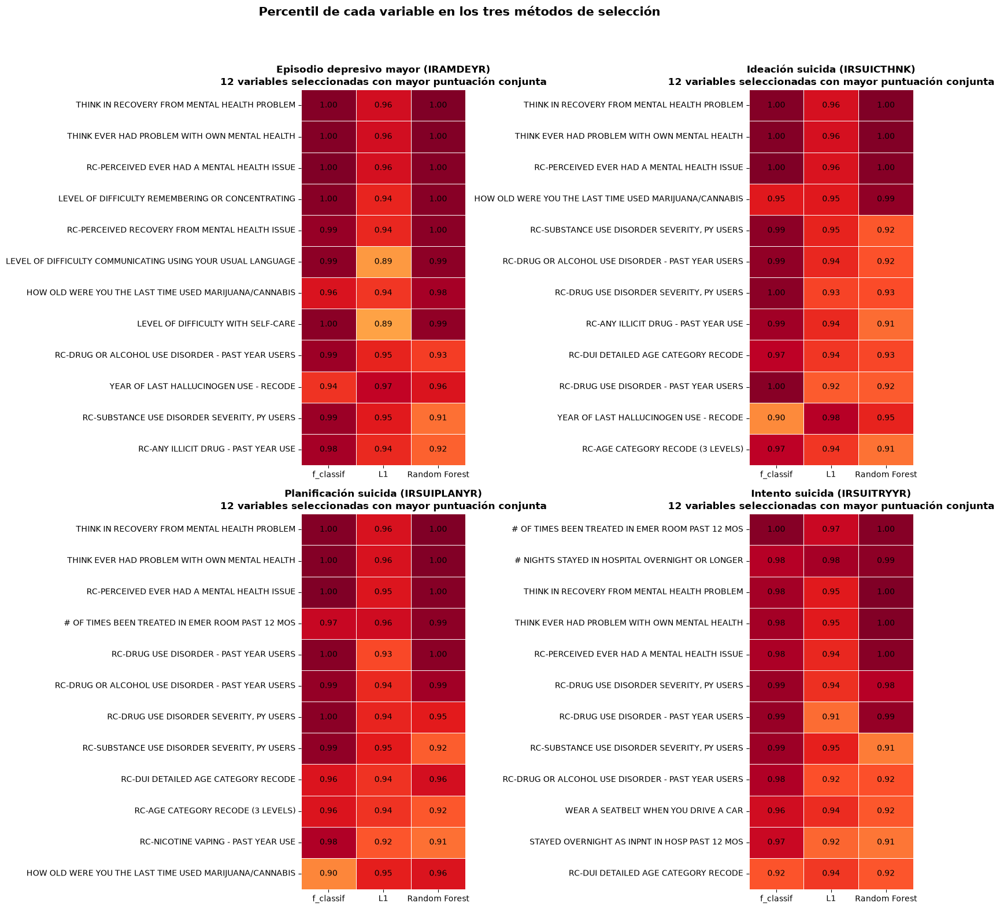

In [30]:
# =============================================================================
# REGLA FINAL COMBINANDO LOS TRES MÉTODOS
# =============================================================================
print('\nREGLA FINAL COMBINANDO LOS TRES MÉTODOS')

ranking_regla_final = ranking_seleccion.copy()
ranking_regla_final['top10_f'] = ranking_regla_final['percentil_f'] >= umbral_top
ranking_regla_final['top10_l1'] = ranking_regla_final['percentil_l1'] >= umbral_top
ranking_regla_final['top10_rf'] = ranking_regla_final['percentil_rf'] >= umbral_top
ranking_regla_final['cumple_regla'] = ranking_regla_final['top10_f'] & (
    ranking_regla_final['top10_l1'] | ranking_regla_final['top10_rf']
)

# -----------------------------------------------------------------------------
# RESUMEN ENTRE TARGETS
# -----------------------------------------------------------------------------
resumen_regla_final = ranking_regla_final.groupby('variable_original', as_index=False).agg(
    puntuacion_media=('puntuacion_conjunta', 'mean'),
    puntuacion_max=('puntuacion_conjunta', 'max'),
    targets_f=('top10_f', 'sum'),
    targets_l1=('top10_l1', 'sum'),
    targets_rf=('top10_rf', 'sum'),
    targets_regla_final=('cumple_regla', 'sum')
).sort_values(
    ['targets_regla_final', 'puntuacion_max'], ascending=False
).reset_index(drop=True)

vars_seleccion_regla = resumen_regla_final.loc[
    resumen_regla_final['targets_regla_final'].ge(1), 'variable_original'
].tolist()

n_numericas_regla = sum(v in vars_numericas_modelado for v in vars_seleccion_regla)
n_categoricas_regla = sum(v in vars_categoricas_originales_modelado for v in vars_seleccion_regla)

comparacion_final_criterios = pd.DataFrame({
    'criterio': [
        '≥2 de 3 métodos con percentiles globales',
        '≥2 de 3 métodos con percentiles por tipo',
        'f_classif + L1 o RF'
    ],
    'n_variables': [
        len(vars_seleccion),
        len(vars_seleccion_tipo_variable),
        len(vars_seleccion_regla)
    ],
    'n_numericas': [
        sum(v in vars_numericas_modelado for v in vars_seleccion),
        sum(v in vars_numericas_modelado for v in vars_seleccion_tipo_variable),
        n_numericas_regla
    ],
    'n_categoricas': [
        sum(v in vars_categoricas_originales_modelado for v in vars_seleccion),
        sum(v in vars_categoricas_originales_modelado for v in vars_seleccion_tipo_variable),
        n_categoricas_regla
    ]
})

comparacion_final_criterios['pct_sobre_813'] = (
    comparacion_final_criterios['n_variables'] / len(vars_predictoras_modelado) * 100
)

tabla_comparacion_final = preparar_tabla(
    comparacion_final_criterios, redondeo={'pct_sobre_813': 1}
)

print('\nComparación de criterios:')
display(tabla_comparacion_final)

# -----------------------------------------------------------------------------
# TARGETS EN LOS QUE CADA VARIABLE CUMPLE LA REGLA
# -----------------------------------------------------------------------------
targets_regla = ranking_regla_final[ranking_regla_final['cumple_regla']].groupby(
    'variable_original'
)['target'].apply(lambda x: ', '.join(x)).rename('targets_regla_detalle').reset_index()

seleccion_regla = resumen_regla_final[
    resumen_regla_final['targets_regla_final'].ge(1)
].merge(targets_regla, on='variable_original', how='left')

tabla_seleccion_regla = seleccion_regla.head(30).copy()
tabla_seleccion_regla.insert(
    1, 'nombre', tabla_seleccion_regla['variable_original'].map(nombre_variable)
)
tabla_seleccion_regla = preparar_tabla(
    tabla_seleccion_regla, redondeo={'puntuacion_media': 3, 'puntuacion_max': 3}
)

print('\nVariables mejor posicionadas que cumplen la regla final:')
display(tabla_seleccion_regla)

# -----------------------------------------------------------------------------
# RESUMEN POR TARGET
# -----------------------------------------------------------------------------
resumen_regla_target = ranking_regla_final.groupby('target').agg(
    variables_f=('top10_f', 'sum'),
    variables_l1=('top10_l1', 'sum'),
    variables_rf=('top10_rf', 'sum'),
    variables_regla_final=('cumple_regla', 'sum')
).reset_index()

tabla_resumen_regla_target = preparar_tabla(resumen_regla_target)

print('\nResumen por variable objetivo:')
display(tabla_resumen_regla_target)

# -----------------------------------------------------------------------------
# COMPARACIÓN VISUAL DE LOS MÉTODOS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
axes = axes.ravel()

for ax, target in zip(axes, targets):
    df_plot = ranking_regla_final[
        ranking_regla_final['target'].eq(target) & ranking_regla_final['cumple_regla']
    ].sort_values('puntuacion_conjunta', ascending=False).head(12)

    matriz_plot = df_plot.set_index('variable_original')[[
        'percentil_f', 'percentil_l1', 'percentil_rf'
    ]]
    matriz_plot.columns = ['f_classif', 'L1', 'Random Forest']
    matriz_plot = matriz_plot.rename(index={v: nombre_variable(v) for v in matriz_plot.index})

    sns.heatmap(
        matriz_plot, annot=True, fmt='.2f', cmap=cmap_secuencial, vmin=0.80, vmax=1,
        cbar=False, linewidths=0.5, annot_kws={'color': 'black'}, ax=ax
    )

    ax.set_title(
        f'{titulos_targets[target]} ({target})\n'
        '12 variables seleccionadas con mayor puntuación conjunta', weight='bold'
    )
    ax.set_xlabel('')
    ax.set_ylabel('')

fig.suptitle(
    'Percentil de cada variable en los tres métodos de selección', fontsize=15, weight='bold'
)

_ = guardar_figura(fig, '03_comparacion_metodos_seleccion', rect=[0, 0, 1, 0.95])

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(seleccion_regla, '32_regla_final_tres_metodos_seleccion')
_ = guardar_csv(comparacion_final_criterios, '33_comparacion_criterios_seleccion')

### Resultados

La regla combinada proporciona una solución considerablemente más equilibrada que los dos criterios evaluados anteriormente. La condición basada en `f_classif` y la coincidencia simultánea con Regresión Logística L1 o Random Forest selecciona **71 de las 813 variables originales**, equivalentes al **8,7 %** del conjunto disponible tras eliminar la información idéntica sin utilizar las variables objetivo.

El conjunto está formado por **8 variables numéricas y 63 categóricas**. Esto supone conservar el 13,6 % de las 59 variables numéricas y el 8,4 % de las 754 categóricas, proporciones mucho más próximas que las obtenidas mediante los percentiles globales (91,5 % frente a 9,2 %) o mediante la normalización independiente por tipo (6,8 % frente a 16,7 %).

La selección mantiene un grupo de variables que cumple la regla para los cuatro targets, entre ellas `CAMHRCVR`, `CAMHPROB`, `CAMHPROB2`, `UD5ILLANY`, `UD5ILALANY`, `SVYRDUDANY` y `SVYRSUDANY`. Al mismo tiempo, conserva variables con mayor especificidad para determinadas variables objetivo, como `NMERTMT2`, que cumple la regla para planificación e intento.

El número de variables que cumple la regla disminuye conforme aumenta el desbalanceo del target: 45 para depresión, 42 para ideación, 34 para planificación y 22 para intento. La unión de los cuatro resultados permite conservar estas diferencias sin exigir que una variable destaque para todas las salidas.

Por tanto, se adopta como regla de selección conservar una variable cuando se sitúa en el 10 % superior según `f_classif` y también según Regresión Logística L1 o Random Forest en al menos uno de los cuatro targets. La regla combina un criterio univariante y dos multivariantes, evita los desequilibrios detectados en las alternativas anteriores y no impone previamente un número concreto de variables.

**Clasificación:** MEMORIA para la regla final y la reducción obtenida; ANEXO para los rankings completos y la comparación de criterios.

## 3.12. Aplicación de la regla final de selección

Una vez comparados los distintos criterios se aplica la regla definida en el apartado anterior. Se conservan las variables situadas en el 10 % superior según `f_classif` que también aparecen en el 10 % superior de Regresión Logística L1 o Random Forest en al menos uno de los cuatro targets.

La regla selecciona 71 de las 813 variables originales disponibles tras eliminar la información idéntica. Para las variables numéricas se mantienen conjuntamente su valor numérico y la variable de estado asociada, mientras que las variables categóricas conservan su representación original.

El conjunto resultante constituye la selección obtenida mediante los tres métodos, pero todavía no es el conjunto definitivo de modelado. Antes de fijarlo se realizará una última revisión de información repetida entre las variables categóricas seleccionadas.

La selección se ha realizado exclusivamente utilizando TRAIN. TEST permanece fuera de cualquier decisión de selección, transformación aprendida o ajuste de modelos.

In [31]:
# =============================================================================
# APLICACIÓN DE LA REGLA FINAL DE SELECCIÓN
# =============================================================================
print('\nAPLICACIÓN DE LA REGLA FINAL DE SELECCIÓN')

# -----------------------------------------------------------------------------
# VARIABLES SELECCIONADAS
# -----------------------------------------------------------------------------
vars_seleccion_metodos = vars_seleccion_regla.copy()
vars_numericas_seleccion_metodos = [
    v for v in vars_numericas_modelado if v in vars_seleccion_metodos
]
vars_categoricas_seleccion_metodos = [
    v for v in vars_categoricas_originales_modelado if v in vars_seleccion_metodos
]
vars_estado_seleccion_metodos = [f'{v}_estado' for v in vars_numericas_seleccion_metodos]

print(f'\nVariables originales antes de la selección: {len(vars_predictoras_modelado)}')
print(f'Variables originales seleccionadas: {len(vars_seleccion_metodos)}')
print(f'Variables numéricas: {len(vars_numericas_seleccion_metodos)}')
print(f'Variables categóricas: {len(vars_categoricas_seleccion_metodos)}')

# -----------------------------------------------------------------------------
# DATOS SELECCIONADOS
# -----------------------------------------------------------------------------
X_train_seleccion_metodos = pd.concat([
    X_train_num[vars_numericas_seleccion_metodos],
    X_train[vars_categoricas_seleccion_metodos],
    X_train_estado[vars_estado_seleccion_metodos]
], axis=1)

X_test_seleccion_metodos = pd.concat([
    X_test_num[vars_numericas_seleccion_metodos],
    X_test[vars_categoricas_seleccion_metodos],
    X_test_estado[vars_estado_seleccion_metodos]
], axis=1)

# -----------------------------------------------------------------------------
# TRAZABILIDAD
# -----------------------------------------------------------------------------
seleccion_metodos = seleccion_regla.merge(
    estructura_predictores[['variable', 'modulo', 'tipo_variable']], left_on='variable_original',
    right_on='variable', how='left'
).drop(columns='variable')

seleccion_metodos = seleccion_metodos.sort_values(
    ['targets_regla_final', 'puntuacion_max'], ascending=False
).reset_index(drop=True)

resumen_seleccion_metodos = pd.DataFrame({
    'concepto': [
        'Variables originales antes de selección',
        'Variables originales seleccionadas',
        'Porcentaje conservado',
        'Reducción de variables originales',
        'Variables numéricas',
        'Variables categóricas',
        'Variables de entrada'
    ],
    'valor': [
        len(vars_predictoras_modelado),
        len(vars_seleccion_metodos),
        len(vars_seleccion_metodos) / len(vars_predictoras_modelado) * 100,
        (1 - len(vars_seleccion_metodos) / len(vars_predictoras_modelado)) * 100,
        len(vars_numericas_seleccion_metodos),
        len(vars_categoricas_seleccion_metodos),
        X_train_seleccion_metodos.shape[1]
    ]
})

tabla_resumen_seleccion_metodos = preparar_tabla(resumen_seleccion_metodos, redondeo={'valor': 1})

print('\nResumen de la selección:')
display(tabla_resumen_seleccion_metodos)

tabla_seleccion_metodos = seleccion_metodos.head(25)[[
    'variable_original', 'modulo', 'tipo_variable', 'puntuacion_media', 'puntuacion_max',
    'targets_regla_final', 'targets_regla_detalle'
]].copy()

tabla_seleccion_metodos.insert(
    1, 'nombre', tabla_seleccion_metodos['variable_original'].map(nombre_variable)
)
tabla_seleccion_metodos = preparar_tabla(
    tabla_seleccion_metodos, redondeo={'puntuacion_media': 3, 'puntuacion_max': 3}
)

print('\nVariables seleccionadas con mayor puntuación:')
display(tabla_seleccion_metodos)

# -----------------------------------------------------------------------------
# COMPROBACIÓN
# -----------------------------------------------------------------------------
comprobaciones_seleccion_metodos = pd.DataFrame({
    'comprobacion': [
        '71 variables originales seleccionadas',
        'Todas las variables proceden del conjunto de 813',
        'Mismas variables de entrada en TRAIN y TEST',
        'Ninguna variable objetivo incluida',
        'IRWRKSTAT continúa excluido',
        'Cada numérica conserva su variable de estado',
        '79 variables de entrada'
    ],
    'resultado': [
        len(vars_seleccion_metodos) == 71,
        set(vars_seleccion_metodos).issubset(vars_predictoras_modelado),
        X_train_seleccion_metodos.columns.equals(X_test_seleccion_metodos.columns),
        set(targets).isdisjoint(vars_seleccion_metodos),
        'IRWRKSTAT' not in vars_seleccion_metodos,
        all(f'{v}_estado' in X_train_seleccion_metodos.columns
            for v in vars_numericas_seleccion_metodos),
        X_train_seleccion_metodos.shape[1] == 79
    ]
})

tabla_comprobaciones_seleccion_metodos = preparar_tabla(comprobaciones_seleccion_metodos)

print('\nComprobaciones:')
display(tabla_comprobaciones_seleccion_metodos)

if not comprobaciones_seleccion_metodos['resultado'].all():
    raise ValueError('La selección mediante los tres métodos no supera todas las comprobaciones.')

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(seleccion_metodos, '34_variables_seleccionadas_tres_metodos')
_ = guardar_csv(resumen_seleccion_metodos, '35_resumen_seleccion_tres_metodos')


APLICACIÓN DE LA REGLA FINAL DE SELECCIÓN

Variables originales antes de la selección: 813
Variables originales seleccionadas: 71
Variables numéricas: 8
Variables categóricas: 63

Resumen de la selección:


,Concepto,Valor
0,Variables originales antes de selección,813.0
1,Variables originales seleccionadas,71.0
2,Porcentaje conservado,8.7
3,Reducción de variables originales,91.3
4,Variables numéricas,8.0
5,Variables categóricas,63.0
6,Variables de entrada,79.0



Variables seleccionadas con mayor puntuación:


,Variable original,Nombre,Módulo,Tipo de variable,Puntuación media,Puntuación máxima,Variables objetivo que cumplen la regla,Detalle de variables objetivo
0,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,EMERGING ISSUES,Categórica con pocas categorías,0.984,0.986,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
1,CAMHPROB,THINK EVER HAD PROBLEM WITH OWN MENTAL HEALTH,EMERGING ISSUES,Categórica con pocas categorías,0.984,0.986,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
2,CAMHPROB2,RC-PERCEIVED EVER HAD A MENTAL HEALTH ISSUE,RECODED EMERGING ISSUES,Binaria,0.982,0.986,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
3,UD5ILLANY,RC-DRUG USE DISORDER - PAST YEAR USERS,RECODED SUBSTANCE USE DISORDER,Binaria,0.956,0.973,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
4,UD5ILALANY,RC-DRUG OR ALCOHOL USE DISORDER - PAST YEAR USERS,RECODED SUBSTANCE USE DISORDER,Binaria,0.956,0.973,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
5,SVYRDUDANY,"RC-DRUG USE DISORDER SEVERITY, PY USERS",RECODED SUBSTANCE USE DISORDER,Categórica con pocas categorías,0.957,0.968,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
6,SVYRSUDANY,"RC-SUBSTANCE USE DISORDER SEVERITY, PY USERS",RECODED SUBSTANCE USE DISORDER,Categórica con pocas categorías,0.951,0.954,4,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR, IRSUITRYYR"
7,LVLDIFMEM2,LEVEL OF DIFFICULTY REMEMBERING OR CONCENTRATING,DEMOGRAPHICS,Categórica con pocas categorías,0.929,0.979,3,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR"
8,MRJAGLST,HOW OLD WERE YOU THE LAST TIME USED MARIJUANA/...,PRIOR SUBSTANCE USE,Numérica con rango documentado,0.934,0.966,3,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR"
9,LVLDIFCOMM2,LEVEL OF DIFFICULTY COMMUNICATING USING YOUR U...,DEMOGRAPHICS,Categórica con pocas categorías,0.922,0.960,3,"IRAMDEYR, IRSUICTHNK, IRSUIPLANYR"



Comprobaciones:


,Comprobación,Resultado
0,71 variables originales seleccionadas,True
1,Todas las variables proceden del conjunto de 813,True
2,Mismas variables de entrada en TRAIN y TEST,True
3,Ninguna variable objetivo incluida,True
4,IRWRKSTAT continúa excluido,True
5,Cada numérica conserva su variable de estado,True
6,79 variables de entrada,True


### Resultados

La regla de selección conserva 71 de las 813 variables originales disponibles tras eliminar la información idéntica, equivalentes al 8,7 % del conjunto inicial de esta fase. La reducción alcanza, por tanto, el 91,3 % de las variables originales.

El conjunto seleccionado está formado por 8 variables numéricas y 63 categóricas. Al mantener para cada variable numérica tanto su valor numérico como la variable de estado asociada, la representación resultante contiene 79 variables de entrada antes de aplicar One-Hot Encoding.

Todas las comprobaciones resultan correctas: las 71 variables proceden del conjunto validado de 813, TRAIN y TEST conservan exactamente la misma estructura, ninguna variable objetivo se incorpora entre las variables de entrada, `IRWRKSTAT` permanece excluida y las ocho variables numéricas conservan su correspondiente variable de estado.

Este conjunto representa el resultado de la selección mediante los tres métodos, pero todavía no constituye el conjunto definitivo de modelado. En los apartados siguientes se revisará la información repetida entre las 63 variables categóricas antes de fijar las 59 variables originales finales.

**Clasificación:** MEMORIA para la regla de selección y la reducción 813 → 71; ANEXO para la tabla completa de variables seleccionadas y las comprobaciones de trazabilidad.

## 3.13. Revisión de información repetida entre variables categóricas seleccionadas

Una vez definido el conjunto de 71 variables originales obtenido mediante los tres métodos se realiza una última revisión de información repetida entre las 63 variables categóricas seleccionadas.

La relación entre cada pareja se cuantifica mediante la V de Cramér, siguiendo la metodología utilizada previamente en el módulo de Machine Learning. El análisis se limita al conjunto seleccionado, ya que evaluar todas las combinaciones de las variables categóricas iniciales supondría un coste computacional elevado sin aportar información directamente aplicable al conjunto que llegará al modelado.

Las relaciones elevadas se utilizan únicamente como señal de revisión y no implican una eliminación automática. Dos variables pueden presentar una relación muy elevada y, sin embargo, conservar diferentes niveles de detalle. Las variables exactamente idénticas ya fueron revisadas de forma independiente antes de iniciar la selección.

La comprobación se realiza exclusivamente con TRAIN y no utiliza ninguna de las variables objetivo.


REVISIÓN DE INFORMACIÓN REPETIDA ENTRE VARIABLES CATEGÓRICAS SELECCIONADAS



Variables categóricas evaluadas: 63
Parejas evaluadas: 1,953
Parejas con V de Cramér ≥ 0.90: 41

Relaciones de mayor magnitud:


,Variable 1,Nombre 1,Variable 2,Nombre 2,V de Cramér
0,PREGST,RC-PREGNANCY STATUS OF FEMALES AGED 12-50,PREGSTAT,CURRENTLY PREGNANT (FEMALES AGED 12-50),1.0
1,CATAGE,RC-AGE CATEGORY,DRVINAGE,RC-DUI AGE CATEGORY RECODE,1.0
2,CATAG3,RC-AGE CATEGORY RECODE (5 LEVELS),CATAGE,RC-AGE CATEGORY,1.0
3,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,RCVYMHPRB,RC-PERCEIVED RECOVERY FROM MENTAL HEALTH ISSUE,1.0
4,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),CATAGE,RC-AGE CATEGORY,1.0
5,CATAG3,RC-AGE CATEGORY RECODE (5 LEVELS),DRVINAGE,RC-DUI AGE CATEGORY RECODE,1.0
6,DRVINAGE,RC-DUI AGE CATEGORY RECODE,SEXAGE,RC-COMBINED SEX BY AGE CATEGORY INDICATOR,1.0
7,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),DRVINAGE,RC-DUI AGE CATEGORY RECODE,1.0
8,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),DRVINDETAG,RC-DUI DETAILED AGE CATEGORY RECODE,1.0
9,MRJYDAYS,RC-# OF DAYS USED MARIJUANA IN PAST YEAR,MRJYR,RC-MARIJUANA - PAST YEAR USE,1.0


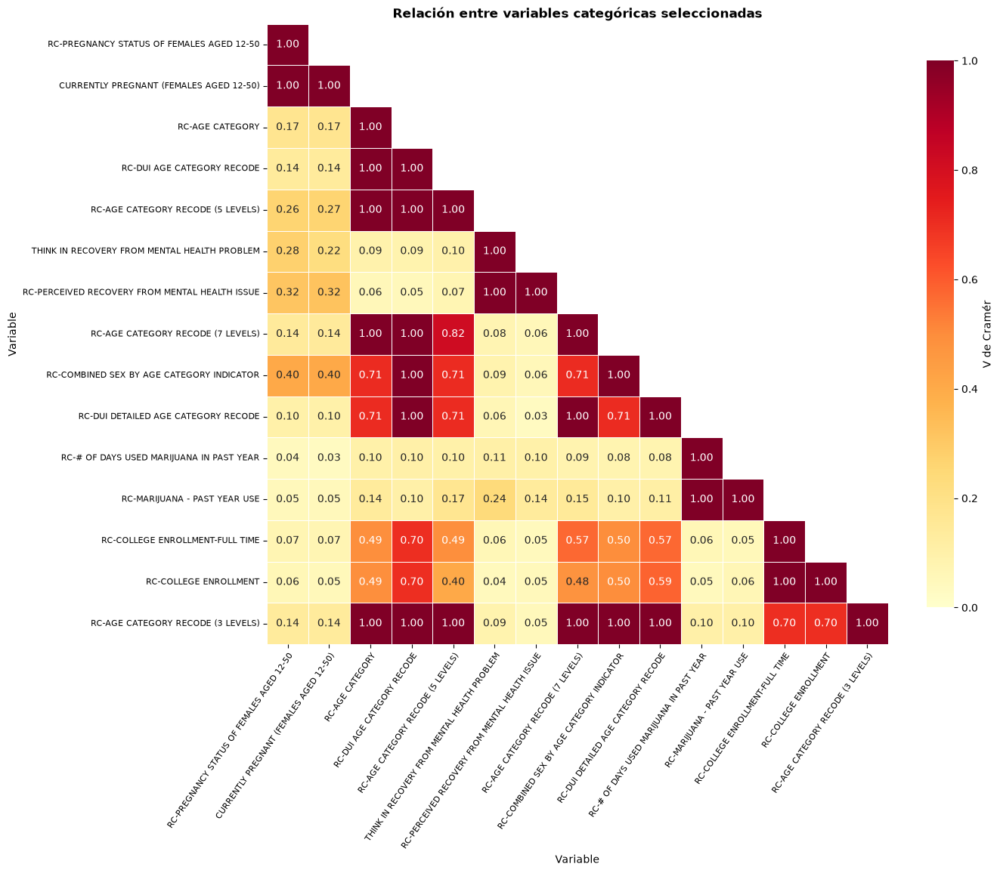

In [32]:
# =============================================================================
# REVISIÓN DE INFORMACIÓN REPETIDA ENTRE VARIABLES CATEGÓRICAS SELECCIONADAS
# =============================================================================
print('\nREVISIÓN DE INFORMACIÓN REPETIDA ENTRE VARIABLES CATEGÓRICAS SELECCIONADAS')

umbral_cramer = 0.90
filas_cramer = []

for i, v1 in enumerate(vars_categoricas_seleccion_metodos):
    for v2 in vars_categoricas_seleccion_metodos[i + 1:]:
        filas_cramer.append({
            'variable_1': v1,
            'variable_2': v2,
            'v_cramer': v_cramer(X_train[v1], X_train[v2])
        })

relaciones_cramer_seleccion = pd.DataFrame(filas_cramer).sort_values(
    'v_cramer', ascending=False
).reset_index(drop=True)

relaciones_cramer_altas = relaciones_cramer_seleccion[
    relaciones_cramer_seleccion['v_cramer'] >= umbral_cramer
].copy()

print(f'\nVariables categóricas evaluadas: {len(vars_categoricas_seleccion_metodos)}')
print(f'Parejas evaluadas: {len(relaciones_cramer_seleccion):,}')
print(f'Parejas con V de Cramér ≥ {umbral_cramer:.2f}: {len(relaciones_cramer_altas):,}')

tabla_cramer = relaciones_cramer_seleccion.head(20).copy()
tabla_cramer.insert(1, 'nombre_1', tabla_cramer['variable_1'].map(nombre_variable))
tabla_cramer.insert(3, 'nombre_2', tabla_cramer['variable_2'].map(nombre_variable))
tabla_cramer = preparar_tabla(tabla_cramer, redondeo=3)

print('\nRelaciones de mayor magnitud:')
display(tabla_cramer)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(relaciones_cramer_seleccion, '36_relaciones_categoricas_seleccion')

# -----------------------------------------------------------------------------
# REPRESENTACIÓN GRÁFICA
# -----------------------------------------------------------------------------
vars_cramer_plot = pd.unique(
    relaciones_cramer_seleccion[['variable_1', 'variable_2']].values.ravel()
).tolist()[:15]

matriz_cramer = pd.DataFrame(
    np.eye(len(vars_cramer_plot)), index=vars_cramer_plot, columns=vars_cramer_plot
)

for i, v1 in enumerate(vars_cramer_plot):
    for v2 in vars_cramer_plot[i + 1:]:
        matriz_cramer.loc[v1, v2] = matriz_cramer.loc[v2, v1] = v_cramer(X_train[v1], X_train[v2])

etiquetas_cramer = {v: nombre_variable(v) for v in vars_cramer_plot}
matriz_cramer = matriz_cramer.rename(index=etiquetas_cramer, columns=etiquetas_cramer)
mascara_cramer = np.triu(np.ones_like(matriz_cramer, dtype=bool), k=1)

fig, ax = plt.subplots(figsize=(14, 12))

sns.heatmap(
    matriz_cramer, annot=True, fmt='.2f', cmap=cmap_secuencial, vmin=0, vmax=1,
    mask=mascara_cramer, linewidths=0.5, linecolor='white', square=True,
    cbar_kws={'label': 'V de Cramér', 'shrink': 0.80}, ax=ax
)

ax.set_title('Relación entre variables categóricas seleccionadas', weight='bold')
ax.set_xlabel('Variable')
ax.set_ylabel('Variable')
ax.tick_params(axis='x', labelrotation=55, labelsize=8)
ax.tick_params(axis='y', labelrotation=0, labelsize=8)
plt.setp(ax.get_xticklabels(), ha='right', rotation_mode='anchor')

_ = guardar_figura(fig, '04_relaciones_categoricas_seleccion')

### Resultados

La revisión de las 63 variables categóricas seleccionadas evalúa 1.953 parejas y detecta 41 relaciones con una V de Cramér igual o superior a 0,90. La representación gráfica muestra que estas relaciones elevadas se concentran principalmente en grupos de variables que representan diferentes versiones o niveles de detalle de una misma información.

Destaca especialmente el bloque relacionado con la edad. `CATAGE`, `CATAG2`, `CATAG3`, `CATAG7`, `DRVINAGE`, `DRVINDETAG` y `SEXAGE` presentan numerosas relaciones iguales o próximas a 1. La documentación oficial identifica varias de ellas como recodificaciones construidas a partir de la misma información de edad, aunque utilizando diferentes agrupaciones. Por tanto, una V de Cramér igual a 1 no implica necesariamente que dos variables sean idénticas, ya que una representación más detallada puede determinar completamente otra más agregada.

También aparecen relaciones perfectas entre variables originales y sus versiones recodificadas o entre indicadores con diferente nivel de detalle. Entre ellas se encuentran `PREGSTAT`–`PREGST` y `CAMHPROB`–`CAMHPROB2`.

Otras relaciones, como `ENRLCOLLFT2`–`ENRLCOLLST2`, tampoco corresponden a variables idénticas: ambas proceden de información relacionada, pero una conserva un mayor nivel de detalle. De forma similar, las variables de gravedad de los trastornos por consumo pueden contener más información que sus correspondientes indicadores binarios.

Por tanto, las 41 relaciones elevadas no provocan ninguna eliminación automática. En el siguiente apartado se comprobará si corresponden a equivalencias bidireccionales, relaciones exactas en una sola dirección o relaciones elevadas sin determinación completa.

**Clasificación:** MEMORIA para indicar que se revisó la información repetida entre las variables categóricas seleccionadas; ANEXO para las relaciones completas y la representación gráfica.

## 3.14. Clasificación de las relaciones categóricas elevadas

Las relaciones elevadas identificadas mediante V de Cramér pueden corresponder a situaciones diferentes. Dos variables pueden ser equivalentes, de forma que cada categoría de una determine exactamente una categoría de la otra, o presentar una relación jerárquica en la que una variable más detallada permita reconstruir otra más agregada.

Esta distinción es especialmente relevante en NSDUH, donde existen numerosas variables recodificadas construidas a partir de preguntas originales o de otras variables preparadas para análisis.

Para evitar eliminar información de forma automática se comprueba la dirección de las relaciones con V de Cramér igual o superior a 0,90. El análisis distingue entre equivalencias bidireccionales, relaciones exactas en una única dirección y relaciones elevadas sin determinación exacta.

La comprobación utiliza únicamente TRAIN y las relaciones ya calculadas, por lo que no requiere volver a ajustar ningún modelo.

In [33]:
# =============================================================================
# CLASIFICACIÓN DE LAS RELACIONES CATEGÓRICAS ELEVADAS
# =============================================================================
print('\nCLASIFICACIÓN DE LAS RELACIONES CATEGÓRICAS ELEVADAS')

relaciones_cramer = relaciones_cramer_altas.copy()
relaciones_cramer['nombre_1'] = relaciones_cramer['variable_1'].map(nombre_variable)
relaciones_cramer['nombre_2'] = relaciones_cramer['variable_2'].map(nombre_variable)

relaciones_cramer['n_categorias_1'] = relaciones_cramer['variable_1'].map(
    lambda v: X_train[v].nunique(dropna=False)
)
relaciones_cramer['n_categorias_2'] = relaciones_cramer['variable_2'].map(
    lambda v: X_train[v].nunique(dropna=False)
)

relaciones_cramer['tipo_relacion'] = relaciones_cramer.apply(
    lambda fila: relacion_categorica(fila['variable_1'], fila['variable_2']), axis=1
)
relaciones_cramer['relacion'] = relaciones_cramer.apply(descripcion_relacion, axis=1)

tabla_tipos_relacion = relaciones_cramer['tipo_relacion'].value_counts().rename_axis(
    'tipo_relacion'
).reset_index(name='parejas')

tabla_tipos_relacion = preparar_tabla(tabla_tipos_relacion)

print('\nTipos de relación:')
display(tabla_tipos_relacion)

tabla_relaciones_cramer = preparar_tabla(
    relaciones_cramer[[
        'variable_1', 'nombre_1', 'variable_2', 'nombre_2', 'v_cramer', 'n_categorias_1',
        'n_categorias_2', 'relacion'
    ]],
    redondeo={'v_cramer': 3}
)

print('\nRelaciones con V de Cramér elevada:')
display(tabla_relaciones_cramer)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(relaciones_cramer, '37_relaciones_categoricas_elevadas')


CLASIFICACIÓN DE LAS RELACIONES CATEGÓRICAS ELEVADAS



Tipos de relación:


,Tipo de relación,Parejas
0,"Relación alta, pero no exacta",20
1,Variable 1 determina variable 2,11
2,Variable 2 determina variable 1,9
3,Equivalencia bidireccional,1



Relaciones con V de Cramér elevada:


,Variable 1,Nombre 1,Variable 2,Nombre 2,V de Cramér,Categorías variable 1,Categorías variable 2,Relación
0,PREGST,RC-PREGNANCY STATUS OF FEMALES AGED 12-50,PREGSTAT,CURRENTLY PREGNANT (FEMALES AGED 12-50),1.000,4,7,CURRENTLY PREGNANT (FEMALES AGED 12-50) determ...
1,CATAGE,RC-AGE CATEGORY,DRVINAGE,RC-DUI AGE CATEGORY RECODE,1.000,3,2,RC-AGE CATEGORY determina RC-DUI AGE CATEGORY ...
2,CATAG3,RC-AGE CATEGORY RECODE (5 LEVELS),CATAGE,RC-AGE CATEGORY,1.000,4,3,RC-AGE CATEGORY RECODE (5 LEVELS) determina RC...
3,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,RCVYMHPRB,RC-PERCEIVED RECOVERY FROM MENTAL HEALTH ISSUE,1.000,7,3,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM d...
4,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),CATAGE,RC-AGE CATEGORY,1.000,4,3,RC-AGE CATEGORY RECODE (7 LEVELS) determina RC...
5,CATAG3,RC-AGE CATEGORY RECODE (5 LEVELS),DRVINAGE,RC-DUI AGE CATEGORY RECODE,1.000,4,2,RC-AGE CATEGORY RECODE (5 LEVELS) determina RC...
6,DRVINAGE,RC-DUI AGE CATEGORY RECODE,SEXAGE,RC-COMBINED SEX BY AGE CATEGORY INDICATOR,1.000,2,3,RC-COMBINED SEX BY AGE CATEGORY INDICATOR dete...
7,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),DRVINAGE,RC-DUI AGE CATEGORY RECODE,1.000,4,2,RC-AGE CATEGORY RECODE (7 LEVELS) determina RC...
8,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),DRVINDETAG,RC-DUI DETAILED AGE CATEGORY RECODE,1.000,4,3,RC-AGE CATEGORY RECODE (7 LEVELS) determina RC...
9,MRJYDAYS,RC-# OF DAYS USED MARIJUANA IN PAST YEAR,MRJYR,RC-MARIJUANA - PAST YEAR USE,1.000,6,2,RC-# OF DAYS USED MARIJUANA IN PAST YEAR deter...


### Resultados

De las 41 relaciones categóricas con V de Cramér igual o superior a 0,90, 20 corresponden a relaciones elevadas sin determinación exacta y 21 presentan una relación exacta en una o en ambas direcciones.

Dentro de estas últimas se identifica una equivalencia bidireccional entre `CATAG2` y `DRVINAGE`. El resto corresponde principalmente a relaciones jerárquicas en las que una variable con mayor nivel de detalle determina otra más agregada. Este comportamiento aparece especialmente en las diferentes recodificaciones relacionadas con la edad, como `CATAGE`, `CATAG3`, `CATAG7`, `DRVINAGE`, `DRVINDETAG` y `SEXAGE`.

También aparecen relaciones exactas entre variables originales y sus correspondientes recodificaciones, como `PREGSTAT`–`PREGST`, `CAMHPROB`–`CAMHPROB2` y `CAMHRCVR`–`RCVYMHPRB`, así como entre indicadores de gravedad y variables binarias de trastorno por consumo.

Las restantes relaciones elevadas se concentran principalmente en variables relacionadas con consumo de marihuana, drogas ilícitas, utilización de servicios e indicadores de salud. Aunque presentan valores elevados de V de Cramér, no existe una determinación exacta, por lo que no se consideran información repetida de forma automática.

La revisión confirma que una relación elevada no es suficiente para eliminar una variable. Las relaciones exactas se revisarán individualmente para identificar qué representación conviene conservar atendiendo a su nivel de detalle, interpretación y finalidad analítica.

**Clasificación:** ANEXO para el detalle completo de las relaciones; MEMORIA para indicar que la información repetida categórica se revisó mediante V de Cramér y relaciones exactas.

## 3.15. Revisión de relaciones exactas entre variables

Las relaciones exactas identificadas se revisan conjuntamente con los resultados obtenidos durante la selección mediante los tres métodos. El objetivo es evitar conservar simultáneamente varias representaciones de la misma información cuando una de ellas puede determinar completamente a otra.

Para cada pareja se comparan el número de categorías, el número de targets para los que cada variable cumple la regla de selección y su puntuación conjunta máxima. En las relaciones unidireccionales se identifica además qué variable contiene la representación determinante y cuál puede obtenerse completamente a partir de ella.

Esta revisión no modifica todavía el conjunto de variables de entrada. Su finalidad es disponer de una tabla trazable que permita decidir qué variables deben conservarse antes de fijar definitivamente el conjunto utilizado durante el modelado.

In [34]:
# =============================================================================
# REVISIÓN DE LAS RELACIONES EXACTAS ENTRE VARIABLES
# =============================================================================
print('\nREVISIÓN DE LAS RELACIONES EXACTAS ENTRE VARIABLES')

relaciones_exactas = relaciones_cramer[
    relaciones_cramer['tipo_relacion'] != 'Relación alta, pero no exacta'
].copy()

datos_seleccion = seleccion_metodos[[
    'variable_original', 'puntuacion_max', 'targets_regla_final', 'targets_regla_detalle'
]].copy()

datos_seleccion_1 = datos_seleccion.add_suffix('_1').rename(
    columns={'variable_original_1': 'variable_1'}
)
datos_seleccion_2 = datos_seleccion.add_suffix('_2').rename(
    columns={'variable_original_2': 'variable_2'}
)

relaciones_exactas = relaciones_exactas.merge(
    datos_seleccion_1, on='variable_1', how='left'
).merge(
    datos_seleccion_2, on='variable_2', how='left'
)

relaciones_exactas[['variable_determinante', 'variable_determinada']] = relaciones_exactas.apply(
    variables_relacion, axis=1
)

relaciones_exactas['nombre_determinante'] = relaciones_exactas['variable_determinante'].map(
    lambda v: nombre_variable(v) if pd.notna(v) else ''
)
relaciones_exactas['nombre_determinada'] = relaciones_exactas['variable_determinada'].map(
    lambda v: nombre_variable(v) if pd.notna(v) else ''
)

relaciones_exactas['revision'] = np.where(
    relaciones_exactas['tipo_relacion'].eq('Equivalencia bidireccional'),
    'Elegir una de las dos', 'Revisar posible retirada de la variable determinada'
)

print(f'\nRelaciones exactas: {len(relaciones_exactas)}')

tabla_relaciones_detalle = preparar_tabla(
    relaciones_exactas[[
        'variable_1', 'nombre_1', 'variable_2', 'nombre_2', 'v_cramer', 'n_categorias_1',
        'n_categorias_2', 'targets_regla_final_1', 'targets_regla_final_2', 'puntuacion_max_1',
        'puntuacion_max_2', 'variable_determinante', 'variable_determinada', 'relacion', 'revision'
    ]],
    redondeo={'v_cramer': 3, 'puntuacion_max_1': 3, 'puntuacion_max_2': 3}
)

print('\nRelaciones a revisar:')
mostrar_tabla_completa(tabla_relaciones_detalle)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(relaciones_exactas, '38_revision_relaciones_exactas')


REVISIÓN DE LAS RELACIONES EXACTAS ENTRE VARIABLES

Relaciones exactas: 21

Relaciones a revisar:


,Variable 1,Nombre 1,Variable 2,Nombre 2,V de Cramér,Categorías variable 1,Categorías variable 2,Variables objetivo V1,Variables objetivo V2,Puntuación máxima V1,Puntuación máxima V2,variable_determinante,variable_determinada,Relación,Revisión
0,PREGST,RC-PREGNANCY STATUS OF FEMALES AGED 12-50,PREGSTAT,CURRENTLY PREGNANT (FEMALES AGED 12-50),1.0,4,7,1,1,0.909,0.908,PREGSTAT,PREGST,CURRENTLY PREGNANT (FEMALES AGED 12-50) determina RC-PREGNANCY STATUS OF FEMALES AGED 12-50,Revisar posible retirada de la variable determinada
1,CATAGE,RC-AGE CATEGORY,DRVINAGE,RC-DUI AGE CATEGORY RECODE,1.0,3,2,2,3,0.938,0.938,CATAGE,DRVINAGE,RC-AGE CATEGORY determina RC-DUI AGE CATEGORY RECODE,Revisar posible retirada de la variable determinada
2,CATAG3,RC-AGE CATEGORY RECODE (5 LEVELS),CATAGE,RC-AGE CATEGORY,1.0,4,3,1,2,0.891,0.938,CATAG3,CATAGE,RC-AGE CATEGORY RECODE (5 LEVELS) determina RC-AGE CATEGORY,Revisar posible retirada de la variable determinada
3,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,RCVYMHPRB,RC-PERCEIVED RECOVERY FROM MENTAL HEALTH ISSUE,1.0,7,3,4,2,0.986,0.976,CAMHRCVR,RCVYMHPRB,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM determina RC-PERCEIVED RECOVERY FROM MENTAL HEALTH ISSUE,Revisar posible retirada de la variable determinada
4,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),CATAGE,RC-AGE CATEGORY,1.0,4,3,2,2,0.940,0.938,CATAG7,CATAGE,RC-AGE CATEGORY RECODE (7 LEVELS) determina RC-AGE CATEGORY,Revisar posible retirada de la variable determinada
5,CATAG3,RC-AGE CATEGORY RECODE (5 LEVELS),DRVINAGE,RC-DUI AGE CATEGORY RECODE,1.0,4,2,1,3,0.891,0.938,CATAG3,DRVINAGE,RC-AGE CATEGORY RECODE (5 LEVELS) determina RC-DUI AGE CATEGORY RECODE,Revisar posible retirada de la variable determinada
6,DRVINAGE,RC-DUI AGE CATEGORY RECODE,SEXAGE,RC-COMBINED SEX BY AGE CATEGORY INDICATOR,1.0,2,3,3,3,0.938,0.940,SEXAGE,DRVINAGE,RC-COMBINED SEX BY AGE CATEGORY INDICATOR determina RC-DUI AGE CATEGORY RECODE,Revisar posible retirada de la variable determinada
7,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),DRVINAGE,RC-DUI AGE CATEGORY RECODE,1.0,4,2,2,3,0.940,0.938,CATAG7,DRVINAGE,RC-AGE CATEGORY RECODE (7 LEVELS) determina RC-DUI AGE CATEGORY RECODE,Revisar posible retirada de la variable determinada
8,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),DRVINDETAG,RC-DUI DETAILED AGE CATEGORY RECODE,1.0,4,3,2,3,0.940,0.951,CATAG7,DRVINDETAG,RC-AGE CATEGORY RECODE (7 LEVELS) determina RC-DUI DETAILED AGE CATEGORY RECODE,Revisar posible retirada de la variable determinada
9,MRJYDAYS,RC-# OF DAYS USED MARIJUANA IN PAST YEAR,MRJYR,RC-MARIJUANA - PAST YEAR USE,1.0,6,2,3,2,0.939,0.910,MRJYDAYS,MRJYR,RC-# OF DAYS USED MARIJUANA IN PAST YEAR determina RC-MARIJUANA - PAST YEAR USE,Revisar posible retirada de la variable determinada


### Resultados

La revisión confirma que las 21 relaciones exactas no deben resolverse mediante una única regla automática. La decisión depende de si cada relación corresponde a una recodificación preparada para análisis, a una representación más detallada de la misma información o a una variable que conserva información adicional.

El bloque de edad concentra la mayor cantidad de información repetida. `CATAGE`, `CATAG2`, `CATAG3`, `CATAG7`, `DRVINAGE` y `DRVINDETAG` proceden de distintas agrupaciones de la misma información de edad. Entre ellas se conservará `CATAG7`, que mantiene la representación más detallada considerada adecuada entre las seleccionadas para la población adulta. `SEXAGE` se conserva de forma independiente porque combina sexo y edad y, por tanto, añade información respecto a una agrupación exclusivamente etaria.

Para las variables de embarazo y salud mental se priorizan las versiones recodificadas `PREGST`, `CAMHPROB2` y `RCVYMHPRB`, eliminando sus correspondientes variables fuente `PREGSTAT`, `CAMHPROB` y `CAMHRCVR`.

En consumo de marihuana se mantiene `MRJYDAYS`, que conserva la frecuencia de uso y permite determinar el indicador binario `MRJYR`. De forma análoga, `ENRLCOLLST2` se conserva frente a `ENRLCOLLFT2` por mantener un mayor nivel de detalle sobre la situación de matrícula.

Finalmente, para los trastornos por consumo se conservan `SVYRDUDANY` y `SVYRSUDANY`, ya que distinguen ausencia y distintos niveles de gravedad, mientras que `UD5ILLANY` y `UD5ILALANY` reducen esta información a una clasificación binaria.

En total se identifican 12 variables categóricas cuya retirada permite reducir información repetida sin eliminar ninguno de los grupos de información representados en el conjunto seleccionado.

**Clasificación:** MEMORIA para justificar la eliminación final de información repetida; ANEXO para las relaciones exactas y las decisiones adoptadas.

## 3.16. Eliminación de información repetida y conjunto final para modelado

La revisión documental y estadística de las relaciones exactas permite realizar la última reducción del conjunto de variables antes de iniciar el modelado.

Se eliminan únicamente variables cuya información está contenida en otra representación seleccionada. En las variables recodificadas se priorizan las versiones preparadas para análisis, mientras que en las relaciones jerárquicas se conserva la representación con mayor nivel de detalle cuando resulta conceptualmente adecuada.

En el bloque demográfico se mantiene `CATAG7` como representación principal de la edad y `SEXAGE` como variable combinada de sexo y edad. Se eliminan las restantes agrupaciones de edad seleccionadas para evitar mantener simultáneamente varias codificaciones derivadas de la misma información.

La reducción se aplica de forma idéntica a TRAIN y TEST, sin modificar ningún registro ni utilizar TEST para tomar decisiones. Tras esta operación queda fijado el conjunto definitivo que recibirán todos los modelos posteriores: 59 variables originales, representadas mediante 67 variables de entrada antes del preprocesamiento.

In [35]:
# =============================================================================
# ELIMINACIÓN DE INFORMACIÓN REPETIDA Y CONJUNTO FINAL PARA MODELADO
# =============================================================================
print('\nELIMINACIÓN DE INFORMACIÓN REPETIDA Y CONJUNTO FINAL PARA MODELADO')

decisiones_informacion_repetida = pd.DataFrame([
    ['PREGSTAT', 'PREGST', 'Se conserva la versión recodificada para análisis'],
    ['CATAGE', 'CATAG7', 'Se conserva una única agrupación detallada de edad'],
    ['CATAG2', 'CATAG7', 'Se conserva una única agrupación detallada de edad'],
    ['CATAG3', 'CATAG7', 'Se conserva una única agrupación detallada de edad'],
    ['DRVINAGE', 'CATAG7', 'Recodificación alternativa de la misma edad'],
    ['DRVINDETAG', 'CATAG7', 'Recodificación alternativa de la misma edad'],
    ['CAMHRCVR', 'RCVYMHPRB', 'Se conserva la versión recodificada para análisis'],
    ['MRJYR', 'MRJYDAYS', 'La frecuencia conserva además el indicador de uso'],
    ['ENRLCOLLFT2', 'ENRLCOLLST2', 'Se conserva la situación de matrícula detallada'],
    ['UD5ILLANY', 'SVYRDUDANY', 'La gravedad conserva además el indicador binario'],
    ['UD5ILALANY', 'SVYRSUDANY', 'La gravedad conserva además el indicador binario'],
    ['CAMHPROB', 'CAMHPROB2', 'Se conserva la versión recodificada para análisis']
], columns=['variable_eliminada', 'variable_conservada', 'motivo'])

vars_categoricas_eliminadas = decisiones_informacion_repetida['variable_eliminada'].tolist()

if not set(vars_categoricas_eliminadas).issubset(vars_seleccion_metodos):
    raise ValueError('Alguna variable a eliminar no pertenece al conjunto seleccionado.')

if not set(decisiones_informacion_repetida['variable_conservada']).issubset(vars_seleccion_metodos):
    raise ValueError('Alguna variable conservada no pertenece al conjunto seleccionado.')

# -----------------------------------------------------------------------------
# VARIABLES FINALES
# -----------------------------------------------------------------------------
vars_predictoras_finales = [
    v for v in vars_seleccion_metodos if v not in vars_categoricas_eliminadas
]
vars_numericas_finales = [v for v in vars_numericas_modelado if v in vars_predictoras_finales]
vars_categoricas_originales_finales = [
    v for v in vars_categoricas_originales_modelado if v in vars_predictoras_finales
]
vars_estado_finales = [f'{v}_estado' for v in vars_numericas_finales]
vars_categoricas_finales = vars_categoricas_originales_finales + vars_estado_finales

# -----------------------------------------------------------------------------
# DATOS FINALES
# -----------------------------------------------------------------------------
X_train_final = pd.concat([
    X_train_num[vars_numericas_finales],
    X_train[vars_categoricas_originales_finales],
    X_train_estado[vars_estado_finales]
], axis=1)

X_test_final = pd.concat([
    X_test_num[vars_numericas_finales],
    X_test[vars_categoricas_originales_finales],
    X_test_estado[vars_estado_finales]
], axis=1)

# -----------------------------------------------------------------------------
# TRAZABILIDAD
# -----------------------------------------------------------------------------
# -----------------------------------------------------------------------------
# TRAZABILIDAD
# -----------------------------------------------------------------------------
seleccion_variables_finales = seleccion_metodos[
    seleccion_metodos['variable_original'].isin(vars_predictoras_finales)
].copy().sort_values(
    ['targets_regla_final', 'puntuacion_max'], ascending=False
).reset_index(drop=True)

resumen_modelado_final = pd.DataFrame({
    'concepto': [
        'Variables originales antes de revisar información repetida',
        'Variables categóricas eliminadas',
        'Variables originales finales',
        'Variables numéricas',
        'Variables categóricas',
        'Variables de estado',
        'Variables de entrada'
    ],
    'valor': [
        len(vars_seleccion_metodos),
        len(vars_categoricas_eliminadas),
        len(vars_predictoras_finales),
        len(vars_numericas_finales),
        len(vars_categoricas_originales_finales),
        len(vars_estado_finales),
        X_train_final.shape[1]
    ]
})

decisiones_informacion_repetida.insert(
    1, 'nombre_eliminada',
    decisiones_informacion_repetida['variable_eliminada'].map(nombre_variable)
)
decisiones_informacion_repetida.insert(
    3, 'nombre_conservada',
    decisiones_informacion_repetida['variable_conservada'].map(nombre_variable)
)

tabla_decisiones_informacion_repetida = preparar_tabla(decisiones_informacion_repetida)
tabla_resumen_modelado_final = preparar_tabla(resumen_modelado_final)

print('\nDecisiones de eliminación:')
display(tabla_decisiones_informacion_repetida)

print('\nResumen de los datos finales:')
display(tabla_resumen_modelado_final)

# -----------------------------------------------------------------------------
# COMPROBACIÓN
# -----------------------------------------------------------------------------
comprobaciones_modelado_final = pd.DataFrame({
    'comprobacion': [
        '59 variables originales',
        '8 variables numéricas',
        '51 variables categóricas',
        '8 variables de estado',
        '59 variables con tratamiento categórico',
        '67 variables de entrada',
        'Ninguna variable eliminada permanece',
        'TRAIN y TEST mantienen las mismas columnas',
        'Cada numérica conserva su variable de estado',
        'Ninguna variable objetivo está incluida'
    ],
    'resultado': [
        len(vars_predictoras_finales) == 59,
        len(vars_numericas_finales) == 8,
        len(vars_categoricas_originales_finales) == 51,
        len(vars_estado_finales) == 8,
        len(vars_categoricas_finales) == 59,
        X_train_final.shape[1] == 67,
        set(vars_categoricas_eliminadas).isdisjoint(vars_predictoras_finales),
        X_train_final.columns.equals(X_test_final.columns),
        all(f'{v}_estado' in X_train_final.columns for v in vars_numericas_finales),
        set(targets).isdisjoint(vars_predictoras_finales)
    ]
})

tabla_comprobaciones_modelado_final = preparar_tabla(comprobaciones_modelado_final)

print('\nComprobaciones:')
display(tabla_comprobaciones_modelado_final)

if not comprobaciones_modelado_final['resultado'].all():
    raise ValueError('El conjunto final para modelado no supera todas las comprobaciones.')

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(decisiones_informacion_repetida, '39_decision_informacion_categorica')
_ = guardar_csv(seleccion_variables_finales, '40_variables_modelado_final')
_ = guardar_csv(resumen_modelado_final, '41_resumen_modelado_final')


ELIMINACIÓN DE INFORMACIÓN REPETIDA Y CONJUNTO FINAL PARA MODELADO

Decisiones de eliminación:


,Variable eliminada,Nombre variable eliminada,Variable conservada,Nombre variable conservada,Motivo
0,PREGSTAT,CURRENTLY PREGNANT (FEMALES AGED 12-50),PREGST,RC-PREGNANCY STATUS OF FEMALES AGED 12-50,Se conserva la versión recodificada para análisis
1,CATAGE,RC-AGE CATEGORY,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),Se conserva una única agrupación detallada de ...
2,CATAG2,RC-AGE CATEGORY RECODE (3 LEVELS),CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),Se conserva una única agrupación detallada de ...
3,CATAG3,RC-AGE CATEGORY RECODE (5 LEVELS),CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),Se conserva una única agrupación detallada de ...
4,DRVINAGE,RC-DUI AGE CATEGORY RECODE,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),Recodificación alternativa de la misma edad
5,DRVINDETAG,RC-DUI DETAILED AGE CATEGORY RECODE,CATAG7,RC-AGE CATEGORY RECODE (7 LEVELS),Recodificación alternativa de la misma edad
6,CAMHRCVR,THINK IN RECOVERY FROM MENTAL HEALTH PROBLEM,RCVYMHPRB,RC-PERCEIVED RECOVERY FROM MENTAL HEALTH ISSUE,Se conserva la versión recodificada para análisis
7,MRJYR,RC-MARIJUANA - PAST YEAR USE,MRJYDAYS,RC-# OF DAYS USED MARIJUANA IN PAST YEAR,La frecuencia conserva además el indicador de uso
8,ENRLCOLLFT2,RC-COLLEGE ENROLLMENT-FULL TIME,ENRLCOLLST2,RC-COLLEGE ENROLLMENT,Se conserva la situación de matrícula detallada
9,UD5ILLANY,RC-DRUG USE DISORDER - PAST YEAR USERS,SVYRDUDANY,"RC-DRUG USE DISORDER SEVERITY, PY USERS",La gravedad conserva además el indicador binario



Resumen de los datos finales:


,Concepto,Valor
0,Variables originales antes de revisar informac...,71
1,Variables categóricas eliminadas,12
2,Variables originales finales,59
3,Variables numéricas,8
4,Variables categóricas,51
5,Variables de estado,8
6,Variables de entrada,67



Comprobaciones:


,Comprobación,Resultado
0,59 variables originales,True
1,8 variables numéricas,True
2,51 variables categóricas,True
3,8 variables de estado,True
4,59 variables con tratamiento categórico,True
5,67 variables de entrada,True
6,Ninguna variable eliminada permanece,True
7,TRAIN y TEST mantienen las mismas columnas,True
8,Cada numérica conserva su variable de estado,True
9,Ninguna variable objetivo está incluida,True


### Resultados

La revisión de las relaciones exactas reduce el conjunto seleccionado de 71 a **59 variables originales**, eliminando 12 variables categóricas cuya información está contenida en otras representaciones conservadas.

El conjunto final queda formado por **59 variables originales: 8 numéricas y 51 categóricas**. Al conservar además una variable de estado para cada variable numérica, las 51 categóricas originales y los 8 estados forman las 59 entradas que reciben tratamiento categórico dentro del preprocesamiento. La entrada utilizada por los modelos contiene finalmente **67 variables de entrada antes del preprocesamiento**.

Las eliminaciones afectan principalmente a recodificaciones alternativas de edad y a pares de variables con relaciones exactas. En cada caso se conserva la representación considerada más detallada o adecuada para análisis. Las relaciones categóricas elevadas que no presentan una determinación exacta se mantienen.

Todas las comprobaciones resultan correctas: ninguna de las 12 variables retiradas permanece en el conjunto, TRAIN y TEST contienen exactamente las mismas columnas, las ocho variables numéricas mantienen su correspondiente variable de estado y ninguna de las cuatro variables objetivo forma parte de las variables de entrada.

Por tanto, queda fijado el conjunto común de modelado:

**59 variables originales → 67 variables de entrada**

A partir de este punto no se realizarán nuevas modificaciones en la selección de variables. Cualquier transformación aprendida se ajustará posteriormente dentro de los pipelines correspondientes.

**Clasificación:** MEMORIA para la reducción final y su justificación; ANEXO para las 12 decisiones de eliminación y las comprobaciones de integridad.

## Síntesis de la sección 3 (memoria)

El preprocesamiento inicial de TRAIN genera 3.061 columnas transformadas, de las cuales 59 corresponden a variables numéricas y 3.002 a columnas One-Hot. La revisión de información repetida identifica que `IRWRKSTAT` reproduce exactamente la información de `IRWRKSTAT18`, por lo que se conserva esta última y la entrada se reduce a 813 variables originales y 872 variables de entrada antes del preprocesamiento.

La selección supervisada combina tres métodos complementarios aprendidos exclusivamente con TRAIN: análisis univariante mediante `f_classif`, Regresión Logística L1 y Random Forest. La regla conjunta produce inicialmente 71 variables originales. Una revisión posterior elimina 12 representaciones categóricas que contienen información repetida respecto a otras variables conservadas.

La selección final Machine Learning queda formada por 59 variables originales: 8 numéricas y 51 categóricas. Al añadir las ocho variables de estado asociadas a las numéricas, el pipeline recibe 67 variables de entrada. Esta estructura queda fijada para todo el modelado Machine Learning posterior.

**Tablas candidatas:** resumen de los tres métodos de selección y composición final de las 59 variables originales.

**Figura candidata:** comparación de los métodos de selección, preferentemente como apoyo; los diagnósticos completos se reservan para anexos.

**Destino:** MEMORIA + ANEXO.

# 4. Modelado y selección de modelos individuales

Una vez cerrado el conjunto definitivo de **59 variables originales y 67 variables de entrada**, comienza la fase de modelado comparativo. Los cuatro targets se mantienen como problemas binarios coordinados, utilizando el mismo conjunto de entrada, el mismo preprocesamiento y el mismo esquema general de validación, pero ajustando un clasificador independiente para cada salida.

La selección se realizará exclusivamente mediante TRAIN. La imputación, el escalado y la codificación se ajustarán dentro de cada fold, mientras que el conjunto de variables, fijado previamente utilizando TRAIN completo, se mantendrá constante durante la comparación. Las métricas obtenidas se interpretarán, por tanto, como resultados internos de desarrollo y la evaluación predictiva independiente permanecerá reservada para TEST.

El procedimiento seguirá la metodología utilizada durante el módulo de Machine Learning: comparación inicial de modelos, búsquedas acotadas mediante `GridSearchCV`, revisión conjunta de métricas y dispersión, apoyo visual mediante boxplots y mapas de calor y un ajuste fino alrededor de las regiones seleccionadas. La elección no se basará automáticamente en `best_estimator_`.

Debido al desbalanceo de las cuatro variables objetivo, ROC-AUC y Average Precision se utilizarán como métricas discriminantes principales, acompañadas de Recall, Precision, F1, Balanced Accuracy, Especificidad y Accuracy. Esta última se mantiene como medida clásica de rendimiento global, pero se interpretará siempre junto con métricas específicas para clases desbalanceadas.

Este punto finalizará con la selección de los modelos individuales de referencia. El contraste mediante Stacking se desarrollará posteriormente como un bloque independiente.

## 4.1. Preparación de la validación de los modelos

Antes de iniciar el entrenamiento se fija un esquema común de validación para los cuatro targets. Se utiliza validación cruzada estratificada de cinco folds con mezclado y semilla fija, manteniendo en cada partición una proporción de clases semejante a la observada en TRAIN.

La evaluación se realizará mediante varias métricas complementarias. Accuracy se conserva como medida clásica de proporción global de aciertos y permite mantener continuidad con los ejercicios del módulo de Machine Learning. Sin embargo, debido al diferente grado de desbalanceo de las cuatro salidas, no se utilizará de forma aislada para seleccionar los modelos.

ROC-AUC mide la capacidad del clasificador para discriminar entre ambas clases considerando distintos umbrales. Average Precision resume el comportamiento Precision-Recall y adquiere especial relevancia cuando la clase positiva es poco frecuente, como ocurre principalmente en planificación e intento suicida.

Recall cuantifica la proporción de casos positivos correctamente detectados y resulta especialmente importante en un problema de detección preventiva. Precision indica qué proporción de las predicciones positivas son realmente positivas, mientras que F1 combina ambas medidas. Balanced Accuracy considera de forma equilibrada el rendimiento sobre las dos clases y la Especificidad permite analizar específicamente la identificación correcta de los casos negativos.

La selección posterior tendrá en cuenta conjuntamente capacidad discriminante, detección de la clase positiva, errores sobre la clase negativa, estabilidad entre folds y posible sobreajuste, evitando elegir un modelo únicamente por una métrica.

In [36]:
# =============================================================================
# PREPARACIÓN DE LA VALIDACIÓN DE LOS MODELOS
# =============================================================================
print('\nPREPARACIÓN DE LA VALIDACIÓN DE LOS MODELOS')

n_folds = 5
max_iter_rl = 5000
cv_modelos = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=semilla)

resumen_validacion = pd.DataFrame({
    'elemento': [
        'Número de folds',
        'Estratificación',
        'Mezclado',
        'Semilla',
        'Variables originales',
        'Variables de entrada',
        'Variables objetivo'
    ],
    'valor': [
        cv_modelos.n_splits,
        'Sí',
        'Sí',
        semilla,
        len(vars_predictoras_finales),
        X_train_final.shape[1],
        len(targets)
    ]
})

# -----------------------------------------------------------------------------
# MÉTRICAS DE LOS MODELOS
# -----------------------------------------------------------------------------
metricas_modelos = {
    'roc_auc': 'roc_auc',
    'average_precision': 'average_precision',
    'recall': make_scorer(recall_score, zero_division=0),
    'precision': make_scorer(precision_score, zero_division=0),
    'f1': make_scorer(f1_score, zero_division=0),
    'balanced_accuracy': 'balanced_accuracy',
    'specificity': make_scorer(recall_score, pos_label=0, zero_division=0),
    'accuracy': 'accuracy'
}

metricas_ranking = {
    'ap': 'mean_test_average_precision',
    'auc': 'mean_test_roc_auc',
    'recall': 'mean_test_recall',
    'bacc': 'mean_test_balanced_accuracy'
}

metricas_comparacion = [
    ('average_precision', 'Average Precision'),
    ('roc_auc', 'ROC-AUC'),
    ('recall', 'Recall'),
    ('precision', 'Precision'),
    ('f1', 'F1'),
    ('balanced_accuracy', 'Balanced Accuracy'),
    ('specificity', 'Especificidad')
]

metricas_box = [
    ('average_precision', 'Average Precision'),
    ('roc_auc', 'ROC-AUC'),
    ('recall', 'Recall'),
    ('balanced_accuracy', 'Balanced Accuracy')
]

metricas_heatmap_grid = [
    ('mean_test_average_precision', 'Average Precision'),
    ('mean_test_balanced_accuracy', 'Balanced Accuracy')
]

modelos_grid = ['Regresión Logística', 'Random Forest', 'XGBoost']

orden_modelos = [
    'Modelo de referencia',
    'Regresión Logística',
    'Árbol de Decisión',
    'Random Forest',
    'XGBoost'
]

n_cpu = cpu_count()
n_jobs_cpu = max(1, n_cpu - 1)

print(f'CPU disponibles: {n_cpu} | Procesos utilizados: {n_jobs_cpu}')

# -----------------------------------------------------------------------------
# RESUMEN
# -----------------------------------------------------------------------------
tabla_resumen_validacion = preparar_tabla(resumen_validacion)

print('\nConfiguración:')
display(tabla_resumen_validacion)

print('\nMétricas de validación:')
print(', '.join(renombrado_comun_ml.get(metrica, metrica) for metrica in metricas_modelos))


PREPARACIÓN DE LA VALIDACIÓN DE LOS MODELOS
CPU disponibles: 16 | Procesos utilizados: 15

Configuración:


,Elemento,Valor
0,Número de folds,5
1,Estratificación,Sí
2,Mezclado,Sí
3,Semilla,12345
4,Variables originales,59
5,Variables de entrada,67
6,Variables objetivo,4



Métricas de validación:
ROC-AUC, Average Precision, Recall, Precision, F1, Balanced Accuracy, Especificidad, Accuracy


### Resultados

La estrategia común de validación queda configurada mediante cinco folds estratificados, con mezclado y semilla fija. Los cuatro targets serán evaluados bajo las mismas condiciones, utilizando el conjunto definitivo de **59 variables originales y 67 variables de entrada**.

Se utilizarán ocho métricas complementarias. Accuracy se mantiene como medida clásica de rendimiento global, mientras que ROC-AUC, Average Precision, Recall, Precision, F1, Balanced Accuracy y Especificidad permiten analizar el comportamiento de los clasificadores teniendo en cuenta el progresivo desbalanceo de las cuatro variables objetivo.

Todas las transformaciones aprendidas se incorporarán dentro de los pipelines de validación, mientras que TEST permanecerá completamente reservado para la evaluación predictiva final posterior.

**Clasificación:** MEMORIA para el esquema general de validación; ANEXO para la configuración técnica completa.

## 4.2. Comparación inicial de modelos

Antes de realizar búsquedas de hiperparámetros se incorpora un modelo de referencia mediante `DummyClassifier` y se comparan cuatro algoritmos representativos: Regresión Logística, Árbol de Decisión, Random Forest y XGBoost.

XGBoost representa la familia de Gradient Boosting prevista en la propuesta. No se incorpora SVM al bloque principal porque el ajuste de un SVC probabilístico sobre cuatro targets y un conjunto de datos con codificación dispersa elevaría considerablemente el coste computacional. La Regresión Logística proporciona el contraste lineal y XGBoost, Random Forest y el Árbol de Decisión cubren diferentes aproximaciones no lineales basadas en árboles. De este modo se mantiene un conjunto suficientemente diverso sin ampliar innecesariamente el alcance.

El modelo de referencia utiliza exclusivamente la prevalencia observada en cada fold y permite disponer de una referencia mínima frente a la que valorar la capacidad predictiva de los modelos. Los cinco clasificadores se evalúan bajo el mismo esquema de validación cruzada.

Todos utilizan las mismas variables de entrada y un `Pipeline` que incorpora el preprocesamiento definido anteriormente. La imputación, el escalado y la codificación One-Hot se ajustan exclusivamente con los registros correspondientes al entrenamiento de cada fold.

Las configuraciones utilizadas en esta primera comparación constituyen únicamente puntos de partida razonables y no pretenden representar el ajuste óptimo de cada algoritmo. Su objetivo es obtener una visión inicial de las familias con mayor potencial antes de realizar las búsquedas mediante `GridSearchCV`.

Debido al desbalanceo de las variables objetivo, Regresión Logística y Árbol de Decisión utilizan `class_weight='balanced'`, mientras que Random Forest utiliza `balanced_subsample`. En XGBoost se emplea `scale_pos_weight`, calculado para cada target como la relación entre el número de observaciones negativas y positivas.

Este parámetro aumenta la contribución de la clase positiva a la función objetivo de XGBoost cuando es minoritaria. No genera nuevas observaciones ni modifica directamente el umbral de clasificación, por lo que su funcionamiento es diferente del sobremuestreo que se analizará posteriormente.

La comparación considerará tanto las métricas medias como su dispersión entre folds, el rendimiento obtenido en TRAIN frente a validación y el tiempo de ajuste. Accuracy se analizará junto con las métricas específicas para clases desbalanceadas, evitando que el elevado número de casos negativos oculte un comportamiento insuficiente sobre la clase positiva.


COMPARACIÓN INICIAL DE MODELOS

Variable objetivo: IRAMDEYR — Episodio depresivo mayor
  Positivos: 4,199 | Negativos: 33,640
  scale_pos_weight XGBoost: 8.01
  [1/5] Modelo de referencia...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 3.5 s
  [2/5] Regresión Logística...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 11.9 s
  [3/5] Árbol de Decisión...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 6.8 s
  [4/5] Random Forest...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 9.6 s
  [5/5] XGBoost...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 8.0 s

Variable objetivo: IRSUICTHNK — Ideación suicida
  Positivos: 2,818 | Negativos: 35,021
  scale_pos_weight XGBoost: 12.43
  [1/5] Modelo de referencia...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 3.6 s
  [2/5] Regresión Logística...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 10.6 s
  [3/5] Árbol de Decisión...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 6.4 s
  [4/5] Random Forest...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 9.4 s
  [5/5] XGBoost...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 6.2 s

Variable objetivo: IRSUIPLANYR — Planificación suicida
  Positivos: 943 | Negativos: 36,896
  scale_pos_weight XGBoost: 39.13
  [1/5] Modelo de referencia...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 3.7 s
  [2/5] Regresión Logística...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 9.5 s
  [3/5] Árbol de Decisión...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 5.9 s
  [4/5] Random Forest...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 9.4 s
  [5/5] XGBoost...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 6.1 s

Variable objetivo: IRSUITRYYR — Intento suicida
  Positivos: 420 | Negativos: 37,419
  scale_pos_weight XGBoost: 89.09
  [1/5] Modelo de referencia...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 3.5 s
  [2/5] Regresión Logística...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 9.5 s
  [3/5] Árbol de Decisión...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 5.5 s
  [4/5] Random Forest...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 9.3 s
  [5/5] XGBoost...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Finalizado en 6.1 s

Resumen de validación cruzada:


,Variable objetivo,Modelo,Accuracy,Accuracy std,ROC-AUC,ROC-AUC std,Average Precision,Average Precision std,Recall,Precision,F1,Balanced Accuracy,Especificidad,Diferencia ROC-AUC,Tiempo de ajuste (s)
0,IRAMDEYR,Modelo de referencia,0.889,0.000,0.500,0.000,0.111,0.000,0.000,0.000,0.000,0.500,1.000,0.000,0.227
1,IRAMDEYR,Random Forest,0.807,0.005,0.882,0.004,0.469,0.017,0.812,0.344,0.483,0.809,0.807,0.042,1.162
2,IRAMDEYR,Regresión Logística,0.801,0.005,0.890,0.003,0.506,0.006,0.845,0.340,0.485,0.820,0.795,0.008,2.168
3,IRAMDEYR,XGBoost,0.801,0.005,0.891,0.004,0.509,0.013,0.843,0.340,0.485,0.820,0.796,0.032,1.053
4,IRAMDEYR,Árbol de Decisión,0.785,0.008,0.811,0.009,0.404,0.010,0.796,0.315,0.451,0.790,0.783,0.110,0.880
5,IRSUICTHNK,Modelo de referencia,0.926,0.000,0.500,0.000,0.074,0.000,0.000,0.000,0.000,0.500,1.000,0.000,0.239
6,IRSUICTHNK,Random Forest,0.820,0.005,0.801,0.005,0.264,0.013,0.590,0.227,0.328,0.714,0.839,0.083,1.141
7,IRSUICTHNK,Regresión Logística,0.765,0.002,0.815,0.003,0.296,0.014,0.721,0.201,0.314,0.745,0.769,0.017,1.660
8,IRSUICTHNK,XGBoost,0.785,0.003,0.812,0.003,0.295,0.021,0.688,0.211,0.323,0.741,0.793,0.067,0.944
9,IRSUICTHNK,Árbol de Decisión,0.760,0.015,0.697,0.010,0.201,0.018,0.620,0.179,0.278,0.695,0.771,0.184,0.819


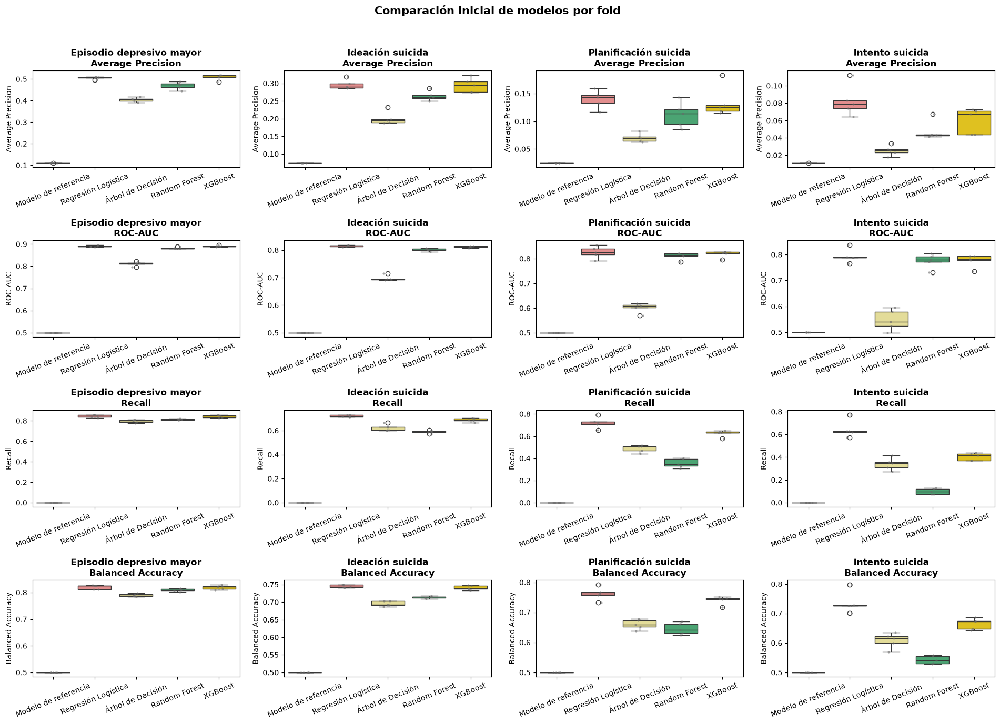

In [37]:
# =============================================================================
# COMPARACIÓN INICIAL DE MODELOS
# =============================================================================
print('\nCOMPARACIÓN INICIAL DE MODELOS')

filas_modelos = []

for target in targets:
    y_target = y_train[target]
    n_positivos = int(y_target.sum())
    n_negativos = len(y_target) - n_positivos
    peso_xgb = n_negativos / n_positivos

    print(f'\nVariable objetivo: {target} — {titulos_targets[target]}')
    print(f'  Positivos: {n_positivos:,} | Negativos: {n_negativos:,}')
    print(f'  scale_pos_weight XGBoost: {peso_xgb:.2f}')

    modelos = [
        ('Modelo de referencia', DummyClassifier(strategy='prior', random_state=semilla)),
        ('Regresión Logística', LogisticRegression(
            C=1, solver='liblinear', l1_ratio=0.0, class_weight='balanced',
            max_iter=max_iter_rl, random_state=semilla
        )),
        ('Árbol de Decisión', DecisionTreeClassifier(
            max_depth=10, min_samples_leaf=5, class_weight='balanced', random_state=semilla
        )),
        ('Random Forest', RandomForestClassifier(
            n_estimators=150, max_depth=10, min_samples_leaf=5, max_features='sqrt',
            class_weight='balanced_subsample', n_jobs=-1, random_state=semilla
        )),
        ('XGBoost', XGBClassifier(
            n_estimators=150, learning_rate=0.05, max_depth=5, subsample=0.8,
            colsample_bytree=0.8, scale_pos_weight=peso_xgb, eval_metric='logloss',
            tree_method='hist', device='cuda' if usar_gpu_xgb else 'cpu', n_jobs=1,
            random_state=semilla
        ))
    ]

    for i_modelo, (nombre, modelo) in enumerate(modelos, start=1):
        inicio_modelo = perf_counter()
        print(f'  [{i_modelo}/{len(modelos)}] {nombre}...', flush=True)

        pipeline = pipeline_clasificacion(
            modelo, vars_numericas_finales, vars_categoricas_finales,
            memory=str(ruta_cache_grid)
        )

        resultados = cross_validate(
            pipeline, X_train_final, y_target, cv=cv_modelos, scoring=metricas_modelos,
            return_train_score=True, n_jobs=1, error_score='raise'
        )

        filas_modelos.append(pd.DataFrame({
            'target': target,
            'modelo': nombre,
            'fold': np.arange(1, cv_modelos.n_splits + 1),
            'fit_time_s': resultados['fit_time'],
            **{metrica: resultados[f'test_{metrica}'] for metrica in metricas_modelos},
            **{f'{metrica}_train': resultados[f'train_{metrica}'] for metrica in metricas_modelos}
        }))

        print(f'      Finalizado en {perf_counter() - inicio_modelo:.1f} s')

cv_modelos_inicial = pd.concat(filas_modelos, ignore_index=True)

# -----------------------------------------------------------------------------
# RESUMEN
# -----------------------------------------------------------------------------
resumen_modelos_iniciales = cv_modelos_inicial.groupby(['target', 'modelo'], as_index=False).agg(
    accuracy=('accuracy', 'mean'),
    accuracy_std=('accuracy', 'std'),
    accuracy_train=('accuracy_train', 'mean'),
    roc_auc=('roc_auc', 'mean'),
    roc_auc_std=('roc_auc', 'std'),
    roc_auc_train=('roc_auc_train', 'mean'),
    average_precision=('average_precision', 'mean'),
    average_precision_std=('average_precision', 'std'),
    average_precision_train=('average_precision_train', 'mean'),
    recall=('recall', 'mean'),
    precision=('precision', 'mean'),
    f1=('f1', 'mean'),
    balanced_accuracy=('balanced_accuracy', 'mean'),
    specificity=('specificity', 'mean'),
    fit_time_s=('fit_time_s', 'mean')
)

resumen_modelos_iniciales['gap_accuracy'] = (
    resumen_modelos_iniciales['accuracy_train'] - resumen_modelos_iniciales['accuracy']
)
resumen_modelos_iniciales['gap_roc_auc'] = (
    resumen_modelos_iniciales['roc_auc_train'] - resumen_modelos_iniciales['roc_auc']
)
resumen_modelos_iniciales['gap_average_precision'] = (
    resumen_modelos_iniciales['average_precision_train'] -
    resumen_modelos_iniciales['average_precision']
)

tabla_resumen_modelos_iniciales = preparar_tabla(
    resumen_modelos_iniciales, columnas=[
        'target', 'modelo', 'accuracy', 'accuracy_std', 'roc_auc', 'roc_auc_std',
        'average_precision', 'average_precision_std', 'recall', 'precision', 'f1',
        'balanced_accuracy', 'specificity', 'gap_roc_auc', 'fit_time_s'
    ], redondeo=3
)

print('\nResumen de validación cruzada:')
display(tabla_resumen_modelos_iniciales)

# -----------------------------------------------------------------------------
# BOXPLOT
# -----------------------------------------------------------------------------
boxplots_cv_modelos(
    cv_modelos_inicial, targets, titulos_targets, metricas_box, orden_modelos,
    'Comparación inicial de modelos por fold', '05_boxplot_comparacion_inicial_modelos'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(cv_modelos_inicial, '42_comparacion_inicial_modelos_cv')
_ = guardar_csv(resumen_modelos_iniciales, '43_resumen_comparacion_inicial_modelos')

### Resultados

El modelo de referencia alcanza Accuracy entre 0,889 y 0,989, pero mantiene Recall nulo y ROC-AUC y Balanced Accuracy de 0,500. Esto confirma que Accuracy no resulta adecuada como criterio principal ante el desbalanceo.

Regresión Logística y XGBoost presentan los mejores resultados iniciales. En depresión son prácticamente equivalentes; en ideación Regresión Logística obtiene una ligera ventaja y mayor estabilidad. En planificación e intento esta ventaja aumenta: Regresión Logística alcanza Average Precision de 0,140 y 0,083, frente a 0,134 y 0,060 de XGBoost, manteniendo además mayor Recall.

Random Forest y el Árbol de Decisión detectan peor los positivos, especialmente en los targets minoritarios. Regresión Logística, Random Forest y XGBoost continúan a la búsqueda inicial de hiperparámetros, mientras que el Árbol de Decisión no continúa a la fase de optimización.

**Clasificación:** MEMORIA para la comparación de familias; ANEXO para métricas y resultados por fold.

## 4.3. Búsqueda inicial de hiperparámetros

A partir de la comparación inicial se seleccionan Regresión Logística, Random Forest y XGBoost para realizar una búsqueda acotada de hiperparámetros. Los tres modelos presentan suficiente capacidad predictiva, aunque muestran comportamientos diferentes respecto a la detección de positivos, el rendimiento global y el posible sobreajuste.

El Árbol de Decisión no se optimiza como clasificador individual debido a su menor capacidad discriminante y a la elevada diferencia observada entre TRAIN y validación, especialmente en los targets menos frecuentes.

Las búsquedas se realizan mediante `GridSearchCV`, manteniendo todo el preprocesamiento dentro del `Pipeline`. Se utiliza la misma validación cruzada de cinco folds y las ocho métricas definidas anteriormente. No se realiza un `refit` automático, ya que la selección posterior se basará en el análisis conjunto de ROC-AUC, Average Precision, Recall, Precision, F1, Balanced Accuracy, Especificidad, Accuracy, dispersión entre folds y diferencias entre TRAIN y validación.

Para reducir el coste computacional, Regresión Logística y Random Forest utilizan paralelización mediante CPU a nivel de `GridSearchCV`, evitando paralelismo anidado dentro de Random Forest. XGBoost utiliza aceleración mediante GPU cuando está disponible.

Los resultados completos de cada combinación modelo-target se guardan inmediatamente después de finalizar su ajuste. Esto permite recuperar una ejecución interrumpida o reiniciar el kernel sin repetir las búsquedas ya completadas.

El objetivo de esta etapa no es seleccionar automáticamente una configuración ganadora, sino obtener información suficiente sobre las regiones competitivas de cada modelo. La comparación conjunta de métricas y la selección de candidatos se realizarán en el apartado siguiente mediante tablas, mapas de calor y resultados individuales de los folds.

### Hiperparámetros estudiados

En **Regresión Logística** se estudian `C` y `l1_ratio`. `C` controla de forma inversa la intensidad de la regularización: valores menores implican una regularización más fuerte. `l1_ratio=1` corresponde a regularización L1 y `l1_ratio=0` a L2. Se mantienen fijos `class_weight='balanced'` y `solver='liblinear'`.

En **Random Forest** se estudian `n_estimators`, `criterion`, `max_depth` y `min_samples_leaf`. `max_features='sqrt'` y `class_weight='balanced_subsample'` se mantienen fijos para controlar la aleatorización del ensemble y compensar el desbalanceo dentro de cada muestra bootstrap.

En **XGBoost** se estudian `n_estimators`, `learning_rate`, `max_depth` y `subsample`. `colsample_bytree=0.8` se mantiene fijo como regularización adicional y `scale_pos_weight` se calcula independientemente para cada target a partir de la relación entre clases observada en TRAIN.

El objetivo no es localizar únicamente la combinación con mayor resultado aislado, sino interpretar cómo responde cada familia al variar su complejidad y seleccionar posteriormente configuraciones situadas en regiones estables.

In [38]:
# =============================================================================
# BÚSQUEDA INICIAL DE HIPERPARÁMETROS
# =============================================================================
print('\nBÚSQUEDA INICIAL DE HIPERPARÁMETROS')

# -----------------------------------------------------------------------------
# RECUPERACIÓN DE RESULTADOS PREVIOS
# -----------------------------------------------------------------------------
grid_inicial_previo, completados_grid = recuperar_grid(
    ruta_grid_inicial, version_grid_inicial, targets, modelos_grid
)

resultados_grid = [grid_inicial_previo] if not grid_inicial_previo.empty else []

# -----------------------------------------------------------------------------
# BÚSQUEDA POR VARIABLE OBJETIVO
# -----------------------------------------------------------------------------
for target in targets:
    y_target = y_train[target]
    n_positivos = int(y_target.sum())
    n_negativos = len(y_target) - n_positivos
    peso_xgb = n_negativos / n_positivos

    print(f'\nVariable objetivo: {target} — {titulos_targets[target]}')

    configuraciones_grid = {
        'Regresión Logística': (
            LogisticRegression(
                solver='liblinear', class_weight='balanced', max_iter=max_iter_rl,
                random_state=semilla
            ),
            {
                'modelo__C': [0.05, 0.1, 0.2, 0.5, 1],
                'modelo__l1_ratio': [0.0, 1.0]
            }
        ),
        'Random Forest': (
            RandomForestClassifier(
                class_weight='balanced_subsample', n_jobs=1, random_state=semilla
            ),
            {
                'modelo__n_estimators': [150, 200],
                'modelo__criterion': ['gini', 'entropy'],
                'modelo__max_depth': [6, 12],
                'modelo__min_samples_leaf': [5, 10],
                'modelo__max_features': ['sqrt']
            }
        ),
        'XGBoost': (
            XGBClassifier(
                scale_pos_weight=peso_xgb, eval_metric='logloss', tree_method='hist',
                device='cuda' if usar_gpu_xgb else 'cpu', n_jobs=1, verbosity=0,
                random_state=semilla
            ),
            {
                'modelo__n_estimators': [150, 200],
                'modelo__learning_rate': [0.03, 0.05],
                'modelo__max_depth': [3, 5, 7],
                'modelo__subsample': [0.8, 1.0],
                'modelo__colsample_bytree': [0.8]
            }
        )
    }

    for nombre, (modelo, parametros) in configuraciones_grid.items():
        if (target, nombre) in completados_grid:
            print(f'  {nombre}: resultados disponibles — se omite')
            continue

        n_combinaciones = int(np.prod([len(valores) for valores in parametros.values()]))
        print(f'\n  {nombre}: {n_combinaciones} configuraciones')

        pipeline = pipeline_clasificacion(
            modelo, vars_numericas_finales, vars_categoricas_finales,
            memory=str(ruta_cache_grid)
        )

        if nombre == 'XGBoost' and usar_gpu_xgb:
            n_jobs_grid, recurso = 1, 'GPU'
        else:
            n_jobs_grid, recurso = n_jobs_cpu, f'CPU ({n_jobs_cpu} procesos)'

        print(f'  Recurso: {recurso}')

        grid = GridSearchCV(
            pipeline, parametros, scoring=metricas_modelos, refit=False, cv=cv_modelos,
            n_jobs=n_jobs_grid, verbose=verbose_grid, pre_dispatch=n_jobs_grid,
            return_train_score=True, error_score='raise'
        )

        inicio_grid = perf_counter()
        grid.fit(X_train_final, y_target)
        print(f'  Ajuste finalizado en {perf_counter() - inicio_grid:.1f} s')

        resultados = pd.DataFrame(grid.cv_results_)
        resultados['target'] = target
        resultados['modelo'] = nombre
        resultados['version_grid'] = version_grid_inicial
        resultados_grid.append(resultados)

        # ---------------------------------------------------------------------
        # CHECKPOINT
        # ---------------------------------------------------------------------
        _ = guardar_checkpoint_grid(resultados_grid, nombre_grid_inicial)

        mejor = resultados.loc[resultados['mean_test_average_precision'].idxmax()]

        print(
            f'  Average Precision={mejor["mean_test_average_precision"]:.3f} | '
            f'ROC-AUC={mejor["mean_test_roc_auc"]:.3f} | '
            f'Recall={mejor["mean_test_recall"]:.3f}'
        )
        print(f'  Parámetros: {mejor["params"]}')

# -----------------------------------------------------------------------------
# RESULTADOS COMPLETOS
# -----------------------------------------------------------------------------
grid_modelos = guardar_checkpoint_grid(resultados_grid, nombre_grid_inicial)
grid_modelos = preparar_resultados_grid(grid_modelos)

# -----------------------------------------------------------------------------
# COMPROBACIÓN
# -----------------------------------------------------------------------------
resumen_grid = grid_modelos.groupby(
    ['target', 'modelo']
).size().reset_index(name='configuraciones')

tabla_resumen_grid = preparar_tabla(resumen_grid)

print('\nConfiguraciones guardadas por modelo y variable objetivo:')
display(tabla_resumen_grid)

print(f'\nConfiguraciones totales: {len(grid_modelos):,}')
print(f'Variables objetivo: {grid_modelos["target"].nunique()}')
print(f'Modelos: {grid_modelos["modelo"].nunique()}')


BÚSQUEDA INICIAL DE HIPERPARÁMETROS
Versión recuperada: v_grid_inicial
Configuraciones disponibles: 200
Rejilla completa.

Variable objetivo: IRAMDEYR — Episodio depresivo mayor
  Regresión Logística: resultados disponibles — se omite
  Random Forest: resultados disponibles — se omite
  XGBoost: resultados disponibles — se omite

Variable objetivo: IRSUICTHNK — Ideación suicida
  Regresión Logística: resultados disponibles — se omite
  Random Forest: resultados disponibles — se omite
  XGBoost: resultados disponibles — se omite

Variable objetivo: IRSUIPLANYR — Planificación suicida
  Regresión Logística: resultados disponibles — se omite
  Random Forest: resultados disponibles — se omite
  XGBoost: resultados disponibles — se omite

Variable objetivo: IRSUITRYYR — Intento suicida
  Regresión Logística: resultados disponibles — se omite
  Random Forest: resultados disponibles — se omite
  XGBoost: resultados disponibles — se omite

Configuraciones guardadas por modelo y variable objet

,Variable objetivo,Modelo,Configuraciones
0,IRAMDEYR,Random Forest,16
1,IRAMDEYR,Regresión Logística,10
2,IRAMDEYR,XGBoost,24
3,IRSUICTHNK,Random Forest,16
4,IRSUICTHNK,Regresión Logística,10
5,IRSUICTHNK,XGBoost,24
6,IRSUIPLANYR,Random Forest,16
7,IRSUIPLANYR,Regresión Logística,10
8,IRSUIPLANYR,XGBoost,24
9,IRSUITRYYR,Random Forest,16



Configuraciones totales: 200
Variables objetivo: 4
Modelos: 3


### Resultados

La búsqueda inicial evalúa 200 configuraciones sobre las cuatro variables objetivo. Regresión Logística favorece regularización L1 y valores bajos de `C`, especialmente en planificación e intento.

Random Forest mejora respecto a su configuración inicial, pero conserva menor Average Precision y mayores diferencias TRAIN-CV. XGBoost concentra sus mejores resultados en árboles poco profundos (`max_depth=3`), `subsample=0.8` y tasas de aprendizaje de 0,03–0,05.

Los máximos aislados no se seleccionan automáticamente. Se conservan tres candidatos por combinación modelo-target para contrastar rendimiento, dispersión y estabilidad antes del ajuste fino.

**Clasificación:** MEMORIA para las regiones competitivas; ANEXO para la rejilla completa.

## 4.4. Comparación de los resultados de GridSearchCV

Los resultados completos de `GridSearchCV` se recuperan desde el archivo guardado, evitando repetir los ajustes realizados en la etapa anterior. De esta forma, el análisis puede retomarse después de reiniciar el kernel sin volver a ejecutar las búsquedas ya completadas.

La evaluación de los hiperparámetros considera conjuntamente ROC-AUC, Average Precision, Recall, Balanced Accuracy y Accuracy, manteniendo además Precision, F1, Especificidad, dispersión entre folds y diferencias entre TRAIN y validación como criterios complementarios.

Para Regresión Logística se analiza la evolución de Average Precision y Balanced Accuracy según el nivel de regularización y el tipo de penalización. En Random Forest se estudia la combinación entre profundidad máxima y número mínimo de observaciones por hoja, mientras que en XGBoost se comparan profundidad, tasa de aprendizaje, número de árboles y muestreo.

Los mapas de calor muestran Average Precision y Balanced Accuracy. Cada celda representa el mejor valor obtenido para la combinación mostrada, tomando el máximo entre los restantes hiperparámetros de la rejilla. Su finalidad es localizar regiones competitivas y no identificar por sí sola una configuración completa.

Finalmente se identifican configuraciones candidatas utilizando varios rankings simultáneos. Una configuración puede conservarse aunque no ocupe la primera posición en Average Precision si presenta un comportamiento especialmente favorable en ROC-AUC, Recall o Balanced Accuracy. La selección posterior se realizará mediante la comparación de estos candidatos entre folds.


COMPARACIÓN DE LOS RESULTADOS DE GRIDSEARCHCV
Versión recuperada: v_grid_inicial
Configuraciones disponibles: 200
Rejilla completa.

Configuraciones candidatas por modelo y variable objetivo:


,Descripción,Modelo,Candidato,Parámetros,Average Precision CV,ROC-AUC CV,Recall CV,Balanced Accuracy CV,Diferencia Average Precision,Diferencia ROC-AUC
24,Episodio depresivo mayor,Random Forest,C1,"criterion=entropy, depth=12, leaf=10, n=150, f...",0.482,0.885,0.815,0.812,0.189,0.043
25,Episodio depresivo mayor,Random Forest,C2,"criterion=entropy, depth=12, leaf=10, n=200, f...",0.483,0.885,0.812,0.811,0.189,0.043
17,Episodio depresivo mayor,Random Forest,C3,"criterion=gini, depth=12, leaf=10, n=200, feat...",0.479,0.885,0.810,0.811,0.194,0.044
1,Episodio depresivo mayor,Regresión Logística,C1,"C=0.05, L1",0.514,0.892,0.858,0.824,0.005,0.003
3,Episodio depresivo mayor,Regresión Logística,C2,"C=0.1, L1",0.514,0.892,0.854,0.823,0.007,0.004
5,Episodio depresivo mayor,Regresión Logística,C3,"C=0.2, L1",0.514,0.892,0.851,0.822,0.010,0.005
38,Episodio depresivo mayor,XGBoost,C1,"lr=0.05, depth=3, n=150, sub=0.8, col=0.8",0.518,0.893,0.864,0.822,0.029,0.008
28,Episodio depresivo mayor,XGBoost,C2,"lr=0.03, depth=3, n=200, sub=0.8, col=0.8",0.517,0.893,0.865,0.821,0.025,0.007
39,Episodio depresivo mayor,XGBoost,C3,"lr=0.05, depth=3, n=150, sub=1.0, col=0.8",0.516,0.893,0.864,0.823,0.031,0.008
71,Ideación suicida,Random Forest,C1,"criterion=entropy, depth=6, leaf=10, n=200, fe...",0.267,0.796,0.692,0.727,0.054,0.019


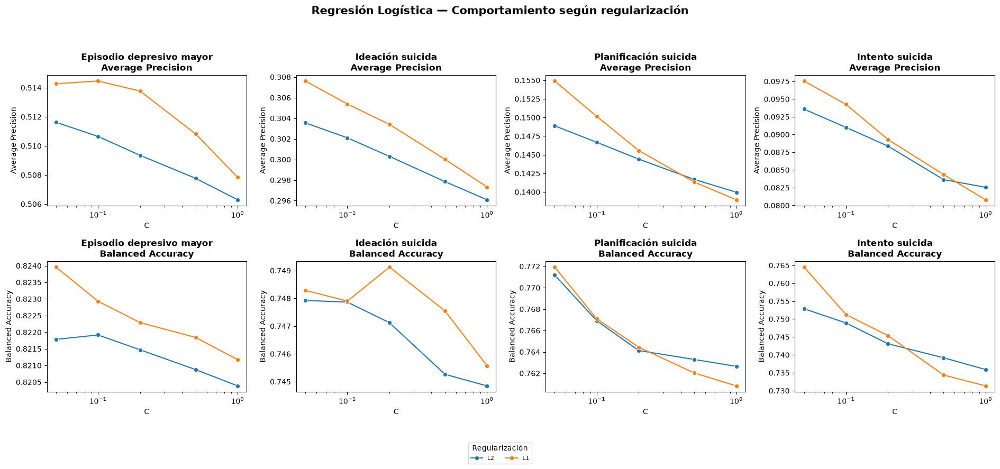

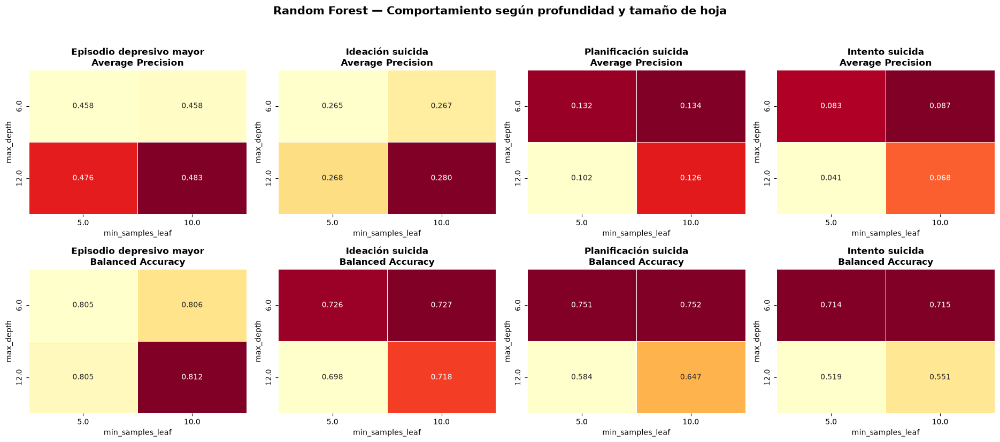

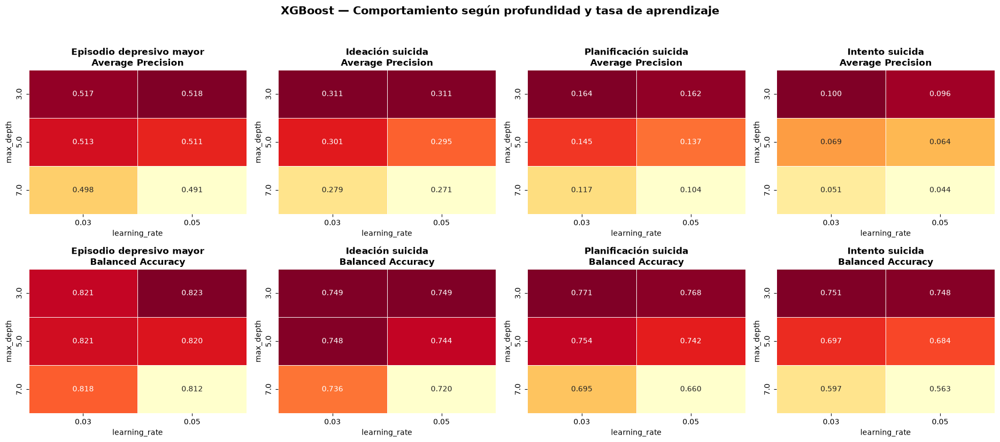

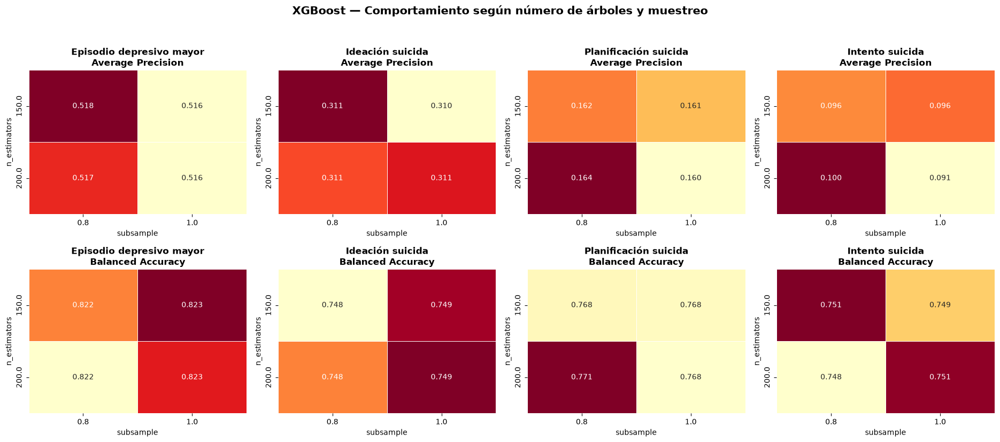

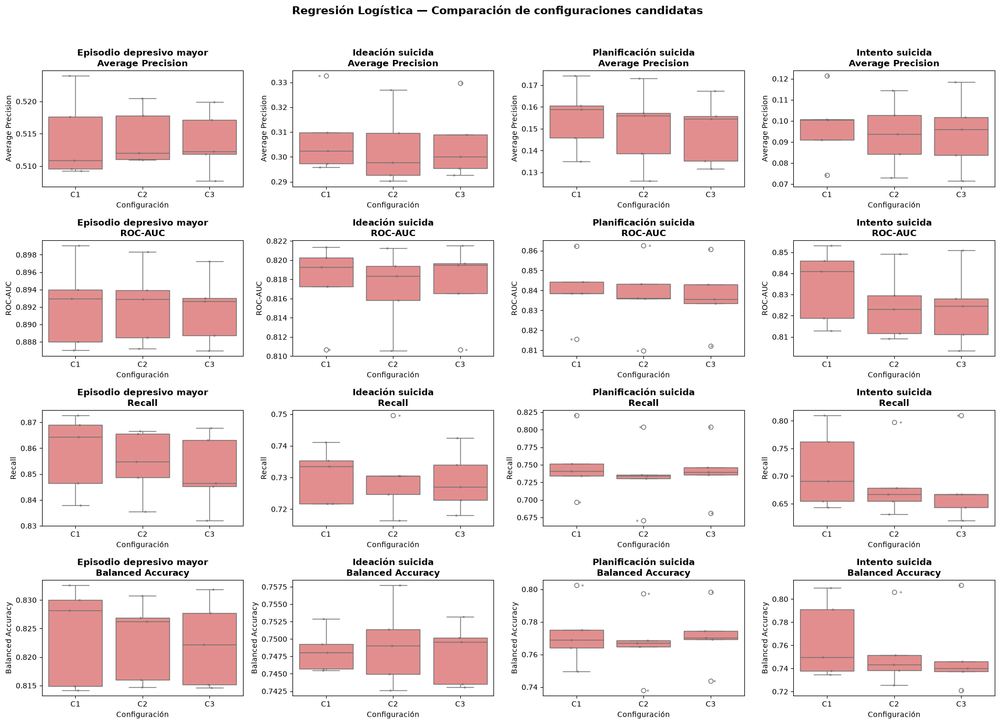

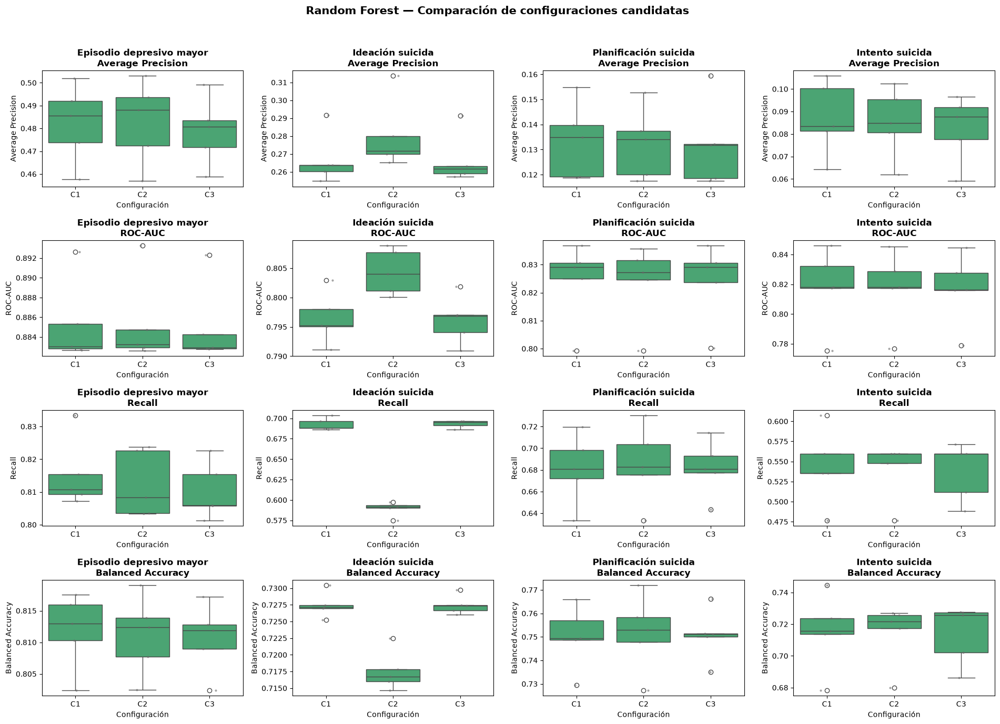

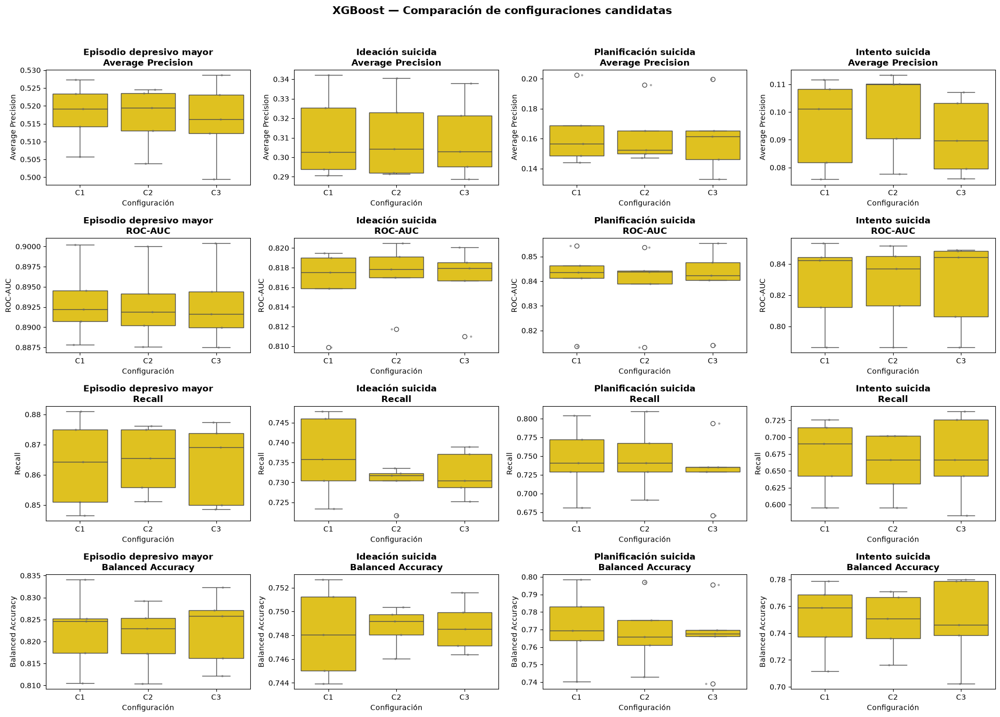


Configuraciones candidatas: 36


In [39]:
# =============================================================================
# COMPARACIÓN DE LOS RESULTADOS DE GRIDSEARCHCV
# =============================================================================
print('\nCOMPARACIÓN DE LOS RESULTADOS DE GRIDSEARCHCV')

# -----------------------------------------------------------------------------
# RECUPERACIÓN Y COMPROBACIÓN
# -----------------------------------------------------------------------------
grid_modelos, _ = recuperar_grid(
    ruta_grid_inicial, version_grid_inicial, targets, modelos_grid
)

if grid_modelos.empty:
    raise ValueError('No existen resultados de la rejilla para analizar.')

grid_modelos = preparar_resultados_grid(grid_modelos)
grid_modelos = ranking_metricas(grid_modelos, ['target', 'modelo'], metricas_ranking)

candidatos_grid = seleccionar_candidatos(grid_modelos)
candidatos_grid['objetivo'] = candidatos_grid['target'].map(titulos_targets)
candidatos_grid['parametros'] = candidatos_grid.apply(resumir_parametros, axis=1)

tabla_candidatos = preparar_tabla(candidatos_grid, columnas_candidatos_grid, redondeo=3)

print('\nConfiguraciones candidatas por modelo y variable objetivo:')
display(tabla_candidatos)

# -----------------------------------------------------------------------------
# REGRESIÓN LOGÍSTICA
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(2, 4, figsize=(19, 9))

for i, (metrica, titulo) in enumerate(metricas_heatmap_grid):
    for j, target in enumerate(targets):
        ax = axes[i, j]
        datos_rl = grid_modelos[
            grid_modelos['target'].eq(target) & grid_modelos['modelo'].eq('Regresión Logística')
        ].copy()

        datos_rl['regularizacion'] = datos_rl['param_modelo__l1_ratio'].map({0.0: 'L2', 1.0: 'L1'})

        sns.lineplot(
            data=datos_rl, x='param_modelo__C', y=metrica, hue='regularizacion', marker='o', ax=ax
        )

        ax.set_xscale('log')
        ax.set_title(f'{titulos_targets[target]}\n{titulo}', weight='bold')
        ax.set_xlabel('C')
        ax.set_ylabel(titulo)

handles, labels = axes[0, 0].get_legend_handles_labels()

for ax in axes.ravel():
    if ax.get_legend() is not None:
        ax.get_legend().remove()

fig.legend(
    handles, labels, title='Regularización', loc='lower center', bbox_to_anchor=(0.5, 0.01),
    ncol=len(labels), fontsize=8
)
fig.suptitle(
    'Regresión Logística — Comportamiento según regularización', fontsize=15, weight='bold'
)
_ = guardar_figura(fig, '06_grid_logistica', rect=[0, 0.10, 1, 0.94])

# -----------------------------------------------------------------------------
# RANDOM FOREST
# -----------------------------------------------------------------------------
heatmaps_grid(
    grid_modelos, 'Random Forest', targets, titulos_targets, 'param_modelo__max_depth',
    'param_modelo__min_samples_leaf', metricas_heatmap_grid,
    'Random Forest — Comportamiento según profundidad y tamaño de hoja', '07_grid_random_forest'
)

# -----------------------------------------------------------------------------
# XGBOOST
# -----------------------------------------------------------------------------
heatmaps_grid(
    grid_modelos, 'XGBoost', targets, titulos_targets, 'param_modelo__max_depth',
    'param_modelo__learning_rate', metricas_heatmap_grid,
    'XGBoost — Comportamiento según profundidad y tasa de aprendizaje', '08_grid_xgboost'
)

heatmaps_grid(
    grid_modelos, 'XGBoost', targets, titulos_targets, 'param_modelo__n_estimators',
    'param_modelo__subsample', metricas_heatmap_grid,
    'XGBoost — Comportamiento según número de árboles y muestreo',
    '09_grid_xgboost_estimadores_muestreo'
)

# -----------------------------------------------------------------------------
# BOXPLOTS DE CANDIDATOS
# -----------------------------------------------------------------------------
boxplots_grid(
    candidatos_grid, 'Regresión Logística', targets, titulos_targets, metricas_box,
    'Regresión Logística — Comparación de configuraciones candidatas',
    '10_boxplot_candidatos_logistica'
)

boxplots_grid(
    candidatos_grid, 'Random Forest', targets, titulos_targets, metricas_box,
    'Random Forest — Comparación de configuraciones candidatas',
    '11_boxplot_candidatos_random_forest'
)

boxplots_grid(
    candidatos_grid, 'XGBoost', targets, titulos_targets, metricas_box,
    'XGBoost — Comparación de configuraciones candidatas',
    '12_boxplot_candidatos_xgboost'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(candidatos_grid, '45_candidatos_grid')

print(f'\nConfiguraciones candidatas: {len(candidatos_grid):,}')

### Resultados

Regresión Logística muestra una meseta estable con penalización L1 y `C` bajo. Random Forest favorece `criterion='entropy'`, hojas de al menos diez observaciones y menor profundidad en los targets minoritarios.

En XGBoost, `max_depth=3` supera de forma consistente a profundidades 5 y 7. Depresión admite `learning_rate=0.05`, mientras que los objetivos menos frecuentes favorecen 0,03.

Regresión Logística y XGBoost concentran las configuraciones competitivas. Random Forest se conserva únicamente hasta la comparación entre familias por su menor rendimiento y mayor separación TRAIN-CV.

**Clasificación:** MEMORIA para la interpretación paramétrica; ANEXO para candidatos, mapas de calor y boxplots.

## 4.5. Comparación de las configuraciones seleccionadas

Tras analizar las regiones de hiperparámetros y la distribución de resultados entre folds, se conserva una configuración representativa de Regresión Logística, Random Forest y XGBoost para cada una de las cuatro variables objetivo.

La selección corresponde al candidato `C1` de cada combinación modelo-target, obtenido mediante el ranking conjunto de Average Precision, ROC-AUC, Recall y Balanced Accuracy y posteriormente contrastado mediante los boxplots de validación cruzada.

En esta etapa se comparan directamente las tres familias utilizando exclusivamente los resultados ya generados durante `GridSearchCV`. No se realiza ningún nuevo entrenamiento. Además de las métricas medias se mantienen las diferencias entre TRAIN y validación cruzada y la variabilidad entre folds, con el objetivo de evitar seleccionar una solución por una mejora puntual de una única métrica.

La comparación permitirá determinar si cada target presenta un modelo claramente preferible o si existen alternativas con rendimiento muy próximo. Esta decisión servirá para limitar el posterior ajuste fino únicamente a los modelos que realmente lo justifiquen.


COMPARACIÓN DE LAS CONFIGURACIONES SELECCIONADAS

Comparación de configuraciones seleccionadas:


,Variable objetivo,Modelo,Parámetros,Ranking final,Average Precision CV,ROC-AUC CV,Recall CV,Precision CV,F1 CV,Balanced Accuracy CV,Especificidad CV,Accuracy CV,Average Precision CV std,ROC-AUC CV std,Diferencia ROC-AUC,Diferencia Average Precision
0,IRAMDEYR,XGBoost,"lr=0.05, depth=3, n=150, sub=0.8, col=0.8",1.25,0.518,0.893,0.864,0.330,0.478,0.822,0.781,0.790,0.008,0.004,0.008,0.029
1,IRAMDEYR,Regresión Logística,"C=0.05, L1",1.75,0.514,0.892,0.858,0.338,0.485,0.824,0.790,0.797,0.006,0.004,0.003,0.005
2,IRAMDEYR,Random Forest,"criterion=entropy, depth=12, leaf=10, n=150, f...",3.00,0.482,0.885,0.815,0.347,0.487,0.812,0.808,0.809,0.015,0.004,0.043,0.189
3,IRSUICTHNK,Regresión Logística,"C=0.05, L1",1.50,0.308,0.818,0.731,0.201,0.315,0.748,0.766,0.763,0.013,0.004,0.007,0.008
4,IRSUICTHNK,XGBoost,"lr=0.03, depth=3, n=150, sub=0.8, col=0.8",1.50,0.311,0.816,0.737,0.198,0.312,0.748,0.760,0.758,0.020,0.003,0.013,0.033
5,IRSUICTHNK,Random Forest,"criterion=entropy, depth=6, leaf=10, n=200, fe...",3.00,0.267,0.796,0.692,0.190,0.298,0.727,0.763,0.757,0.013,0.004,0.019,0.054
6,IRSUIPLANYR,Regresión Logística,"C=0.05, L1",1.50,0.155,0.840,0.749,0.085,0.153,0.772,0.795,0.794,0.013,0.015,0.022,0.010
7,IRSUIPLANYR,XGBoost,"lr=0.03, depth=3, n=200, sub=0.8, col=0.8",1.50,0.164,0.840,0.745,0.086,0.153,0.771,0.797,0.795,0.021,0.014,0.038,0.072
8,IRSUIPLANYR,Random Forest,"criterion=entropy, depth=6, leaf=10, n=200, fe...",3.00,0.134,0.824,0.681,0.088,0.156,0.750,0.819,0.816,0.014,0.013,0.043,0.120
9,IRSUITRYYR,Regresión Logística,"C=0.05, L1",1.00,0.098,0.834,0.712,0.042,0.079,0.765,0.817,0.816,0.015,0.016,0.048,0.009


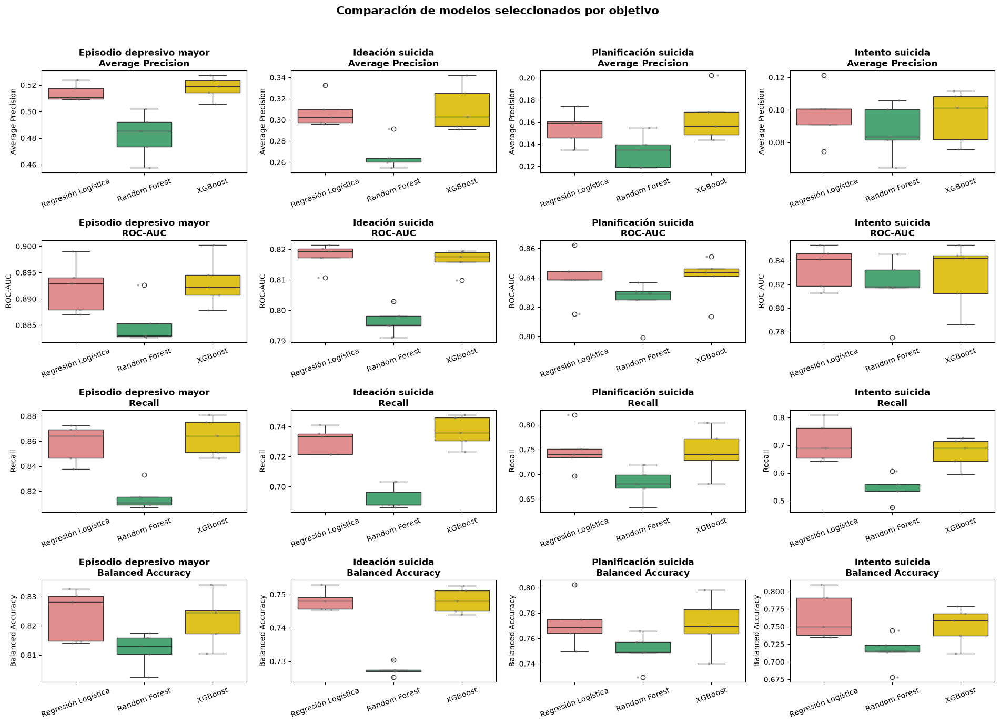


Configuraciones seleccionadas: 12


In [40]:
# =============================================================================
# COMPARACIÓN DE LAS CONFIGURACIONES SELECCIONADAS
# =============================================================================
print('\nCOMPARACIÓN DE LAS CONFIGURACIONES SELECCIONADAS')

# -----------------------------------------------------------------------------
# UNA CONFIGURACIÓN POR MODELO Y VARIABLE OBJETIVO
# -----------------------------------------------------------------------------
configuraciones_seleccionadas = candidatos_grid[candidatos_grid['candidato'].eq('C1')].copy()

if len(configuraciones_seleccionadas) != len(targets) * len(modelos_grid):
    raise ValueError('La selección no contiene una configuración por modelo y variable objetivo.')

configuraciones_seleccionadas = ranking_metricas(
    configuraciones_seleccionadas, 'target', metricas_ranking, prefijo='pos_final',
    nombre='ranking_final'
)

configuraciones_seleccionadas = configuraciones_seleccionadas.sort_values(
    ['target', 'ranking_final', 'gap_roc_auc', 'gap_average_precision']
).reset_index(drop=True)

# -----------------------------------------------------------------------------
# TABLA COMPARATIVA
# -----------------------------------------------------------------------------
columnas_seleccion = [
    'target', 'modelo', 'parametros', 'ranking_final', 'mean_test_average_precision',
    'mean_test_roc_auc', 'mean_test_recall', 'mean_test_precision', 'mean_test_f1',
    'mean_test_balanced_accuracy', 'mean_test_specificity', 'mean_test_accuracy',
    'std_test_average_precision', 'std_test_roc_auc', 'gap_roc_auc', 'gap_average_precision'
]

tabla_seleccion = preparar_tabla(
    configuraciones_seleccionadas, columnas=columnas_seleccion, redondeo={
        'ranking_final': 2, 'mean_test_average_precision': 3, 'mean_test_roc_auc': 3,
        'mean_test_recall': 3, 'mean_test_precision': 3, 'mean_test_f1': 3,
        'mean_test_balanced_accuracy': 3, 'mean_test_specificity': 3, 'mean_test_accuracy': 3,
        'std_test_average_precision': 3, 'std_test_roc_auc': 3, 'gap_roc_auc': 3,
        'gap_average_precision': 3
    }
)

print('\nComparación de configuraciones seleccionadas:')
display(tabla_seleccion)

# -----------------------------------------------------------------------------
# BOXPLOTS ENTRE MODELOS
# -----------------------------------------------------------------------------
boxplots_modelos(
    configuraciones_seleccionadas, targets, titulos_targets, metricas_box,
    'Comparación de modelos seleccionados por objetivo',
    '13_boxplot_modelos_seleccionados', orden_modelos=modelos_grid
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(configuraciones_seleccionadas, '46_configuraciones_seleccionadas')

print(f'\nConfiguraciones seleccionadas: {len(configuraciones_seleccionadas):,}')

### Resultados

Regresión Logística y XGBoost concentran las alternativas competitivas. Random Forest queda por debajo y presenta mayores diferencias TRAIN-CV.

XGBoost continúa al ajuste fino en depresión, ideación y planificación. Regresión Logística continúa en los cuatro targets por su rendimiento y mayor estabilidad. En intento no se amplía XGBoost porque Regresión Logística presenta una ventaja clara en discriminación, Recall y generalización.

**Clasificación:** MEMORIA para la selección de finalistas; ANEXO para la comparación completa.

## 4.6. Ajuste fino de los modelos finalistas

La comparación entre familias permite limitar el ajuste adicional a Regresión Logística y XGBoost. Random Forest no continúa en esta fase, ya que no resulta ganador en ninguno de los cuatro targets y mantiene diferencias TRAIN-CV superiores a las alternativas finalistas.

El ajuste fino no reabre una nueva búsqueda general, sino que estudia regiones próximas a las configuraciones competitivas identificadas anteriormente.

En **Regresión Logística** se mantiene la regularización L1, que ha mostrado el comportamiento más favorable, y se estudian valores de `C` más próximos entre sí. En depresión se analiza la región entre 0,03 y 0,10; para ideación, planificación e intento se amplía la regularización hasta `C=0.01`, ya que los resultados anteriores muestran una tendencia favorable hacia valores menores.

En **XGBoost** el ajuste se realiza para depresión, ideación y planificación, donde el modelo permanece como alternativa real a Regresión Logística. Se mantienen `subsample=0.8` y `colsample_bytree=0.8` y se revisan conjuntamente el número de árboles, la tasa de aprendizaje y la profundidad alrededor de las regiones previamente identificadas. En intento no se amplía la búsqueda porque Regresión Logística presenta ya una ventaja suficientemente clara.

La comparación mantiene los cinco folds, las mismas métricas y el preprocesamiento dentro del `Pipeline`. La elección no se realizará automáticamente a partir del mayor valor de una única métrica, sino tras revisar la parametrización, la distribución entre folds y las diferencias TRAIN-CV de los candidatos.

El tratamiento del desbalanceo mediante sobremuestreo se comprobará posteriormente de forma independiente sobre los targets con menor prevalencia.


AJUSTE FINO DE LOS MODELOS FINALISTAS
Versión recuperada: v_grid_ajuste_fino_hiperparametros
Configuraciones disponibles: 58

Variable objetivo: IRAMDEYR — Episodio depresivo mayor
  Regresión Logística: resultados disponibles — se omite
  XGBoost: resultados disponibles — se omite

Variable objetivo: IRSUICTHNK — Ideación suicida
  Regresión Logística: resultados disponibles — se omite
  XGBoost: resultados disponibles — se omite

Variable objetivo: IRSUIPLANYR — Planificación suicida
  Regresión Logística: resultados disponibles — se omite
  XGBoost: resultados disponibles — se omite

Variable objetivo: IRSUITRYYR — Intento suicida
  Regresión Logística: resultados disponibles — se omite

Candidatos del ajuste fino:


,Descripción,Modelo,Candidato,Parámetros,Average Precision CV,ROC-AUC CV,Recall CV,Balanced Accuracy CV,Diferencia Average Precision,Diferencia ROC-AUC
1,Episodio depresivo mayor,Regresión Logística,C1,"C=0.05, L1",0.514,0.892,0.858,0.824,0.005,0.003
2,Episodio depresivo mayor,Regresión Logística,C2,"C=0.075, L1",0.515,0.892,0.855,0.823,0.006,0.003
0,Episodio depresivo mayor,Regresión Logística,C3,"C=0.03, L1",0.513,0.892,0.859,0.823,0.003,0.002
15,Episodio depresivo mayor,XGBoost,C1,"lr=0.05, depth=3, n=150, sub=0.8, col=0.8",0.518,0.893,0.864,0.822,0.029,0.008
11,Episodio depresivo mayor,XGBoost,C2,"lr=0.04, depth=3, n=150, sub=0.8, col=0.8",0.518,0.893,0.864,0.821,0.023,0.006
14,Episodio depresivo mayor,XGBoost,C3,"lr=0.05, depth=3, n=125, sub=0.8, col=0.8",0.517,0.893,0.865,0.822,0.025,0.007
19,Ideación suicida,Regresión Logística,C1,"C=0.05, L1",0.308,0.818,0.731,0.748,0.008,0.007
18,Ideación suicida,Regresión Logística,C2,"C=0.03, L1",0.307,0.817,0.731,0.748,0.007,0.006
17,Ideación suicida,Regresión Logística,C3,"C=0.02, L1",0.306,0.816,0.729,0.747,0.005,0.005
29,Ideación suicida,XGBoost,C1,"lr=0.03, depth=3, n=125, sub=0.8, col=0.8",0.310,0.815,0.739,0.748,0.028,0.011


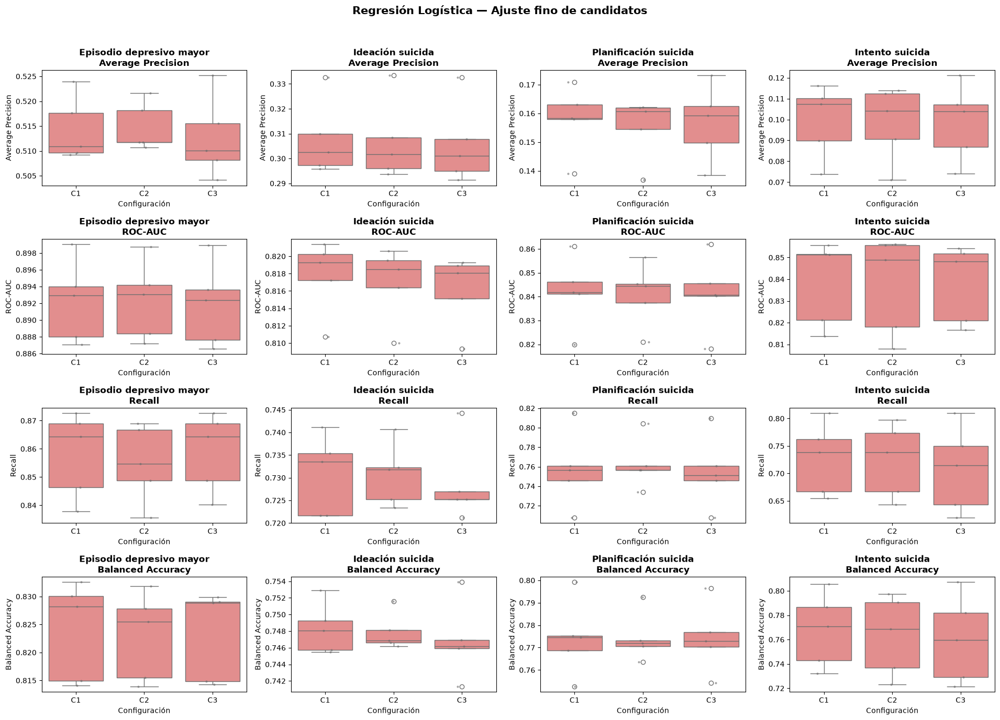

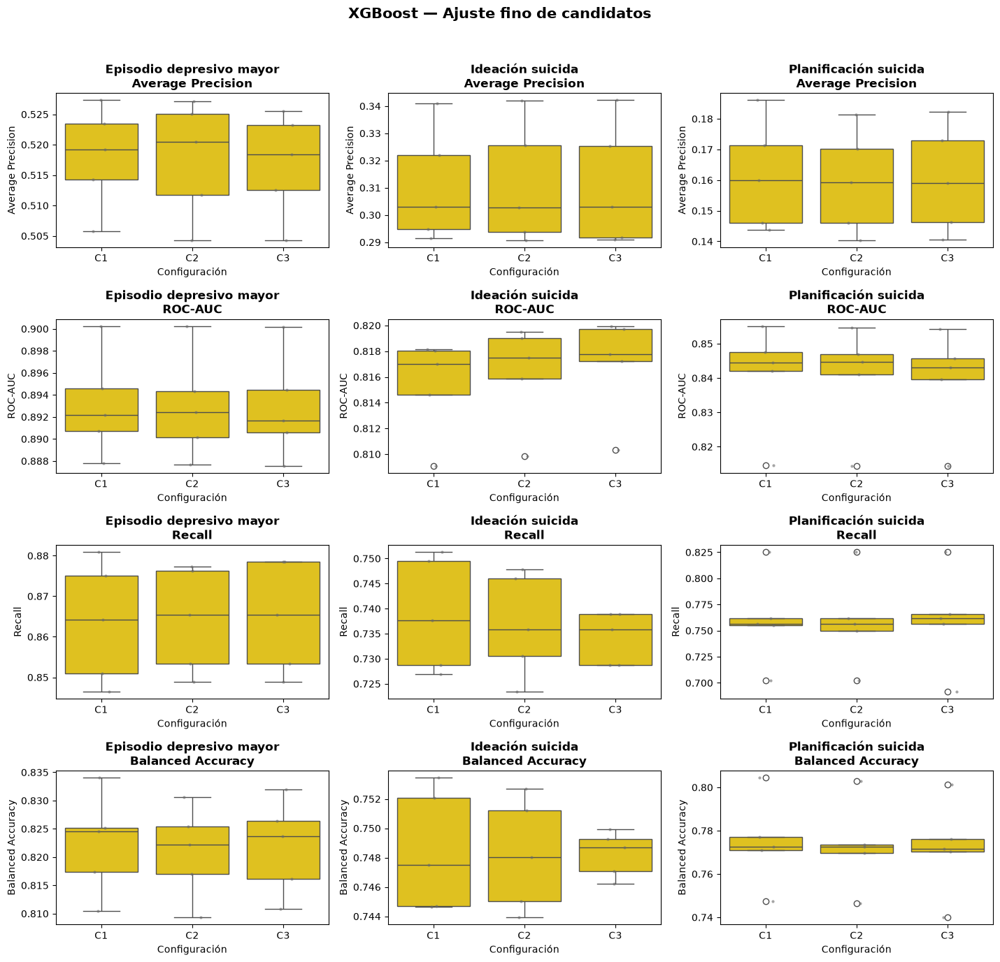


Configuraciones seleccionadas tras el análisis:


,Descripción,Modelo,Parámetros,Average Precision CV,ROC-AUC CV,Recall CV,Balanced Accuracy CV,Diferencia Average Precision,Diferencia ROC-AUC
1,Episodio depresivo mayor,Regresión Logística,"C=0.05, L1",0.514,0.892,0.858,0.824,0.005,0.003
15,Episodio depresivo mayor,XGBoost,"lr=0.05, depth=3, n=150, sub=0.8, col=0.8",0.518,0.893,0.864,0.822,0.029,0.008
19,Ideación suicida,Regresión Logística,"C=0.05, L1",0.308,0.818,0.731,0.748,0.008,0.007
29,Ideación suicida,XGBoost,"lr=0.03, depth=3, n=125, sub=0.8, col=0.8",0.310,0.815,0.739,0.748,0.028,0.011
39,Planificación suicida,Regresión Logística,"C=0.02, L1",0.158,0.842,0.757,0.774,0.004,0.013
51,Planificación suicida,XGBoost,"lr=0.04, depth=2, n=225, sub=0.8, col=0.8",0.161,0.841,0.760,0.775,0.029,0.023
55,Intento suicida,Regresión Logística,"C=0.02, L1",0.100,0.839,0.726,0.768,0.005,0.033



Configuraciones evaluadas: 58
Candidatos conservados: 21


In [41]:
# =============================================================================
# AJUSTE FINO DE LOS MODELOS FINALISTAS
# =============================================================================
print('\nAJUSTE FINO DE LOS MODELOS FINALISTAS')

targets_xgb_ajuste_fino = ['IRAMDEYR', 'IRSUICTHNK', 'IRSUIPLANYR']

# -----------------------------------------------------------------------------
# RECUPERACIÓN
# -----------------------------------------------------------------------------
grid_ajuste_fino_previo, completos_ajuste_fino = recuperar_grid(
    ruta_grid_ajuste_fino, version_grid_ajuste_fino
)

resultados_ajuste_fino = [grid_ajuste_fino_previo] if not grid_ajuste_fino_previo.empty else []

# -----------------------------------------------------------------------------
# AJUSTE POR VARIABLE OBJETIVO
# -----------------------------------------------------------------------------
for target in targets:
    y_target = y_train[target]
    n_positivos = int(y_target.sum())
    n_negativos = len(y_target) - n_positivos
    peso_xgb = n_negativos / n_positivos

    print(f'\nVariable objetivo: {target} — {titulos_targets[target]}')

    valores_c = (
        [0.03, 0.05, 0.075, 0.10] if target == 'IRAMDEYR' else [0.01, 0.02, 0.03, 0.05]
    )

    configuraciones_ajuste_fino = {
        'Regresión Logística': (
            LogisticRegression(
                solver='liblinear', l1_ratio=1.0, class_weight='balanced', max_iter=max_iter_rl,
                random_state=semilla
            ),
            {'modelo__C': valores_c}
        )
    }

    if target in targets_xgb_ajuste_fino:
        if target == 'IRAMDEYR':
            estimadores_xgb, tasas_xgb = [125, 150], [0.03, 0.04, 0.05]
        elif target == 'IRSUICTHNK':
            estimadores_xgb, tasas_xgb = [125, 150, 175], [0.02, 0.03, 0.04]
        else:
            estimadores_xgb, tasas_xgb = [200, 225], [0.02, 0.03, 0.04]

        configuraciones_ajuste_fino['XGBoost'] = (
            XGBClassifier(
                scale_pos_weight=peso_xgb, eval_metric='logloss', tree_method='hist',
                device='cuda' if usar_gpu_xgb else 'cpu', n_jobs=1, verbosity=0,
                random_state=semilla
            ),
            {
                'modelo__n_estimators': estimadores_xgb,
                'modelo__learning_rate': tasas_xgb,
                'modelo__max_depth': [2, 3],
                'modelo__subsample': [0.8],
                'modelo__colsample_bytree': [0.8]
            }
        )

    for nombre, (modelo, parametros) in configuraciones_ajuste_fino.items():
        if (target, nombre) in completos_ajuste_fino:
            print(f'  {nombre}: resultados disponibles — se omite')
            continue

        n_combinaciones = int(np.prod([len(valores) for valores in parametros.values()]))
        print(f'\n  {nombre}: {n_combinaciones} configuraciones')

        pipeline = pipeline_clasificacion(
            modelo, vars_numericas_finales, vars_categoricas_finales, memory=str(ruta_cache_grid)
        )

        if nombre == 'XGBoost' and usar_gpu_xgb:
            n_jobs_grid, recurso = 1, 'GPU'
        else:
            n_jobs_grid, recurso = n_jobs_cpu, f'CPU ({n_jobs_cpu} procesos)'

        print(f'  Recurso: {recurso}')

        grid = GridSearchCV(
            pipeline, parametros, scoring=metricas_modelos, refit=False, cv=cv_modelos,
            n_jobs=n_jobs_grid, verbose=verbose_grid, pre_dispatch=n_jobs_grid,
            return_train_score=True, error_score='raise'
        )

        inicio_grid = perf_counter()
        grid.fit(X_train_final, y_target)
        print(f'  Ajuste finalizado en {perf_counter() - inicio_grid:.1f} s')

        resultados = pd.DataFrame(grid.cv_results_)
        resultados['target'] = target
        resultados['modelo'] = nombre
        resultados['version_grid'] = version_grid_ajuste_fino
        resultados_ajuste_fino.append(resultados)

        _ = guardar_checkpoint_grid(resultados_ajuste_fino, nombre_grid_ajuste_fino)

        mejor = resultados.loc[resultados['mean_test_average_precision'].idxmax()]

        print(
            f'  Average Precision={mejor["mean_test_average_precision"]:.3f} | '
            f'ROC-AUC={mejor["mean_test_roc_auc"]:.3f} | '
            f'Recall={mejor["mean_test_recall"]:.3f} | '
            f'Balanced Accuracy={mejor["mean_test_balanced_accuracy"]:.3f}'
        )
        print(f'  Parámetros: {mejor["params"]}')

# -----------------------------------------------------------------------------
# RESULTADOS COMPLETOS
# -----------------------------------------------------------------------------
grid_ajuste_fino = guardar_checkpoint_grid(resultados_ajuste_fino, nombre_grid_ajuste_fino)
grid_ajuste_fino = preparar_resultados_grid(grid_ajuste_fino)
grid_ajuste_fino = ranking_metricas(grid_ajuste_fino, ['target', 'modelo'], metricas_ranking)

candidatos_ajuste_fino = seleccionar_candidatos(grid_ajuste_fino)
candidatos_ajuste_fino['objetivo'] = candidatos_ajuste_fino['target'].map(titulos_targets)
candidatos_ajuste_fino['parametros'] = candidatos_ajuste_fino.apply(resumir_parametros, axis=1)

tabla_candidatos_fino = preparar_tabla(candidatos_ajuste_fino, columnas_candidatos_grid, redondeo=3)

print('\nCandidatos del ajuste fino:')
display(tabla_candidatos_fino)

# -----------------------------------------------------------------------------
# BOXPLOTS
# -----------------------------------------------------------------------------
boxplots_grid(
    candidatos_ajuste_fino, 'Regresión Logística', targets, titulos_targets, metricas_box,
    'Regresión Logística — Ajuste fino de candidatos', '14_boxplot_ajuste_fino_logistica'
)

boxplots_grid(
    candidatos_ajuste_fino, 'XGBoost', targets_xgb_ajuste_fino, titulos_targets, metricas_box,
    'XGBoost — Ajuste fino de candidatos', '15_boxplot_ajuste_fino_xgboost'
)

# -----------------------------------------------------------------------------
# SELECCIÓN TRAS EL AJUSTE FINO
# -----------------------------------------------------------------------------
resumen_ajuste_fino = candidatos_ajuste_fino[candidatos_ajuste_fino['candidato'].eq('C1')].copy()

if len(resumen_ajuste_fino) != 7:
    raise ValueError('Se esperaban siete configuraciones C1 tras el ajuste fino.')

if resumen_ajuste_fino.duplicated(['target', 'modelo']).any():
    raise ValueError('Existen configuraciones repetidas tras el ajuste fino.')

tabla_ajuste_fino = preparar_tabla(
    resumen_ajuste_fino, columnas=[
        'objetivo', 'modelo', 'parametros', 'mean_test_average_precision', 'mean_test_roc_auc',
        'mean_test_recall', 'mean_test_balanced_accuracy', 'gap_average_precision', 'gap_roc_auc'
    ], redondeo=3
)

print('\nConfiguraciones seleccionadas tras el análisis:')
display(tabla_ajuste_fino)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(candidatos_ajuste_fino, '48_candidatos_ajuste_fino')

print(f'\nConfiguraciones evaluadas: {len(grid_ajuste_fino):,}')
print(f'Candidatos conservados: {len(candidatos_ajuste_fino):,}')

### Resultados

El ajuste fino evalúa 58 configuraciones y confirma las regiones identificadas inicialmente.

Regresión Logística selecciona L1 con `C=0.05` en depresión e ideación y `C=0.02` en planificación e intento. Las diferencias TRAIN-CV de Average Precision permanecen entre 0,004 y 0,008.

XGBoost selecciona árboles de profundidad 3 en depresión e ideación y profundidad 2 en planificación. Sus Average Precision son 0,518, 0,310 y 0,161, aunque mantiene diferencias TRAIN-CV superiores a Regresión Logística.

Los parámetros situados en los límites de la rejilla de ajuste fino ya disponen de valores adyacentes evaluados en la búsqueda inicial o no corresponden al modelo finalmente preferido. No se justifica ampliar la rejilla sin una hipótesis adicional.

**Clasificación:** MEMORIA para la parametrización final; ANEXO para las rejillas y los boxplots.

## 4.7. Comparación de estrategias para clases desbalanceadas

Se compara la ponderación de clases con `RandomOverSampler` en planificación e intento, los dos targets más desbalanceados. Se utiliza la Regresión Logística final (`C=0.02`) y el mismo esquema de validación cruzada.

El sobremuestreo se aplica únicamente dentro de cada fold de entrenamiento. Se contrastan relaciones minoritaria/mayoritaria de 0,25 y 1:1 mediante las métricas medias de los cinco folds y sus matrices de confusión. TEST permanece reservado.

El objetivo de esta comprobación no es volver a seleccionar el algoritmo, sino determinar si el sobremuestreo mejora el equilibrio observado respecto a la ponderación mediante `class_weight='balanced'`.


COMPARACIÓN DE ESTRATEGIAS PARA LAS CLASES DESBALANCEADAS

Variable objetivo: IRSUIPLANYR — Planificación suicida
  Ponderación...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


  Sobremuestreo 0.25...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


  Sobremuestreo 1:1...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)



Variable objetivo: IRSUITRYYR — Intento suicida
  Ponderación...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


  Sobremuestreo 0.25...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


  Sobremuestreo 1:1...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


,Descripción,Estrategia,Average Precision,ROC-AUC,Recall,Precision,F1,Balanced Accuracy,Especificidad
0,Planificación suicida,Ponderación,0.158,0.842,0.757,0.085,0.152,0.774,0.791
1,Planificación suicida,Sobremuestreo 0.25,0.162,0.842,0.390,0.170,0.237,0.671,0.951
2,Planificación suicida,Sobremuestreo 1:1,0.156,0.841,0.746,0.085,0.153,0.771,0.795
3,Intento suicida,Ponderación,0.100,0.839,0.726,0.041,0.077,0.768,0.809
4,Intento suicida,Sobremuestreo 0.25,0.104,0.839,0.379,0.089,0.145,0.668,0.956
5,Intento suicida,Sobremuestreo 1:1,0.098,0.837,0.710,0.041,0.078,0.763,0.816


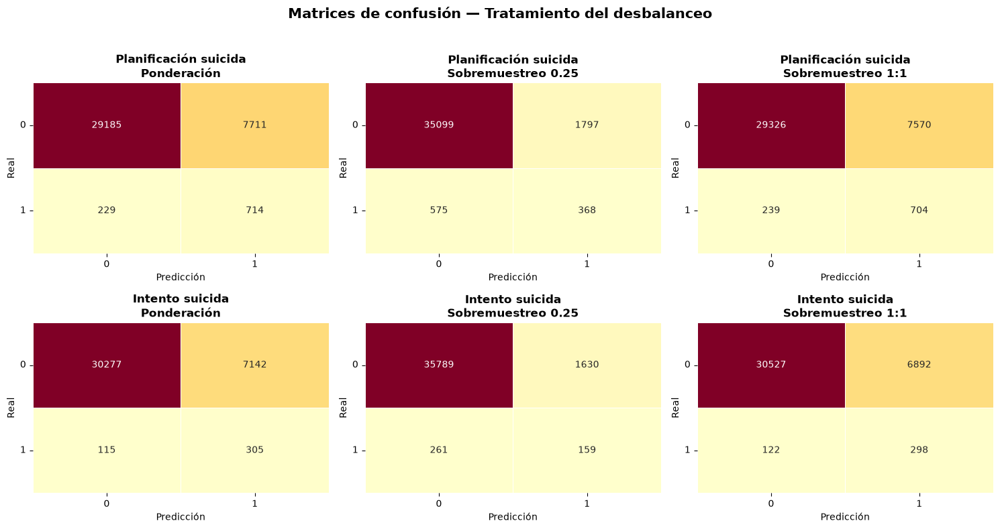

In [42]:
# =============================================================================
# COMPARACIÓN DE ESTRATEGIAS PARA LAS CLASES DESBALANCEADAS
# =============================================================================
print('\nCOMPARACIÓN DE ESTRATEGIAS PARA LAS CLASES DESBALANCEADAS')

targets_desbalanceo = ['IRSUIPLANYR', 'IRSUITRYYR']

estrategias_desbalanceo = {
    'Ponderación': None,
    'Sobremuestreo 0.25': 0.25,
    'Sobremuestreo 1:1': 1.0
}

filas_desbalanceo = []
filas_predicciones_desbalanceo = []

for target in targets_desbalanceo:
    y_target = y_train[target]

    print(f'\nVariable objetivo: {target} — {titulos_targets[target]}')

    for estrategia, ratio in estrategias_desbalanceo.items():
        print(f'  {estrategia}...')

        modelo = LogisticRegression(
            C=0.02, solver='liblinear', l1_ratio=1.0,
            class_weight='balanced' if ratio is None else None, max_iter=max_iter_rl,
            random_state=semilla
        )

        muestreo = None if ratio is None else RandomOverSampler(
            sampling_strategy=ratio, random_state=semilla
        )

        pipeline = pipeline_clasificacion(
            modelo, vars_numericas_finales, vars_categoricas_finales, muestreo=muestreo,
            memory=str(ruta_cache_grid)
        )

        resultados_cv, predicciones_cv = evaluar_cv(pipeline, X_train_final, y_target, cv_modelos)

        resultados_cv['target'] = target
        resultados_cv['estrategia'] = estrategia
        predicciones_cv['target'] = target
        predicciones_cv['estrategia'] = estrategia

        filas_desbalanceo.append(resultados_cv)
        filas_predicciones_desbalanceo.append(predicciones_cv)

cv_desbalanceo = pd.concat(filas_desbalanceo, ignore_index=True)
predicciones_desbalanceo_cv = pd.concat(filas_predicciones_desbalanceo, ignore_index=True)

resumen_desbalanceo = cv_desbalanceo.groupby(['target', 'estrategia'], as_index=False).agg(
    average_precision=('average_precision', 'mean'),
    roc_auc=('roc_auc', 'mean'),
    recall=('recall', 'mean'),
    precision=('precision', 'mean'),
    f1=('f1', 'mean'),
    balanced_accuracy=('balanced_accuracy', 'mean'),
    specificity=('specificity', 'mean')
)

resumen_desbalanceo['objetivo'] = resumen_desbalanceo['target'].map(titulos_targets)

tabla_desbalanceo = preparar_tabla(
    resumen_desbalanceo, columnas=[
        'objetivo', 'estrategia', 'average_precision', 'roc_auc', 'recall',
        'precision', 'f1', 'balanced_accuracy', 'specificity'
    ], redondeo=3
)

display(tabla_desbalanceo)

matrices_confusion_cv(
    predicciones_desbalanceo_cv, targets_desbalanceo, list(estrategias_desbalanceo),
    titulos_targets, 'estrategia', 'Matrices de confusión — Tratamiento del desbalanceo',
    '16_matrices_confusion_desbalanceo'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(cv_desbalanceo, '49_comparacion_desbalanceo_cv')
_ = guardar_csv(resumen_desbalanceo, '50_resumen_desbalanceo')

### Resultados

El sobremuestreo parcial mejora ligeramente Average Precision y Precision, pero reduce aproximadamente a la mitad el Recall y deteriora la Balanced Accuracy en ambos targets.

Las matrices de confusión muestran que esta estrategia disminuye los falsos positivos a costa de aumentar excesivamente los falsos negativos. El equilibrio 1:1 reproduce casi el comportamiento de la ponderación, sin superarlo.

Por tanto, se mantiene `class_weight='balanced'`, que ofrece el mejor compromiso entre discriminación, detección de positivos y simplicidad.

**Clasificación:** MEMORIA para la decisión y las matrices principales; ANEXO para los resultados por fold.

## 4.8. Contraste mediante Bagging de árboles

El Árbol de Decisión individual presentó un rendimiento claramente inferior a Regresión Logística, Random Forest y XGBoost, especialmente por su menor estabilidad entre TRAIN y validación. Sin embargo, los árboles constituyen estimadores de elevada varianza y pueden beneficiarse de técnicas de agregación mediante remuestreo.

Siguiendo la metodología trabajada en el módulo de Machine Learning, se incorpora un contraste dirigido mediante `BaggingClassifier` utilizando árboles de decisión como estimadores base. El objetivo no es abrir una nueva búsqueda general de algoritmos, sino comprobar si la agregación de múltiples árboles entrenados sobre muestras diferentes permite reducir la variabilidad observada en el árbol individual.

La complejidad del árbol base se mantiene regularizada y próxima a las regiones competitivas previamente observadas en Random Forest. Sobre esta base se exploran únicamente el número de estimadores y las proporciones de observaciones y columnas transformadas utilizadas por cada estimador.

La evaluación conserva los cinco folds estratificados, las mismas métricas y el preprocesamiento dentro del `Pipeline`. Como en el resto del notebook, TEST permanece reservado para la comparación predictiva final posterior.

Bagging se estudia aquí como contraste dentro de los modelos individuales. Aunque no resulte competitivo por sí solo, posteriormente podrá comprobarse si aporta información complementaria dentro de Stacking.


CONTRASTE MEDIANTE BAGGING DE ÁRBOLES


Versión recuperada: v_grid_bagging
Configuraciones disponibles: 32
Rejilla completa.

IRAMDEYR — Episodio depresivo mayor: resultados disponibles — se omite

IRSUICTHNK — Ideación suicida: resultados disponibles — se omite

IRSUIPLANYR — Planificación suicida: resultados disponibles — se omite

IRSUITRYYR — Intento suicida: resultados disponibles — se omite

Configuración seleccionada por variable objetivo:


,Descripción,Candidato,n_estimators,max_samples,max_features,Average Precision CV,ROC-AUC CV,Recall CV,Precision CV,F1 CV,Balanced Accuracy CV,Diferencia ROC-AUC,Diferencia Average Precision
1,Episodio depresivo mayor,C1,100,0.70,0.7,0.499,0.887,0.785,0.370,0.503,0.809,0.057,0.233
11,Ideación suicida,C1,100,0.85,0.7,0.292,0.809,0.700,0.206,0.319,0.742,0.031,0.092
19,Planificación suicida,C1,100,0.85,0.7,0.129,0.824,0.658,0.092,0.162,0.746,0.066,0.189
27,Intento suicida,C1,100,0.85,0.7,0.070,0.813,0.443,0.059,0.103,0.681,0.119,0.268


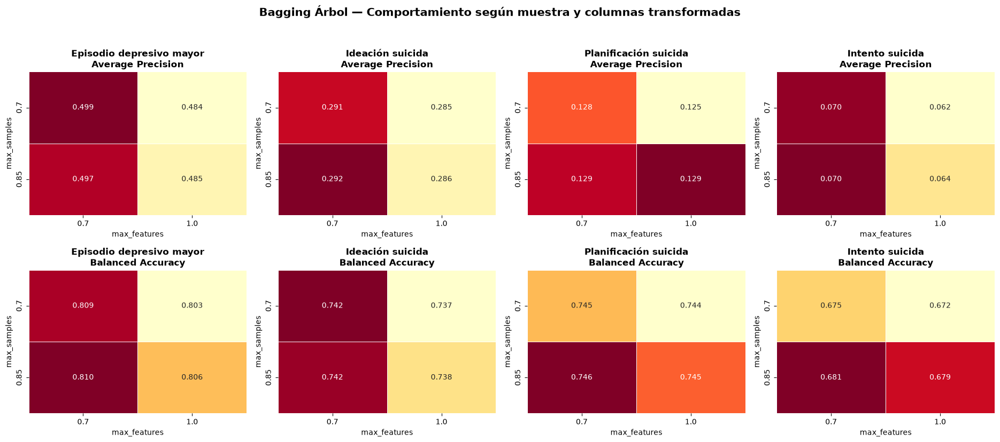

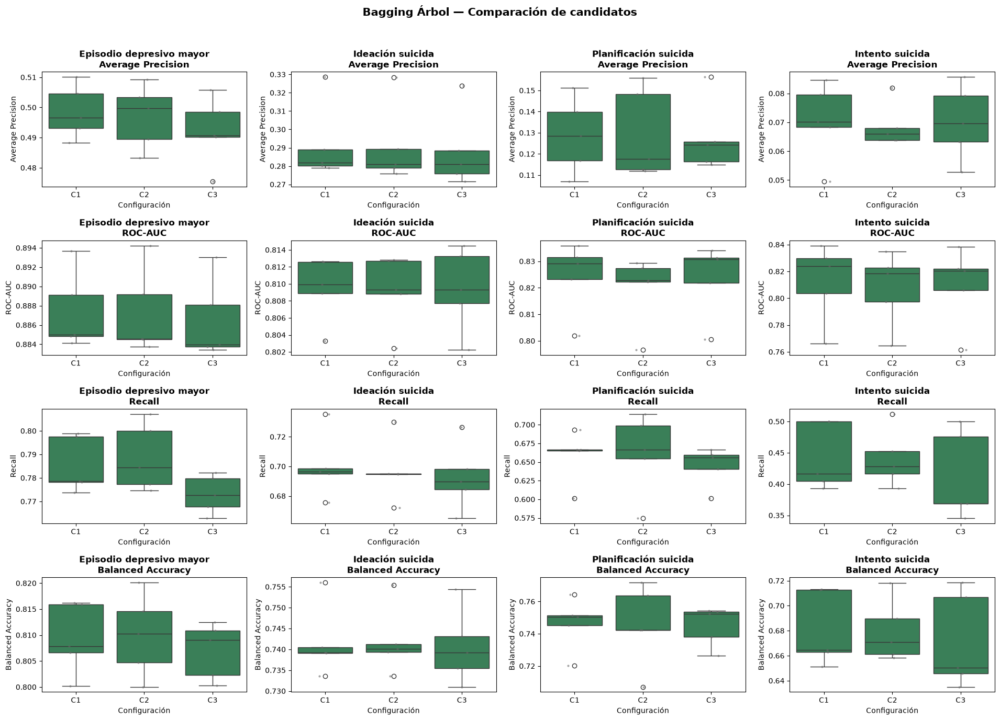


Configuraciones evaluadas: 32
Candidatos conservados: 12


In [43]:
# =============================================================================
# CONTRASTE MEDIANTE BAGGING DE ÁRBOLES
# =============================================================================
print('\nCONTRASTE MEDIANTE BAGGING DE ÁRBOLES')

grid_bagging_prev, completados_bagging = recuperar_grid(
    ruta_grid_bagging, version_grid_bagging, targets, ['Bagging Árbol']
)

resultados_bagging = [grid_bagging_prev] if not grid_bagging_prev.empty else []

# -----------------------------------------------------------------------------
# ÁRBOL BASE
# -----------------------------------------------------------------------------
profundidad_arbol = {
    'IRAMDEYR': 12,
    'IRSUICTHNK': 6,
    'IRSUIPLANYR': 6,
    'IRSUITRYYR': 6
}

parametros_bagging = {
    'modelo__n_estimators': [50, 100],
    'modelo__max_samples': [0.70, 0.85],
    'modelo__max_features': [0.70, 1.00]
}

# -----------------------------------------------------------------------------
# AJUSTE POR VARIABLE OBJETIVO
# -----------------------------------------------------------------------------
for target in targets:
    if (target, 'Bagging Árbol') in completados_bagging:
        print(f'\n{target} — {titulos_targets[target]}: resultados disponibles — se omite')
        continue

    print(f'\nVariable objetivo: {target} — {titulos_targets[target]}')

    arbol_base = DecisionTreeClassifier(
        criterion='entropy', max_depth=profundidad_arbol[target], min_samples_leaf=10,
        class_weight='balanced', random_state=semilla
    )

    modelo_bagging = BaggingClassifier(
        estimator=arbol_base, bootstrap=True, bootstrap_features=False, random_state=semilla,
        n_jobs=1
    )

    pipeline = pipeline_clasificacion(
        modelo_bagging, vars_numericas_finales, vars_categoricas_finales,
        memory=str(ruta_cache_grid)
    )

    n_combinaciones = int(np.prod([len(valores) for valores in parametros_bagging.values()]))

    print(f'  Configuraciones: {n_combinaciones}')
    print(f'  Recurso: CPU ({n_jobs_cpu} procesos)')

    grid = GridSearchCV(
        pipeline, parametros_bagging, scoring=metricas_modelos, refit=False, cv=cv_modelos,
        n_jobs=n_jobs_cpu, verbose=verbose_grid, pre_dispatch=n_jobs_cpu, return_train_score=True,
        error_score='raise'
    )

    inicio_grid = perf_counter()
    grid.fit(X_train_final, y_train[target])
    print(f'  Ajuste finalizado en {perf_counter() - inicio_grid:.1f} s')

    resultados = pd.DataFrame(grid.cv_results_)
    resultados['target'] = target
    resultados['modelo'] = 'Bagging Árbol'
    resultados['version_grid'] = version_grid_bagging
    resultados_bagging.append(resultados)

    _ = guardar_checkpoint_grid(resultados_bagging, nombre_grid_bagging)

    mejor = resultados.loc[resultados['mean_test_average_precision'].idxmax()]

    print(
        f'  Mejor Average Precision={mejor["mean_test_average_precision"]:.3f} | '
        f'ROC-AUC={mejor["mean_test_roc_auc"]:.3f} | '
        f'Recall={mejor["mean_test_recall"]:.3f} | '
        f'Balanced Accuracy={mejor["mean_test_balanced_accuracy"]:.3f}'
    )

# -----------------------------------------------------------------------------
# COMPARACIÓN CONJUNTA
# -----------------------------------------------------------------------------
grid_bagging = guardar_checkpoint_grid(resultados_bagging, nombre_grid_bagging)
grid_bagging = preparar_resultados_grid(grid_bagging)
grid_bagging = ranking_metricas(grid_bagging, ['target', 'modelo'], metricas_ranking)

candidatos_bagging = seleccionar_candidatos(grid_bagging)

# -----------------------------------------------------------------------------
# RESUMEN DE C1
# -----------------------------------------------------------------------------
resumen_bagging = candidatos_bagging[candidatos_bagging['candidato'].eq('C1')].copy()

resumen_bagging['objetivo'] = resumen_bagging['target'].map(titulos_targets)

tabla_bagging = preparar_tabla(
    resumen_bagging, columnas=[
        'objetivo', 'candidato', 'param_modelo__n_estimators', 'param_modelo__max_samples',
        'param_modelo__max_features', 'mean_test_average_precision', 'mean_test_roc_auc',
        'mean_test_recall', 'mean_test_precision', 'mean_test_f1', 'mean_test_balanced_accuracy',
        'gap_roc_auc', 'gap_average_precision'
    ], redondeo=3
)

print('\nConfiguración seleccionada por variable objetivo:')
display(tabla_bagging)

# -----------------------------------------------------------------------------
# HEATMAPS
# -----------------------------------------------------------------------------
heatmaps_grid(
    grid_bagging, 'Bagging Árbol', targets, titulos_targets, 'param_modelo__max_samples',
    'param_modelo__max_features', metricas_heatmap_grid,
    'Bagging Árbol — Comportamiento según muestra y columnas transformadas', '17_grid_bagging_arbol'
)

# -----------------------------------------------------------------------------
# BOXPLOTS
# -----------------------------------------------------------------------------
boxplots_grid(
    candidatos_bagging, 'Bagging Árbol', targets, titulos_targets, metricas_box,
    'Bagging Árbol — Comparación de candidatos', '18_boxplot_bagging_arbol'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(candidatos_bagging, '52_candidatos_bagging_arbol')

print(f'\nConfiguraciones evaluadas: {len(grid_bagging):,}')
print(f'Candidatos conservados: {len(candidatos_bagging):,}')

### Resultados

Bagging selecciona 100 estimadores y `max_features=0.70`; `max_samples` queda en 0,70 para depresión y 0,85 para los restantes targets.

Su Average Precision alcanza 0,499, 0,292, 0,129 y 0,070, por debajo de Regresión Logística y XGBoost. Además, presenta diferencias TRAIN-CV elevadas, especialmente en planificación e intento.

No continúa como referencia individual. Se conserva únicamente como posible modelo base del Stacking para comprobar posteriormente si aporta diversidad.

**Clasificación:** MEMORIA para la conclusión; ANEXO para rejilla y boxplots.

## 4.9. Comparación y selección de los modelos ML individuales

Se comparan Regresión Logística y XGBoost con las configuraciones ya seleccionadas. Para intento se recupera la configuración inicial de XGBoost, que no continuó al ajuste fino, de forma que ambos modelos puedan compararse bajo el mismo esquema en los cuatro targets.

Las matrices se construyen mediante predicciones de validación cruzada: cada registro es evaluado por un modelo entrenado sin utilizar ese registro. El preprocesamiento permanece dentro del `Pipeline` durante cada fold.

Esta comparación resume la misma validación interna empleada para seleccionar los modelos y no constituye una evaluación independiente. TEST permanece reservado para la posterior comparación ML/DL y el análisis predictivo final.

El objetivo es establecer una referencia individual por target antes de estudiar si la combinación de varios modelos mediante Stacking aporta una mejora suficientemente consistente.


COMPARACIÓN Y SELECCIÓN DE LOS MODELOS ML INDIVIDUALES

Variable objetivo: IRAMDEYR — Episodio depresivo mayor
  Regresión Logística...
    Fold 1/5...


      Average Precision=0.509 | ROC-AUC=0.888 | 1.5 s
    Fold 2/5...


      Average Precision=0.518 | ROC-AUC=0.893 | 1.5 s
    Fold 3/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.524 | ROC-AUC=0.899 | 1.3 s
    Fold 4/5...


      Average Precision=0.511 | ROC-AUC=0.894 | 1.4 s
    Fold 5/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.510 | ROC-AUC=0.887 | 2.1 s
    Validación finalizada en 7.6 s
  XGBoost...
    Fold 1/5...


      Average Precision=0.519 | ROC-AUC=0.891 | 0.9 s
    Fold 2/5...


      Average Precision=0.527 | ROC-AUC=0.895 | 0.7 s
    Fold 3/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.523 | ROC-AUC=0.900 | 0.7 s
    Fold 4/5...


      Average Precision=0.506 | ROC-AUC=0.892 | 0.7 s
    Fold 5/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2, 5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.514 | ROC-AUC=0.888 | 0.7 s
    Validación finalizada en 3.6 s

Variable objetivo: IRSUICTHNK — Ideación suicida
  Regresión Logística...
    Fold 1/5...


      Average Precision=0.303 | ROC-AUC=0.817 | 2.0 s
    Fold 2/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.333 | ROC-AUC=0.811 | 1.2 s
    Fold 3/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.310 | ROC-AUC=0.819 | 2.1 s
    Fold 4/5...


      Average Precision=0.296 | ROC-AUC=0.821 | 2.6 s
    Fold 5/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.297 | ROC-AUC=0.820 | 1.2 s
    Validación finalizada en 9.2 s
  XGBoost...
    Fold 1/5...


      Average Precision=0.303 | ROC-AUC=0.815 | 1.0 s
    Fold 2/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.341 | ROC-AUC=0.809 | 0.8 s
    Fold 3/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.322 | ROC-AUC=0.818 | 0.7 s
    Fold 4/5...


      Average Precision=0.295 | ROC-AUC=0.818 | 0.6 s
    Fold 5/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.291 | ROC-AUC=0.817 | 0.6 s
    Validación finalizada en 3.6 s

Variable objetivo: IRSUIPLANYR — Planificación suicida
  Regresión Logística...
    Fold 1/5...


      Average Precision=0.171 | ROC-AUC=0.861 | 0.8 s
    Fold 2/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.158 | ROC-AUC=0.841 | 1.0 s
    Fold 3/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.158 | ROC-AUC=0.842 | 0.7 s
    Fold 4/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.139 | ROC-AUC=0.820 | 0.8 s
    Fold 5/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.163 | ROC-AUC=0.846 | 0.7 s
    Validación finalizada en 4.0 s
  XGBoost...
    Fold 1/5...


      Average Precision=0.160 | ROC-AUC=0.855 | 1.0 s
    Fold 2/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.144 | ROC-AUC=0.842 | 0.8 s
    Fold 3/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [37] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.171 | ROC-AUC=0.847 | 0.7 s
    Fold 4/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.146 | ROC-AUC=0.815 | 0.7 s
    Fold 5/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.186 | ROC-AUC=0.844 | 0.7 s
    Validación finalizada en 3.9 s

Variable objetivo: IRSUITRYYR — Intento suicida
  Regresión Logística...
    Fold 1/5...


      Average Precision=0.107 | ROC-AUC=0.852 | 1.1 s
    Fold 2/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.090 | ROC-AUC=0.851 | 5.2 s
    Fold 3/5...


      Average Precision=0.116 | ROC-AUC=0.814 | 10.8 s
    Fold 4/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.074 | ROC-AUC=0.821 | 0.8 s
    Fold 5/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.110 | ROC-AUC=0.856 | 1.2 s
    Validación finalizada en 19.2 s
  XGBoost...
    Fold 1/5...


      Average Precision=0.108 | ROC-AUC=0.853 | 1.0 s
    Fold 2/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.101 | ROC-AUC=0.842 | 0.8 s
    Fold 3/5...


      Average Precision=0.082 | ROC-AUC=0.786 | 0.7 s
    Fold 4/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.076 | ROC-AUC=0.812 | 0.7 s
    Fold 5/5...


/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)
/home/cam/miniconda3/envs/TFM_ML/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:262: UserWarning: Found unknown categories in columns [44, 55] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(msg, UserWarning)


      Average Precision=0.112 | ROC-AUC=0.844 | 0.7 s
    Validación finalizada en 4.1 s

Resumen de validación cruzada:


,Descripción,Modelo,Parámetros,Average Precision,Average Precision std,ROC-AUC,ROC-AUC std,Recall,Precision,F1,Balanced Accuracy,Especificidad,Diferencia Average Precision,Diferencia ROC-AUC,Referencia individual
0,Episodio depresivo mayor,Regresión Logística,"C=0.05, L1",0.514,0.006,0.892,0.005,0.858,0.338,0.485,0.824,0.790,0.005,0.003,
1,Episodio depresivo mayor,XGBoost,"lr=0.05, depth=3, n=150, sub=0.8, col=0.8",0.518,0.008,0.893,0.005,0.864,0.330,0.478,0.822,0.781,0.029,0.008,Sí
2,Ideación suicida,Regresión Logística,"C=0.05, L1",0.308,0.015,0.818,0.004,0.731,0.201,0.315,0.748,0.766,0.008,0.007,Sí
3,Ideación suicida,XGBoost,"lr=0.03, depth=3, n=125, sub=0.8, col=0.8",0.310,0.021,0.815,0.004,0.739,0.197,0.311,0.748,0.758,0.028,0.011,
4,Planificación suicida,Regresión Logística,"C=0.02, L1",0.158,0.012,0.842,0.015,0.757,0.085,0.152,0.774,0.791,0.004,0.013,Sí
5,Planificación suicida,XGBoost,"lr=0.04, depth=2, n=225, sub=0.8, col=0.8",0.161,0.018,0.841,0.015,0.760,0.084,0.152,0.775,0.789,0.029,0.023,
6,Intento suicida,Regresión Logística,"C=0.02, L1",0.100,0.017,0.839,0.020,0.726,0.041,0.077,0.768,0.809,0.005,0.033,Sí
7,Intento suicida,XGBoost,"lr=0.03, depth=3, n=150, sub=0.8, col=0.8",0.096,0.016,0.828,0.028,0.674,0.042,0.079,0.751,0.828,0.102,0.067,


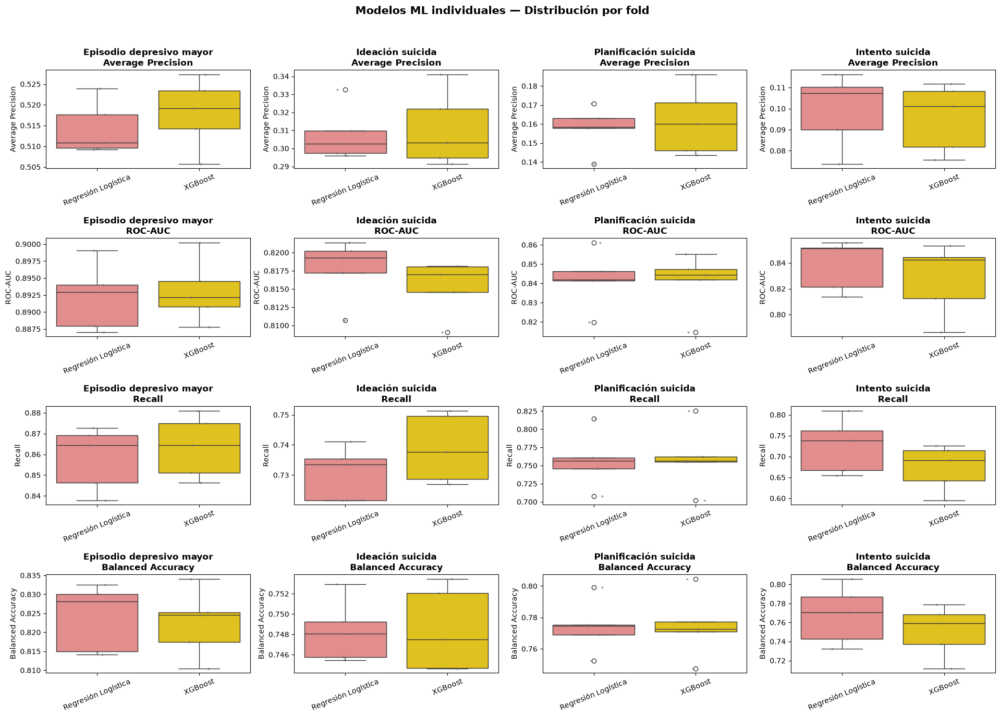

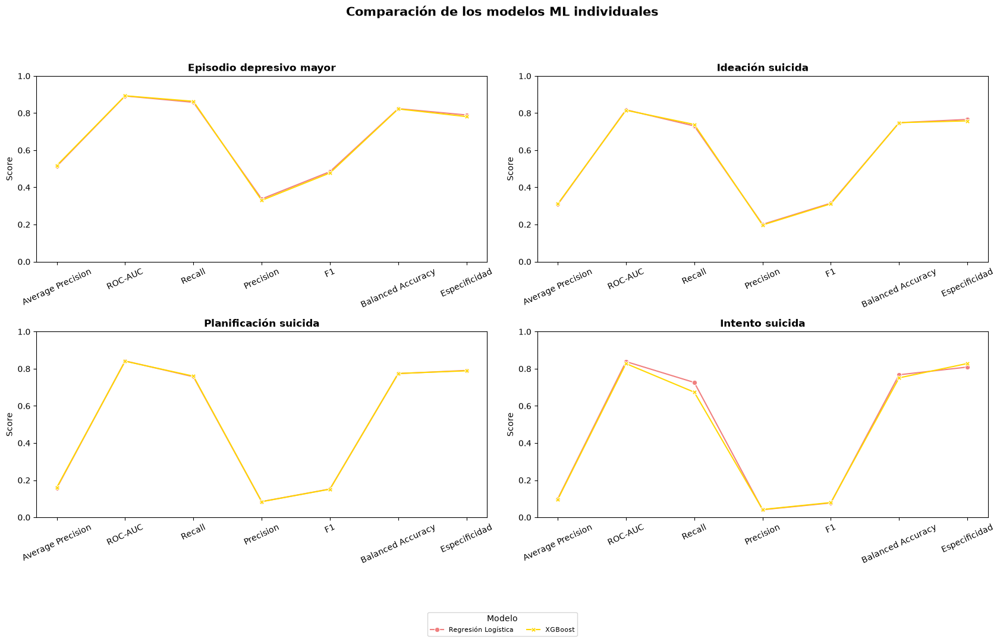

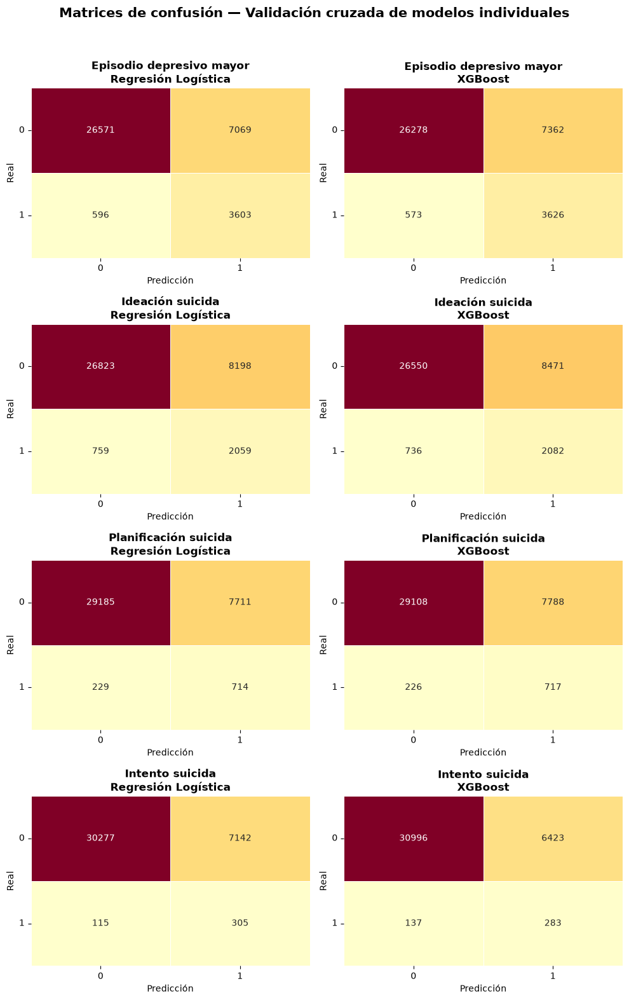

In [44]:
# =============================================================================
# COMPARACIÓN Y SELECCIÓN DE LOS MODELOS ML INDIVIDUALES
# =============================================================================
print('\nCOMPARACIÓN Y SELECCIÓN DE LOS MODELOS ML INDIVIDUALES')

modelos_comparados = ['Regresión Logística', 'XGBoost']

# -----------------------------------------------------------------------------
# CONFIGURACIONES QUE SE VAN A COMPARAR
# -----------------------------------------------------------------------------
configuraciones_modelos_individuales = pd.concat([
    resumen_ajuste_fino.copy(), configuraciones_seleccionadas.query(
        "target == 'IRSUITRYYR' and modelo == 'XGBoost'"
    ).copy()], ignore_index=True, sort=False)

if len(configuraciones_modelos_individuales) != len(targets) * len(modelos_comparados):
    raise ValueError('Debe existir una configuración por modelo y variable objetivo.')

if configuraciones_modelos_individuales.duplicated(['target', 'modelo']).any():
    raise ValueError('Existen configuraciones de modelos individuales duplicadas.')

filas_resultados_cv = []
filas_predicciones_cv = []

# -----------------------------------------------------------------------------
# VALIDACIÓN CRUZADA POR VARIABLE OBJETIVO
# -----------------------------------------------------------------------------
for target in targets:
    print(f'\nVariable objetivo: {target} — {titulos_targets[target]}')

    for nombre, modelo in modelos_individuales_target(target).items():
        print(f'  {nombre}...')

        resultados_cv, predicciones_cv = evaluar_cv(
            modelo, X_train_final, y_train[target], cv_modelos, verbose=True
        )

        resultados_cv['target'] = target
        resultados_cv['modelo'] = nombre
        predicciones_cv['target'] = target
        predicciones_cv['modelo'] = nombre

        filas_resultados_cv.append(resultados_cv)
        filas_predicciones_cv.append(predicciones_cv)

cv_modelos_individuales = pd.concat(filas_resultados_cv, ignore_index=True)
predicciones_modelos_individuales_cv = pd.concat(filas_predicciones_cv, ignore_index=True)

# -----------------------------------------------------------------------------
# RESUMEN
# -----------------------------------------------------------------------------
resumen_modelos_individuales = cv_modelos_individuales.groupby(
    ['target', 'modelo'], as_index=False
).agg(
    average_precision=('average_precision', 'mean'),
    average_precision_std=('average_precision', 'std'),
    roc_auc=('roc_auc', 'mean'),
    roc_auc_std=('roc_auc', 'std'),
    recall=('recall', 'mean'),
    precision=('precision', 'mean'),
    f1=('f1', 'mean'),
    balanced_accuracy=('balanced_accuracy', 'mean'),
    specificity=('specificity', 'mean')
)

resumen_modelos_individuales = resumen_modelos_individuales.merge(
    configuraciones_modelos_individuales[columnas_configuracion_modelos], on=['target', 'modelo'],
    how='left', validate='one_to_one'
)

resumen_modelos_individuales['objetivo'] = (
    resumen_modelos_individuales['target'].map(titulos_targets)
)

modelo_referencia_individual = {
    'IRAMDEYR': 'XGBoost',
    'IRSUICTHNK': 'Regresión Logística',
    'IRSUIPLANYR': 'Regresión Logística',
    'IRSUITRYYR': 'Regresión Logística'
}

resumen_modelos_individuales['referencia_individual'] = np.where(
    resumen_modelos_individuales['modelo'].eq(
        resumen_modelos_individuales['target'].map(modelo_referencia_individual)
    ), 'Sí', ''
)

tabla_modelos_individuales = preparar_tabla(
    resumen_modelos_individuales, columnas=[
        'objetivo', 'modelo', 'parametros', 'average_precision', 'average_precision_std', 'roc_auc',
        'roc_auc_std', 'recall', 'precision', 'f1', 'balanced_accuracy', 'specificity',
        'gap_average_precision', 'gap_roc_auc', 'referencia_individual'
    ], redondeo=3
)

print('\nResumen de validación cruzada:')
mostrar_tabla_completa(tabla_modelos_individuales)

# -----------------------------------------------------------------------------
# BOXPLOTS, COMPARACIÓN DE MÉTRICAS Y MATRICES
# -----------------------------------------------------------------------------
boxplots_cv_modelos(
    cv_modelos_individuales, targets, titulos_targets, metricas_box, modelos_comparados,
    'Modelos ML individuales — Distribución por fold', '19_boxplot_modelos_individuales'
)

grafico_metricas_cv(
    resumen_modelos_individuales, targets, titulos_targets, metricas_comparacion,
    modelos_comparados, 'Comparación de los modelos ML individuales',
    '20_comparacion_metricas_modelos_individuales'
)

matrices_confusion_cv(
    predicciones_modelos_individuales_cv, targets, modelos_comparados, titulos_targets, 'modelo',
    'Matrices de confusión — Validación cruzada de modelos individuales',
    '21_matrices_confusion_modelos_individuales'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(cv_modelos_individuales, '53_comparacion_modelos_individuales_cv')
_ = guardar_csv(predicciones_modelos_individuales_cv, '54_predicciones_modelos_individuales_cv')
_ = guardar_csv(resumen_modelos_individuales, '55_resumen_modelos_individuales_cv')

### Resultados

XGBoost se selecciona como referencia individual para depresión por su ligera ventaja en Average Precision (0,518), ROC-AUC (0,893) y Recall (0,864), aunque Regresión Logística presenta mayor estabilidad.

En ideación y planificación las diferencias predictivas son reducidas, pero Regresión Logística mantiene diferencias TRAIN-CV claramente menores. En intento supera a XGBoost en Average Precision, ROC-AUC, Recall y Balanced Accuracy.

Las referencias individuales quedan establecidas con **XGBoost para depresión** y **Regresión Logística para ideación, planificación e intento**.

Estas referencias no constituyen todavía la selección ML definitiva. En el siguiente punto se comprobará si Stacking mejora de forma consistente alguno de estos resultados utilizando exclusivamente información procedente de TRAIN.

**Clasificación:** MEMORIA para la selección de las referencias individuales; ANEXO para métricas, boxplots y matrices.


## Síntesis de la sección 4 (memoria)

Los modelos individuales se comparan mediante validación cruzada estratificada de cinco particiones sobre TRAIN, manteniendo `Average Precision` como métrica probabilística principal y considerando conjuntamente ROC-AUC, Recall, Precision, F1, F2, Balanced Accuracy, Especificidad y estabilidad entre particiones.

El análisis incluye un modelo de referencia, Regresión Logística, Árbol de Decisión, Random Forest y XGBoost, además de ajustes posteriores de los candidatos más competitivos. Las búsquedas costosas se almacenan mediante checkpoints recuperables, evitando repetir cálculos ya validados.

XGBoost resulta el mejor modelo individual para episodio depresivo mayor, mientras que Regresión Logística mantiene un comportamiento especialmente competitivo en las variables objetivo con menor prevalencia. Las pruebas de sobremuestreo y Bagging no aportan una mejora suficientemente consistente como para sustituir a los candidatos individuales seleccionados.

Todas estas decisiones se realizan exclusivamente con TRAIN. TEST continúa reservado y no participa en la selección de modelos ni de hiperparámetros.

**Tabla candidata:** comparación resumida de los mejores modelos individuales por variable objetivo.

**Figura candidata:** comparación de métricas de validación cruzada de los modelos finalistas.

**Destino:** MEMORIA + ANEXO.

# 5. Modelado mediante Stacking

Una vez seleccionadas las referencias individuales se evalúa si la combinación de varios modelos permite mejorar su rendimiento mediante Stacking.

El procedimiento mantiene exactamente el mismo conjunto de 59 variables originales y 67 variables de entrada, el mismo preprocesamiento y la validación externa estratificada de cinco folds utilizada durante el modelado individual. TEST continúa completamente reservado.

El Stacking utiliza como modelos base Regresión Logística y XGBoost, las dos familias con mejor comportamiento en la comparación anterior. Se estudia además una segunda configuración que incorpora Bagging Árbol para comprobar si su diferente forma de construir las predicciones aporta información adicional al ensemble.

Las probabilidades de los modelos base son combinadas mediante una Regresión Logística utilizada como metamodelo. El Stacking emplea una validación interna estratificada de tres folds para generar las predicciones utilizadas durante el ajuste del metamodelo, mientras que la estimación de rendimiento continúa realizándose mediante los cinco folds externos.

El objetivo de este punto no es sustituir automáticamente las referencias individuales, sino comprobar si la combinación de modelos proporciona mejoras suficientemente consistentes para justificar una mayor complejidad.

## 5.1. Contraste mediante Stacking

Se comparan dos modelos:

- **Stacking RL + XGBoost**, formado por los dos modelos individuales finalistas.
- **Stacking RL + XGBoost + Bagging**, que añade Bagging Árbol para comprobar si aporta información complementaria.

En ambos casos se utiliza una Regresión Logística como metamodelo. Se estudian tres valores de regularización (`C=0.1`, `1.0` y `10.0`) y penalización L1 o L2, manteniendo `passthrough=False` para que el metamodelo utilice exclusivamente las probabilidades generadas por los modelos base.

Antes de comenzar se muestra la estructura del modelo Stacking más completo como comprobación de la composición del pipeline. Posteriormente, las dos configuraciones se comparan mediante Average Precision, ROC-AUC, Recall, Precision, F1, Balanced Accuracy, Especificidad y Accuracy, manteniendo también la dispersión entre folds y las diferencias TRAIN-CV.

Como análisis complementario se comparan las probabilidades obtenidas mediante validación cruzada por Regresión Logística, XGBoost y Bagging Árbol. Una elevada coincidencia entre sus predicciones indicará que los modelos aportan información similar, mientras que diferencias mayores pueden ofrecer al Stacking información complementaria aprovechable.

Las probabilidades de los modelos individuales ya calculadas en el punto anterior se reutilizan. Las correspondientes a Bagging se recuperan del archivo guardado cuando es válido, evitando repetir innecesariamente su validación cruzada.


CONTRASTE MEDIANTE STACKING

Estructura del pipeline de Stacking más completo:


,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('procesado', ...), ('modelo', ...)]"
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",'/home/cam/BD/TFM_NSDUH/.cache/grid_ml'
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"verbose_feature_names_out verbose_feature_names_out: bool, str or Callable[[str, str], str], default=True- If True, :meth:`ColumnTransformer.get_feature_names_out` will prefix all feature names with the name of the transformer that generated that feature. It is equivalent to setting `verbose_feature_names_out=""{transformer_name}__{feature_name}""`.- If False, :meth:`ColumnTransformer.get_feature_names_out` will not prefix any feature names and will error if feature names are not unique.- If ``Callable[[str, str], str]``, :meth:`ColumnTransformer.get_feature_names_out` will rename all the features using the name of the transformer. The first argument of the callable is the transformer name and the second argument is the feature name. The returned string will be the new feature name.- If ``str``, it must be a string ready for formatting. The given string will be formatted using two field names: ``transformer_name`` and ``featu

Versión recuperada: v_grid_stacking
Configuraciones disponibles: 48
Rejilla completa.

IRAMDEYR — Stacking RL+XGB: resultados disponibles — se omite

IRAMDEYR — Stacking RL+XGB+Bagging: resultados disponibles — se omite

IRSUICTHNK — Stacking RL+XGB: resultados disponibles — se omite

IRSUICTHNK — Stacking RL+XGB+Bagging: resultados disponibles — se omite

IRSUIPLANYR — Stacking RL+XGB: resultados disponibles — se omite

IRSUIPLANYR — Stacking RL+XGB+Bagging: resultados disponibles — se omite

IRSUITRYYR — Stacking RL+XGB: resultados disponibles — se omite

IRSUITRYYR — Stacking RL+XGB+Bagging: resultados disponibles — se omite

Configuración C1 por modelo Stacking y variable objetivo:


,Descripción,Modelo,Candidato,Parámetros,Average Precision CV,Average Precision CV std,ROC-AUC CV,ROC-AUC CV std,Recall CV,Precision CV,F1 CV,Balanced Accuracy CV,Diferencia Average Precision,Diferencia ROC-AUC
0,Episodio depresivo mayor,Stacking RL+XGB,C1,"meta: C=0.1, L2",0.519,0.006,0.893,0.004,0.858,0.336,0.483,0.823,0.018,0.006
7,Episodio depresivo mayor,Stacking RL+XGB+Bagging,C1,"meta: C=0.1, L1",0.520,0.007,0.893,0.004,0.859,0.335,0.482,0.823,0.059,0.014
12,Ideación suicida,Stacking RL+XGB,C1,"meta: C=0.1, L2",0.314,0.017,0.819,0.004,0.742,0.197,0.312,0.750,0.016,0.008
21,Ideación suicida,Stacking RL+XGB+Bagging,C1,"meta: C=1.0, L1",0.313,0.016,0.818,0.004,0.741,0.198,0.313,0.750,0.011,0.007
24,Planificación suicida,Stacking RL+XGB,C1,"meta: C=0.1, L2",0.163,0.014,0.843,0.013,0.774,0.081,0.147,0.775,0.017,0.018
31,Planificación suicida,Stacking RL+XGB+Bagging,C1,"meta: C=0.1, L1",0.162,0.014,0.843,0.013,0.774,0.082,0.148,0.776,0.012,0.017
38,Intento suicida,Stacking RL+XGB,C1,"meta: C=1.0, L2",0.105,0.015,0.839,0.019,0.750,0.037,0.070,0.764,0.043,0.043
45,Intento suicida,Stacking RL+XGB+Bagging,C1,"meta: C=1.0, L1",0.103,0.014,0.839,0.019,0.750,0.037,0.070,0.764,0.055,0.044


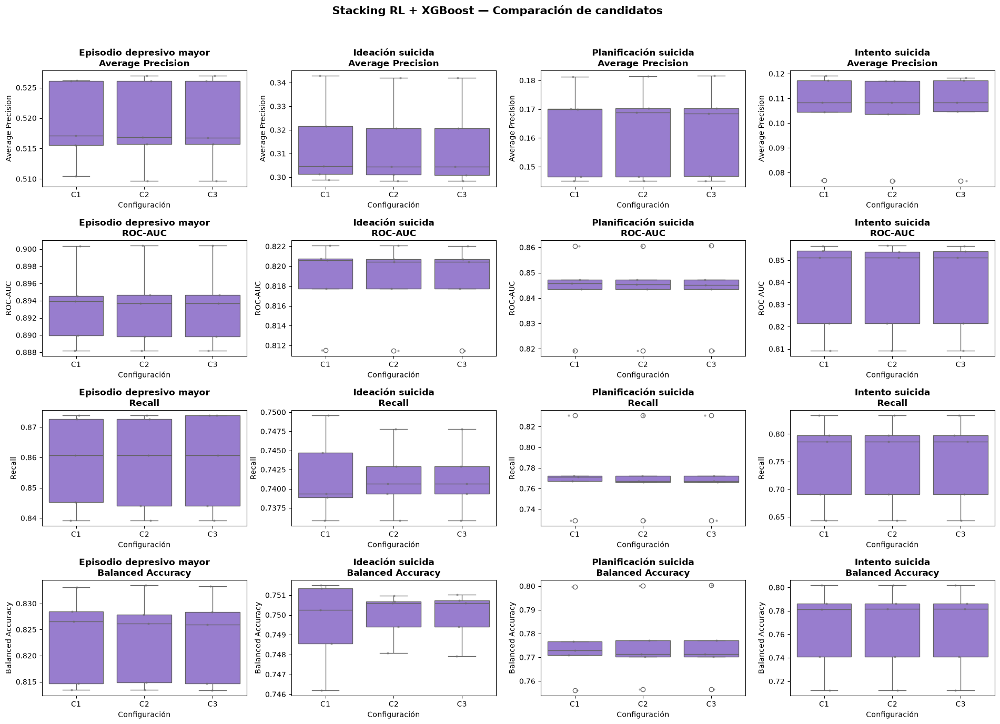

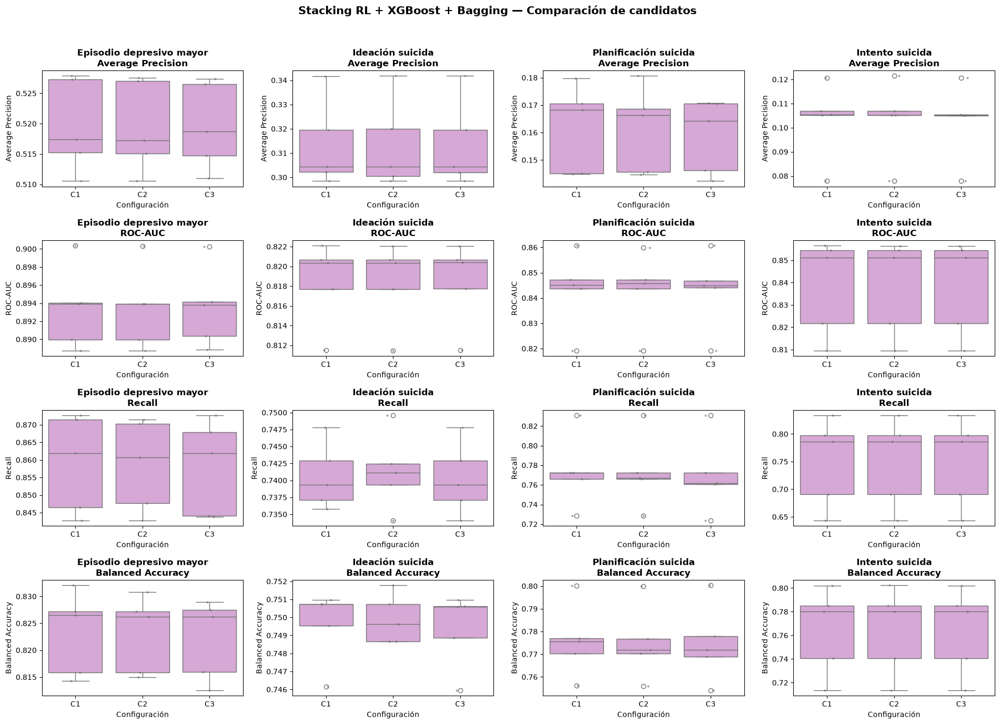


Probabilidades base recuperadas: 151,356 registros
Se omite el cálculo de Bagging.


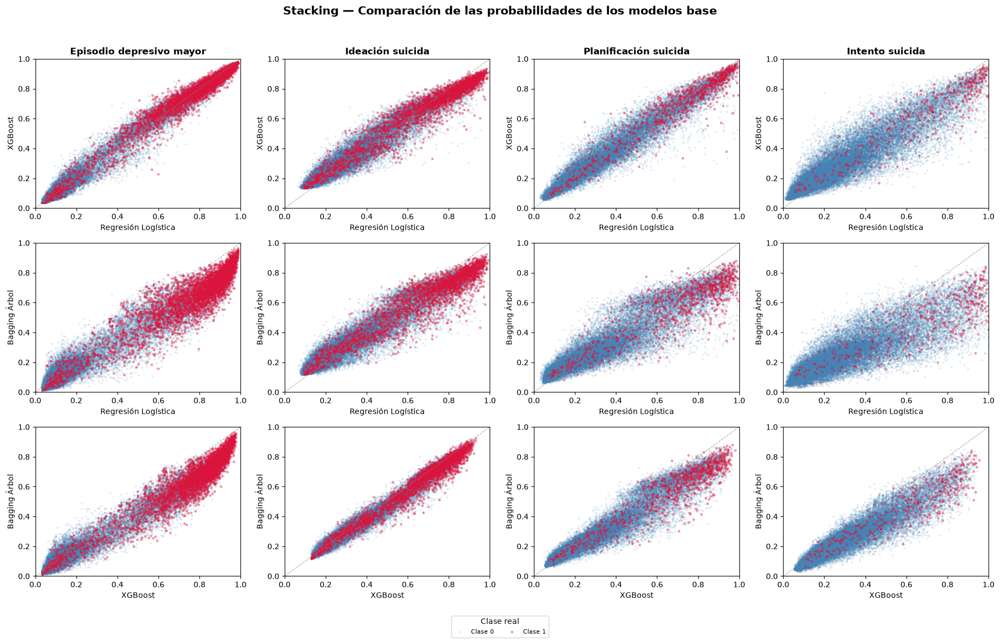


Configuraciones evaluadas: 48
Candidatos conservados: 24


In [45]:
# =============================================================================
# CONTRASTE MEDIANTE STACKING
# =============================================================================
print('\nCONTRASTE MEDIANTE STACKING')

modelos_base_stacking = ['Regresión Logística', 'XGBoost', 'Bagging Árbol']
nombres_modelos_stacking = ['Stacking RL+XGB', 'Stacking RL+XGB+Bagging']

n_folds_stacking = 3
cv_stacking = StratifiedKFold(n_splits=n_folds_stacking, shuffle=True, random_state=semilla)

parametros_stacking = {
    'modelo__final_estimator__C': [0.1, 1.0, 10.0],
    'modelo__final_estimator__l1_ratio': [0.0, 1.0]
}

n_jobs_stacking = 1 if usar_gpu_xgb else n_jobs_cpu

# -----------------------------------------------------------------------------
# REPRESENTACIÓN DEL PIPELINE
# -----------------------------------------------------------------------------
modelo_stacking_vista = construir_modelos_stacking(
    targets[0], cv_stacking
)['Stacking RL+XGB+Bagging']

pipeline_stacking_vista = pipeline_clasificacion(
    modelo_stacking_vista, vars_numericas_finales, vars_categoricas_finales,
    memory=str(ruta_cache_grid)
)

print('\nEstructura del pipeline de Stacking más completo:')
display(pipeline_stacking_vista)

# -----------------------------------------------------------------------------
# RECUPERACIÓN DE RESULTADOS
# -----------------------------------------------------------------------------
grid_stacking_previo, completados_stacking = recuperar_grid(
    ruta_grid_stacking, version_grid_stacking, targets, nombres_modelos_stacking
)

resultados_stacking = [grid_stacking_previo] if not grid_stacking_previo.empty else []

# -----------------------------------------------------------------------------
# AJUSTE POR VARIABLE OBJETIVO Y MODELO
# -----------------------------------------------------------------------------
for target in targets:
    modelos_target = construir_modelos_stacking(target, cv_stacking)

    for nombre in nombres_modelos_stacking:
        if (target, nombre) in completados_stacking:
            print(f'\n{target} — {nombre}: resultados disponibles — se omite')
            continue

        print(f'\nVariable objetivo: {target} — {titulos_targets[target]}')
        print(f'Modelo: {nombre}')

        pipeline = pipeline_clasificacion(
            modelos_target[nombre], vars_numericas_finales, vars_categoricas_finales,
            memory=str(ruta_cache_grid)
        )

        grid = GridSearchCV(
            pipeline, parametros_stacking, scoring=metricas_modelos, refit=False, cv=cv_modelos,
            n_jobs=n_jobs_stacking, verbose=verbose_grid, pre_dispatch=n_jobs_stacking,
            return_train_score=True, error_score='raise'
        )

        inicio_grid = perf_counter()
        grid.fit(X_train_final, y_train[target])
        print(f'  Ajuste finalizado en {perf_counter() - inicio_grid:.1f} s')

        resultados = pd.DataFrame(grid.cv_results_)
        resultados['target'] = target
        resultados['modelo'] = nombre
        resultados['version_grid'] = version_grid_stacking
        resultados_stacking.append(resultados)

        # ---------------------------------------------------------------------
        # CHECKPOINT
        # ---------------------------------------------------------------------
        _ = guardar_checkpoint_grid(resultados_stacking, nombre_grid_stacking)

        mejor = resultados.loc[resultados['mean_test_average_precision'].idxmax()]

        print(
            f'  Mejor Average Precision={mejor["mean_test_average_precision"]:.3f} | '
            f'ROC-AUC={mejor["mean_test_roc_auc"]:.3f} | '
            f'Recall={mejor["mean_test_recall"]:.3f} | '
            f'Balanced Accuracy={mejor["mean_test_balanced_accuracy"]:.3f}'
        )

# -----------------------------------------------------------------------------
# COMPARACIÓN CONJUNTA
# -----------------------------------------------------------------------------
grid_stacking = guardar_checkpoint_grid(resultados_stacking, nombre_grid_stacking)
grid_stacking = preparar_resultados_grid(grid_stacking)
grid_stacking = ranking_metricas(grid_stacking, ['target', 'modelo'], metricas_ranking)

candidatos_stacking = seleccionar_candidatos(grid_stacking)
candidatos_stacking['parametros'] = candidatos_stacking.apply(resumir_parametros, axis=1)

# -----------------------------------------------------------------------------
# CONFIGURACIÓN C1 POR MODELO Y VARIABLE OBJETIVO
# -----------------------------------------------------------------------------
configuraciones_stacking = candidatos_stacking[candidatos_stacking['candidato'].eq('C1')].copy()

configuraciones_stacking['objetivo'] = configuraciones_stacking['target'].map(titulos_targets)

tabla_configuraciones_stacking = preparar_tabla(
    configuraciones_stacking, columnas=[
        'objetivo', 'modelo', 'candidato', 'parametros', 'mean_test_average_precision',
        'std_test_average_precision', 'mean_test_roc_auc', 'std_test_roc_auc', 'mean_test_recall',
        'mean_test_precision', 'mean_test_f1', 'mean_test_balanced_accuracy',
        'gap_average_precision', 'gap_roc_auc'
    ], redondeo=3
)

print('\nConfiguración C1 por modelo Stacking y variable objetivo:')
mostrar_tabla_completa(tabla_configuraciones_stacking)

# -----------------------------------------------------------------------------
# BOXPLOTS
# -----------------------------------------------------------------------------
figuras_stacking = {
    'Stacking RL+XGB': (
        '22_boxplot_stacking_rl_xgb', 'Stacking RL + XGBoost — Comparación de candidatos'
    ),
    'Stacking RL+XGB+Bagging': (
        '23_boxplot_stacking_rl_xgb_bagging',
        'Stacking RL + XGBoost + Bagging — Comparación de candidatos'
    )
}

for nombre, (archivo, titulo) in figuras_stacking.items():
    boxplots_grid(
        candidatos_stacking, nombre, targets, titulos_targets, metricas_box, titulo, archivo
    )

# -----------------------------------------------------------------------------
# PROBABILIDADES DE LOS MODELOS BASE
# -----------------------------------------------------------------------------
columnas_probabilidades_base = [
    'v_probabilidades_base', 'target', 'indice_train', 'y_true'
] + modelos_base_stacking

n_probabilidades_base = len(X_train_final) * len(targets)
probabilidades_cargadas = False

if ruta_probs_base.is_file():
    probabilidades_base_stacking = pd.read_csv(ruta_probs_base, encoding=encoding_csv)

    probabilidades_cargadas = (
        'v_probabilidades_base' in probabilidades_base_stacking.columns and
        set(columnas_probabilidades_base).issubset(probabilidades_base_stacking.columns) and
        probabilidades_base_stacking['v_probabilidades_base'].eq(version_probs_base).all() and
        len(probabilidades_base_stacking) == n_probabilidades_base and
        set(probabilidades_base_stacking['target']) == set(targets) and not
        probabilidades_base_stacking.duplicated(['target', 'indice_train']).any() and not
        probabilidades_base_stacking[columnas_probabilidades_base].isna().any().any()
    )

    if probabilidades_cargadas:
        for target in targets:
            probabilidades_target = probabilidades_base_stacking.loc[
                probabilidades_base_stacking['target'].eq(target), ['indice_train', 'y_true']
            ].sort_values('indice_train')

            indices = probabilidades_target['indice_train'].to_numpy()

            if set(indices) != set(y_train.index):
                probabilidades_cargadas = False
                break

            if not np.array_equal(
                probabilidades_target['y_true'].to_numpy(), y_train.loc[indices, target].to_numpy()
            ):
                probabilidades_cargadas = False
                break

    if probabilidades_cargadas:
        print(f'\nProbabilidades base recuperadas: {len(probabilidades_base_stacking):,} registros')
        print('Se omite el cálculo de Bagging.')
    else:
        print('\nEl archivo de probabilidades no coincide y se calculará de nuevo.')

# -----------------------------------------------------------------------------
# CÁLCULO SOLO SI NO HAY RESULTADOS VÁLIDOS
# -----------------------------------------------------------------------------
if not probabilidades_cargadas:
    filas_probabilidades_base = [predicciones_modelos_individuales_cv[[
        'target', 'modelo', 'indice_train', 'y_true', 'y_score'
    ]].copy()]

    for target in targets:
        print(f'\nProbabilidades base: {target} — {titulos_targets[target]} — Bagging Árbol')

        modelo_bagging = dict(
            construir_modelos_stacking(target, cv_stacking)['Stacking RL+XGB+Bagging'].estimators
        )['bagging']

        pipeline_bagging = pipeline_clasificacion(
            modelo_bagging, vars_numericas_finales, vars_categoricas_finales,
            memory=str(ruta_cache_grid)
        )

        _, predicciones_bagging = evaluar_cv(
            pipeline_bagging, X_train_final, y_train[target], cv_modelos, verbose=True
        )

        predicciones_bagging['target'] = target
        predicciones_bagging['modelo'] = 'Bagging Árbol'
        filas_probabilidades_base.append(predicciones_bagging)

    predicciones_base_stacking = pd.concat(filas_probabilidades_base, ignore_index=True)
    probabilidades_base_stacking = predicciones_base_stacking.pivot(
        index=['target', 'indice_train', 'y_true'], columns='modelo', values='y_score'
    ).reset_index()

    probabilidades_base_stacking.columns.name = None
    probabilidades_base_stacking.insert(0, 'v_probabilidades_base', version_probs_base)

# -----------------------------------------------------------------------------
# COMPROBACIÓN
# -----------------------------------------------------------------------------
if len(probabilidades_base_stacking) != n_probabilidades_base:
    raise ValueError('El número de probabilidades base no coincide.')

if probabilidades_base_stacking.duplicated(['target', 'indice_train']).any():
    raise ValueError('Existen probabilidades base duplicadas.')

if probabilidades_base_stacking[modelos_base_stacking].isna().any().any():
    raise ValueError('Faltan probabilidades de algún modelo base.')

# -----------------------------------------------------------------------------
# REPRESENTACIÓN
# -----------------------------------------------------------------------------
grafico_senales_stacking(
    probabilidades_base_stacking, targets, titulos_targets, modelos_base_stacking,
    'Stacking — Comparación de las probabilidades de los modelos base',
    '24_senales_modelos_base_stacking'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(candidatos_stacking, '57_candidatos_stacking')

if not probabilidades_cargadas:
    _ = guardar_csv(probabilidades_base_stacking, nombre_probs_base)

print(f'\nConfiguraciones evaluadas: {len(grid_stacking):,}')
print(f'Candidatos conservados: {len(candidatos_stacking):,}')

### Resultados

El modelo **Stacking RL + XGBoost** selecciona penalización L2 y alcanza Average Precision de 0,519, 0,314, 0,163 y 0,105 para depresión, ideación, planificación e intento, respectivamente. Las mejoras respecto a las referencias individuales son reducidas, entre 0,001 y 0,006, mientras que ROC-AUC y Balanced Accuracy permanecen prácticamente estables.

Los boxplots muestran diferencias mínimas entre los valores de `C` y las penalizaciones evaluadas, lo que indica que el metamodelo se encuentra en una región estable.

La incorporación de **Bagging Árbol** únicamente mejora en una milésima el Average Precision de depresión, empeora los restantes targets y aumenta las diferencias TRAIN-CV, especialmente en depresión e intento. La comparación de probabilidades muestra además una elevada coincidencia entre los tres modelos base. Bagging introduce cierta dispersión adicional, pero no suficiente información complementaria para mejorar de forma consistente el Stacking.

Por tanto, la configuración **Stacking RL + XGBoost + Bagging** queda descartada. La mayor complejidad computacional no se traduce en una mejora predictiva suficiente, por lo que únicamente **Stacking RL + XGBoost** continúa hacia el ajuste final.

**Clasificación:** MEMORIA para la comparación de los dos modelos Stacking y la conclusión sobre Bagging; ANEXO para las rejillas completas y los boxplots.

## 5.2. Ajuste final de los modelos Stacking seleccionados

La comparación anterior selecciona **Stacking RL + XGBoost** como única configuración Stacking que merece continuar. En ideación y planificación este modelo mejora ligeramente las referencias individuales y, por tanto, se realiza una última comprobación de la regularización del metamodelo antes de incorporarlo a la comparación final.

La búsqueda inicial de Stacking selecciona una Regresión Logística con penalización L2 y `C=0.1` para ambos targets. Como este valor coincide con el límite inferior de la rejilla evaluada, se estudian valores adicionales comprendidos entre `C=0.01` y `C=0.50`.

Los modelos base, el preprocesamiento, la penalización L2, la validación interna de tres folds y la validación externa de cinco folds permanecen sin cambios. Únicamente se modifica la intensidad de regularización del metamodelo.

La búsqueda no utiliza una selección automática. Se comparan Average Precision, ROC-AUC, Recall, Precision, F1, Balanced Accuracy, dispersión entre folds y diferencias TRAIN-CV. Dada la finalidad preventiva del estudio, cuando varias configuraciones presentan una capacidad discriminante prácticamente equivalente se prioriza la que ofrece mayor Recall sin producir un deterioro relevante del resto de métricas.

El ajuste se limita a ideación y planificación, los dos targets para los que Stacking continuará posteriormente como candidato real frente a los modelos individuales.


AJUSTE FINAL DE LOS MODELOS STACKING SELECCIONADOS
Versión recuperada: v_grid_stack_fino
Configuraciones disponibles: 14
Rejilla completa.

IRSUICTHNK — Stacking RL+XGB: resultados disponibles — se omite

IRSUIPLANYR — Stacking RL+XGB: resultados disponibles — se omite

Resultados completos del ajuste:


,Descripción,C metamodelo,Average Precision CV,Average Precision CV std,ROC-AUC CV,ROC-AUC CV std,Recall CV,Recall CV std,Precision CV,Precision CV std,F1 CV,F1 CV std,Balanced Accuracy CV,Balanced Accuracy CV std,Diferencia Average Precision,Diferencia ROC-AUC
0,Ideación suicida,0.010,0.314,0.017,0.818,0.004,0.747,0.005,0.195,0.001,0.309,0.002,0.749,0.001,0.018,0.009
1,Ideación suicida,0.020,0.314,0.017,0.819,0.004,0.744,0.006,0.196,0.002,0.310,0.002,0.749,0.003,0.017,0.009
2,Ideación suicida,0.050,0.314,0.017,0.819,0.004,0.743,0.006,0.197,0.002,0.312,0.003,0.750,0.002,0.017,0.009
3,Ideación suicida,0.075,0.314,0.017,0.819,0.004,0.742,0.006,0.197,0.002,0.311,0.002,0.749,0.002,0.016,0.008
4,Ideación suicida,0.100,0.314,0.017,0.819,0.004,0.742,0.005,0.197,0.002,0.312,0.002,0.750,0.002,0.016,0.008
5,Ideación suicida,0.200,0.314,0.017,0.819,0.004,0.741,0.005,0.198,0.002,0.312,0.002,0.750,0.002,0.016,0.008
6,Ideación suicida,0.500,0.313,0.016,0.818,0.004,0.742,0.004,0.198,0.002,0.313,0.002,0.750,0.002,0.015,0.008
7,Planificación suicida,0.010,0.163,0.014,0.843,0.013,0.778,0.033,0.080,0.002,0.145,0.004,0.775,0.015,0.018,0.018
8,Planificación suicida,0.020,0.163,0.014,0.843,0.013,0.775,0.033,0.081,0.002,0.146,0.004,0.775,0.014,0.018,0.018
9,Planificación suicida,0.050,0.163,0.014,0.843,0.013,0.775,0.033,0.081,0.002,0.147,0.004,0.775,0.014,0.018,0.018


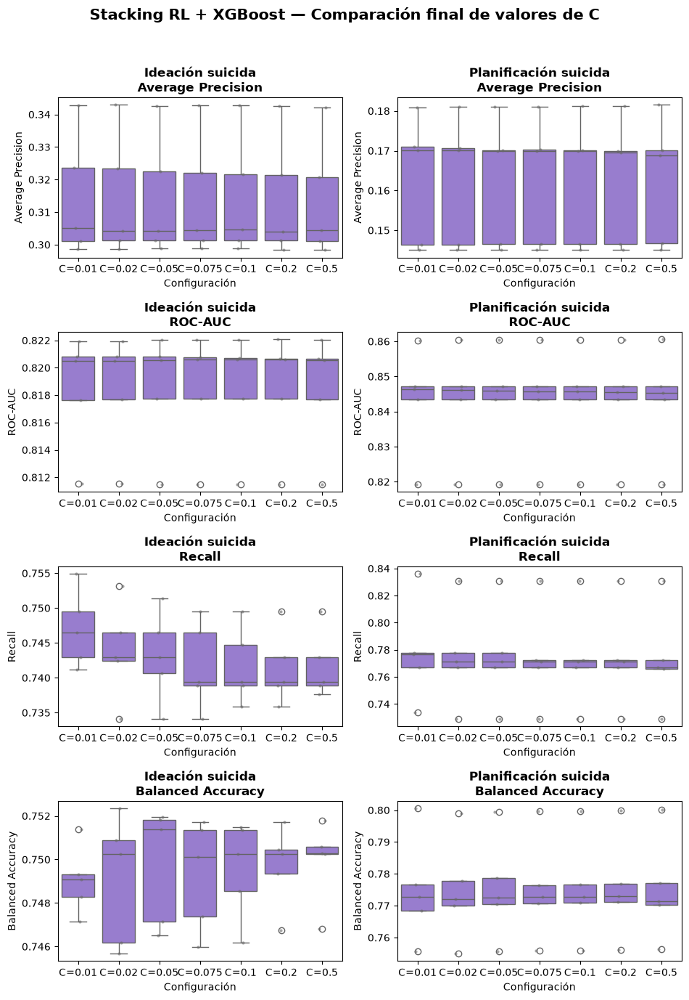


Configuraciones evaluadas: 14


In [46]:
# =============================================================================
# AJUSTE FINAL DE LOS MODELOS STACKING SELECCIONADOS
# =============================================================================
print('\nAJUSTE FINAL DE LOS MODELOS STACKING SELECCIONADOS')

targets_stacking_fino = ['IRSUICTHNK', 'IRSUIPLANYR']
modelos_stacking_fino = ['Stacking RL+XGB']

parametros_stacking_fino = {
    'modelo__final_estimator__C': [0.01, 0.02, 0.05, 0.075, 0.1, 0.2, 0.5]
}

# -----------------------------------------------------------------------------
# RECUPERACIÓN DE RESULTADOS
# -----------------------------------------------------------------------------
grid_stacking_fino_previo, completados_stacking_fino = recuperar_grid(
    ruta_grid_stack_fino, version_grid_stack_fino, targets_stacking_fino, modelos_stacking_fino
)

resultados_stacking_fino = (
    [grid_stacking_fino_previo] if not grid_stacking_fino_previo.empty else []
)

# -----------------------------------------------------------------------------
# AJUSTE POR VARIABLE OBJETIVO
# -----------------------------------------------------------------------------
for target in targets_stacking_fino:
    nombre = 'Stacking RL+XGB'

    if (target, nombre) in completados_stacking_fino:
        print(f'\n{target} — {nombre}: resultados disponibles — se omite')
        continue

    print(f'\nVariable objetivo: {target} — {titulos_targets[target]}')
    print(f'Modelo: {nombre}')
    print(f'Configuraciones: {len(parametros_stacking_fino["modelo__final_estimator__C"])}')

    pipeline = pipeline_stacking_seleccionado(target)

    grid = GridSearchCV(
        pipeline, parametros_stacking_fino, scoring=metricas_modelos, refit=False, cv=cv_modelos,
        n_jobs=n_jobs_stacking, verbose=verbose_grid, pre_dispatch=n_jobs_stacking,
        return_train_score=True, error_score='raise'
    )

    inicio_grid = perf_counter()
    grid.fit(X_train_final, y_train[target])
    print(f'  Ajuste finalizado en {perf_counter() - inicio_grid:.1f} s')

    resultados = pd.DataFrame(grid.cv_results_)
    resultados['param_modelo__final_estimator__l1_ratio'] = 0.0
    resultados['target'] = target
    resultados['modelo'] = nombre
    resultados['version_grid'] = version_grid_stack_fino
    resultados_stacking_fino.append(resultados)

    # -------------------------------------------------------------------------
    # CHECKPOINT
    # -------------------------------------------------------------------------
    _ = guardar_checkpoint_grid(resultados_stacking_fino, nombre_grid_stack_fino)

    mejor = resultados.loc[resultados['mean_test_average_precision'].idxmax()]

    print(
        f'  Mejor Average Precision={mejor["mean_test_average_precision"]:.3f} | '
        f'ROC-AUC={mejor["mean_test_roc_auc"]:.3f} | Recall={mejor["mean_test_recall"]:.3f} | '
        f'Balanced Accuracy={mejor["mean_test_balanced_accuracy"]:.3f}'
    )

# -----------------------------------------------------------------------------
# COMPARACIÓN DE RESULTADOS
# -----------------------------------------------------------------------------
grid_stacking_fino = guardar_checkpoint_grid(resultados_stacking_fino, nombre_grid_stack_fino)
grid_stacking_fino = preparar_resultados_grid(grid_stacking_fino)

if len(grid_stacking_fino) != (
    len(targets_stacking_fino) * len(parametros_stacking_fino['modelo__final_estimator__C'])
):
    raise ValueError('No están disponibles todas las configuraciones esperadas.')

grid_stacking_fino['objetivo'] = grid_stacking_fino['target'].map(titulos_targets)

grid_stacking_fino = grid_stacking_fino.sort_values(
    ['target', 'param_modelo__final_estimator__C']
).reset_index(drop=True)

tabla_stacking_fino = preparar_tabla(
    grid_stacking_fino, columnas=[
        'objetivo', 'param_modelo__final_estimator__C', 'mean_test_average_precision',
        'std_test_average_precision', 'mean_test_roc_auc', 'std_test_roc_auc', 'mean_test_recall',
        'std_test_recall', 'mean_test_precision', 'std_test_precision', 'mean_test_f1',
        'std_test_f1', 'mean_test_balanced_accuracy', 'std_test_balanced_accuracy',
        'gap_average_precision', 'gap_roc_auc'
    ], redondeo=3
)

print('\nResultados completos del ajuste:')
mostrar_tabla_completa(tabla_stacking_fino)

# -----------------------------------------------------------------------------
# BOXPLOTS
# -----------------------------------------------------------------------------
grid_stacking_plot = grid_stacking_fino.copy()
grid_stacking_plot['candidato'] = 'C=' + grid_stacking_plot[
    'param_modelo__final_estimator__C'
].map(lambda valor: f'{valor:g}')

boxplots_grid(
    grid_stacking_plot, 'Stacking RL+XGB', targets_stacking_fino, titulos_targets, metricas_box,
    'Stacking RL + XGBoost — Comparación final de valores de C',
    '25_boxplot_ajuste_fino_stacking'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(tabla_stacking_fino, '59_resumen_stacking_fino')

print(f'\nConfiguraciones evaluadas: {len(grid_stacking_fino):,}')

In [47]:
# -----------------------------------------------------------------------------
# SELECCIÓN FINAL DEL STACKING
# -----------------------------------------------------------------------------
c_stacking_final = {
    'IRSUICTHNK': 0.01,
    'IRSUIPLANYR': 0.01
}

filas_stacking_fino = []

for target, valor_c in c_stacking_final.items():
    fila = grid_stacking_fino[
        grid_stacking_fino['target'].eq(target) &
        np.isclose(grid_stacking_fino['param_modelo__final_estimator__C'], valor_c)
    ].copy()

    if len(fila) != 1:
        raise ValueError(f'Debe existir una única configuración seleccionada para {target}.')

    filas_stacking_fino.append(fila)

configuraciones_stacking_fino = pd.concat(filas_stacking_fino, ignore_index=True)

configuraciones_stacking_fino['candidato'] = 'Selección razonada'
configuraciones_stacking_fino['objetivo'] = configuraciones_stacking_fino[
    'target'
].map(titulos_targets)

configuraciones_stacking_fino['parametros'] = configuraciones_stacking_fino.apply(
    resumir_parametros, axis=1
)

# -----------------------------------------------------------------------------
# ACTUALIZACIÓN DE LAS CONFIGURACIONES DE STACKING
# -----------------------------------------------------------------------------
es_stacking_fino = (
    configuraciones_stacking['target'].isin(c_stacking_final) &
    configuraciones_stacking['modelo'].eq('Stacking RL+XGB')
)

configuraciones_stacking = pd.concat([
    configuraciones_stacking.loc[~es_stacking_fino], configuraciones_stacking_fino
], ignore_index=True, sort=False)

tabla_stacking_seleccionado = preparar_tabla(
    configuraciones_stacking_fino, columnas=[
        'objetivo', 'modelo', 'parametros', 'mean_test_average_precision',
        'std_test_average_precision', 'mean_test_roc_auc', 'mean_test_recall', 'std_test_recall',
        'mean_test_precision', 'mean_test_f1', 'mean_test_balanced_accuracy',
        'gap_average_precision', 'gap_roc_auc'
    ], redondeo=3
)

print('\nConfiguraciones seleccionadas de forma razonada:')
display(tabla_stacking_seleccionado)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(configuraciones_stacking_fino, '60_seleccion_razonada_stacking_fino')


Configuraciones seleccionadas de forma razonada:


,Descripción,Modelo,Parámetros,Average Precision CV,Average Precision CV std,ROC-AUC CV,Recall CV,Recall CV std,Precision CV,F1 CV,Balanced Accuracy CV,Diferencia Average Precision,Diferencia ROC-AUC
0,Ideación suicida,Stacking RL+XGB,"meta: C=0.01, L2",0.314,0.017,0.818,0.747,0.005,0.195,0.309,0.749,0.018,0.009
1,Planificación suicida,Stacking RL+XGB,"meta: C=0.01, L2",0.163,0.014,0.843,0.778,0.033,0.080,0.145,0.775,0.018,0.018


### Resultados

El ajuste final estudia siete valores de `C` entre 0,01 y 0,50 para los modelos Stacking de ideación y planificación, manteniendo fijos la penalización L2, los modelos base y el resto de la configuración.

En ideación, Average Precision se mantiene en 0,314 entre `C=0.01` y `C=0.20`, mientras que ROC-AUC y Balanced Accuracy presentan variaciones inferiores a una milésima. `C=0.01` alcanza el mayor Recall, con 0,747 y una desviación de 0,005. Esta mejora implica una pequeña reducción de Precision y F1, pero se considera adecuada dada la prioridad concedida a la detección de positivos.

En planificación, las configuraciones comprendidas entre `C=0.01` y `C=0.10` obtienen un Average Precision de 0,163 y resultados prácticamente idénticos de ROC-AUC y Balanced Accuracy. `C=0.01` presenta el mayor Recall, con 0,778 y una desviación de 0,033. La reducción de Precision respecto a las configuraciones próximas es de una milésima.

Los boxplots confirman que las diferencias de capacidad discriminante son mínimas y que la principal variación aparece en el equilibrio entre Recall y Precision. De acuerdo con la finalidad preventiva del estudio, se selecciona razonadamente **`C=0.01` para ideación y planificación**.

No se amplía nuevamente la búsqueda. La estabilidad de las métricas confirma que se ha identificado una región suficientemente regularizada. Cualquier aumento posterior del Recall mediante modificación del umbral deberá estudiarse fuera de esta fase y sin utilizar TEST para ajustar la selección.

**Clasificación:** MEMORIA para la selección final del Stacking; ANEXO para la tabla completa de configuraciones y los boxplots.

## Síntesis de la sección 5 (memoria)

El bloque Stacking combina Regresión Logística y XGBoost como modelos base y evalúa también una variante que incorpora Bagging Árbol. La comparación mediante validación cruzada muestra que añadir Bagging no proporciona una mejora suficiente para justificar el aumento de complejidad, por lo que la arquitectura final mantiene únicamente Regresión Logística y XGBoost.

El ajuste del metamodelo confirma una Regresión Logística con regularización L2 y `C=0.01` para ideación suicida y planificación suicida. Con esta configuración, el Stacking alcanza un mejor equilibrio conjunto que los modelos individuales considerados para estas dos variables objetivo.

La selección del Stacking no se basa exclusivamente en una única métrica, sino en la lectura conjunta de Average Precision, ROC-AUC, Recall, Precision, F2, Balanced Accuracy y estabilidad entre particiones, manteniendo especial atención a la detección de la clase positiva.

**Tabla candidata:** configuración y métricas de los Stacking seleccionados.

**Figura candidata:** comparación entre modelos base y Stacking para ideación y planificación suicida.

**Destino:** MEMORIA + ANEXO.

# 6. Comparación y selección final de modelos ML

Una vez cerrados los modelos individuales y el ajuste de Stacking se realiza la comparación final de Machine Learning. En esta etapa ya no se buscan nuevas familias, hiperparámetros ni estrategias de tratamiento del desbalanceo. El objetivo es comparar bajo las mismas condiciones Regresión Logística, XGBoost y Stacking RL + XGBoost y seleccionar razonadamente un modelo para cada target.

La comparación continúa utilizando exclusivamente TRAIN mediante validación cruzada estratificada de cinco folds. TEST no participa en la selección final de Machine Learning y permanece reservado para la evaluación predictiva posterior frente a Deep Learning.

La elección se realiza individualmente para cada variable objetivo. Average Precision continúa como métrica discriminante principal, mientras que Recall y Recall mínimo adquieren especial importancia por la finalidad preventiva del estudio. Precision, F1, F2, Balanced Accuracy, Especificidad, variabilidad entre folds y diferencias entre TRAIN y validación permiten comprobar que una mejora en detección no se obtiene a costa de una pérdida desproporcionada de estabilidad o control de falsos positivos.

El punto finaliza entrenando sobre TRAIN completo los cuatro pipelines seleccionados, o recuperándolos si ya existe un archivo compatible, y guardando toda la información necesaria para reproducir posteriormente la inferencia sobre TEST.

## 6.1. Comparación final de los candidatos ML

La comparación final reúne Regresión Logística, XGBoost y Stacking RL + XGBoost para los cuatro targets. De este modo, los tres candidatos se contrastan mediante los mismos folds y utilizando exactamente las mismas 59 variables originales y 67 variables de entrada.

F2 complementa a F1 asignando mayor importancia al Recall. La estabilidad se analiza mediante la desviación entre folds y el menor Recall obtenido en cualquiera de ellos, lo que permite comprobar si un resultado medio favorable depende de algún fold especialmente beneficioso.

Además de la tabla de métricas se utilizan boxplots, matrices de confusión y curvas Precision-Recall. Estas representaciones permiten interpretar conjuntamente capacidad discriminante, detección de positivos y coste en falsos positivos.

Los resultados de esta comparación ya han sido calculados durante el desarrollo del notebook. Antes de volver a ejecutar la validación cruzada se comprobará si los archivos guardados corresponden exactamente a las configuraciones actualmente seleccionadas. Solo si no pueden recuperarse de forma segura se repetirá el cálculo.


COMPARACIÓN FINAL DE LOS CANDIDATOS ML



Comparación final recuperada correctamente. Se omite la validación de Stacking.



Comparación conjunta de los modelos finalistas:


,Descripción,Modelo,Parámetros,Average Precision,Average Precision std,ROC-AUC,ROC-AUC std,Recall,Recall std,Recall mínimo,Precision,Precision std,F1,F1 std,F2,F2 std,Balanced Accuracy,Balanced Accuracy std,Especificidad,Diferencia Average Precision,Diferencia ROC-AUC
0,Episodio depresivo mayor,Regresión Logística,"C=0.05, L1",0.514,0.006,0.892,0.005,0.858,0.015,0.838,0.338,0.008,0.485,0.010,0.656,0.012,0.824,0.009,0.790,0.005,0.003
1,Episodio depresivo mayor,Stacking RL+XGB,"meta: C=0.1, L2",0.519,0.007,0.893,0.005,0.858,0.016,0.839,0.336,0.007,0.483,0.009,0.655,0.012,0.823,0.009,0.788,0.018,0.006
2,Episodio depresivo mayor,XGBoost,"lr=0.05, depth=3, n=150, sub=0.8, col=0.8",0.518,0.008,0.893,0.005,0.864,0.015,0.846,0.330,0.008,0.478,0.010,0.653,0.012,0.822,0.009,0.781,0.029,0.008
3,Ideación suicida,Regresión Logística,"C=0.05, L1",0.308,0.015,0.818,0.004,0.731,0.009,0.722,0.201,0.001,0.315,0.002,0.478,0.003,0.748,0.003,0.766,0.008,0.007
4,Ideación suicida,Stacking RL+XGB,"meta: C=0.01, L2",0.314,0.019,0.818,0.004,0.747,0.005,0.741,0.195,0.002,0.309,0.002,0.476,0.002,0.749,0.002,0.751,0.018,0.009
5,Ideación suicida,XGBoost,"lr=0.03, depth=3, n=125, sub=0.8, col=0.8",0.310,0.021,0.815,0.004,0.739,0.011,0.727,0.197,0.001,0.311,0.001,0.477,0.004,0.748,0.004,0.758,0.028,0.011
6,Planificación suicida,Regresión Logística,"C=0.02, L1",0.158,0.012,0.842,0.015,0.757,0.039,0.707,0.085,0.002,0.152,0.004,0.293,0.010,0.774,0.017,0.791,0.004,0.013
7,Planificación suicida,Stacking RL+XGB,"meta: C=0.01, L2",0.163,0.016,0.843,0.015,0.778,0.037,0.734,0.080,0.002,0.145,0.005,0.283,0.010,0.775,0.016,0.771,0.018,0.018
8,Planificación suicida,XGBoost,"lr=0.04, depth=2, n=225, sub=0.8, col=0.8",0.161,0.018,0.841,0.015,0.760,0.044,0.702,0.084,0.004,0.152,0.007,0.292,0.014,0.775,0.020,0.789,0.029,0.023
9,Intento suicida,Regresión Logística,"C=0.02, L1",0.100,0.017,0.839,0.020,0.726,0.065,0.655,0.041,0.003,0.077,0.005,0.167,0.012,0.768,0.030,0.809,0.005,0.033


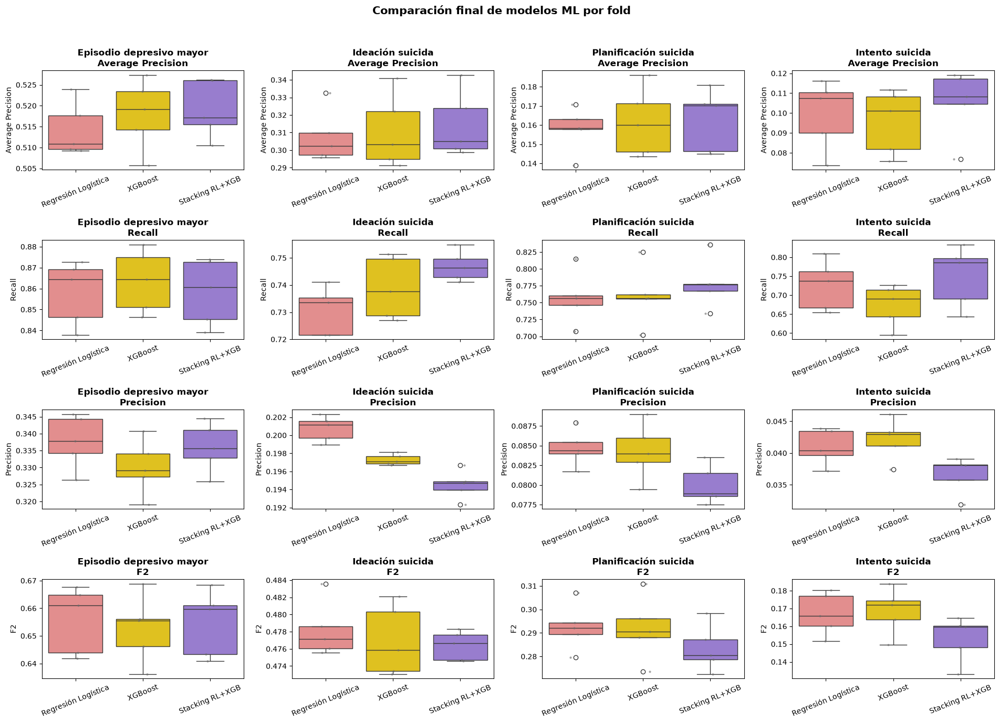

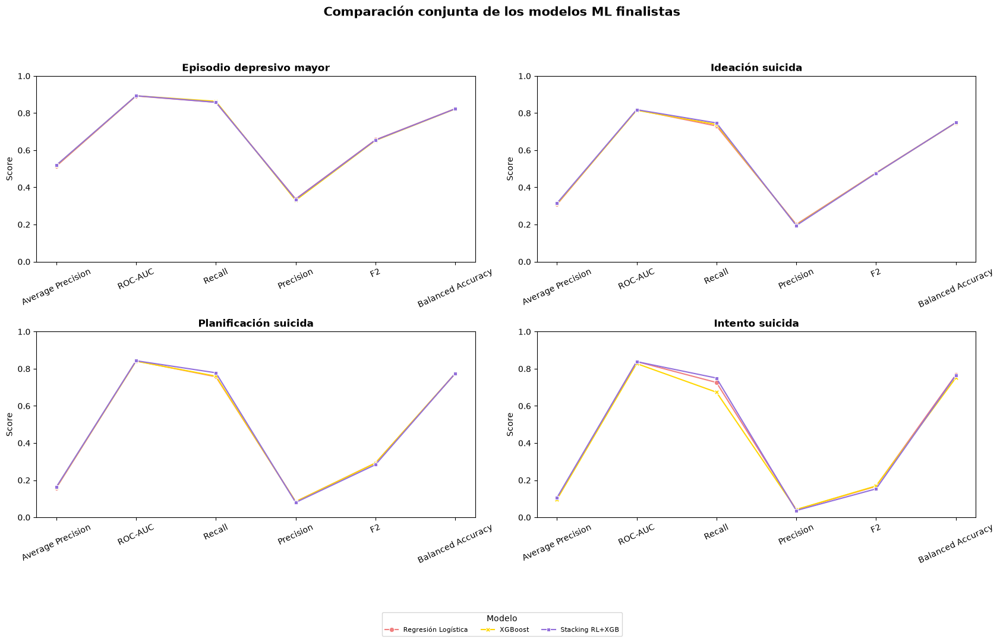

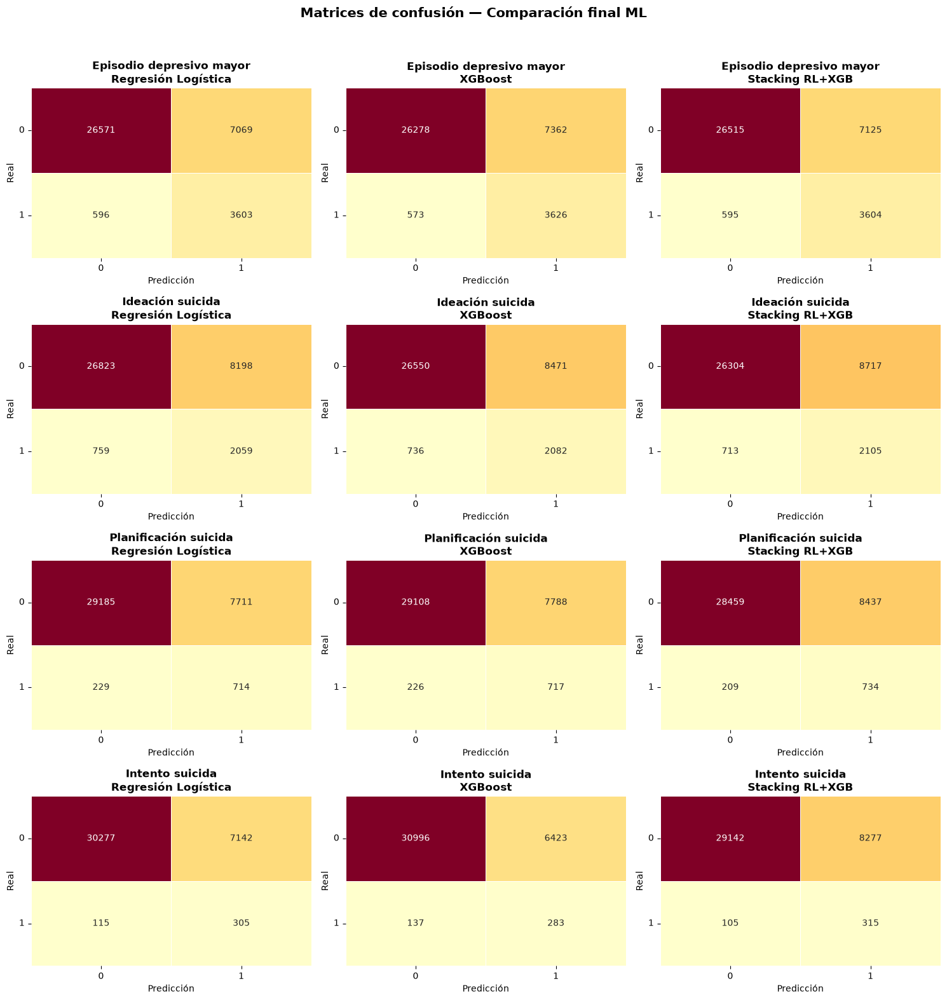

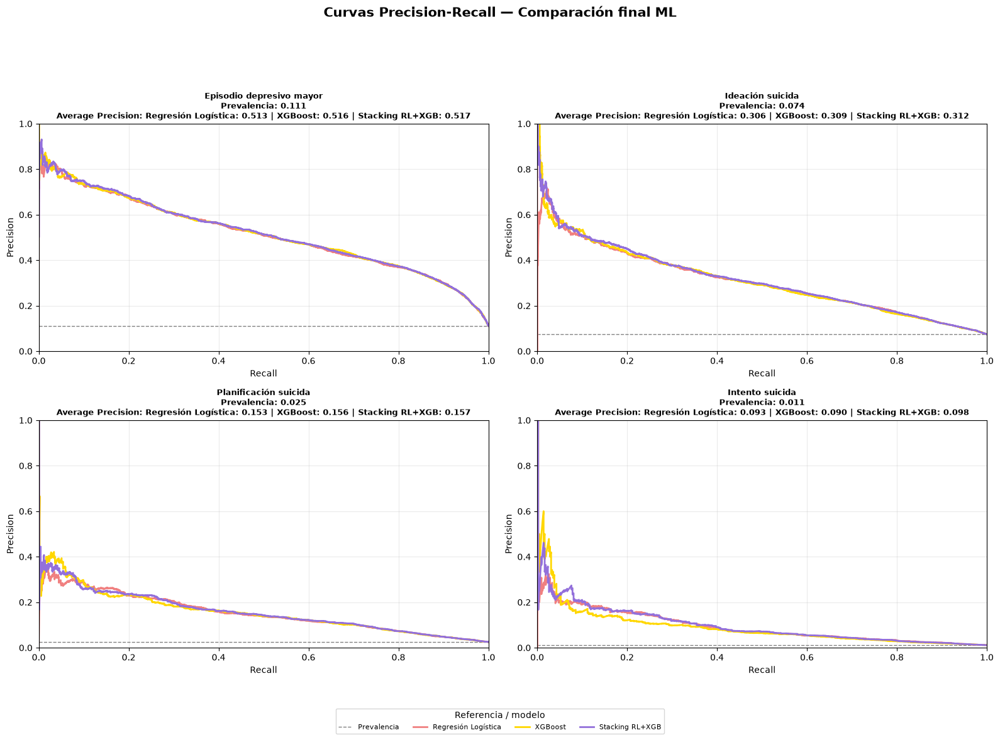

In [48]:
# =============================================================================
# COMPARACIÓN FINAL DE LOS CANDIDATOS ML
# =============================================================================
print('\nCOMPARACIÓN FINAL DE LOS CANDIDATOS ML')

modelos_comparacion_final = [
    'Regresión Logística',
    'XGBoost',
    'Stacking RL+XGB'
]

metricas_box_final = [
    ('average_precision', 'Average Precision'),
    ('recall', 'Recall'),
    ('precision', 'Precision'),
    ('f2', 'F2')
]

metricas_comparacion_final = [
    ('average_precision', 'Average Precision'),
    ('roc_auc', 'ROC-AUC'),
    ('recall', 'Recall'),
    ('precision', 'Precision'),
    ('f2', 'F2'),
    ('balanced_accuracy', 'Balanced Accuracy')
]

# -----------------------------------------------------------------------------
# CONFIGURACIONES A COMPARAR
# -----------------------------------------------------------------------------
configuraciones_comparacion_final = pd.concat([
    configuraciones_modelos_individuales[columnas_configuracion_modelos],
    configuraciones_stacking.query("modelo == 'Stacking RL+XGB'")[columnas_configuracion_modelos]
], ignore_index=True)

if (
    len(configuraciones_comparacion_final) != len(targets) * len(modelos_comparacion_final) or
    configuraciones_comparacion_final.duplicated(['target', 'modelo']).any()
):
    raise ValueError('Las configuraciones de la comparación final no son correctas.')

# -----------------------------------------------------------------------------
# RECUPERACIÓN DE LA COMPARACIÓN FINAL
# -----------------------------------------------------------------------------
ruta_cv_comparacion_final = ruta_tablas / '61_comparacion_final_ml_cv.csv'
ruta_predicciones_comparacion_final = ruta_tablas / '62_predicciones_comparacion_final_ml_cv.csv'
ruta_resumen_comparacion_final = ruta_tablas / '63_resumen_comparacion_final_ml.csv'

if ruta_predicciones_comparacion_final.is_file():
    ruta_predicciones_recuperacion = ruta_predicciones_comparacion_final

comparacion_final_recuperada = False
n_cv_esperado = n_folds * len(targets) * len(modelos_comparacion_final)
n_predicciones_esperado = len(X_train_final) * len(targets) * len(modelos_comparacion_final)

if (
    ruta_cv_comparacion_final.is_file() and ruta_predicciones_recuperacion.is_file() and
    ruta_resumen_comparacion_final.is_file()
):
    try:
        cv_comparacion_final_ml = pd.read_csv(ruta_cv_comparacion_final, encoding=encoding_csv)
        predicciones_comparacion_final_ml_cv = pd.read_csv(
            ruta_predicciones_recuperacion, encoding=encoding_csv
        )
        resumen_comparacion_guardado = pd.read_csv(
            ruta_resumen_comparacion_final, encoding=encoding_csv
        )

        parametros_esperados = configuraciones_comparacion_final.set_index(
            ['target', 'modelo']
        )['parametros'].to_dict()

        parametros_guardados = resumen_comparacion_guardado.set_index(
            ['target', 'modelo']
        )['parametros'].to_dict()

        comparacion_final_recuperada = (
            len(cv_comparacion_final_ml) == n_cv_esperado and
            len(predicciones_comparacion_final_ml_cv) == n_predicciones_esperado and
            set(cv_comparacion_final_ml['target']) == set(targets) and
            set(cv_comparacion_final_ml['modelo']) == set(modelos_comparacion_final) and
            parametros_guardados == parametros_esperados and not
            predicciones_comparacion_final_ml_cv.duplicated(
                ['target', 'modelo', 'indice_train']
            ).any() and not
            predicciones_comparacion_final_ml_cv['y_score'].isna().any()
        )

    except (OSError, ValueError, KeyError, TypeError):
        comparacion_final_recuperada = False

if comparacion_final_recuperada:
    print('\nComparación final recuperada correctamente. Se omite la validación de Stacking.')

else:
    # -------------------------------------------------------------------------
    # VALIDACIÓN CRUZADA DEL STACKING SELECCIONADO
    # -------------------------------------------------------------------------
    filas_cv_stacking, filas_predicciones_stacking = [], []

    for i_target, target in enumerate(targets, start=1):
        print(f'\n[{i_target}/{len(targets)}] {target} — {titulos_targets[target]}')

        resultados_cv, predicciones_cv = evaluar_cv(
            pipeline_stacking_seleccionado(target), X_train_final, y_train[target],
            cv_modelos, verbose=True
        )

        resultados_cv['target'] = target
        resultados_cv['modelo'] = 'Stacking RL+XGB'
        predicciones_cv['target'] = target
        predicciones_cv['modelo'] = 'Stacking RL+XGB'

        filas_cv_stacking.append(resultados_cv)
        filas_predicciones_stacking.append(predicciones_cv)

    cv_stacking_seleccionado = pd.concat(filas_cv_stacking, ignore_index=True)
    predicciones_stacking_cv = pd.concat(filas_predicciones_stacking, ignore_index=True)

    cv_comparacion_final_ml = pd.concat([
        cv_modelos_individuales, cv_stacking_seleccionado
    ], ignore_index=True, sort=False)

    predicciones_comparacion_final_ml_cv = pd.concat([
        predicciones_modelos_individuales_cv, predicciones_stacking_cv
    ], ignore_index=True)

# -----------------------------------------------------------------------------
# F2 Y COMPROBACIÓN
# -----------------------------------------------------------------------------
denominador_f2 = 4 * cv_comparacion_final_ml['precision'] + cv_comparacion_final_ml['recall']

cv_comparacion_final_ml['f2'] = (
    5 * cv_comparacion_final_ml['precision'] * cv_comparacion_final_ml['recall'] / denominador_f2
).fillna(0)

if len(cv_comparacion_final_ml) != n_cv_esperado:
    raise ValueError('El número de resultados por fold no coincide.')

if len(predicciones_comparacion_final_ml_cv) != n_predicciones_esperado:
    raise ValueError('El número de predicciones de validación no coincide.')

if predicciones_comparacion_final_ml_cv.duplicated(
    ['target', 'modelo', 'indice_train']
).any():
    raise ValueError('Existen predicciones de validación duplicadas.')

if predicciones_comparacion_final_ml_cv['y_score'].isna().any():
    raise ValueError('Existen probabilidades ausentes en la comparación final.')

# -----------------------------------------------------------------------------
# RESUMEN DE MÉTRICAS Y ESTABILIDAD
# -----------------------------------------------------------------------------
resumen_comparacion_final_ml = cv_comparacion_final_ml.groupby(
    ['target', 'modelo'], as_index=False
).agg(
    average_precision=('average_precision', 'mean'),
    average_precision_std=('average_precision', 'std'),
    roc_auc=('roc_auc', 'mean'),
    roc_auc_std=('roc_auc', 'std'),
    recall=('recall', 'mean'),
    recall_std=('recall', 'std'),
    recall_min=('recall', 'min'),
    precision=('precision', 'mean'),
    precision_std=('precision', 'std'),
    f1=('f1', 'mean'),
    f1_std=('f1', 'std'),
    f2=('f2', 'mean'),
    f2_std=('f2', 'std'),
    balanced_accuracy=('balanced_accuracy', 'mean'),
    balanced_accuracy_std=('balanced_accuracy', 'std'),
    specificity=('specificity', 'mean')
)

resumen_comparacion_final_ml = resumen_comparacion_final_ml.merge(
    configuraciones_comparacion_final, on=['target', 'modelo'], how='left', validate='one_to_one'
)

resumen_comparacion_final_ml['objetivo'] = resumen_comparacion_final_ml[
    'target'
].map(titulos_targets)

tabla_comparacion_final_ml = preparar_tabla(
    resumen_comparacion_final_ml, columnas=[
        'objetivo', 'modelo', 'parametros', 'average_precision', 'average_precision_std',
        'roc_auc', 'roc_auc_std', 'recall', 'recall_std', 'recall_min', 'precision',
        'precision_std', 'f1', 'f1_std', 'f2', 'f2_std', 'balanced_accuracy',
        'balanced_accuracy_std', 'specificity', 'gap_average_precision', 'gap_roc_auc'
    ], redondeo=3
)

print('\nComparación conjunta de los modelos finalistas:')
mostrar_tabla_completa(tabla_comparacion_final_ml)

# -----------------------------------------------------------------------------
# COMPARACIÓN VISUAL
# -----------------------------------------------------------------------------
boxplots_cv_modelos(
    cv_comparacion_final_ml, targets, titulos_targets, metricas_box_final,
    modelos_comparacion_final, 'Comparación final de modelos ML por fold',
    '26_boxplot_comparacion_final_ml'
)

grafico_metricas_cv(
    resumen_comparacion_final_ml, targets, titulos_targets, metricas_comparacion_final,
    modelos_comparacion_final, 'Comparación conjunta de los modelos ML finalistas',
    '27_metricas_comparacion_final_ml'
)

matrices_confusion_cv(
    predicciones_comparacion_final_ml_cv, targets, modelos_comparacion_final, titulos_targets,
    'modelo', 'Matrices de confusión — Comparación final ML',
    '28_matrices_confusion_comparacion_final_ml'
)

curvas_precision_recall(
    predicciones_comparacion_final_ml_cv, targets, titulos_targets, modelos_comparacion_final,
    'Curvas Precision-Recall — Comparación final ML', '29_curvas_precision_recall_comparacion_ml'
)

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(cv_comparacion_final_ml, '61_comparacion_final_ml_cv')
_ = guardar_csv(predicciones_comparacion_final_ml_cv, '62_predicciones_comparacion_final_ml_cv')
_ = guardar_csv(resumen_comparacion_final_ml, '63_resumen_comparacion_final_ml')

### Resultados

La comparación conjunta confirma que las diferencias entre los tres modelos son moderadas, aunque permite distinguir su capacidad de detección y su estabilidad entre folds.

En **episodio depresivo mayor**, XGBoost alcanza el mayor Recall medio y mínimo, con valores de 0,864 y 0,846. Regresión Logística mantiene una ligera ventaja en Precision, F2 y Balanced Accuracy, pero XGBoost detecta 23 positivos adicionales y conserva valores de Average Precision y ROC-AUC próximos al máximo. Dada la prioridad concedida a la detección de positivos, se selecciona **XGBoost**.

En **ideación suicida**, Stacking RL + XGBoost ajustado con `C=0.01` obtiene el mayor Recall medio, 0,747, la menor desviación, 0,005, y el mayor Recall mínimo, 0,741. Frente a Regresión Logística detecta 46 positivos adicionales, aunque genera 519 falsos positivos más. Average Precision aumenta de 0,308 a 0,314, mientras que F2 disminuye únicamente de 0,478 a 0,476. La mejora en detección y estabilidad justifica la selección de **Stacking RL + XGBoost**.

En **planificación suicida**, Stacking incrementa el Recall hasta 0,778 y su valor mínimo hasta 0,734, superando a Regresión Logística y XGBoost. Frente a Regresión Logística detecta 20 positivos adicionales a cambio de 726 falsos positivos más y de una reducción de F2 de 0,293 a 0,283. Dada la finalidad preventiva y la mejora mantenida entre folds, se selecciona **Stacking RL + XGBoost**.

En **intento suicida**, Stacking alcanza un Recall medio superior, pero presenta mayor variabilidad y un Recall mínimo inferior al de Regresión Logística. Además, necesita 1.135 falsos positivos adicionales para detectar únicamente 10 positivos más. Regresión Logística conserva mejores valores de Precision, F2 y Balanced Accuracy y una menor diferencia entre TRAIN y validación cruzada. Se selecciona, por tanto, **Regresión Logística** como alternativa más estable.

Las curvas Precision-Recall confirman que ninguna de estas decisiones puede justificarse mediante una única métrica. La selección final queda formada por **XGBoost para depresión, Stacking RL + XGBoost para ideación y planificación y Regresión Logística para intento**.

**Clasificación:** MEMORIA para la selección y las representaciones comparativas principales; ANEXO para las métricas completas por fold.

## 6.2. Recuperación, entrenamiento y guardado de los modelos ML finales

Una vez cerrada la comparación interna quedan fijados los cuatro pipelines definitivos: XGBoost para episodio depresivo mayor, Stacking RL + XGBoost para ideación y planificación suicida y Regresión Logística para intento suicida.

La selección se ha realizado individualmente para cada target, considerando Recall medio, Recall mínimo y estabilidad entre folds junto con Average Precision, ROC-AUC, Precision, F1, F2, Balanced Accuracy, Especificidad y diferencias entre TRAIN y validación cruzada.

Cada pipeline contiene el preprocesamiento y el clasificador correspondiente. Los modelos Stacking combinan las probabilidades generadas por Regresión Logística y XGBoost mediante el metamodelo seleccionado anteriormente.

Para evitar repetir el entrenamiento definitivo se utiliza `forzar_reentrenamiento_ml=False`. Cuando existe `modelos_ml_finales.pkl`, el archivo solo se recupera si supera las comprobaciones de modelos, variables, orden de las columnas de entrada, selección final, semilla, validación cruzada, versiones de las búsquedas, umbrales y versiones de las bibliotecas. Un archivo incompatible no se acepta ni se sobrescribe automáticamente.

Cuando el archivo no existe o se establece explícitamente `forzar_reentrenamiento_ml=True`, los cuatro pipelines se ajustan utilizando TRAIN completo y se guardan de nuevo. Este ajuste no modifica ninguna selección previa y TEST continúa completamente reservado.

Finalmente, el archivo se vuelve a cargar y se comprueba que mantiene las 59 variables originales, las 8 variables numéricas, las 51 variables categóricas originales, las 8 variables de estado y las 67 variables de entrada, así como las mismas probabilidades para una pequeña muestra de TRAIN.

In [49]:
# =============================================================================
# RECUPERACIÓN, ENTRENAMIENTO Y GUARDADO DE LOS MODELOS ML FINALES
# =============================================================================
print('\nRECUPERACIÓN, ENTRENAMIENTO Y GUARDADO DE LOS MODELOS ML FINALES')

modelo_final_por_target = {
    'IRAMDEYR': 'XGBoost',
    'IRSUICTHNK': 'Stacking RL+XGB',
    'IRSUIPLANYR': 'Stacking RL+XGB',
    'IRSUITRYYR': 'Regresión Logística'
}

motivos_seleccion = {
    'IRAMDEYR': (
        'Mayor Recall medio y mínimo, con Average Precision y ROC-AUC próximos al máximo.'
    ),
    'IRSUICTHNK': (
        'Mayor Recall medio y mínimo y menor variabilidad; la reducción de F2 es mínima.'
    ),
    'IRSUIPLANYR': (
        'Mayor Recall medio y mínimo; se prioriza la detección ante la reducción de Precision y F2.'
    ),
    'IRSUITRYYR': (
        'Mejor equilibrio entre Recall, estabilidad, Precision, F2 y Balanced Accuracy.'
    )
}

# -----------------------------------------------------------------------------
# SELECCIÓN FINAL
# -----------------------------------------------------------------------------
seleccion_ml_final = resumen_comparacion_final_ml[
    resumen_comparacion_final_ml['modelo'].eq(
        resumen_comparacion_final_ml['target'].map(modelo_final_por_target)
    )
].copy()

seleccion_ml_final = seleccion_ml_final.rename(
    columns={'modelo': 'modelo_seleccionado'}
).set_index('target').loc[targets].reset_index()

seleccion_ml_final['motivo'] = seleccion_ml_final['target'].map(motivos_seleccion)

seleccion_ml_final = seleccion_ml_final[[
    'target', 'objetivo', 'modelo_seleccionado', 'parametros', 'average_precision',
    'average_precision_std', 'roc_auc', 'roc_auc_std', 'recall', 'recall_std', 'recall_min',
    'precision', 'precision_std', 'f1', 'f2', 'f2_std', 'balanced_accuracy',
    'balanced_accuracy_std', 'specificity', 'gap_average_precision', 'gap_roc_auc', 'motivo'
]]

if len(seleccion_ml_final) != len(targets):
    raise ValueError('Debe existir un único modelo final para cada variable objetivo.')

tabla_seleccion_ml = preparar_tabla(seleccion_ml_final.drop(columns='target'), redondeo=3)

print('\nSelección final de modelos ML:')
mostrar_tabla_completa(tabla_seleccion_ml)

# -----------------------------------------------------------------------------
# CONFIGURACIÓN ESPERADA DEL PICKLE
# -----------------------------------------------------------------------------
versiones_grid_esperadas = {
    'inicial': version_grid_inicial,
    'ajuste_fino': version_grid_ajuste_fino,
    'bagging': version_grid_bagging,
    'stacking': version_grid_stacking,
    'stacking_fino': version_grid_stack_fino
}

claves_pickle_ml = {
    'modelos', 'seleccion', 'targets', 'titulos_targets', 'variables_originales',
    'variables_numericas', 'variables_categoricas', 'columnas_entrada', 'semilla', 'cv_n_splits',
    'versiones_grid', 'ruta_split', 'metrica_principal', 'umbrales_clasificacion', 'versiones_libs'
}

pickle_ml_recuperado = None
pickle_ml_valido = False

# -----------------------------------------------------------------------------
# RECUPERACIÓN DEL PICKLE
# -----------------------------------------------------------------------------
if ruta_pickle_ml.is_file() and not forzar_reentrenamiento_ml:
    try:
        with ruta_pickle_ml.open('rb') as archivo:
            pickle_ml_recuperado = pickle.load(archivo)

        seleccion_recuperada = pickle_ml_recuperado.get('seleccion')
        modelos_recuperados = pickle_ml_recuperado.get('modelos', {})
        seleccion_modelos_recuperada = {}

        if (
            isinstance(seleccion_recuperada, pd.DataFrame) and
            {'target', 'modelo_seleccionado'}.issubset(seleccion_recuperada.columns)
        ):
            seleccion_modelos_recuperada = seleccion_recuperada.set_index(
                'target'
            )['modelo_seleccionado'].to_dict()

        pickle_ml_valido = (
            claves_pickle_ml.issubset(pickle_ml_recuperado) and
            list(pickle_ml_recuperado['targets']) == list(targets) and
            pickle_ml_recuperado['titulos_targets'] == titulos_targets and
            list(pickle_ml_recuperado['variables_originales']) == list(vars_predictoras_finales) and
            list(pickle_ml_recuperado['variables_numericas']) == list(vars_numericas_finales) and
            list(pickle_ml_recuperado['variables_categoricas']) == list(vars_categoricas_finales)
            and list(pickle_ml_recuperado['columnas_entrada']) == X_train_final.columns.tolist() and
            pickle_ml_recuperado['semilla'] == semilla and
            pickle_ml_recuperado['cv_n_splits'] == cv_modelos.n_splits and
            pickle_ml_recuperado['versiones_grid'] == versiones_grid_esperadas and
            pickle_ml_recuperado['ruta_split'] == str(ruta_split) and
            pickle_ml_recuperado['metrica_principal'] == 'average_precision' and
            pickle_ml_recuperado['versiones_libs'] == versiones_libs and
            seleccion_modelos_recuperada == modelo_final_por_target and
            set(modelos_recuperados) == set(targets) and
            set(pickle_ml_recuperado['umbrales_clasificacion']) == set(targets) and
            all(np.isclose(umbral, 0.5)
                for umbral in pickle_ml_recuperado['umbrales_clasificacion'].values()) and
            all(hasattr(modelos_recuperados[target], 'predict_proba') for target in targets)
        )

    except (
        OSError, EOFError, pickle.UnpicklingError, AttributeError, ImportError, ModuleNotFoundError,
        TypeError, ValueError, KeyError
    ):
        pickle_ml_valido = False

    if not pickle_ml_valido:
        raise ValueError(
            'El pickle ML existente no coincide con la configuración actual. '
            'Revísalo antes de utilizar forzar_reentrenamiento_ml=True.'
        )

# -----------------------------------------------------------------------------
# RECUPERACIÓN O ENTRENAMIENTO
# -----------------------------------------------------------------------------
if pickle_ml_valido:
    modelos_ml_finales = pickle_ml_recuperado['modelos']
    estado_modelos_ml = 'RECUPERADO'

else:
    modelos_ml_finales = {}

    for target, nombre_modelo in modelo_final_por_target.items():
        print(f'\n{target} — {titulos_targets[target]}: {nombre_modelo}')

        pipeline = (
            pipeline_stacking_seleccionado(target) if nombre_modelo == 'Stacking RL+XGB'
            else modelos_individuales_target(target)[nombre_modelo]
        )

        pipeline.fit(X_train_final, y_train[target])
        pipeline.set_params(memory=None)
        modelos_ml_finales[target] = pipeline

    pickle_ml = {
        'modelos': modelos_ml_finales,
        'seleccion': seleccion_ml_final,
        'targets': targets,
        'titulos_targets': titulos_targets,
        'variables_originales': vars_predictoras_finales,
        'variables_numericas': vars_numericas_finales,
        'variables_categoricas': vars_categoricas_finales,
        'columnas_entrada': X_train_final.columns.tolist(),
        'semilla': semilla,
        'cv_n_splits': cv_modelos.n_splits,
        'versiones_grid': versiones_grid_esperadas,
        'ruta_split': str(ruta_split),
        'metrica_principal': 'average_precision',
        'umbrales_clasificacion': {target: 0.5 for target in targets},
        'versiones_libs': versiones_libs
    }

    with ruta_pickle_ml.open('wb') as archivo:
        pickle.dump(pickle_ml, archivo, protocol=pickle.HIGHEST_PROTOCOL)

    estado_modelos_ml = 'ENTRENADO'

print(f'\nEstado de los modelos ML finales: {estado_modelos_ml}')

# -----------------------------------------------------------------------------
# RECUPERACIÓN Y COMPROBACIÓN FINAL
# -----------------------------------------------------------------------------
with ruta_pickle_ml.open('rb') as archivo:
    pickle_ml_recuperado = pickle.load(archivo)

probabilidades_verificacion = {
    target: modelos_ml_finales[target].predict_proba(X_train_final.iloc[:20])[:, 1]
    for target in targets
}

probabilidades_conservadas = all(
    np.allclose(
        probabilidades_verificacion[target], pickle_ml_recuperado['modelos'][target].predict_proba(
            X_train_final.iloc[:20]
        )[:, 1]
    )
    for target in targets
)

metadatos_conservados = (
    pickle_ml_recuperado['targets'] == targets and
    pickle_ml_recuperado['versiones_libs'] == versiones_libs and
    pickle_ml_recuperado['metrica_principal'] == 'average_precision' and
    pickle_ml_recuperado['semilla'] == semilla and
    pickle_ml_recuperado['cv_n_splits'] == cv_modelos.n_splits and
    pickle_ml_recuperado['ruta_split'] == str(ruta_split) and
    pickle_ml_recuperado['versiones_grid'] == versiones_grid_esperadas
)

variables_conservadas = (
    pickle_ml_recuperado['variables_originales'] == vars_predictoras_finales and
    pickle_ml_recuperado['variables_numericas'] == vars_numericas_finales and
    pickle_ml_recuperado['variables_categoricas'] == vars_categoricas_finales
)

columnas_conservadas = (
    pickle_ml_recuperado['columnas_entrada'] == X_train_final.columns.tolist()
)

umbrales_conservados = (
    set(pickle_ml_recuperado['umbrales_clasificacion']) == set(targets) and
    all(
        np.isclose(umbral, 0.5)
        for umbral in pickle_ml_recuperado['umbrales_clasificacion'].values()
    )
)

seleccion_conservada = pickle_ml_recuperado['seleccion'].set_index(
    'target'
)['modelo_seleccionado'].to_dict() == modelo_final_por_target

comprobaciones_cierre_ml = pd.DataFrame({
    'comprobacion': [
        'Cuatro modelos finales disponibles',
        'Un modelo disponible para cada variable objetivo',
        'Todos los pipelines están ajustados',
        'Todos los modelos permiten obtener probabilidades',
        'Se conservan las 59 variables originales',
        'Se conservan las 8 variables numéricas',
        'Se conservan las 51 variables categóricas originales',
        'Se conservan las 8 variables de estado',
        'Se conservan las 59 entradas con tratamiento categórico',
        'Se conservan las 67 variables de entrada',
        'Las variables almacenadas coinciden',
        'Las columnas de entrada coinciden',
        'El archivo puede recuperarse',
        'La selección final de modelos se conserva',
        'Los modelos Stacking conservan el C seleccionado',
        'Los umbrales permanecen en 0,5',
        'Las versiones de las búsquedas se conservan',
        'La metainformación de ejecución se conserva',
        'Las probabilidades se conservan tras la recuperación'
    ],
    'resultado': [
        len(modelos_ml_finales) == 4,
        set(modelos_ml_finales) == set(targets),
        all(hasattr(pipeline.named_steps['modelo'], 'classes_')
            for pipeline in modelos_ml_finales.values()),
        all(hasattr(modelos_ml_finales[target], 'predict_proba') for target in targets),
        len(pickle_ml_recuperado['variables_originales']) == 59,
        len(pickle_ml_recuperado['variables_numericas']) == 8,
        len(vars_categoricas_originales_finales) == 51,
        len(vars_estado_finales) == 8,
        len(pickle_ml_recuperado['variables_categoricas']) == 59,
        len(pickle_ml_recuperado['columnas_entrada']) == 67,
        variables_conservadas,
        columnas_conservadas,
        set(pickle_ml_recuperado['modelos']) == set(targets),
        seleccion_conservada,
        all(np.isclose(pickle_ml_recuperado['modelos'][target].named_steps['modelo']
            .final_estimator_.C, c_stacking_final[target]) for target in c_stacking_final),
        umbrales_conservados,
        pickle_ml_recuperado['versiones_grid'] == versiones_grid_esperadas,
        metadatos_conservados,
        probabilidades_conservadas
    ]
})

tabla_comprobaciones_cierre_ml = preparar_tabla(comprobaciones_cierre_ml)

print('\nComprobaciones de cierre:')
display(tabla_comprobaciones_cierre_ml)

if not comprobaciones_cierre_ml['resultado'].all():
    raise ValueError('El cierre de los modelos ML no supera todas las comprobaciones.')

# -----------------------------------------------------------------------------
# REPRODUCIBILIDAD
# -----------------------------------------------------------------------------
hash_pickle_ml = hashlib.sha256(ruta_pickle_ml.read_bytes()).hexdigest()

print(f'\nPickle: {ruta_pickle_ml}')
print(f'Tamaño: {ruta_pickle_ml.stat().st_size / 1024**2:.2f} MB')
print(f'SHA-256: {hash_pickle_ml}')

# -----------------------------------------------------------------------------
# GUARDADO
# -----------------------------------------------------------------------------
_ = guardar_csv(seleccion_ml_final, '64_seleccion_final_modelos_ml')
_ = guardar_csv(comprobaciones_cierre_ml, '65_comprobaciones_cierre_modelos_ml')


RECUPERACIÓN, ENTRENAMIENTO Y GUARDADO DE LOS MODELOS ML FINALES

Selección final de modelos ML:


,Descripción,Modelo seleccionado,Parámetros,Average Precision,Average Precision std,ROC-AUC,ROC-AUC std,Recall,Recall std,Recall mínimo,Precision,Precision std,F1,F2,F2 std,Balanced Accuracy,Balanced Accuracy std,Especificidad,Diferencia Average Precision,Diferencia ROC-AUC,Motivo
0,Episodio depresivo mayor,XGBoost,"lr=0.05, depth=3, n=150, sub=0.8, col=0.8",0.518,0.008,0.893,0.005,0.864,0.015,0.846,0.330,0.008,0.478,0.653,0.012,0.822,0.009,0.781,0.029,0.008,"Mayor Recall medio y mínimo, con Average Precision y ROC-AUC próximos al máximo."
1,Ideación suicida,Stacking RL+XGB,"meta: C=0.01, L2",0.314,0.019,0.818,0.004,0.747,0.005,0.741,0.195,0.002,0.309,0.476,0.002,0.749,0.002,0.751,0.018,0.009,Mayor Recall medio y mínimo y menor variabilidad; la reducción de F2 es mínima.
2,Planificación suicida,Stacking RL+XGB,"meta: C=0.01, L2",0.163,0.016,0.843,0.015,0.778,0.037,0.734,0.080,0.002,0.145,0.283,0.010,0.775,0.016,0.771,0.018,0.018,Mayor Recall medio y mínimo; se prioriza la detección ante la reducción de Precision y F2.
3,Intento suicida,Regresión Logística,"C=0.02, L1",0.100,0.017,0.839,0.020,0.726,0.065,0.655,0.041,0.003,0.077,0.167,0.012,0.768,0.030,0.809,0.005,0.033,"Mejor equilibrio entre Recall, estabilidad, Precision, F2 y Balanced Accuracy."



Estado de los modelos ML finales: RECUPERADO



Comprobaciones de cierre:


,Comprobación,Resultado
0,Cuatro modelos finales disponibles,True
1,Un modelo disponible para cada variable objetivo,True
2,Todos los pipelines están ajustados,True
3,Todos los modelos permiten obtener probabilidades,True
4,Se conservan las 59 variables originales,True
5,Se conservan las 8 variables numéricas,True
6,Se conservan las 51 variables categóricas orig...,True
7,Se conservan las 8 variables de estado,True
8,Se conservan las 59 entradas con tratamiento c...,True
9,Se conservan las 67 variables de entrada,True



Pickle: /home/cam/BD/TFM_NSDUH/models/02_modelado_ml/modelos_ml_finales.pkl
Tamaño: 0.91 MB
SHA-256: 3cee17d30d1643a17bb5b756378a076b828e4608595b6349501830a4a9685843


### Resultados

Los cuatro pipelines Machine Learning definitivos quedan disponibles y validados: **XGBoost para episodio depresivo mayor, Stacking RL + XGBoost para ideación y planificación suicida y Regresión Logística para intento suicida**.

En la validación interna, los modelos seleccionados alcanzan valores de Average Precision de 0,518, 0,314, 0,163 y 0,100 para depresión, ideación, planificación e intento, respectivamente. Sus valores medios de Recall son 0,864, 0,747, 0,778 y 0,726, con mínimos entre folds de 0,846, 0,741, 0,734 y 0,655. La selección prioriza la detección de positivos, pero mantiene una lectura conjunta de estabilidad, Precision, F2, Balanced Accuracy y diferencias entre TRAIN y validación cruzada.

El archivo final conserva los cuatro modelos, la selección realizada, las variables originales, las variables numéricas, las entradas con tratamiento categórico, el orden exacto de las 67 variables de entrada, la semilla, la configuración de validación, las versiones de las búsquedas, la métrica principal y los umbrales de clasificación.

Las comprobaciones finales validan la estructura **59 variables originales → 67 variables de entrada**, formada por 8 variables numéricas, 51 categóricas originales y 8 variables de estado. También se confirma la recuperación de los cuatro pipelines, la conservación de las configuraciones Stacking y la igualdad de las probabilidades de verificación antes y después de volver a cargar el archivo.

Con `forzar_reentrenamiento_ml=False`, las ejecuciones posteriores recuperan `modelos_ml_finales.pkl` cuando su contenido coincide con la configuración cerrada del notebook. Un archivo incompatible no se acepta ni se sobrescribe automáticamente.

Estas métricas representan resultados internos de desarrollo. TEST no ha intervenido en la selección de variables, modelos, hiperparámetros o estrategia de desbalanceo. El umbral 0,5 se conserva como referencia común y su posible modificación queda fuera de este notebook.

**Clasificación:** MEMORIA para los modelos seleccionados y su justificación; ANEXO para las comprobaciones completas, los metadatos y el hash del archivo final.

## Síntesis de la sección 6 (memoria)

La selección final Machine Learning queda definida de forma independiente para las cuatro variables objetivo. Episodio depresivo mayor utiliza XGBoost; ideación suicida y planificación suicida utilizan Stacking de Regresión Logística y XGBoost; e intento suicida utiliza Regresión Logística L1.

En validación cruzada sobre TRAIN, los modelos seleccionados alcanzan valores de Average Precision de aproximadamente 0,518, 0,314, 0,163 y 0,100 para episodio depresivo mayor, ideación, planificación e intento suicida, respectivamente. Los Recall correspondientes son aproximadamente 0,864, 0,747, 0,778 y 0,726. Estas cifras describen el comportamiento durante el desarrollo y no constituyen todavía la evaluación confirmatoria sobre TEST.

Los cuatro modelos se guardan en `modelos_ml_finales.pkl` junto con la selección de variables, metadatos de entrada, versiones de las búsquedas, semilla, configuración de validación cruzada y umbrales de referencia de 0,5. La recuperación posterior del archivo reproduce los objetos esperados y supera las comprobaciones finales de integridad.

**Tabla candidata:** modelos Machine Learning finales y principales métricas de validación cruzada.

**Figura candidata:** comparación final de los cuatro modelos seleccionados.

**Destino:** MEMORIA + ANEXO.

# 7. Conclusiones del modelado Machine Learning

El modelado Machine Learning queda cerrado tras desarrollar un flujo común y reproducible para las cuatro variables objetivo: episodio depresivo mayor, ideación suicida, planificación suicida e intento suicida.

La preparación parte de la base adulta validada en el EDA y mantiene una única partición TRAIN/TEST común a todo el proyecto. TRAIN contiene 37.839 registros y constituye la única fuente utilizada para seleccionar variables, ajustar el preprocesamiento, comparar algoritmos, estudiar el desbalanceo y seleccionar hiperparámetros. Los 9.460 registros de TEST permanecen reservados para la evaluación predictiva posterior.

La selección de variables reduce los 814 predictores principales iniciales a 813 después de eliminar una variable exactamente idéntica. Posteriormente se combinan `f_classif`, Regresión Logística L1 y Random Forest para obtener una primera selección supervisada y se revisan las relaciones exactas entre las variables categóricas conservadas. El proceso finaliza con **59 variables originales: 8 numéricas y 51 categóricas**.

Cada variable numérica mantiene además una variable de estado que permite separar su valor cuantitativo válido de los códigos especiales documentados. La entrada definitiva utilizada por los modelos contiene así **67 variables de entrada: 8 numéricas, 51 categóricas originales y 8 variables de estado**. La imputación, el escalado y la codificación One-Hot permanecen integrados dentro de los pipelines.

La comparación de modelos muestra que no existe una única familia dominante para las cuatro variables objetivo. Regresión Logística presenta un comportamiento especialmente estable y competitivo en las variables objetivo más desbalanceadas, mientras que XGBoost obtiene la mejor combinación de detección y capacidad discriminante para episodio depresivo mayor. Random Forest y Bagging Árbol aportan contrastes útiles, pero no alcanzan el rendimiento de las alternativas finalmente seleccionadas.

Stacking permite comprobar si la combinación de Regresión Logística y XGBoost mejora las referencias individuales. La incorporación adicional de Bagging no aporta una mejora suficiente y se descarta. En cambio, **Stacking RL + XGBoost** proporciona una mejora pequeña pero consistente en ideación y planificación, especialmente en Recall, y su metamodelo final utiliza penalización L2 con `C=0.01`.

La selección Machine Learning queda definida individualmente para cada target:

- **Episodio depresivo mayor (`IRAMDEYR`) → XGBoost.**
- **Ideación suicida (`IRSUICTHNK`) → Stacking RL + XGBoost.**
- **Planificación suicida (`IRSUIPLANYR`) → Stacking RL + XGBoost.**
- **Intento suicida (`IRSUITRYYR`) → Regresión Logística L1.**

La validación interna de estos modelos obtiene Average Precision de **0,518, 0,314, 0,163 y 0,100** y Recall medio de **0,864, 0,747, 0,778 y 0,726**, respectivamente. El descenso progresivo de Average Precision a medida que disminuye la prevalencia de la clase positiva es coherente con la mayor dificultad predictiva observada en planificación e intento suicida y refuerza la necesidad de evaluar cada salida por separado.

La selección no se ha basado en una única métrica. Average Precision y ROC-AUC permiten valorar capacidad discriminante, mientras que Recall, Recall mínimo, Precision, F1, F2, Balanced Accuracy, Especificidad, estabilidad entre folds y diferencias entre TRAIN y validación permiten interpretar el coste de los errores y la capacidad de generalización. Este criterio resulta especialmente relevante en un sistema preventivo, donde aumentar la detección de positivos no justifica por sí solo una pérdida excesiva de precisión o estabilidad.

Los cuatro pipelines definitivos se almacenan en `modelos_ml_finales.pkl` junto con la selección, las variables utilizadas, el orden exacto de las 67 variables de entrada, la configuración de validación, las versiones de las búsquedas, la semilla y los umbrales de referencia. La recuperación posterior reproduce las mismas probabilidades sobre una muestra de comprobación, garantizando la continuidad del flujo.

## Transferencia a los notebooks posteriores

El Notebook 03 de Deep Learning deberá reutilizar exactamente la partición TRAIN/TEST fijada aquí, las mismas cuatro variables objetivo, la semilla y los contratos de entrada que necesite recuperar del modelado Machine Learning. TEST continuará reservado y no deberá utilizarse para seleccionar arquitecturas, hiperparámetros, estrategias de desbalanceo, épocas o umbrales de Deep Learning.

Los cuatro pipelines almacenados en `modelos_ml_finales.pkl` quedan preparados para su evaluación confirmatoria posterior. El Notebook 04 será el primero que aplicará conjuntamente las soluciones finales de Machine Learning y Deep Learning sobre TEST, mediante `predict_proba` y sin volver a ajustar el preprocesamiento ni los modelos.

A partir de esa evaluación podrán compararse métricas, errores, curvas Precision-Recall y ROC y desarrollarse la explicabilidad mediante SHAP, sin modificar retrospectivamente las decisiones cerradas durante los notebooks de modelado.

**Clasificación:** MEMORIA. Este apartado resume las principales decisiones y resultados del modelado Machine Learning y establece el contrato de transferencia hacia Deep Learning y la evaluación final.

## Síntesis de la sección 7 (memoria)

El Notebook 02 entrega una partición TRAIN/TEST única y reproducible, una selección Machine Learning cerrada de 59 variables originales y los cuatro modelos finales almacenados en `modelos_ml_finales.pkl`. Las 59 variables originales se distribuyen en 8 numéricas y 51 categóricas; las ocho variables de estado asociadas a las numéricas elevan a 67 las variables de entrada del pipeline.

El contrato Machine Learning final está formado por XGBoost para episodio depresivo mayor, Stacking Regresión Logística + XGBoost para ideación y planificación suicida y Regresión Logística L1 para intento suicida. Los cuatro modelos mantienen un umbral de referencia de 0,5 y toda su selección y ajuste se ha realizado utilizando exclusivamente TRAIN.

TEST permanece congelado al finalizar este notebook. Los resultados de validación cruzada registrados aquí describen el proceso de desarrollo y no deben interpretarse como evaluación predictiva final. La comparación homogénea entre Machine Learning y Deep Learning sobre TEST se realizará posteriormente en el Notebook 04.

**Tabla candidata:** contrato final Machine Learning: modelo, variable objetivo, métricas de desarrollo y umbral de referencia.

**Figura candidata:** comparación final de los modelos seleccionados, si el espacio de la memoria lo permite.

**Destino:** MEMORIA + ANEXO.